# Preliminaries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.neighbors import LocalOutlierFactor
from sklearn import svm

pd.set_option('display.max_columns', None)

In [11]:
# data1 = pd.read_csv('df_merged_no_nans.csv')
# data2[data2['userId'].isin([105, 4936])]

In [12]:
# not_in_final_df_2 = [element for element in user_id_C if element not in user_id_A]
# not_in_final_df_2

In [2]:
pd.read_csv('df_merged_no_nans.csv')

,userId,fullName,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,id,firstName,lastName,age,gender,dateEntry,lastFirstName,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,province,address,job,occupation,foundInOS,foundInHDMF
0,370,howard ibali,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,2203,howard,ibali,24,MALE,2022-04-22,"IBALI, HOWARD",False,False,False,False,False,False,False,False,True,False,False,False,True,False,True,METRO MANILA,1665 valencia compound brgy karuhatan val city,SERVICE AND SALES,PROMOTER,652000.0,Current
1,1025,KIMBERLY PATALINGHOG,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,787,KIMBERLY,PATALINGHOG,26,FEMALE,2022-03-28,"PATALINGHOG, KIMBERLY",False,False,True,True,True,False,False,False,True,False,False,False,False,True,False,METRO MANILA,581 JULIAN FELIPE ST SANGANDAAN CALOOCAN CITY,SERVICE AND SALES,MARKETING SALES,False,False
2,1105,DENNIS TEMILLOSO,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,8052,DENNIS,TEMILLOSO,40,MALE,2022-09-10,"TEMILLOSO, DENNIS",False,False,False,False,False,False,False,False,True,False,True,False,False,False,True,METRO MANILA,BLK 8 L28 GILLIAN HILL SUBD LLANO CALOOCAN CITY,SERVICE AND SALES,SECURITY GUARD,False,False
3,1719,Elmer Oscares,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,1342,Elmer,Oscares,32,MALE,2022-04-04,"OSCARES, ELMER",False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,UNKNOWN,oscares.elmer@gmail.com,MACHINE OPERATOR,MACHINE OPERATOR,False,Current
4,2081,Manny Legaspi,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,1628,Manny,Legaspi,39,MALE,2022-04-09,"LEGASPI, MANNY",False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,METRO MANILA,52 B Dela Cerna St. Daop Palad Brgy 201 Pasay ...,CLERICAL SUPPORT,BILL ISSUER,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,Arvin Lipango,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,1,500,1,1,1,1,1,1,1,1,1,1,1,2000,10103,Arvin,Lipango,34,MALE,2022-11-15,"LIPANGO, ARVIN",False,False,False,False,False,False,True,False,True,False,False,False,False,True,False,METRO MANILA,"1563 Archimedes St. Brgy. La Paz, Makati City",ASSOCIATE PROFESSIONAL,COMPANY DRIVER,False,False
1066,12852,jeric tejada,20,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,0,0,0,0,500,10105,jeric,tejada,27,MALE,2022-11-15,"TEJADA, JERIC",False,False,True,False,True,False,False,False,True,False,False,False,False,False,False,LAGUNA,san cristobal calamba laguna,CRAFT AND TRADE,WELDER,False,False
1067,12853,Rhealyn Ramos,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,0,1000,0,0,0,300,0,0,0,500,0,0,0,0,0,0,0,2000,10107,Rhealyn,Ramos,27,FEMALE,2022-11-15,"RAMOS, RHEALYN",False,False,False,False,False,False,Fa

In [36]:
# dataset = pd.read_csv('df_merged_no_nans.csv')
# dataset.loc[dataset['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000
# dataset
# # dataset = dataset.drop('Unnamed: 0', axis=1)

# # cols_to_drop = [
# #     'id', 'fullName', 'firstName', 'middleName', 'lastName', 'mobileNumber',
# #     'dateEntry', 'mobilePrefix', 'address', 'occupation'
# # ]
# cols_to_drop = [
#     'id', 'fullName', 'firstName', 'lastName', 'address', 'dateEntry', 'occupation'
# ]

# dataset = dataset.drop(cols_to_drop, axis=1)

# boolean_columns = [col for col in dataset.columns if dataset[col].dtype == bool]
# dataset[boolean_columns] = dataset[boolean_columns].apply(lambda x: x.astype('int64'))
                                                          
# dataset['home_ownership_class'] = ((dataset['foundInOS'] != 'False') |
#                                    (dataset['foundInHDMF'] != 'False')).astype('int64')

# def map_ageing_class(row):
#     found_in_hdmf = row['foundInHDMF']
#     home_ownership_class = row['home_ownership_class']

#     if home_ownership_class == 0:
#         return np.nan
#     elif found_in_hdmf in [' Current', 'FP', '01 mos', '02 mos', '03 mos']:
#         return 0
#     elif found_in_hdmf in ['04 mos', '05 mos']:
#         return 1

# dataset['ageing_class'] = dataset['home_ownership_class'].astype('int64')
# dataset['ageing_class'] = dataset.apply(map_ageing_class, axis=1)

# cols_to_drop = ['foundInOS', 'foundInHDMF']
# dataset = dataset.drop(cols_to_drop, axis=1)

# dataset.to_csv('cpt11_data_cleaned.csv')

In [4]:
# dataset = pd.read_csv('df_merged_no_nans.csv')
# dataset.loc[dataset['basicMonthlySalary'] < 1000, 'basicMonthlySalary'] *= 1000
# dataset
# dataset.loc[dataset['basicMonthlySalary'] < 1000, 'basicMonthlySalary'] *= 1000

In [5]:
# dataset[dataset['basicMonthlySalary'] < 1000]

In [3]:
dataset = pd.read_csv('df_merged_no_nans.csv')
dataset.loc[dataset['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000
dataset
# dataset = dataset.drop('Unnamed: 0', axis=1)

# cols_to_drop = [
#     'id', 'fullName', 'firstName', 'middleName', 'lastName', 'mobileNumber',
#     'dateEntry', 'mobilePrefix', 'address', 'occupation'
# ]
cols_to_drop = [
    'id', 'fullName', 'firstName', 'lastName', 'address', 'dateEntry', 'occupation'
]

dataset = dataset.drop(cols_to_drop, axis=1)

boolean_columns = [col for col in dataset.columns if dataset[col].dtype == bool]
dataset[boolean_columns] = dataset[boolean_columns].apply(lambda x: x.astype('int64'))

columns_to_move = ['lastFirstName', 'age', 'gender', 'province', 'job']
columns_remaining = [col for col in dataset.columns if col not in columns_to_move]

new_column_order = columns_to_move + columns_remaining
dataset = dataset[new_column_order]
dataset.insert(0, 'userId', dataset.pop('userId'))

def map_ageing_class(row):
    found_in_hdmf = row['foundInHDMF']
    home_ownership_class = row['home_ownership_class']

    if home_ownership_class == 0:
        return np.nan
    elif found_in_hdmf in [' Current', 'FP', '01 mos', '02 mos', '03 mos']:
        return 0
    elif found_in_hdmf in ['04 mos', '05 mos']:
        return 1

dataset2 = dataset.copy()
dataset2['home_ownership_class'] = ((dataset2['foundInOS'] != 'False') |
                                    (dataset2['foundInHDMF'] != 'False')).astype('int64')

dataset2['ageing_class'] = dataset2['home_ownership_class'].astype('int64')
dataset2['ageing_class'] = dataset2.apply(map_ageing_class, axis=1)

cols_to_drop = ['foundInOS', 'foundInHDMF']
dataset2 = dataset2.drop(cols_to_drop, axis=1)


# One-hot encoding of categorical columns
dataset = pd.get_dummies(dataset, columns=['gender'], prefix='gender', drop_first='True')
dataset = pd.get_dummies(dataset, columns=['province'], prefix='province')
dataset = pd.get_dummies(dataset, columns=['job'], prefix='job')

dataset['home_ownership_class'] = ((dataset['foundInOS'] != 'False') |
                                   (dataset['foundInHDMF'] != 'False')).astype('int64')



dataset['ageing_class'] = dataset['home_ownership_class'].astype('int64')
dataset['ageing_class'] = dataset.apply(map_ageing_class, axis=1)

cols_to_drop = ['foundInOS', 'foundInHDMF']
dataset = dataset.drop(cols_to_drop, axis=1)

dataset

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,ageing_class
0,370,"IBALI, HOWARD",24,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0.0
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,NaN
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,NaN
3,1719,"OSCARES, ELMER",32,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0.0
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,1,500,1,1,1,1,1,1,1,1,1,1,1,2000,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,NaN
1066,12852,"TEJADA, JERIC",27,20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,0,0,0,0,500,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,N

In [141]:
# dataset[dataset['otherVices'] > 1]

In [4]:
dataset_named = dataset.copy()

name_cols = ['userId', 'lastFirstName']
dataset_named = dataset_named.drop(name_cols, axis=1)
# dataset_named

Column **rent** = rent if renting

In [18]:
# dataset.info()

# Dataset for Each Treatment

In [5]:
ho_t01 = dataset.copy().drop('ageing_class', axis=1)

ho_t01_names = ho_t01.copy()[['userId', 'lastFirstName']]
ho_t01_X = ho_t01.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
ho_t01_y = ho_t01.copy()[['home_ownership_class']]

# ho_t01
# ho_t01_X
# ho_t01_y

In [6]:
ho_t07_full = dataset2.copy().drop('ageing_class', axis=1)

ho_t07_names = ho_t07_full.copy()[['userId', 'lastFirstName']]
ho_t07_X = ho_t07_full.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
ho_t07_y = ho_t07_full.copy()[['home_ownership_class']]

ho_t07_full
# ho_t01
# ho_t01_X
# ho_t01_y

,userId,lastFirstName,age,gender,province,job,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,home_ownership_class
0,370,"IBALI, HOWARD",24,MALE,METRO MANILA,SERVICE AND SALES,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1
1,1025,"PATALINGHOG, KIMBERLY",26,FEMALE,METRO MANILA,SERVICE AND SALES,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0
2,1105,"TEMILLOSO, DENNIS",40,MALE,METRO MANILA,SERVICE AND SALES,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0
3,1719,"OSCARES, ELMER",32,MALE,UNKNOWN,MACHINE OPERATOR,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1
4,2081,"LEGASPI, MANNY",39,MALE,METRO MANILA,CLERICAL SUPPORT,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,MALE,METRO MANILA,ASSOCIATE PROFESSIONAL,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,1,500,1,1,1,1,1,1,1,1,1,1,1,2000,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0
1066,12852,"TEJADA, JERIC",27,MALE,LAGUNA,CRAFT AND TRADE,20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,0,0,0,0,500,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0
1067,12853,"RAMOS, RHEALYN",27,FEMALE,CAVITE,SERVICE AND SALES,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,0,1000,0,0,0,300,0,0,0,500,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
1068,12854,"BURGOS, LIEZEL",48,FEMALE,ILOILO,SERVICE AND SALES,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,0,500,500,300,500,300,800,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [7]:
ld_t01 = dataset.copy().dropna().drop('home_ownership_class', axis=1)

ld_t01_names = ld_t01.copy()[['userId', 'lastFirstName']]
ld_t01_X = ld_t01.copy().drop(['userId', 'lastFirstName', 'ageing_class'], axis=1)
ld_t01_y = ld_t01.copy()[['ageing_class']]

# ld_t01
# ho_t01_X
# ho_t01_y

# Outlier Analysis

In [41]:
from sklearn.preprocessing import StandardScaler

In [42]:
from sklearn.covariance import EllipticEnvelope
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest

def plot_hist_ee(df, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = EllipticEnvelope(random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel('Elliptic Envelope scores')
    plt.ylabel('Frequency')
    plt.title(f'Elliptic Envelope score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_ee(df, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'Elliptic Envelope, Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_gmm(df, n_components, covariance_type='full', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = GaussianMixture(n_components=n_components,
                            covariance_type=covariance_type,
                            random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_components}-component Gaussian Mixture Model scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_components}-component Gaussian Mixture Model score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_gmm(df, n_components, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_components}-component Gaussian Mixture Model, Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_lof(df, n_neighbors=20, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = LocalOutlierFactor(n_neighbors=n_neighbors)
    model.fit(scaled_data)
    
#     model_scores = model.score_samples(scaled_data)
    model_scores = model.negative_outlier_factor_
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_neighbors}-neighbor Local Outlier Factor (LOF) scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_neighbors}-neighbor Local Outlier Factor (LOF) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_lof(df, n_neighbors, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_neighbors}-neighbor Local Outlier Factor (LOF), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_ocsvm(df, kernel='rbf', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = OneClassSVM(kernel=kernel, degree=4)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{kernel}-kernel One-Class SVM (OCSVM) scores')
    plt.ylabel('Frequency')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_hist_ocsvm2(df, kernel='rbf', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'ageing_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = OneClassSVM(kernel=kernel, degree=4)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{kernel}-kernel One-Class SVM (OCSVM) scores')
    plt.ylabel('Frequency')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_ocsvm(df, kernel, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

    return list(df2[df2['pred_outlier'] == True].index)

def plot_hist_if(df, n_estimators=100, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = IsolationForest(n_estimators=n_estimators, random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_estimators}-estimator Isolation Forest (IF) scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_estimators}-estimator Isolation Forest (IF) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_if(df, n_estimators, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_estimators}-estimator Isolation Forest (IF), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

    return list(df2[df2['pred_outlier'] == True].index)

# def get_outliers_if(df, n_estimators, threshold):
#     model_scores = plot_hist_if(df, n_estimators=n_estimators, bins=1_000, xlim=None)
#     plot_if(df, n_estimators, model_scores, threshold)

#     df2 = data.copy()
#     df2['pred_outlier'] = (model_scores.reshape(-1, 1) > threshold)
    
#     print('Number of predicted outliers:',
#           df2[df2['pred_outlier'] == True].shape[0])
#     display(df2[df2['pred_outlier'] == True])
#     return list(df2[df2['pred_outlier'] == True].index)

## Treatment HO-T01: Standard DF

### Elliptic Envelope
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

In [43]:
dataset.describe()

,userId,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,ageing_class
count,1070.000000,1070.000000,1.070000e+03,1070.000000,1070.000000,1070.000000,1.070000e+03,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.00000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,1070.000000,206.000000
mean,11473.517757,33.700935,3.640334e+04,2.178505,2.016822,3.909346,5.327094e+04,4415.328972,1232.647664,922.962617,727.039252,106.672897,605.900000,959.288785,652.683178,229.271028,229.043925,1278.319626,663.219626,405.630841,1107.534579,2274.360748,265.707477,60.476636,445.571963,312.493458,280.771028,406.905607,232.822430,578.736449,543.626168,99.378505,263.190654,165.895327,916.172897,49.759813,54.969159,16.876636,16.206542,16.140187,7191.499065,0.068224,0.089720,0.351402,0.229907,0.314019,0.028037,0.076636,0.026168,0.789720,0.118692,0.065421,0.092523,0.201869,0.699065,0.213084,0.509346,0.001869,0.000935,0.000935,0.001869,0.002804,0.080374,0.002804,0.002804,0.246729,0.003738,0.000935,0.000935,0.000935,0.013084,0.002804,0.000935,0.001869,0.022430,0.000935,0.000935,0.485981,0.000935,0.001869,0.000935,0.000935,0.001869,0.001869,0.000935,0.03271,0.000935,0.000935,0.000935,0.076636,0.001869,0.000935,0.005607,0.192523,0.135514,0.050467,0.044860,0.119626,0.113084,0.003738,0.057944,0.262617,0.013084,0.245794,0.019417
std,1318.041335,7.628923,1.451534e+05,0.691324,1.286651,2.120815,1.843822e+05,3854.983967,1171.2

In [23]:
# plt.figure(figsize=(8, 6))
# plt.boxplot(dataset['basicMonthlySalary'], vert=False)  # 'vert=False' makes the boxplot horizontal
# plt.title('Boxplot of Column "Value"')
# plt.xlabel('Value')
# plt.show()

In [24]:
# scores = plot_hist_ee(ho_t01, bins=10_000, xlim=-1e8)
# for i in np.arange(-10e7, 1, 1e7):
#     plot_ee(ho_t01, scores, i)

### Gaussian Mixture Model

#### 1-component GMM (default setting)
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

In [25]:
# k = 1

# scores = plot_hist_gmm(ho_t01, k, covariance_type='full',
#                        bins=1_000)
# for i in np.arange(-600, -150, 30):
#     plot_gmm(ho_t01, k, scores, i)

#### 2-component GMM
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

In [26]:
# k = 2

# scores = plot_hist_gmm(ho_t01, k, covariance_type='spherical',
#                        bins=1_000)
# for i in np.arange(-1500, -999, 100):
#     plot_gmm(ho_t01, k, scores, i)

#### 3-component GMM
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


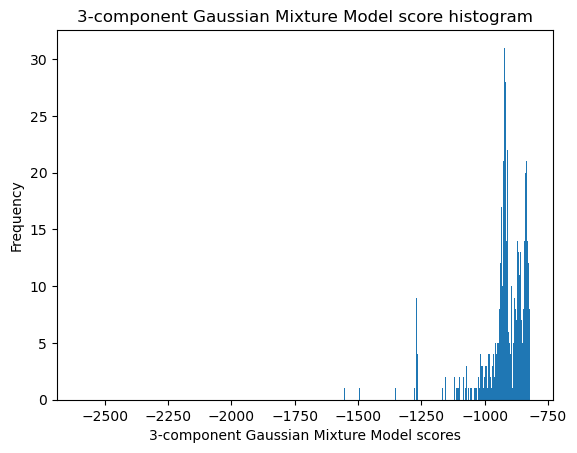

In [27]:
k = 3

scores = plot_hist_gmm(ho_t01, k, covariance_type='spherical',
                       bins=1_000)
# for i in np.arange(-400, -19, 20):
#     plot_gmm(ho_t01, k, scores, i)

#### 4-component GMM
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


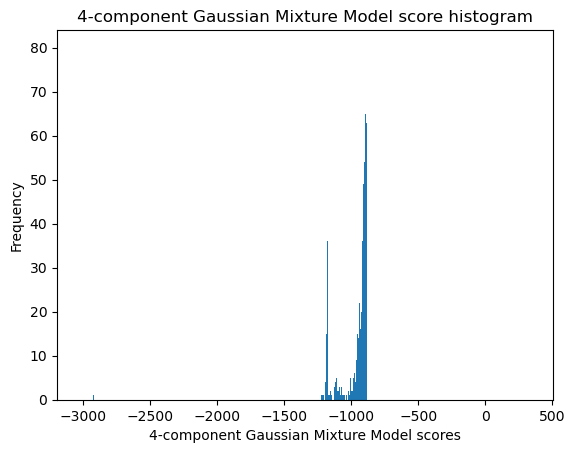

In [28]:
k = 4

scores = plot_hist_gmm(ho_t01, k, covariance_type='spherical',
                       bins=1_000)
# for i in np.arange(-400, 1, 20):
#     plot_gmm(ho_t01, k, scores, i)

#### 5-component GMM
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.
  warnings.warn(


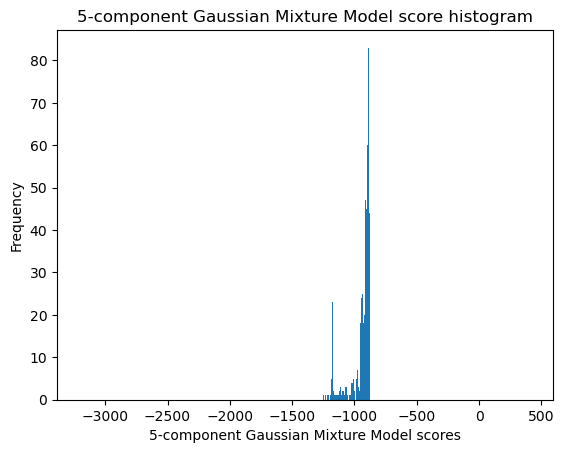

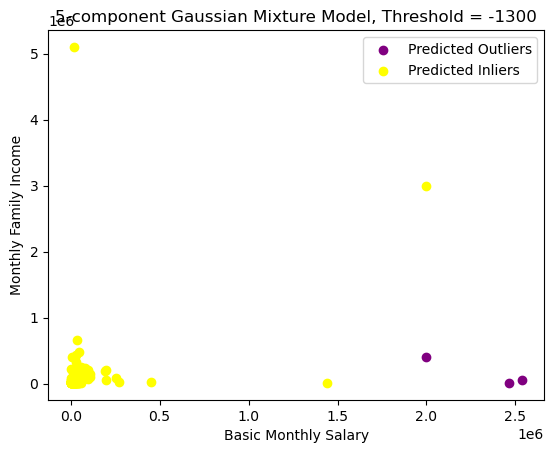

Number of predicted outliers: 3


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True


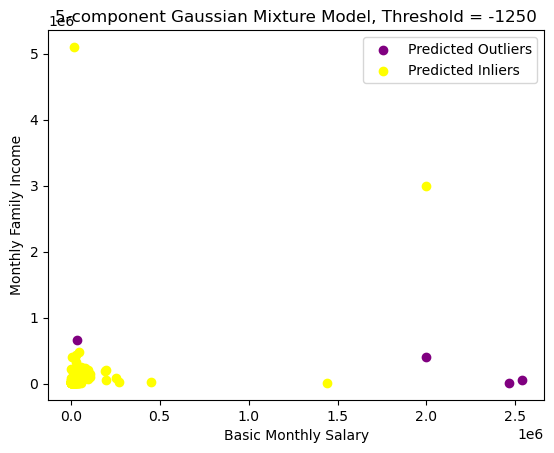

Number of predicted outliers: 4


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True


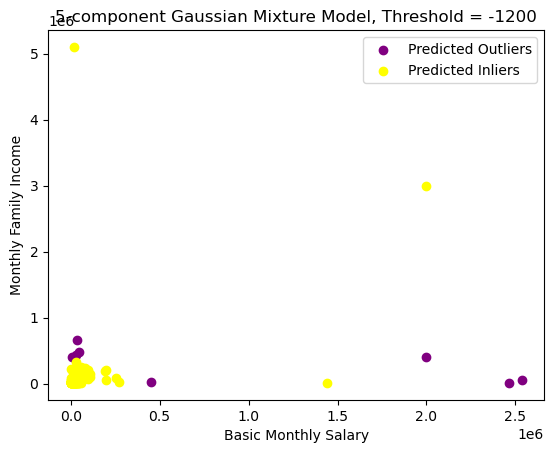

Number of predicted outliers: 10


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
380,11395,"SAGURAN, JESSIE",46,47777,3,1,2,480000.0,5000,1500,1000,2000,0,0,0,0,0,0,1000,0,600,700,7000,1500,1500,1000,1000,500,1000,500,1000,0,2500,0,0,8000,0,0,0,0,1000,5000,0,1,0,1,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
568,11684,"DE FIESTA, ALBERT",46,9490,2,0,0,400000.0,5000,1000,1000,0,0,500,0,0,0,0,1000,0,360,700,4000,0,0,0,0,100,0,50,1500,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,True
762,11995,"REMON, JAYTEE",29,28000,3,3,4,430000.0,3000,500,500,0,0,0,0,0,0,0,2000,0,300,1000,0,0,0,500,0,200,500,0,0,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
830,12114,"PANAGUITON, JHON ANTHONY",35,450000,3,2,4,25000.0,2500,600,800,1000,0,0,0,1000,800,0,0,0,585,2000,3000,500,0,500,800,200,800,500,1500,0,0,0,0,0,0,0,0,0,0,15000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0

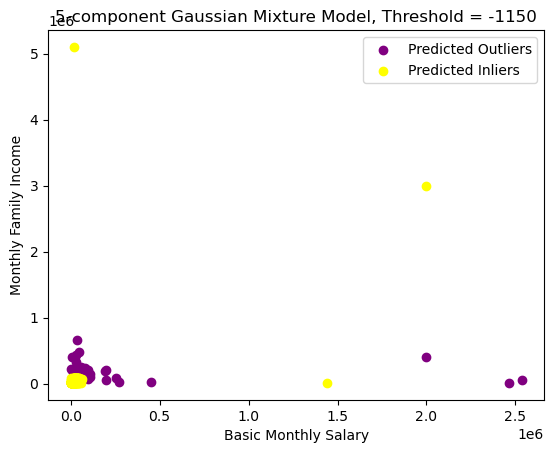

Number of predicted outliers: 133


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
8,3979,"QUIATCHON, MILA",29,58000,3,2,4,100000.0,5000,800,800,0,0,3000,0,0,0,0,0,0,500,3000,0,0,0,0,0,0,500,0,1000,0,0,0,0,4150,0,0,0,0,0,10000,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
31,9083,"BRUCE, MARIO",42,35338,2,2,5,85000.0,5000,1000,1000,200,0,0,500,1000,1000,500,0,0,200,600,0,0,0,0,0,100,0,100,0,0,0,0,0,0,0,0,0,0,0,20000,0,0,0,0,0,1,0,0,1,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1046,12817,"MINGUITO, LANI",32,20000,2,4,4,40000.0,10500,1500,2000,2000,500,1000,10000,2500,700,500,2000,500,600,700,400030,500,0,0,0,0,0,400,0,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,True
1052,12824,"ENAGE, ELMER",39,30000,2,0,0,100000.0,5000,500,0,0,0,1500,0,0,0,0,0,0,0,0,0,0,0,500,0,200,1000,100,300,0,0

In [29]:
k = 5

scores = plot_hist_gmm(ho_t01, k, covariance_type='spherical',
                       bins=1_000)
for i in np.arange(-1300, -1149, 50):
    plot_gmm(ho_t01, k, scores, i)

### Local Outlier Factor

#### 10-neighbor LOF
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

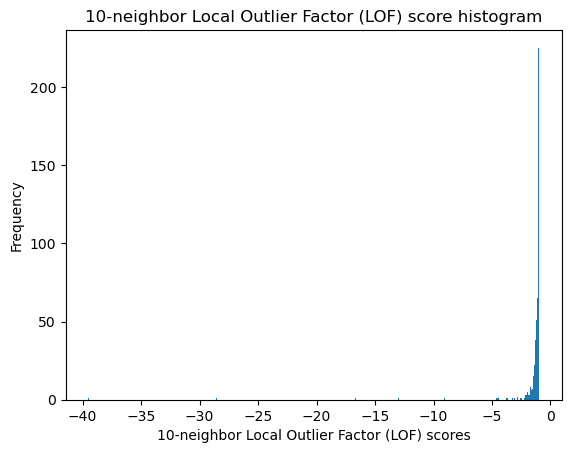

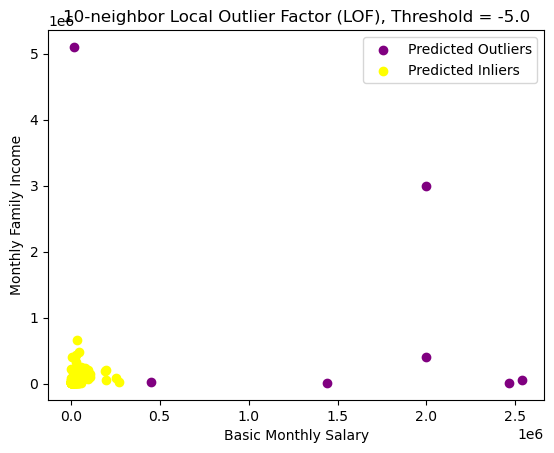

Number of predicted outliers: 15


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
584,11705,"VALENZUELA, RACHEL",30,2000000,2,2,4,3000000.0,1000,500,1000,30,0,0,0,1000,0,0,0,0,300,500,0,0,0,0,0,0,0,200,0,0,0,0,0,0,0,0,0,0,0,1500,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
621,11764,"ELALTO JR., EUGENIO",42,12400,3,2,4,100000.0,15000,1500,1500,1000,1,1,80000,6000,1500,1,1000,500,300,2000,1,1,1,1500,1500,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0

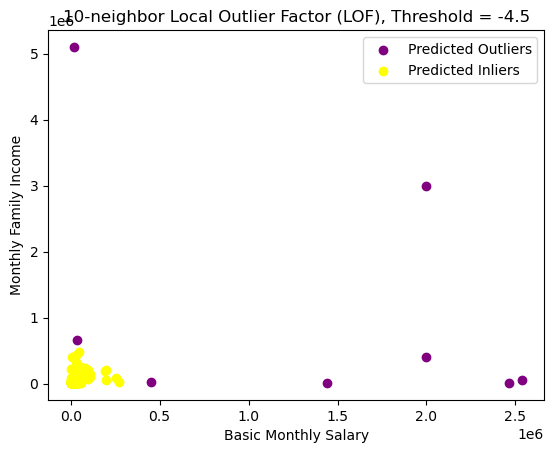

Number of predicted outliers: 19


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
419,11450,"SADDI, RUBILYN",40,1800,3,0,0,10000.0,1000,500,300,200,200,200,100,100,25,2,500,500,300,700,3500,2000,12345,12345,300,12345,153,50,100,12345,12345,12345,12345,12345,12345,12345,12345,12345,12345,10000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,

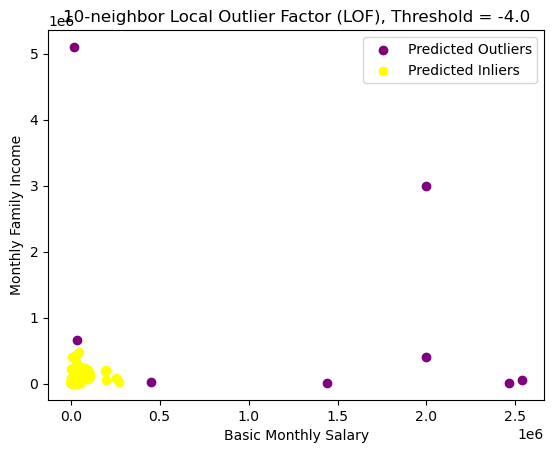

Number of predicted outliers: 20


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
419,11450,"SADDI, RUBILYN",40,1800,3,0,0,10000.0,1000,500,300,200,200,200,100,100,25,2,500,500,300,700,3500,2000,12345,12345,300,12345,153,50,100,12345,12345,12345,12345,12345,12345,12345,12345,12345,12345,10000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,

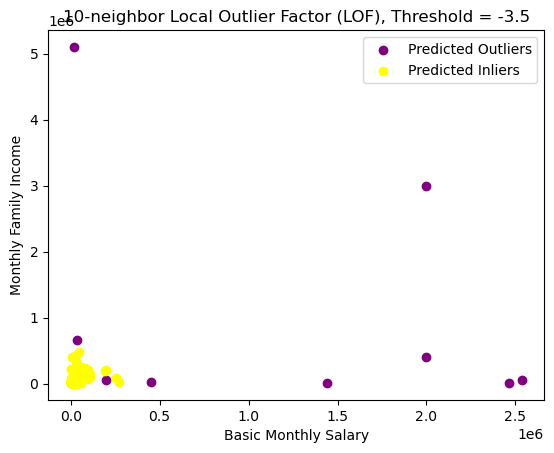

Number of predicted outliers: 23


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

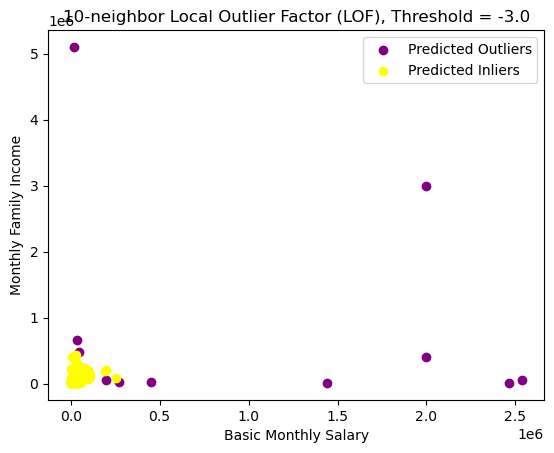

Number of predicted outliers: 27


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
377,11388,"EROLES, SONNY BOY",42,40000,3,1,5,40000.0,6300,1000,2000,1000,1500,2000,1000,2400,1000,1000,5000,800,120,1200,2000,2000,1000,1000,1000,160,5000,500,800,8200,4000,27000,10000,10000,8,200,20,20,100,1000,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,True
380,11395,"SAGURAN, JESSIE",46,47777,3,1,2,480000.0,5000,1500,1000,2000,0,0,0,0,0,0,1000,0,600,700,7000,1500,1500,1000,1000,500,1000,500,1000,0,2500,0,0,8000,0,0,0,0,1000,5000,0,1,0,1,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [30]:
k = 10

scores = plot_hist_lof(ho_t01, n_neighbors=k,
                       bins=1_000)
for i in np.arange(-5, -2.5, 0.5):
    plot_lof(ho_t01, k, scores, i)

#### 20-neighbor LOF (default setting)
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

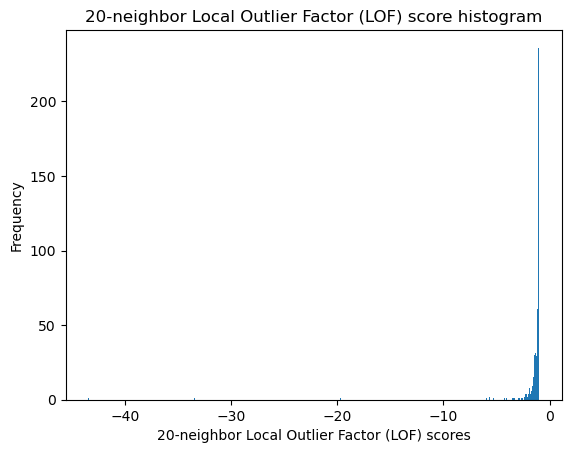

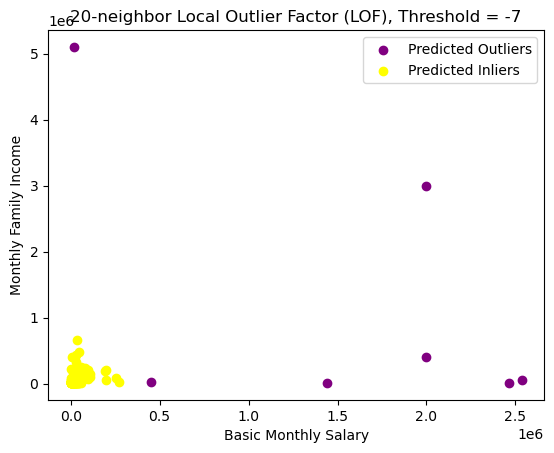

Number of predicted outliers: 12


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
584,11705,"VALENZUELA, RACHEL",30,2000000,2,2,4,3000000.0,1000,500,1000,30,0,0,0,1000,0,0,0,0,300,500,0,0,0,0,0,0,0,200,0,0,0,0,0,0,0,0,0,0,0,1500,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
677,11863,"DANGANI, SHARON",36,37000,3,5,5,20000.0,20,50,120,12,20,100,5000,100,120,100,100,100,500,600,500,1000,80,150,200,50,100,60,100,200000,2000,2699,200,200,50,50,50,60,90,500,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
773,12020,"TONOG, CRISTINA",33,23000,2,3,4,20000.0,5000,2000,3000,4000,0,0,180000,5000,1000,0,15000,3000,500,2000,4500,0,0,1000,1000,500,300,500,0,0,0,0,0,400,0,0,0,0,0,30000,0,1,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0

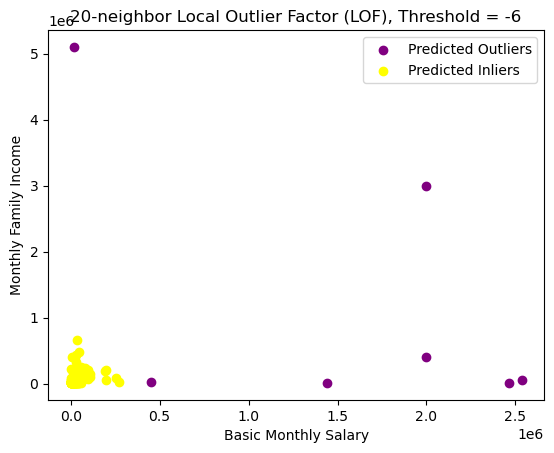

Number of predicted outliers: 13


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
584,11705,"VALENZUELA, RACHEL",30,2000000,2,2,4,3000000.0,1000,500,1000,30,0,0,0,1000,0,0,0,0,300,500,0,0,0,0,0,0,0,200,0,0,0,0,0,0,0,0,0,0,0,1500,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
677,11863,"DANGANI, SHARON",36,37000,3,5,5,20000.0,20,50,120,12,20,100,5000,100,120,100,100,100,500,600,500,1000,80,150,200,50,100,60,100,200000,2000,2699,200,200,50,50,50,60,90,500,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
733,11950,"MARAYAG, KING ROBERT",32,31000,3,0,6,40000.0,80000,2000,2000,500,0,2500,1300,1000,800,1000,3000,1000,800,2500,0,0,0,1000,500,500,500,300,1299,0,0,0,0,0,0,0,0,0,0,3000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

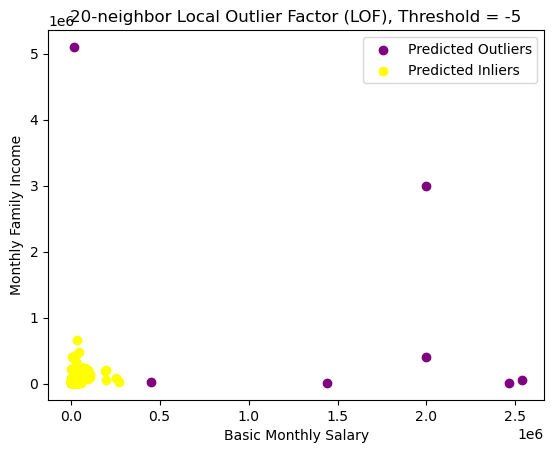

Number of predicted outliers: 17


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
419,11450,"SADDI, RUBILYN",40,1800,3,0,0,10000.0,1000,500,300,200,200,200,100,100,25,2,500,500,300,700,3500,2000,12345,12345,300,12345,153,50,100,12345,12345,12345,12345,12345,12345,12345,12345,12345,12345,10000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,True
584,11705,"VALENZUELA, RACHEL",30,2000000,2,2,4,3000000.0,1000,500,1000,30,0,0,0,1000,0,0,0,0,300,500,0,0,0,0,0,0,0,200,0,0,0,0,0,0,0,0,0,0,0,1500,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,

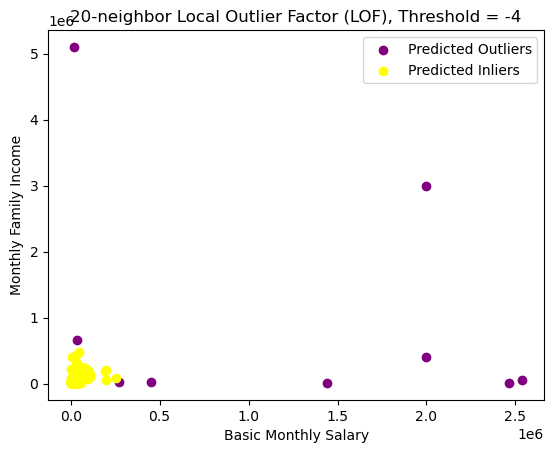

Number of predicted outliers: 24


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
419,11450,"SADDI, RUBILYN",40,1800,3,0,0,10000.0,1000,500,300,200,200,200,100,100,25,2,500,500,300,700,3500,2000,12345,12345,300,12345,153,50,100,12345,12345,12345,12345,12345,12345,12345,12345,12345,12345,10000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,

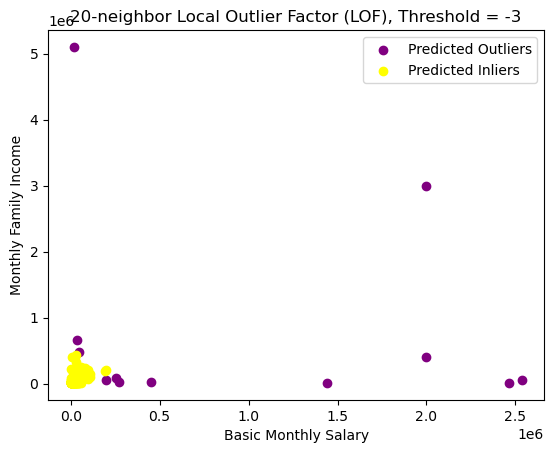

Number of predicted outliers: 33


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
325,

In [31]:
k = 20

scores = plot_hist_lof(ho_t01, n_neighbors=k,
                       bins=1_000)
for i in np.arange(-7, -2, 1):
    plot_lof(ho_t01, k, scores, i)

#### 30-neighbor LOF
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

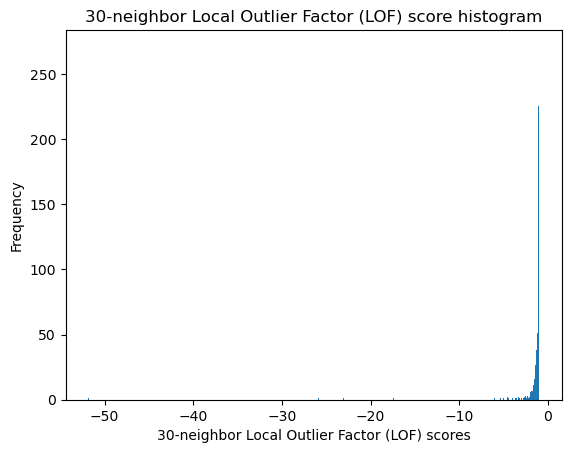

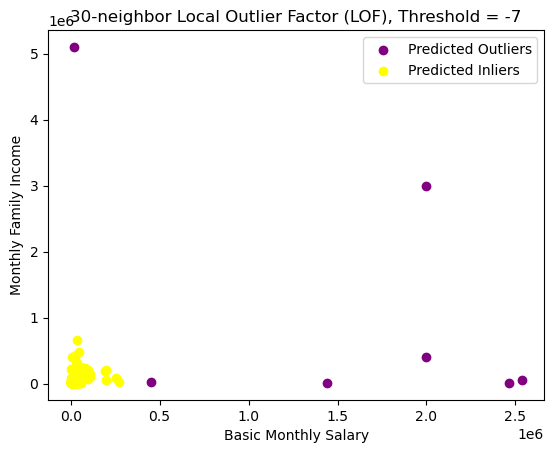

Number of predicted outliers: 12


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
584,11705,"VALENZUELA, RACHEL",30,2000000,2,2,4,3000000.0,1000,500,1000,30,0,0,0,1000,0,0,0,0,300,500,0,0,0,0,0,0,0,200,0,0,0,0,0,0,0,0,0,0,0,1500,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
677,11863,"DANGANI, SHARON",36,37000,3,5,5,20000.0,20,50,120,12,20,100,5000,100,120,100,100,100,500,600,500,1000,80,150,200,50,100,60,100,200000,2000,2699,200,200,50,50,50,60,90,500,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
773,12020,"TONOG, CRISTINA",33,23000,2,3,4,20000.0,5000,2000,3000,4000,0,0,180000,5000,1000,0,15000,3000,500,2000,4500,0,0,1000,1000,500,300,500,0,0,0,0,0,400,0,0,0,0,0,30000,0,1,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0

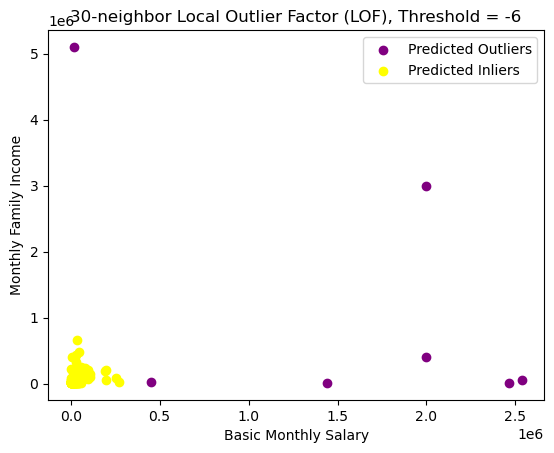

Number of predicted outliers: 15


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
584,11705,"VALENZUELA, RACHEL",30,2000000,2,2,4,3000000.0,1000,500,1000,30,0,0,0,1000,0,0,0,0,300,500,0,0,0,0,0,0,0,200,0,0,0,0,0,0,0,0,0,0,0,1500,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
643,11801,"TEE, HAZEL DOMINIQUE",30,23000,1,1,10,23000.0,10000,5000,2000,2000,0,0,50000,0,2400,0,0,2000,500,1500,5000,1000,1000,3000,2000,500,1000,3000,1500,0,0,50000,0,0,0,0,0,0,0,3000,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
671,11850,"ADLAWON, GERALDINE",32,30000,3,0,2,50000.0,3000,2000,2000,1000,0,0,0,0,0,0,5000,3000,1200,2000,0,1000,0,2000,1000,500,1000,250,1300,0,0,0,0,100000,0,0,0,0,0,10000,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,

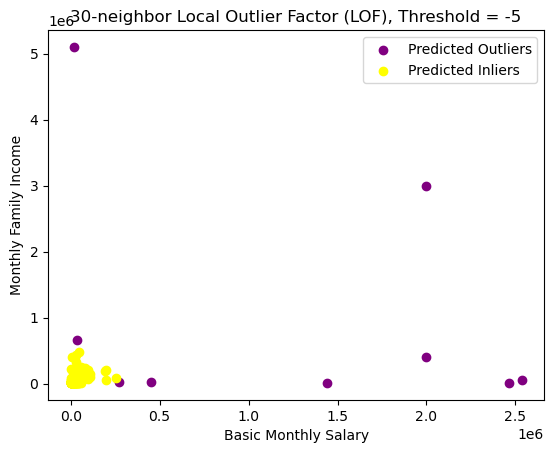

Number of predicted outliers: 21


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
419,11450,"SADDI, RU

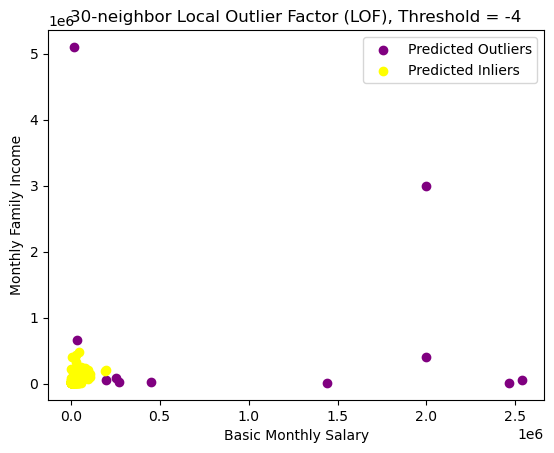

Number of predicted outliers: 26


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
325,

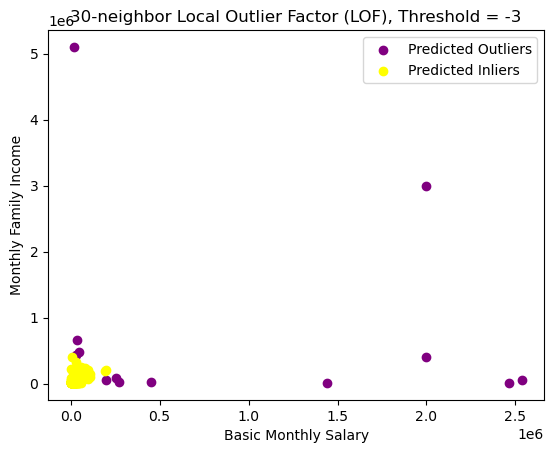

Number of predicted outliers: 37


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
325,

In [32]:
k = 30

scores = plot_hist_lof(ho_t01, n_neighbors=k,
                       bins=1_000)
for i in np.arange(-7, -2, 1):
    plot_lof(ho_t01, k, scores, i)

#### 40-neighbor LOF
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

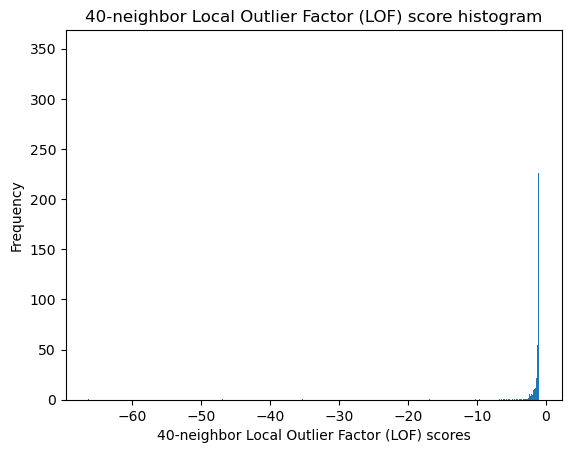

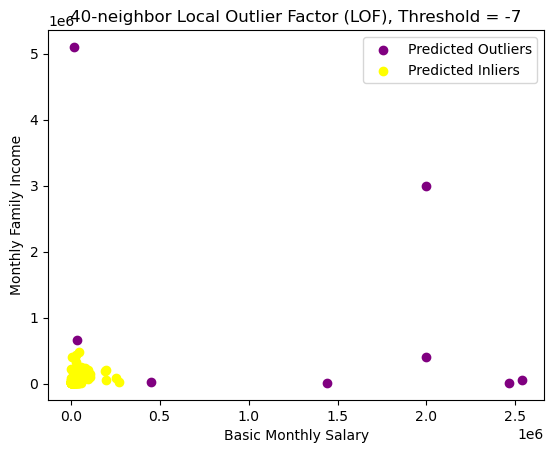

Number of predicted outliers: 13


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
584,11705,"VALENZUELA, RACHEL",30,2000000,2,2,4,3000000.0,1000,500,1000,30,0,0,0,1000,0,0,0,0,300,500,0,0,0,0,0,0,0,200,0,0,0,0,0,0,0,0,0,0,0,1500,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
677,11863,"DANGANI, SHARON",36,37000,3,5,5,20000.0,20,50,120,12,20,100,5000,100,120,100,100,100,500,600,500,1000,80,150,200,50,100,60,100,200000,2000,2699,200,200,50,50,50,60,90,500,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1

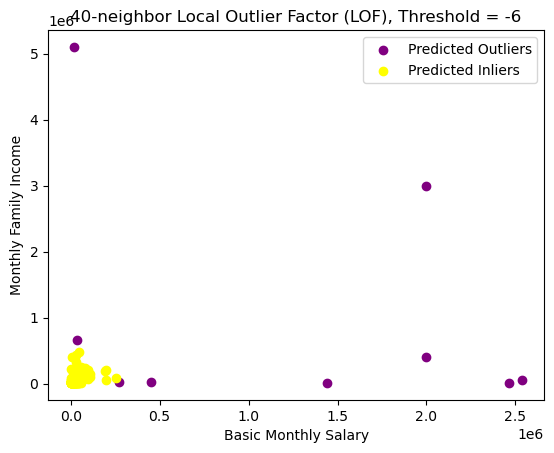

Number of predicted outliers: 18


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
435,11471,"TESALONA, CYRUS",25,26000,2,0,3,40000.0,5000,0,200,0,0,1500,0,0,0,0,0,0,350,500,0,0,0,0,0,0,1000,500,1000,0,0,0,0,0,0,0,0,0,0,200000,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,True
584,11705,"VALENZUELA, RACHEL",30,2000000,2,2,4,3000000.0,1000,500,1000,30,0,0,0,1000,0,0,0,0,300,500,0,0,0,0,0,0,0,200,0,0,0,0,0,0,0,0,0,0,0,1500,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
608,11744,"MARTINEZ, NOREL",28,2

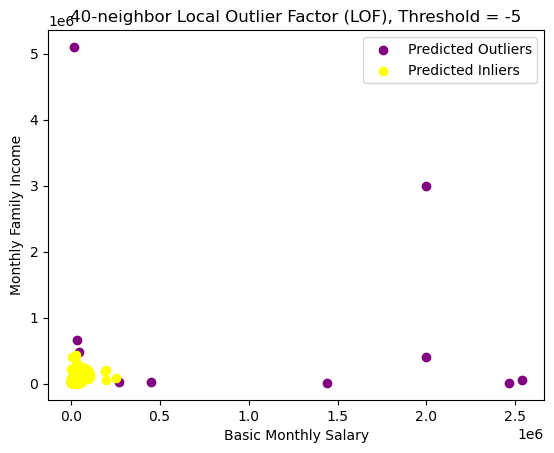

Number of predicted outliers: 23


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
380,11395,"SAGURAN, JESSIE",46,47777,3,1,2,480000.0,5000,1500,1000,2000,0,0,0,0,0,0,1000,0,600,700,7000,1500,1500,1000,1000,500,1000,500,1000,0,2500,0,0,8000,0,0,0,0,1000,5000,0,1,0,1,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
391,11411,"ORTEGA, MERRIAM",4

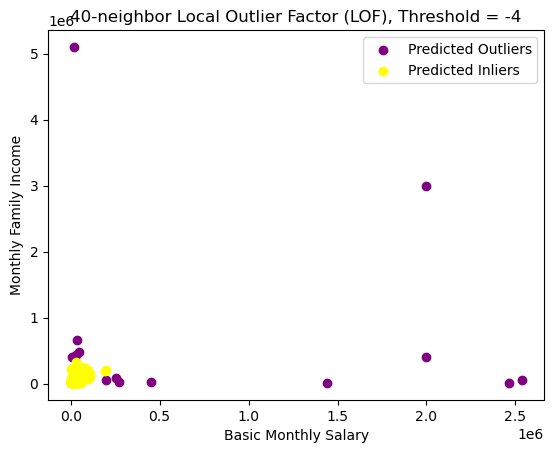

Number of predicted outliers: 29


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
325,

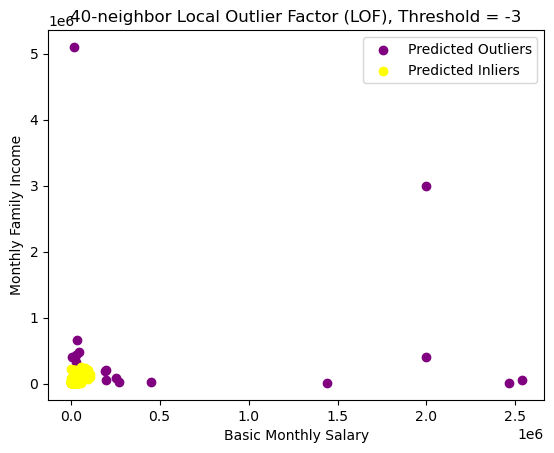

Number of predicted outliers: 46


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
41,9717,"LIMBO, JOHN ORVILLE",40,50000,2,4,3,50000.0,5000,2000,1000,1000,500,2000,0,0,0,0,10000,10000,500,1500,0,2000,0,1000,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,0,100000,1,0,0,0,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
46,9850,"MALAPOTE, AILYN",37,23800,1,4,3,50000.0,1000,1000,1000,0,0,0,0,0,0,0,2000,1000,0,0,0,0,240,500,500,700,0,500,0,0,50000,0,0,0,0,0,0,0,0,15000,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
82,10531,"MELENDREZ, SALOME",53,60000,3,2,2,60000.0,10000,5000,5000,0,0,5000,0,0,0,0,10000,2000,500,2000,0,1000,0,5000,2000,2000,5000,500,2000,0,0,0,0,0,0,0,0,0,0,100000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
184,10724,"GARCIA, GLENDA",34,16000,2,0,3,50000.0,2000,200,100,120,20,50,200,20,300,100,1000,200,450,600,2678,100,200,200,400,200,300,90,50,0,0,0,0,0,0,0,0,0,0,100000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0

In [33]:
k = 40

scores = plot_hist_lof(ho_t01, n_neighbors=k,
                       bins=1_000)
for i in np.arange(-7, -2, 1):
    plot_lof(ho_t01, k, scores, i)

### One-Class SVM

#### RBF-kernel SVM (default setting)
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

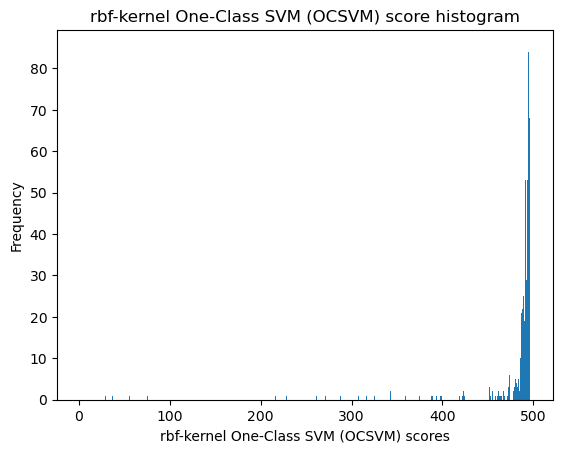

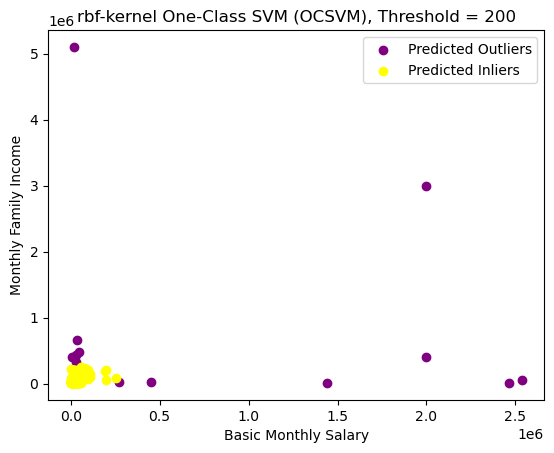

Number of predicted outliers: 15


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
380,11395,"SAGURAN, JESSIE",46,47777,3,1,2,480000.0,5000,1500,1000,2000,0,0,0,0,0,0,1000,0,600,700,7000,1500,1500,1000,1000,500,1000,500,1000,0,2500,0,0,8000,0,0,0,0,1000,5000,0,1,0,1,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
568,11684,"DE FIESTA, ALBERT",46,9490,2,0,0,400000.0,5000,1000,1000,0,0,500,0,0,0,0,1000,0,360,700,4000,0,0,0,0,100,0,50,1500,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,True
584,11705,"VALENZUELA, RACHEL",30,2000000,2,2,4,3000000.0,1000,500,1000,30,0,0,0,1000,0,0,0,0,300,500,0,0,0,0,0,0,0,200,0,0,0,0,0,0,0,0,0,0,0,1500,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,

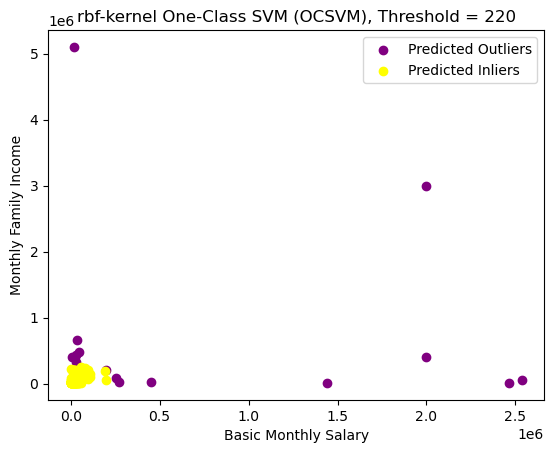

Number of predicted outliers: 17


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
325,11304,"NOROMOR, ABNER",47,257250,3,0,0,80000.0,10000,5000,4000,1500,1000,4000,5000,1500,1000,1500,2000,1500,1000,5000,0,2500,0,1500,2000,1500,1500,500,500,0,0,0,0,1500,0,1000,0,0,0,10000,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,True
380,11395,"SAGURAN, JESSIE",46,47777,3,1,2,480000.0,5000,1500,1000,2000,0,0,0,0,0,0,1000,0,600,700,7000,1500,1500,1000,1000,500,1000,500,1000,0,2500,0,0,8000,0,0,0,0,1000,5000,0,1,0,1,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

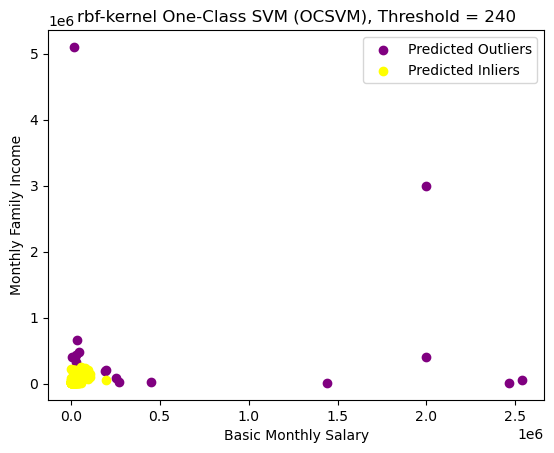

Number of predicted outliers: 18


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
325,11304,"NOROMOR, ABNER",47,257250,3,0,0,80000.0,10000,5000,4000,1500,1000,4000,5000,1500,1000,1500,2000,1500,1000,5000,0,2500,0,1500,2000,1500,1500,500,500,0,0,0,0,1500,0,1000,0,0,0,10000,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,True
380,11395,"SAGURAN, JESSIE",46,47777,3,1,2,480000.0,5000,1500,1000,2000,0,0,0,0,0,0,1000,0,600,700,7000,1500,1500,1000,1000,500,1000,500,1000,0,2500,0,0,8000,0,0,0,0,1000,5000,0,1,0,1,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
417,11443,"NERVIDA, REYNER",37,2464625,2,2,10,16000.0,3000,2000,1000,200,0,0,0,500,1000,0,200,200,300,1100,6000,0,0,0,0,120,200,400,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

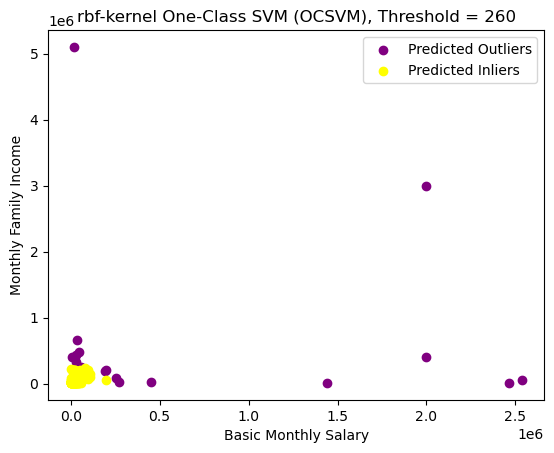

Number of predicted outliers: 20


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
325,11304,"NOROMOR, ABNER",47,257250,3,0,0,80000.0,10000,5000,4000,1500,1000,4000,5000,1500,1000,1500,2000,1500,1000,5000,0,2500,0,1500,2000,1500,1500,500,500,0,0,0,0,1500,0,1000,0,0,0,10000,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,True
380,11395,"SAGURAN, JESSIE",46,47777,3,1,2,480000.0,5000,1500,1000,2000,0,0,0,0,0,0,1000,0,600,700,7000,1500,1500,1000,1000,500,1000,500,1000,0,2500,0,0,8000,0,0,0,0,1000,5000,0,1,0,1,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,1000,3000,5000,2000,1000,3000,2000,1000,1000,2000,8000,500,0,1500,3000,500,5000,300,300,0,0,0,0,0,0,200,0,0,0,1000000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
405,11430,"CLAROS, BELEJUN",28,60000,3,5,8,250000.0,15000,2000,600,1500,300,1500,0,0,0,0,3000,1000,500,1500,8000,0,0,1000,1000,300,1000,300,1500,0,0,0,0,0,300,1000,0,0,0,15000,1,0,0,0,0,0,0,0,1,1,0,0,1,1,0,1,0,0,0,0,0,

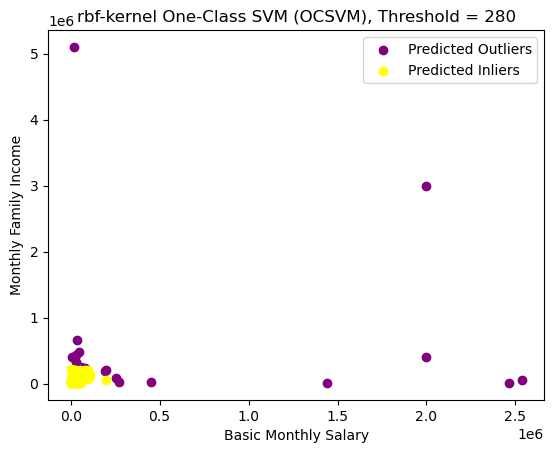

Number of predicted outliers: 24


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
253,11201,"ABALOS, GLYNN",36,80000,3,2,2,230000.0,13000,2000,1000,3640,0,0,0,0,0,0,0,0,2275,3900,57200,0,0,3000,0,0,0,1300,1625,0,0,0,0,0,0,0,0,0,0,50000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
325,11304,"NOROMOR, ABNER",47,257250,3,0,0,80000.0,10000,5000,4000,1500,1000,4000,5000,1500,1000,1500,2000,1500,1000,5000,0,2500,0,1500,2000,1500,1500,500,500,0,0,0,0,1500,0,1000,0,0,0,10000,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,

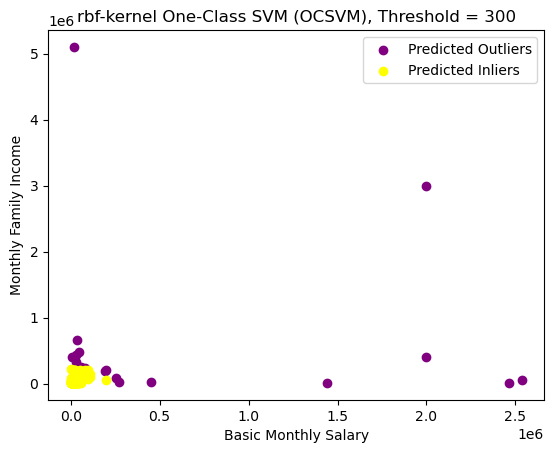

Number of predicted outliers: 25


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
253,11201,"ABALOS, GLYNN",36,80000,3,2,2,230000.0,13000,2000,1000,3640,0,0,0,0,0,0,0,0,2275,3900,57200,0,0,3000,0,0,0,1300,1625,0,0,0,0,0,0,0,0,0,0,50000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,True
325,11304,"NOROMOR, ABNER",47,257250,3,0,0,80000.0,10000,5000,4000,1500,1000,4000,5000,1500,1000,1500,2000,1500,1000,5000,0,2500,0,1500,2000,1500,1500,500,500,0,0,0,0,1500,0,1000,0,0,0,10000,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,

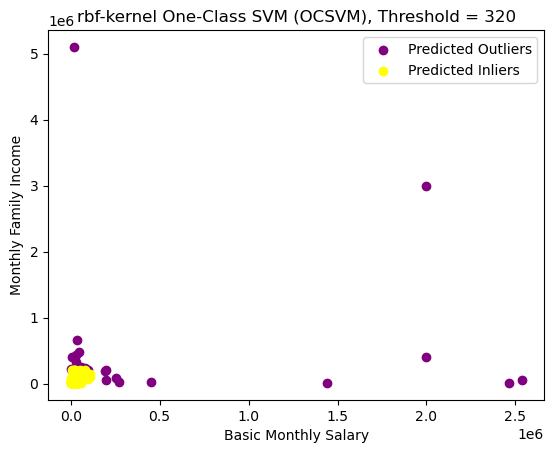

Number of predicted outliers: 28


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
253,11201,"ABALOS, GLYNN",36,80000,3,2,2,230000.0,13000,2000,1000,3640,0,0,0,0,0,0,0,0,2275,3900,57200,0,0,3000,0,0,0,1300,1625,0,0,0,0,0,0,0,0,0,0,50000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
299,11265,"FERRER, JUDY ANN",29,18499,2,6,8,5100000.0,3000,500,500,300,500,1000,0,500,0,0,1000,300,300,1500,500,0,0,0,0,200,500,300,0,0,0,0,0,800,0,0,0,0,0,3000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
323,11301,"NEVAREZ, SYRA MAW",27,37000,3,2,4,667000.0,2000,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,500,500,0,0,8,0,0,0,998,0,0,0,0,0,20000,0,0,1,0,1,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

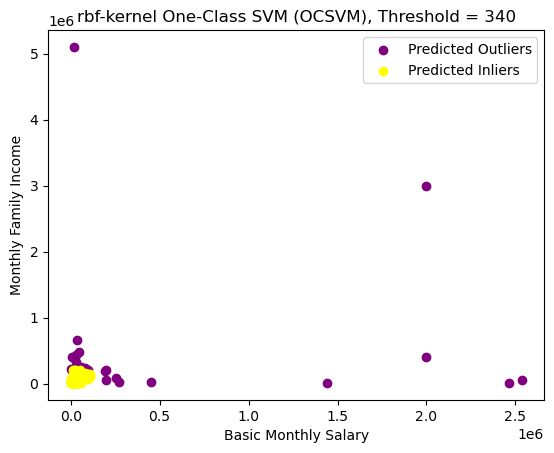

Number of predicted outliers: 33


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
162,10679,"GONEZ, JAMES",25,80000,3,2,3,203000.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
253,11201,"ABALOS, GLYNN",36,80000,3,2,2,230000.0,13000,2000,1000,3640,0,0,0,0,0,0,0,0,2275,3900,57200,0,0,3000,0,0,0,1300,1625,0,0,0,0,0,0,0,0,0,0,50000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
299,11265,"FE

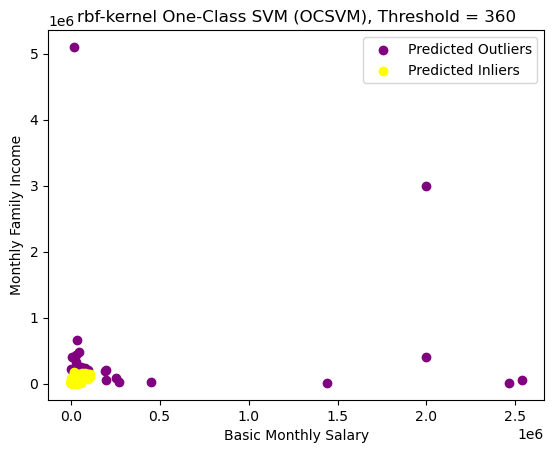

Number of predicted outliers: 38


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
114,10596,"ALERE, DINOS",40,19000,1,0,0,190000.0,1,3,4,3,1,1,1,2,2,1,4,4,5,5,4500,2,6,6,6,6,6,8,2,8,8,8,8,6,9,9,9,9,9,10,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
162,10679,"GONEZ, JAMES",25,80000,3,2,3,203000.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
231,11170,"SANTOR,

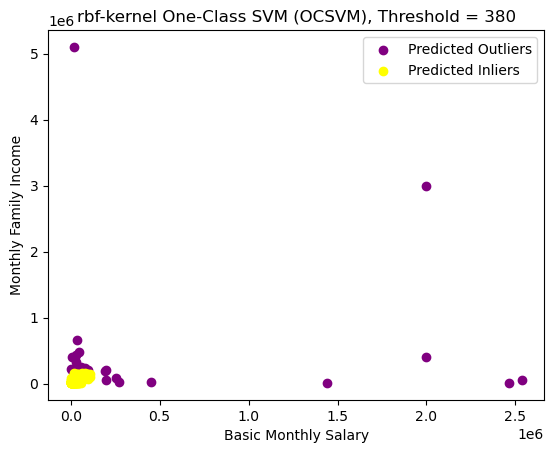

Number of predicted outliers: 39


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
114,10596,"ALERE, DINOS",40,19000,1,0,0,190000.0,1,3,4,3,1,1,1,2,2,1,4,4,5,5,4500,2,6,6,6,6,6,8,2,8,8,8,8,6,9,9,9,9,9,10,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
161,10678,"BALLECER, DINO",37,18000,2,1,3,177000.0,25000,5000,3000,5000,0,0,13000,0,0,3000,4000,2000,200,4500,10500,1000,0,2000,2000,1500,1000,1000,599,0,0,0,0,1700,0,0,0,0,0,20000,1,1,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
162,10679,"GONEZ, JAMES",25,80000,3,2,3,203000.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
20

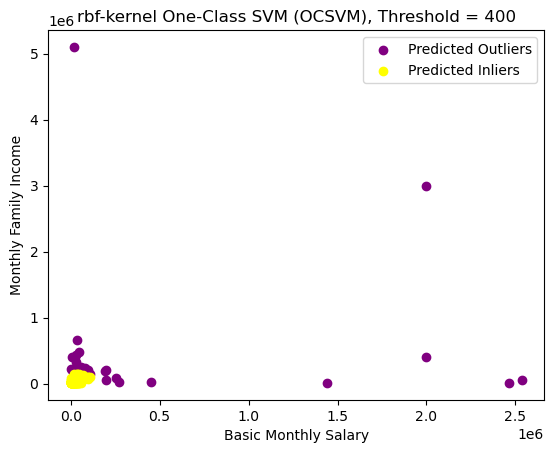

Number of predicted outliers: 45


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
114,10596,"ALERE, DINOS",40,19000,1,0,0,190000.0,1,3,4,3,1,1,1,2,2,1,4,4,5,5,4500,2,6,6,6,6,6,8,2,8,8,8,8,6,9,9,9,9,9,10,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
126,10618,"CALDERON, JESSICA",29,80000,3,2,4,160000.0,4000,1000,500,500,100,100,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
161,10678,"BALLECER, DINO",37,18000,2,1,3,177000.0,25000,5000,3000,5000,0,0,13000,0,0,3000,4000,2000,200,4500,10500,1000,0,2000,2000,1500,1000,1000,599,0,0,0,0,1700,0,0,0,0,0,20000,1,1,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

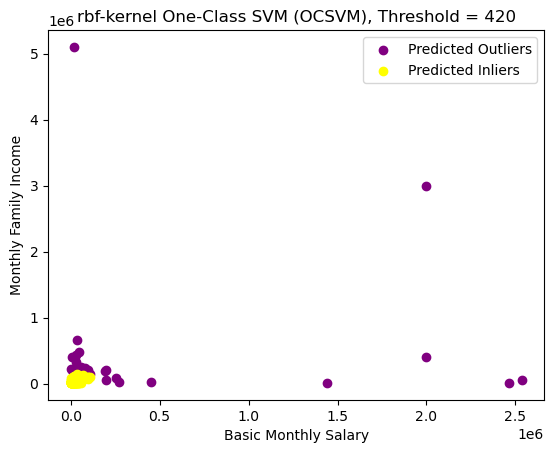

Number of predicted outliers: 48


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
114,10596,"ALERE, DINOS",40,19000,1,0,0,190000.0,1,3,4,3,1,1,1,2,2,1,4,4,5,5,4500,2,6,6,6,6,6,8,2,8,8,8,8,6,9,9,9,9,9,10,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
126,10618,"CALDERON, JESSICA",29,80000,3,2,4,160000.0,4000,1000,500,500,100,100,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,True
161,10678,"BALLECER, DINO",37,18000,2,1,3,177000.0,25000,5000,3000,5000,0,0,13000,0,0,3000,4000,2000,200,4500,10500,1000,0,2000,2000,1500,1000,1000,599,0,0,0,0,1700,0,0,0,0,0,20000,1,1,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

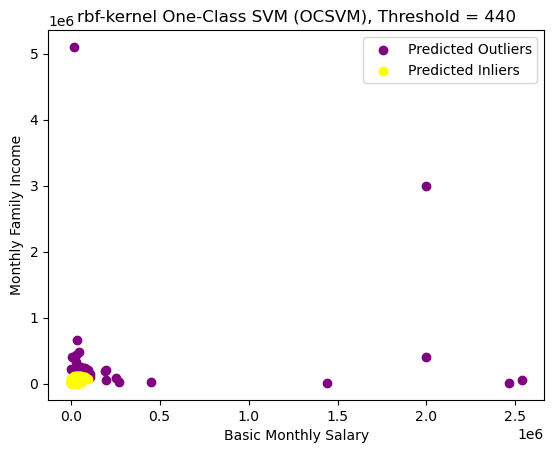

Number of predicted outliers: 58


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
41,9717,"LIMBO, JOHN ORVILLE",40,50000,2,4,3,50000.0,5000,2000,1000,1000,500,2000,0,0,0,0,10000,10000,500,1500,0,2000,0,1000,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,0,100000,1,0,0,0,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
82,10531,"MELENDREZ, SALOME",53,60000,3,2,2,60000.0,10000,5000,5000,0,0,5000,0,0,0,0,10000,2000,500,2000,0,1000,0,5000,2000,2000,5000,500,2000,0,0,0,0,0,0,0,0,0,0,100000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
93,10548,"MURHY, NIÑO",29,100000,2,2,2,100000.0,4500,1500,1500,3000,0,0,0,2500,0,0,5000,3000,500,1000,0,2000,0,1000,1000,500,3000,500,0,0,0,0,0,800,0,0,0,0,0,2000,0,1,1,1,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,

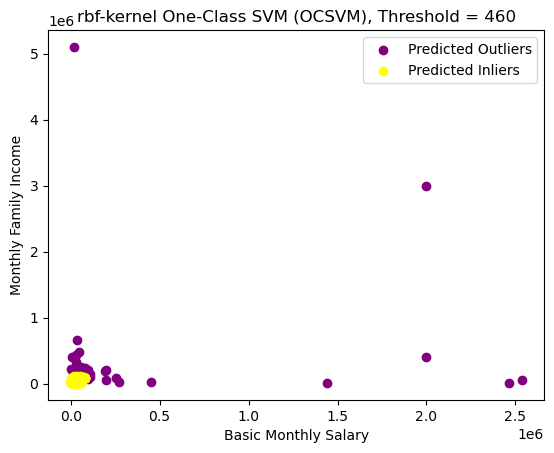

Number of predicted outliers: 71


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
41,9717,"LIMBO, JOHN ORVILLE",40,50000,2,4,3,50000.0,5000,2000,1000,1000,500,2000,0,0,0,0,10000,10000,500,1500,0,2000,0,1000,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,0,100000,1,0,0,0,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
984,12720,"LAXAMANA, JAY JEROME",34,61000,3,3,4,160000.0,10000,5000,5000,2000,0,0,0,0,0,0,3000,500,500,2500,0,0,500,2000,1000,1000,2000,200,2000,0,0,0,0,1000,0,0,0,0,0,5000,0,1,1,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
1009,12760,"SANGREO, JULIUS",36,1440452,2,1,4,14404.0,4000,1000,2000,1000,0,0,0,3

In [34]:
k = 'rbf'

scores = plot_hist_ocsvm(ho_t01, kernel=k,
                         bins=1_000)
for i in np.arange(200, 461, 20):
    plot_ocsvm(ho_t01, k, scores, i)

#### Linear-kernel SVM
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

In [35]:
# k = 'linear'

# scores = plot_hist_ocsvm(ho_t01, kernel=k,
#                          bins=1_000)
# for i in np.arange(1e13, -0.0001, 0.00005):
#     plot_ocsvm(ho_t01, k, scores, i)

#### 4th-order polynomial-kernel SVM (????)
<div class="alert alert-info">
    This doesn't work well.
</div>

In [36]:
# k = 'poly'

# scores = plot_hist_ocsvm(ho_t01, kernel=k,
#                          bins=1_000)
# for i in np.arange(2, 0.15, -0.125):
#     plot_ocsvm(ho_t01, k, scores, i)

#### Sigmoid-kernel SVM
<div class="alert alert-info">
    This method was not ultimately used because the set of predicted outliers included many seemingly valid data points. Show the histogram and the predicted outliers in the Appendix.
</div>

In [37]:
# k = 'sigmoid'

# scores = plot_hist_ocsvm(ho_t01, kernel=k,
#                          bins=1_000)
# for i in np.arange(-10, -2, 0.5):
#     plot_ocsvm(ho_t01, k, scores, i)

### Isolation Forest

#### 50-estimator IF

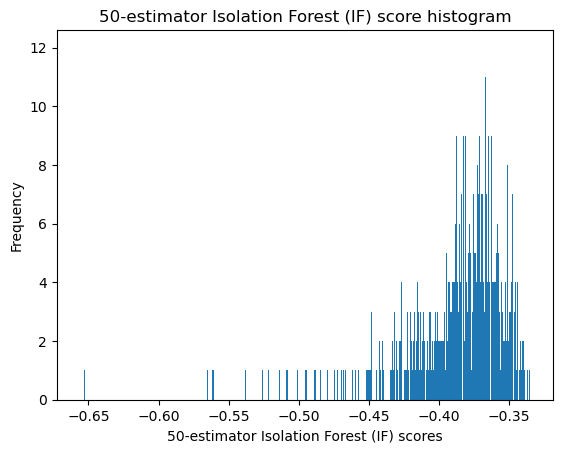

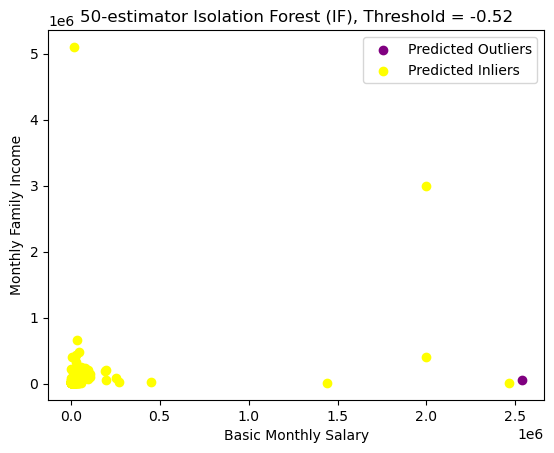

Number of predicted outliers: 12


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
79,10526,"PEREZ, JOHN RIGOR",26,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,1000,500,500,1000,0,0,4000,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
205,10856,"MAGLENTE, JELINA",28,20000,1,2,4,13000.0,6000,3000,1500,1000,500,500,5000,2000,1500,2000,7000,6000,1500,2000,4500,2000,500,500,500,1000,1000,2500,600,2500,100,500,500,500,600,100,1,1,1,500,1,0,1,1,1,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
333,11316,"CAJUSAY, OSCAR",31,21000,2,5,7,25000.0,3800,2200,2500,1000,500,1500,3500,1200,700,800,2000,1500,500,650,5000,3000,400,1300,1000,500,650,700,1500,4200,3,5000,5000,2000,500,500,500,500,500,6000,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,True
377,11388,"EROLES, SONNY BOY",42,40000,3,1,5,40000.0,6300,1000,2000,1000,1500,2000,1000,2400,1000,1000,5000,800,120,1200,2000,2000,1000,1000,1000,160,5000,500,800,8200,4000,27000,10000,10000,8,200,20,20,100,1000,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,True
396,11418,"OROSCO, HAZIEL",49,37000,3,3,7,37000.0,5000,1000,1000,2000,500,2000,5000,3000,1000,1500,5000,5000,800,800,2500,1500,500,2000,2000,500,2000,1000,1500,1000,1000,1000,1000,5000,500,500,500,500,100,5000,0,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
419,11450,"SADDI, RUBILYN",40,1800,3,0,0

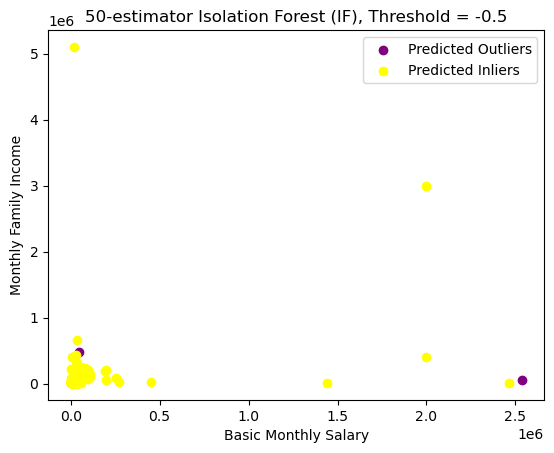

Number of predicted outliers: 20


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
79,10526,"PEREZ, JOHN RIGOR",26,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
82,10531,"MELENDREZ, SALOME",53,60000,3,2,2,60000.0,10000,5000,5000,0,0,5000,0,0,0,0,10000,2000,500,2000,0,1000,0,5000,2000,2000,5000,500,2000,0,0,0,0,0,0,0,0,0,0,100000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,1000,500,500,1000,0,0,4000,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
205,10856,"MAGLENTE, JELINA",28,20000,1,2,4,13000.0,6000,3000,1500,1000,500,500,5000,2000,1500,2000,7000,6000,1500,2000,4500,2000,500,500,500,1000,1000,2500,600,2500,100,500,500,500,600,100,1,1,1,500,1,0,1,1,1,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
333,11316,"CAJUSAY, OSCAR",31,21000,2,5,7,25000.0,3800,2200,2500,1000,500,1500,3500,1200,700,800,2000,1500,500,650,5000,3000,400,1300,1000,500,650,700,1500,4200,3,5000,5000,2000,500,500,500,500,500,6000,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,True
377,11388,"EROLES, SONNY BOY",42,40000,3,1,5,40000.0,6300,1000,2000,1000,1500,2000,1000,2400,1000,1000,5000,800,120,1200,

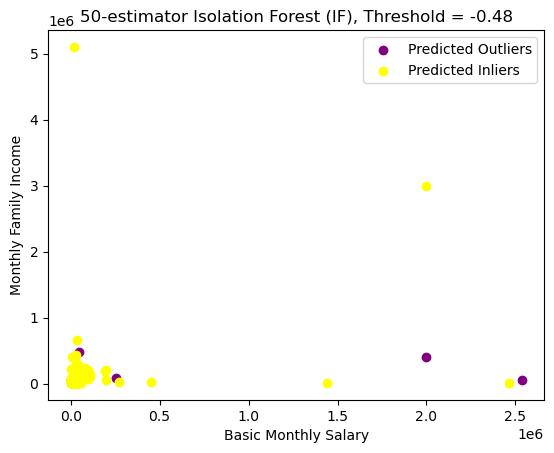

Number of predicted outliers: 30


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
79,10526,"PEREZ, JOHN RIGOR",26,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
82,10531,"MELENDREZ, SALOME",53,60000,3,2,2,60000.0,10000,5000,5000,0,0,5000,0,0,0,0,10000,2000,500,2000,0,1000,0,5000,2000,2000,5000,500,2000,0,0,0,0,0,0,0,0,0,0,100000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
161,10678,"BALLECER, DINO",37,18000,2,1,3,177000.0,25000,5000,3000,5000,0,0,13000,0,0,3000,4000,2000,200,4500,10500,1000,0,2000,2000,1500,1000,1000,599,0,0,0,0,1700,0,0,0,0,0,20000,1,1,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,1000,500,500,1000,0,0,4000,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
205,10856,"MAGLENTE, JELINA",28,20000,1,2,4,13000.0,6000,3000,1500,1000,500,500,5000,2000,1500,2000,7000,6000,1500,2000,4500,2000,500,500,500,1000,1000,2500,600,2500,100,500,500,500,600,100,1,1,1,500,1,0,1,1,1,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
292,11252,"MANA-AY, JOY",38,13000,2,3,6,40000.0,5000,2000,1000,3000,500,500,5000,2000,1000,1000,2000,1000,500,1000,3500,1000,1000,1000,500,500,

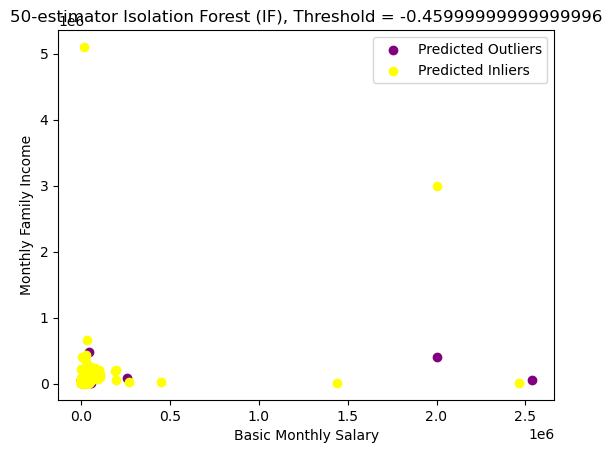

Number of predicted outliers: 48


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
23,8324,"QUINTO, MONCHITO",44,55000,3,1,4,60000.0,15000,5000,2000,2000,0,2500,2500,5000,200,1000,500,500,500,1000,3500,1000,0,1000,1000,500,1000,1000,0,0,0,0,10000,0,0,1000,0,0,500,5000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
41,9717,"LIMBO, JOHN ORVILLE",40,50000,2,4,3,50000.0,5000,2000,1000,1000,500,2000,0,0,0,0,10000,10000,500,1500,0,2000,0,1000,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,0,100000,1,0,0,0,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
57,10344,"AMARILLO, BERNADETH",40,50000,3,1,6,50000.0,10000,3000,2000,4000,0,0,1000,2000,1000,1000,2000,1000,1300,2500,0,2000,0,3000,2000,2000,2000,300,1000,0,0,0,0,0,0,0,0,0,0,5000,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
64,10438,"DIOMAMPO, LETICIA",50,35000,3,2,7,20000.0,3000,2000,2000,300,200,4000,17000,2000,1000,1000,5000,2000,1200,6000,0,2000,0,2000,2000,1000,200,400,1500,0,0,0,0,2900,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,True
79,10526,"PEREZ, JOHN RIGOR",26,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
82,10531,"MELENDREZ, SALOME",53,60000,3,2,2,60000.0,10000,5000,5000,0,0,5000,0,0,0,0,10000,2000,500,2000,0,1000,0,5000,2000,2000,5000,500,2000,0,0,0,0,0,0,0,0,0,0,100000,0,0,0,1,0,0

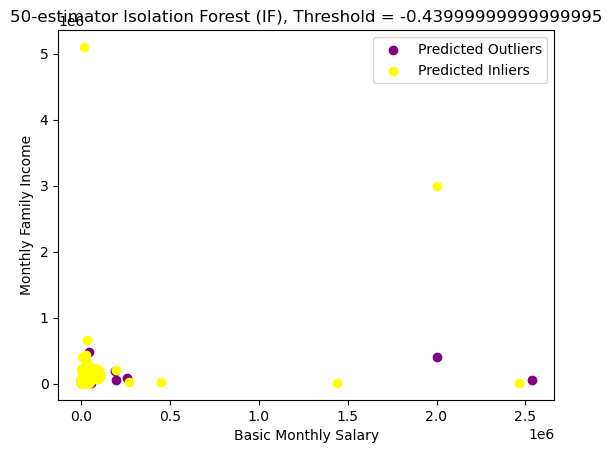

Number of predicted outliers: 86


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
17,7028,"AÑONUEVO, BONIFACIO",45,15000,1,3,8,25000.0,9000,5000,2000,500,0,0,1500,4800,2000,0,1000,1000,0,2000,0,1000,0,0,0,0,1000,0,1600,0,0,0,0,20000,0,0,0,0,0,6000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
23,8324,"QUINTO, MONCHITO",44,55000,3,1,4,60000.0,15000,5000,2000,2000,0,2500,2500,5000,200,1000,500,500,500,1000,3500,1000,0,1000,1000,500,1000,1000,0,0,0,0,10000,0,0,1000,0,0,500,5000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
984,12720,"LAXAMANA, JAY JEROME",34,61000,3,3,4,160000.0,10000,5000,5000,2000,0,0,0,0,0,0,3000,500,500,2500,0,0,500,2000,1000,1000,2000,200,2000,0,0,0,0,1000,0,0,0,0,0,5000,0,1,1,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
985,12721,"VAÑO, JONATHAN",45,25000,3,2,6,16900.0,500

In [38]:
k = 50

scores = plot_hist_if(ho_t01, n_estimators=k,
                      bins=1_000)
for i in np.arange(-0.52, -0.44, 0.02):
    plot_if(ho_t01, k, scores, i)

In [39]:
# ho_t01[ho_t01['basicMonthlySalary'] == 2464625]

#### 100-estimator IF (default setting)

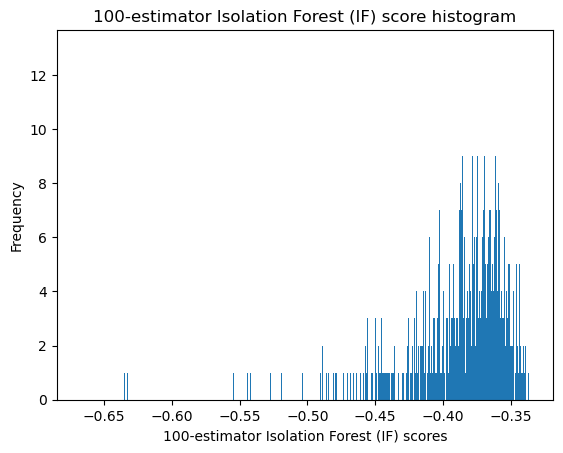

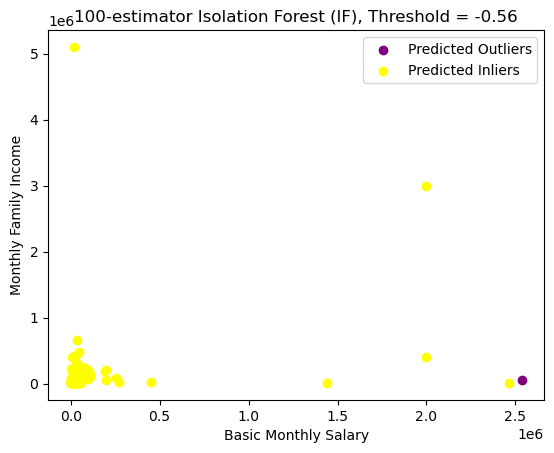

Number of predicted outliers: 4


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,1000,500,500,1000,0,0,4000,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
419,11450,"SADDI, RUBILYN",40,1800,3,0,0,10000.0,1000,500,300,200,200,200,100,100,25,2,500,500,300,700,3500,2000,12345,12345,300,12345,153,50,100,12345,12345,12345,12345,12345,12345,12345,12345,12345,12345,10000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,True
749,11973,"FLORES, RODELYN",33,23000,2,2,3,45000.0,6000,4500,4500,270,1500,6000,2000,2000,1500,900,3500,2000,700,1800,3500,1000,300,1500,1000,1500,3000,3000,1000,3426,1000,1000,900,800,800,1500,600,400,200,1000,1,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True


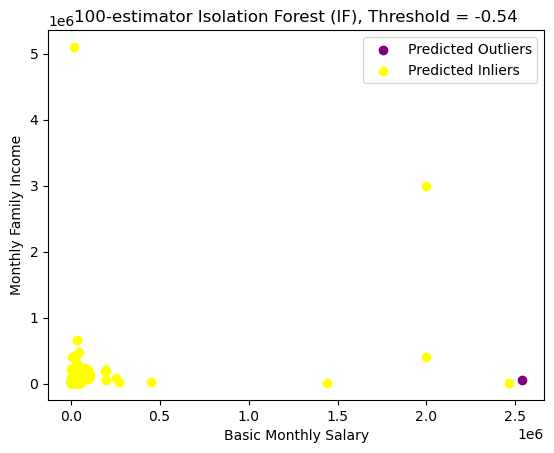

Number of predicted outliers: 10


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,1000,500,500,1000,0,0,4000,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
205,10856,"MAGLENTE, JELINA",28,20000,1,2,4,13000.0,6000,3000,1500,1000,500,500,5000,2000,1500,2000,7000,6000,1500,2000,4500,2000,500,500,500,1000,1000,2500,600,2500,100,500,500,500,600,100,1,1,1,500,1,0,1,1,1,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
377,11388,"EROLES, SONNY BOY",42,40000,3,1,5,40000.0,6300,1000,2000,1000,1500,2000,1000,2400,1000,1000,5000,800,120,1200,2000,2000,1000,1000,1000,160,5000,500,800,8200,4000,27000,10000,10000,8,200,20,20,100,1000,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,True
396,11418,"OROSCO, HAZIEL",49,37000,3,3,7,37000.0,5000,1000,1000,2000,500,2000,5000,3000,1000,1500,5000,5000,800,800,2500,1500,500,2000,2000,500,2000,1000,1500,1000,1000,1000,1000,5000,500,500,500,500,100,5000,0,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
419,11450,"SADDI, RUBILYN",40,1800,3,0,0,10000.0,1000,500,300,200,200,200,100,100,25,2,500,500,300,700,3500,2000,12345,12345,300,12345,153,50,100,12345,12345,12345,12345,12345,12345,12345,12345,12345,12345,10000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,True
749,11973,"FLORES, RODELYN",33,23000,2,2,3,45000.0,6000,4500,4500,270,1500,6000,2000,2000,1500,900,3500,2000,700,1800,3500,1000,300,1500,1000,1500,3000,3000,1000,3426,1000,1000,900,800,800,1500,600,400,200,1000,1,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,

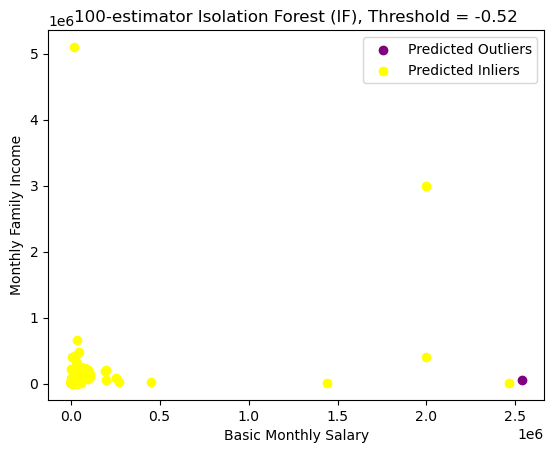

Number of predicted outliers: 11


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,1000,500,500,1000,0,0,4000,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
205,10856,"MAGLENTE, JELINA",28,20000,1,2,4,13000.0,6000,3000,1500,1000,500,500,5000,2000,1500,2000,7000,6000,1500,2000,4500,2000,500,500,500,1000,1000,2500,600,2500,100,500,500,500,600,100,1,1,1,500,1,0,1,1,1,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
333,11316,"CAJUSAY, OSCAR",31,21000,2,5,7,25000.0,3800,2200,2500,1000,500,1500,3500,1200,700,800,2000,1500,500,650,5000,3000,400,1300,1000,500,650,700,1500,4200,3,5000,5000,2000,500,500,500,500,500,6000,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,True
377,11388,"EROLES, SONNY BOY",42,40000,3,1,5,40000.0,6300,1000,2000,1000,1500,2000,1000,2400,1000,1000,5000,800,120,1200,2000,2000,1000,1000,1000,160,5000,500,800,8200,4000,27000,10000,10000,8,200,20,20,100,1000,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,True
396,11418,"OROSCO, HAZIEL",49,37000,3,3,7,37000.0,5000,1000,1000,2000,500,2000,5000,3000,1000,1500,5000,5000,800,800,2500,1500,500,2000,2000,500,2000,1000,1500,1000,1000,1000,1000,5000,500,500,500,500,100,5000,0,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
419,11450,"SADDI, RUBILYN",40,1800,3,0,0,10000.0,1000,500,300,200,200,200,100,100,25,2,500,500,300,700,3500,2000,12345,12345,300,12345,153,50,100,12345,12345,12345,12345,12345,12345,12345,12345,12345,12345,10000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,True

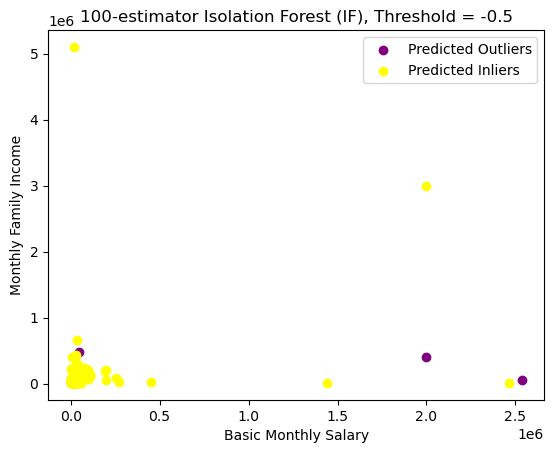

Number of predicted outliers: 19


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
79,10526,"PEREZ, JOHN RIGOR",26,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
161,10678,"BALLECER, DINO",37,18000,2,1,3,177000.0,25000,5000,3000,5000,0,0,13000,0,0,3000,4000,2000,200,4500,10500,1000,0,2000,2000,1500,1000,1000,599,0,0,0,0,1700,0,0,0,0,0,20000,1,1,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,1000,500,500,1000,0,0,4000,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
205,10856,"MAGLENTE, JELINA",28,20000,1,2,4,13000.0,6000,3000,1500,1000,500,500,5000,2000,1500,2000,7000,6000,1500,2000,4500,2000,500,500,500,1000,1000,2500,600,2500,100,500,500,500,600,100,1,1,1,500,1,0,1,1,1,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
333,11316,"CAJUSAY, OSCAR",31,21000,2,5,7,25000.0,3800,2200,2500,1000,500,1500,3500,1200,700,800,2000,1500,500,650,5000,3000,400,1300,1000,500,650,700,1500,4200,3,5000,5000,2000,500,500,500,500,500,6000,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,True
377,11388,"EROLES, SONNY BOY",42,40000,3,1,5,40000.0,6300,1000,2000,1000,1500,2000,1000,2400,1000,1000,5000,800,120,1200,2000,2000,1000,1000,1000,160,5000,500,800,8200,4000,27000,10000,10000,8,200,20,20,100,1000,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,True
380,11395,"SAGURAN, JESSIE",46,47777,3,1,2,480000.0,5000,1500,1000,20

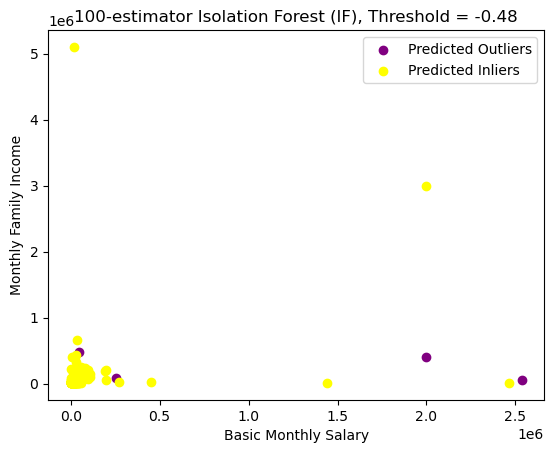

Number of predicted outliers: 29


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
79,10526,"PEREZ, JOHN RIGOR",26,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
82,10531,"MELENDREZ, SALOME",53,60000,3,2,2,60000.0,10000,5000,5000,0,0,5000,0,0,0,0,10000,2000,500,2000,0,1000,0,5000,2000,2000,5000,500,2000,0,0,0,0,0,0,0,0,0,0,100000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
161,10678,"BALLECER, DINO",37,18000,2,1,3,177000.0,25000,5000,3000,5000,0,0,13000,0,0,3000,4000,2000,200,4500,10500,1000,0,2000,2000,1500,1000,1000,599,0,0,0,0,1700,0,0,0,0,0,20000,1,1,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,1000,500,500,1000,0,0,4000,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
205,10856,"MAGLENTE, JELINA",28,20000,1,2,4,13000.0,6000,3000,1500,1000,500,500,5000,2000,1500,2000,7000,6000,1500,2000,4500,2000,500,500,500,1000,1000,2500,600,2500,100,500,500,500,600,100,1,1,1,500,1,0,1,1,1,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
292,11252,"MANA-AY, JOY",38,13000,2,3,6,40000.0,5000,2000,1000,3000,500,500,5000,2000,1000,1000,2000,1000,500,1000,3500,1000,1000,1000,500,500,

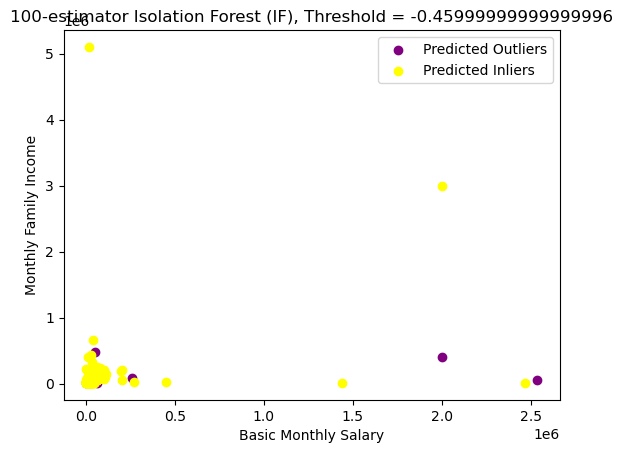

Number of predicted outliers: 43


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
41,9717,"LIMBO, JOHN ORVILLE",40,50000,2,4,3,50000.0,5000,2000,1000,1000,500,2000,0,0,0,0,10000,10000,500,1500,0,2000,0,1000,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,0,100000,1,0,0,0,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
79,10526,"PEREZ, JOHN RIGOR",26,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
82,10531,"MELENDREZ, SALOME",53,60000,3,2,2,60000.0,10000,5000,5000,0,0,5000,0,0,0,0,10000,2000,500,2000,0,1000,0,5000,2000,2000,5000,500,2000,0,0,0,0,0,0,0,0,0,0,100000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
103,10581,"DEJARME, JOAVASAN",40,19000,3,1,9,24000.0,10000,2000,1000,1500,300,1500,200,1800,1500,500,1000,500,280,1500,3000,500,0,100,250,150,1000,600,0,2500,2000,3000,500,3000,0,0,0,500,200,5000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
161,10678,"BALLECER, DINO",37,18000,2,1,3,177000.0,25000,5000,3000,5000,0,0,13000,0,0,3000,4000,2000,200,4500,10500,1000,0,2000,2000,1500,1000,1000,599,0,0,0,0,1700,0,0,0,0,0,20000,1,1,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,100

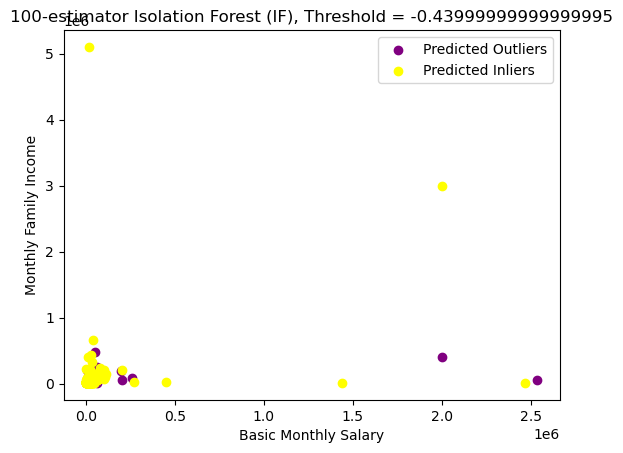

Number of predicted outliers: 90


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
17,7028,"AÑONUEVO, BONIFACIO",45,15000,1,3,8,25000.0,9000,5000,2000,500,0,0,1500,4800,2000,0,1000,1000,0,2000,0,1000,0,0,0,0,1000,0,1600,0,0,0,0,20000,0,0,0,0,0,6000,0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,True
23,8324,"QUINTO, MONCHITO",44,55000,3,1,4,60000.0,15000,5000,2000,2000,0,2500,2500,5000,200,1000,500,500,500,1000,3500,1000,0,1000,1000,500,1000,1000,0,0,0,0,10000,0,0,1000,0,0,500,5000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
984,12720,"LAXAMANA, JAY JEROME",34,61000,3,3,4,160000.0,10000,5000,5000,2000,0,0,0,0,0,0,3000,500,500,2500,0,0,500,2000,1000,1000,2000,200,2000,0,0,0,0,1000,0,0,0,0,0,5000,0,1,1,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
985,12721,"VAÑO, JONATHAN",45,25000,3,2,6,16900.0,500

In [40]:
k = 100

scores = plot_hist_if(ho_t01, n_estimators=k,
                      bins=1_000)
for i in np.arange(-0.56, -0.44, 0.02):
    plot_if(ho_t01, k, scores, i)

#### 500-estimator IF

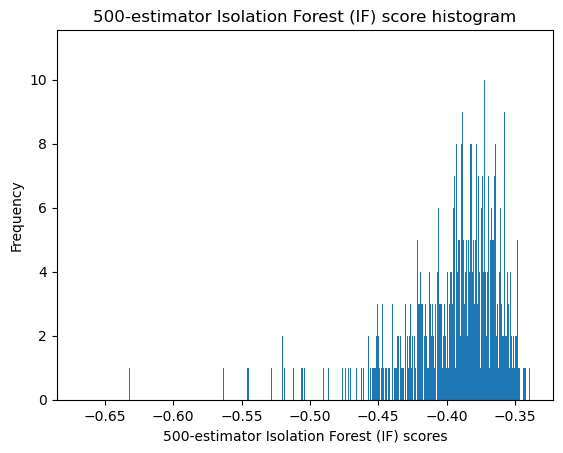

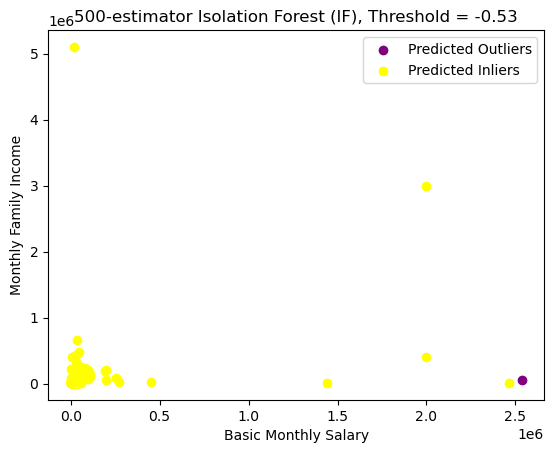

Number of predicted outliers: 12


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,1000,500,500,1000,0,0,4000,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
205,10856,"MAGLENTE, JELINA",28,20000,1,2,4,13000.0,6000,3000,1500,1000,500,500,5000,2000,1500,2000,7000,6000,1500,2000,4500,2000,500,500,500,1000,1000,2500,600,2500,100,500,500,500,600,100,1,1,1,500,1,0,1,1,1,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
333,11316,"CAJUSAY, OSCAR",31,21000,2,5,7,25000.0,3800,2200,2500,1000,500,1500,3500,1200,700,800,2000,1500,500,650,5000,3000,400,1300,1000,500,650,700,1500,4200,3,5000,5000,2000,500,500,500,500,500,6000,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,True
377,11388,"EROLES, SONNY BOY",42,40000,3,1,5,40000.0,6300,1000,2000,1000,1500,2000,1000,2400,1000,1000,5000,800,120,1200,2000,2000,1000,1000,1000,160,5000,500,800,8200,4000,27000,10000,10000,8,200,20,20,100,1000,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,True
396,11418,"OROSCO, HAZIEL",49,37000,3,3,7,37000.0,5000,1000,1000,2000,500,2000,5000,3000,1000,1500,5000,5000,800,800,2500,1500,500,2000,2000,500,2000,1000,1500,1000,1000,1000,1000,5000,500,500,500,500,100,5000,0,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
419,11450,"SADDI, RUBILYN",40,1800,3,0,0,10000.0,1000,500,300,200,200,200,100,100,25,2,500,500,300,700,3500,2000,12345,12345,300,12345,153,50,100,12345,12345,12345,12345,12345,12345,12345,12345,12345,12345,10000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,True

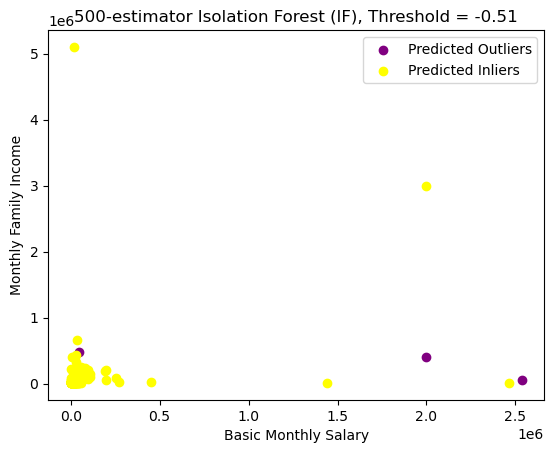

Number of predicted outliers: 19


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
79,10526,"PEREZ, JOHN RIGOR",26,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,1000,500,500,1000,0,0,4000,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
205,10856,"MAGLENTE, JELINA",28,20000,1,2,4,13000.0,6000,3000,1500,1000,500,500,5000,2000,1500,2000,7000,6000,1500,2000,4500,2000,500,500,500,1000,1000,2500,600,2500,100,500,500,500,600,100,1,1,1,500,1,0,1,1,1,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
333,11316,"CAJUSAY, OSCAR",31,21000,2,5,7,25000.0,3800,2200,2500,1000,500,1500,3500,1200,700,800,2000,1500,500,650,5000,3000,400,1300,1000,500,650,700,1500,4200,3,5000,5000,2000,500,500,500,500,500,6000,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,True
377,11388,"EROLES, SONNY BOY",42,40000,3,1,5,40000.0,6300,1000,2000,1000,1500,2000,1000,2400,1000,1000,5000,800,120,1200,2000,2000,1000,1000,1000,160,5000,500,800,8200,4000,27000,10000,10000,8,200,20,20,100,1000,1,0,0,1,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,True
380,11395,"SAGURAN, JESSIE",46,47777,3,1,2,480000.0,5000,1500,1000,2000,0,0,0,0,0,0,1000,0,600,700,7000,1500,1500,1000,1000,500,1000,500,1000,0,2500,0,0,8000,0,0,0,0,1000,5000,0,1,0,1,0,1,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
391,11411,"ORTEGA, MERRIAM",44,2000000,3,2,4,400000.0,15000,1500,2000,500,

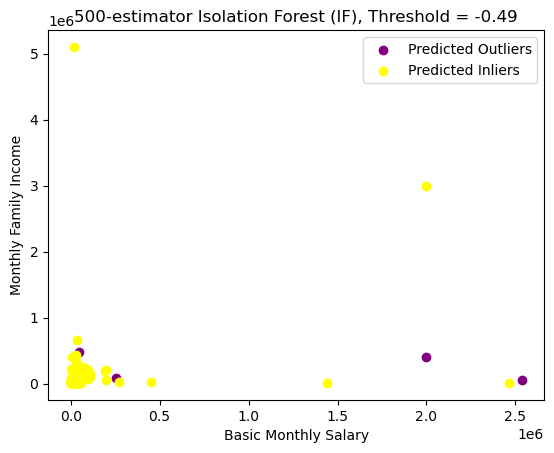

Number of predicted outliers: 25


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
79,10526,"PEREZ, JOHN RIGOR",26,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
82,10531,"MELENDREZ, SALOME",53,60000,3,2,2,60000.0,10000,5000,5000,0,0,5000,0,0,0,0,10000,2000,500,2000,0,1000,0,5000,2000,2000,5000,500,2000,0,0,0,0,0,0,0,0,0,0,100000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
161,10678,"BALLECER, DINO",37,18000,2,1,3,177000.0,25000,5000,3000,5000,0,0,13000,0,0,3000,4000,2000,200,4500,10500,1000,0,2000,2000,1500,1000,1000,599,0,0,0,0,1700,0,0,0,0,0,20000,1,1,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
173,10695,"CALLEDO, LEO",35,80000,3,6,4,100000.0,5000,5000,5000,1000,1000,2000,5000,5000,2000,5000,5000,5000,2000,2000,4000,4000,1000,1000,1000,1000,4000,2000,2000,2000,1000,2000,1000,1000,500,500,1000,0,0,4000,1,1,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
205,10856,"MAGLENTE, JELINA",28,20000,1,2,4,13000.0,6000,3000,1500,1000,500,500,5000,2000,1500,2000,7000,6000,1500,2000,4500,2000,500,500,500,1000,1000,2500,600,2500,100,500,500,500,600,100,1,1,1,500,1,0,1,1,1,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
325,11304,"NOROMOR, ABNER",47,257250,3,0,0,80000.0,10000,5000,4000,1500,1000,4000,5000,1500,1000,1500,2000,1500,1000,5000,0,2500,0,1500,2000,1500,1500,500,500,0,0,0,0,1500,0,1000,0,0,0,10000,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,True
333,11316,"CAJUSAY, OSCAR",31,21000,2,5,7,25000.0,3800,2200,2500,1000,500,1500,3500,1200,700,800,2000,1500,500,650,5000,300

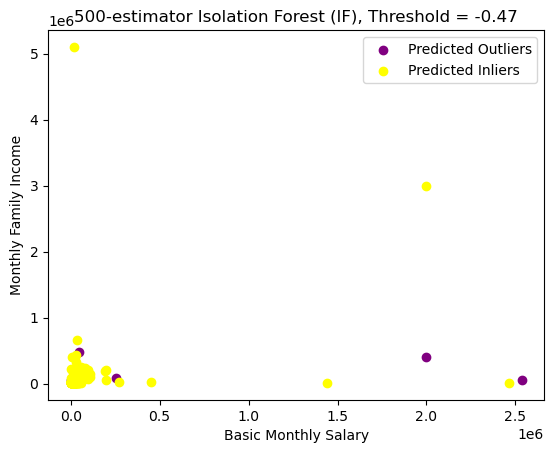

Number of predicted outliers: 42


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
23,8324,"QUINTO, MONCHITO",44,55000,3,1,4,60000.0,15000,5000,2000,2000,0,2500,2500,5000,200,1000,500,500,500,1000,3500,1000,0,1000,1000,500,1000,1000,0,0,0,0,10000,0,0,1000,0,0,500,5000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
41,9717,"LIMBO, JOHN ORVILLE",40,50000,2,4,3,50000.0,5000,2000,1000,1000,500,2000,0,0,0,0,10000,10000,500,1500,0,2000,0,1000,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,0,100000,1,0,0,0,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
67,10450,"CASUMPANG, MARIAH ANNE",28,80000,2,2,3,80000.0,15000,5000,2000,2000,0,3000,10000,0,0,0,5000,3000,1000,2000,2000,1000,2000,3000,2000,1000,2000,1000,1000,5000,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,True
79,10526,"PEREZ, JOHN RIGOR",26,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
82,10531,"MELENDREZ, SALOME",53,60000,3,2,2,60000.0,10000,5000,5000,0,0,5000,0,0,0,0,10000,2000,500,2000,0,1000,0,5000,2000,2000,5000,500,2000,0,0,0,0,0,0,0,0,0,0,100000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
161,10678,"BALLECER, DINO",37,18000,2,1,3,177000.0,25000,5000,3000,5000,0,0,13000,0,0,3000,4000,2000,200,4500,10500,1000,0,2000,2000,1500,1000,1000,599,0,0,0,0,1700,0,0,0,0,0,20000,1,1,0,

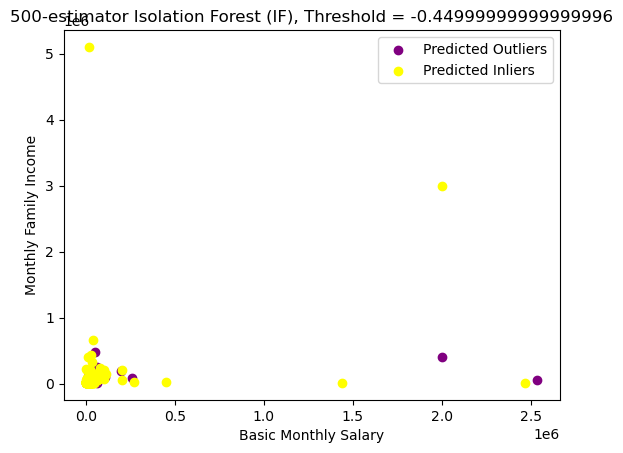

Number of predicted outliers: 84


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
7,3511,"SALUBRE, EDDIE",52,28684,2,2,6,36000.0,6000,1800,1000,0,0,2000,500,500,0,200,0,200,500,1000,3000,0,0,0,0,70,200,500,0,0,0,0,0,400,500,0,0,0,0,7000,0,1,1,0,1,0,1,0,0,1,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
23,8324,"QUINTO, MONCHITO",44,55000,3,1,4,60000.0,15000,5000,2000,2000,0,2500,2500,5000,200,1000,500,500,500,1000,3500,1000,0,1000,1000,500,1000,1000,0,0,0,0,10000,0,0,1000,0,0,500,5000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
41,9717,"LIMBO, JOHN ORVILLE",40,50000,2,4,3,50000.0,5000,2000,1000,1000,500,2000,0,0,0,0,10000,10000,500,1500,0,2000,0,1000,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,0,100000,1,0,0,0,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
984,12720,"LAXAMANA, JAY JEROME",34,61000,3,3,4,160000.0,10000,5000,5000,2000,0,0,0,0,0,0,3000,500,500,2500,0,0,500,2000,1000,1000,2000,200,2000,0,0,0,0,1000,0,0,0,0,0,5000,0,1,1,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
985,12721,"VAÑO, JONATHAN",45,25000,3,2,6,16900.0,5000,5000,3000,5000,1000,2000,35000,5000,400

In [41]:
k = 500

scores = plot_hist_if(ho_t01, n_estimators=k,
                      bins=1_000)
for i in np.arange(-0.53, -0.45, 0.02):
    plot_if(ho_t01, k, scores, i)

### Final Predicted Outliers

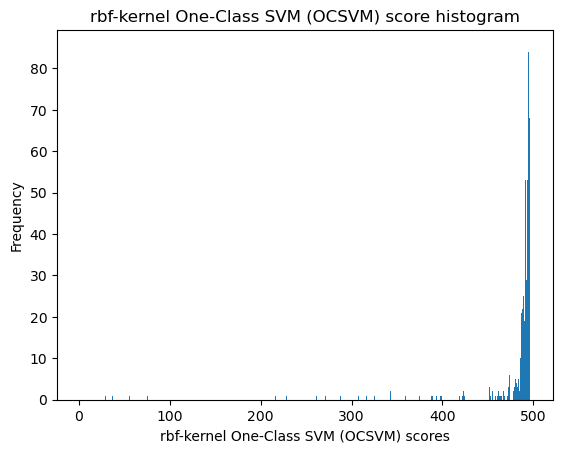

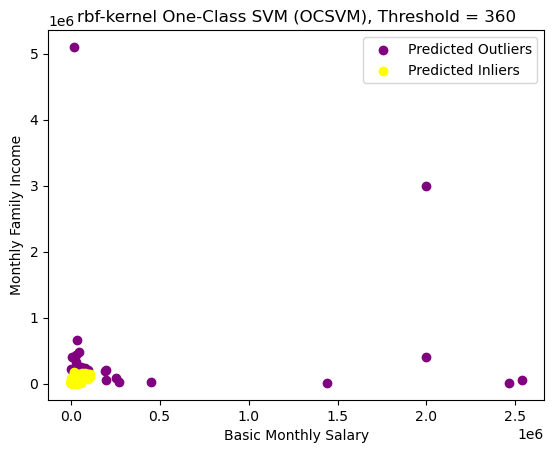

Number of predicted outliers: 38


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
114,10596,"ALERE, DINOS",40,19000,1,0,0,190000.0,1,3,4,3,1,1,1,2,2,1,4,4,5,5,4500,2,6,6,6,6,6,8,2,8,8,8,8,6,9,9,9,9,9,10,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,True
162,10679,"GONEZ, JAMES",25,80000,3,2,3,203000.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,True
231,11170,"SANTOR,

[14, 24, 32, 50, 70, 114, 162, 200, 231, 253, 299, 323, 325, 380, 391, 405, 417, 435, 515, 556, 558, 563, 568, 584, 608, 677, 692, 702, 706, 762, 773, 830, 868, 912, 929, 940, 1009, 1046]


In [629]:
# k = 100

# scores = plot_hist_if(ho_t01, n_estimators=k,
#                       bins=1_000)
# ho_t01_outliers = plot_if(ho_t01, k, scores, -0.52)

k = 'rbf'

scores = plot_hist_ocsvm(ho_t01, kernel=k,
                         bins=1_000)
# ho_t01_outliers = plot_ocsvm(ho_t01, k, scores, 350)
# print(ho_t01_outliers)
ho_t01_outliers = plot_ocsvm(ho_t01, k, scores, 360)
print(ho_t01_outliers)

In [44]:
# # k = 100

# # scores = plot_hist_if(ho_t01, n_estimators=k,
# #                       bins=1_000)
# # ho_t01_outliers = plot_if(ho_t01, k, scores, -0.52)

# k = 'rbf'

# scores = plot_hist_ocsvm2(ld_t01, kernel=k,
#                          bins=1_000)
# # ho_t01_outliers = plot_ocsvm(ho_t01, k, scores, 350)
# # print(ho_t01_outliers)
# ld_t01_outliers = plot_ocsvm(ld_t01, k, scores, 60)
# print(ld_t01_outliers)

In [46]:
# ho_t01.iloc[ho_t01_outliers][['userId', 'lastFirstName', 'basicMonthlySalary', 'monthlyFamilyIncome', 'food', 'fare']]

In [630]:
ho_t02 = ho_t01.drop(ho_t01_outliers)
# ld_t02 = ld_t01.drop(ld_t01_outliers)

ho_t02

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class
0,370,"IBALI, HOWARD",24,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,1719,"OSCARES, ELMER",32,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,1,500,1,1,1,1,1,1,1,1,1,1,1,2000,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1066,12852,"TEJADA, JERIC",27,20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,0,0,0,0,500,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1067,12853,"RAMOS, RHEALYN",27,13962,1,2,4

In [67]:
print('BEFORE OUTLIER REMOVAL')
print('Number of data points:', len(ho_t01))
print(f"Number of positive class points: {(ho_t01['home_ownership_class'] == 1).sum()}, {(ho_t01['home_ownership_class'] == 1).sum() / len(ho_t01) :.1%}")
print(f"Number of negative class points: {(ho_t01['home_ownership_class'] == 0).sum()}, {(ho_t01['home_ownership_class'] == 0).sum() / len(ho_t01) :.1%}")

print('\nOUTLIERS REMOVED')
print('Number of outliers:', len(ho_t01.iloc[ho_t01_outliers]))
print(f"Number of positive class outliers: {(ho_t01.iloc[ho_t01_outliers]['home_ownership_class'] == 1).sum()}, {(ho_t01.iloc[ho_t01_outliers]['home_ownership_class'] == 1).sum() / len(ho_t01.iloc[ho_t01_outliers]) :.1%}")
print(f"Number of negative class outliers: {(ho_t01.iloc[ho_t01_outliers]['home_ownership_class'] == 0).sum()}, {(ho_t01.iloc[ho_t01_outliers]['home_ownership_class'] == 0).sum() / len(ho_t01.iloc[ho_t01_outliers]) :.1%}")

print('\nAFTER OUTLIER REMOVAL')
print('Number of data points:', len(ho_t02))
print(f"Number of positive class points: {(ho_t02['home_ownership_class'] == 1).sum()}, {(ho_t02['home_ownership_class'] == 1).sum() / len(ho_t02) :.1%}")
print(f"Number of negative class points: {(ho_t02['home_ownership_class'] == 0).sum()}, {(ho_t02['home_ownership_class'] == 0).sum() / len(ho_t02) :.1%}")

BEFORE OUTLIER REMOVAL
Number of data points: 1070
Number of positive class points: 263, 24.6%
Number of negative class points: 807, 75.4%

OUTLIERS REMOVED
Number of outliers: 38
Number of positive class outliers: 15, 39.5%
Number of negative class outliers: 23, 60.5%

AFTER OUTLIER REMOVAL
Number of data points: 1032
Number of positive class points: 248, 24.0%
Number of negative class points: 784, 76.0%


In [49]:
# ho_t01 = ld_t01
# ho_t02 = ld_t02
# ho_t01_outliers = ld_t01_outliers

# print('BEFORE OUTLIER REMOVAL')
# print('Number of data points:', len(ho_t01))
# print(f"Number of positive class points: {(ho_t01['ageing_class'] == 1).sum()}, {(ho_t01['ageing_class'] == 1).sum() / len(ho_t01) :.1%}")
# print(f"Number of negative class points: {(ho_t01['ageing_class'] == 0).sum()}, {(ho_t01['ageing_class'] == 0).sum() / len(ho_t01) :.1%}")

# print('\nOUTLIERS REMOVED')
# print('Number of outliers:', len(ho_t01.iloc[ho_t01_outliers]))
# print(f"Number of positive class outliers:, {(ho_t01.iloc[ho_t01_outliers]['ageing_class'] == 1).sum()}, {(ho_t01.iloc[ho_t01_outliers]['ageing_class'] == 1).sum() / len(ho_t01.iloc[ho_t01_outliers]) :.1%}")
# print(f"Number of negative class outliers:, {(ho_t01.iloc[ho_t01_outliers]['ageing_class'] == 0).sum()}, {(ho_t01.iloc[ho_t01_outliers]['ageing_class'] == 0).sum() / len(ho_t01.iloc[ho_t01_outliers]) :.1%}")

# print('\nAFTER OUTLIER REMOVAL')
# print('Number of data points:', len(ho_t02))
# print(f"Number of positive class points: {(ho_t02['ageing_class'] == 1).sum()}, {(ho_t02['ageing_class'] == 1).sum() / len(ho_t02) :.1%}")
# print(f"Number of negative class points: {(ho_t02['ageing_class'] == 0).sum()}, {(ho_t02['ageing_class'] == 0).sum() / len(ho_t02) :.1%}")

In [68]:
len(ho_t01_outliers)
# ho_t01.loc[ho_t01_outliers]['userId']

38

# EDA of Outlier-Removed Dataset

## df.describe()

In [69]:
ho_t02.describe()

,userId,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,home_ownership_class
count,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000,1032.000000
mean,11479.099806,33.634690,25128.346899,2.164729,2.003876,3.906008,41234.013566,4377.787791,1222.165698,908.662791,713.366279,101.031977,598.312016,781.908915,647.829457,225.763566,220.751938,1228.336240,653.959302,402.011628,1098.870155,1698.286822,257.850775,59.613372,438.365310,302.758721,275.139535,397.265504,229.835271,573.913760,346.183140,93.721899,265.206395,166.759690,918.967054,49.207364,54.026163,17.148256,16.539729,15.472868,4998.529070,0.066860,0.089147,0.353682,0.226744,0.315891,0.027132,0.075581,0.026163,0.798450,0.115310,0.066860,0.091085,0.190891,0.700581,0.211240,0.240310
std,1317.675839,7.614199,13909.687243,0.689393,1.262756,2.118205,25532.579319,3826.503550,1133.310471,855.872559,1014.454358,469.629046,1185.332948,3893.842569,1142.110982,513.334524,569.321471,1962.554221,959.647285,522.404311,981.010269,2245.146505,764.102369,421.596189,701.763997,508.365185,575.040210,596.588331,335.156463,688.237048,1713.644884,1623.059054,2537.777091,1070.168199,4333.889353,428.189953,413.383468,387.140922,385.855609,385.243593,8893.793048,0.249901,0.285094,0.478344,0.418929,0.465095,0.162546,0.264455,0.159697,0.401353,0.319551,0.249901,0.287870,0.393194,0.458225,0.408386,0.427479
min,370.000000,20.000000,0.000000,1.000000,0.000000,0.000000,10000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,11222.750000,28.000000,17075.000000,2.000000,1.000000,3.000000,22875.000000,2500.000000,500.000000,500.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,200.000000,500.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,11629.500000,32.000000,20150.000000,2.000000,2.000000,4.000000,35000.000000,4000.000000,1000.000000,500.000000,300.000000,0.000000,86.000000,0.000000,50.000000,0.000000,0.000000,800.000000,500.000000,300.000000,1000.000000,0.500000,0.000000,0.000000,200.000000,0.000000,100.000000,200.000000,100.000000,200.000000,0.000000,0.000000,0

## df.info()

In [641]:
ho_t02.to_csv('ho_t02.csv')

In [101]:
ho_t02.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1032 entries, 0 to 1069
Data columns (total 105 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    userId                          1032 non-null   int64  
 1    lastFirstName                   1032 non-null   object 
 2    age                             1032 non-null   int64  
 3    basicMonthlySalary              1032 non-null   int64  
 4    preferredNetDisposableIncomeId  1032 non-null   int64  
 5    workingFamilyCount              1032 non-null   int64  
 6    residentsCount                  1032 non-null   int64  
 7    monthlyFamilyIncome             1032 non-null   float64
 8    food                            1032 non-null   int64  
 9    hygiene                         1032 non-null   int64  
 10   houseCleaning                   1032 non-null   int64  
 11   fare                            1032 non-null   int64  
 12   parking           

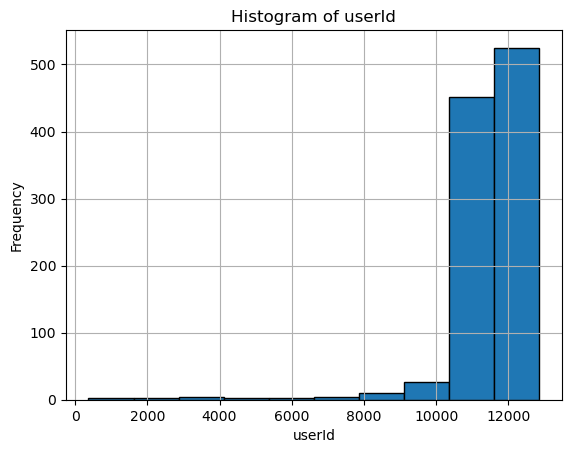

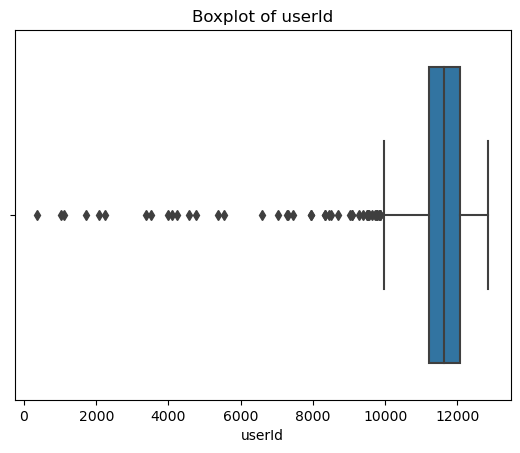

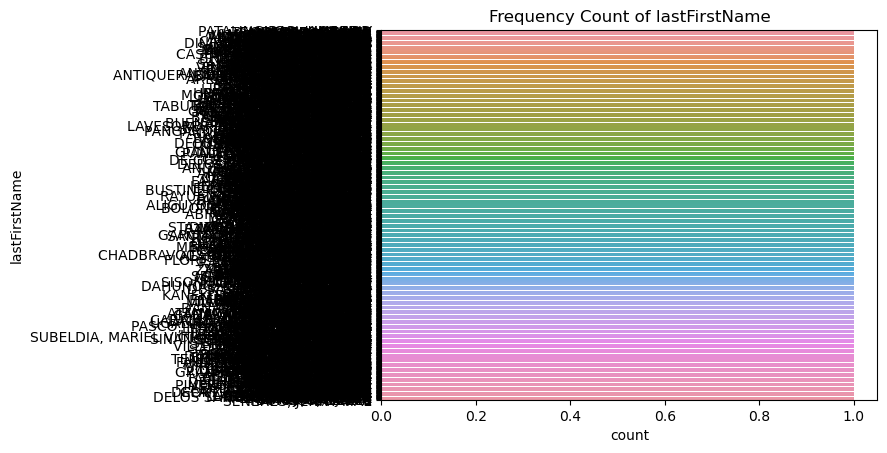

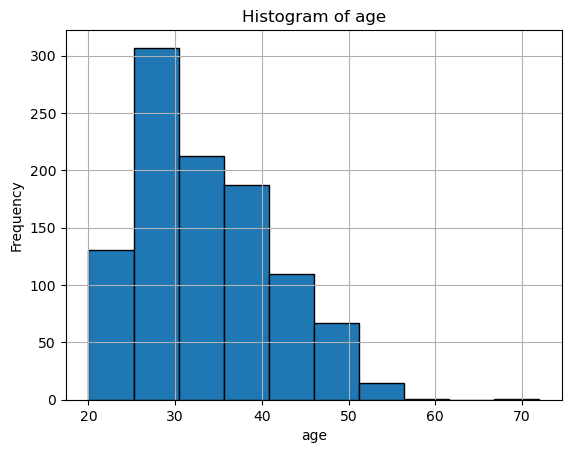

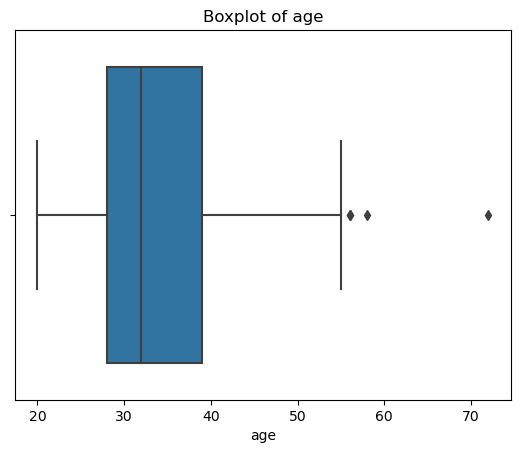

...

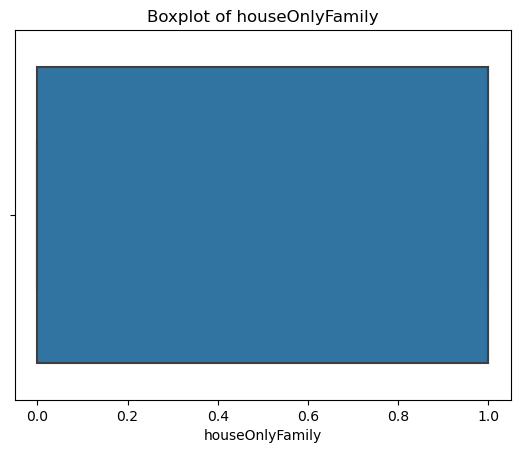

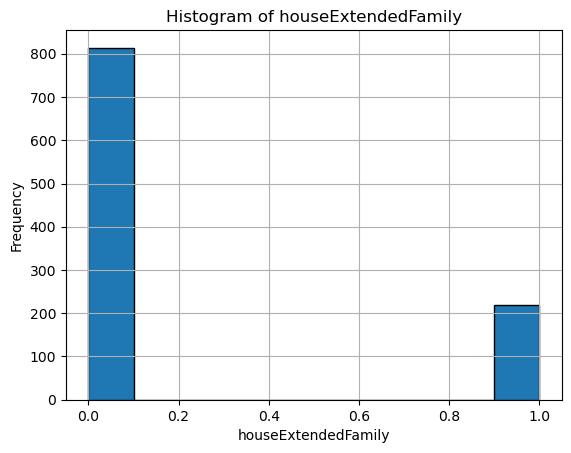

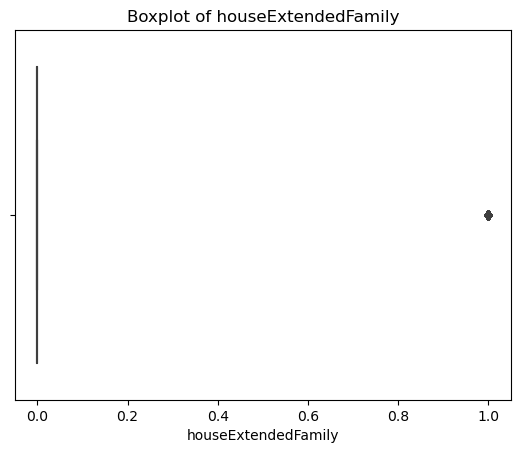

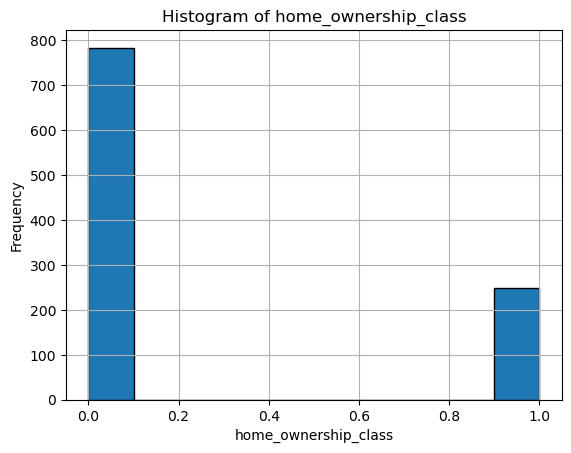

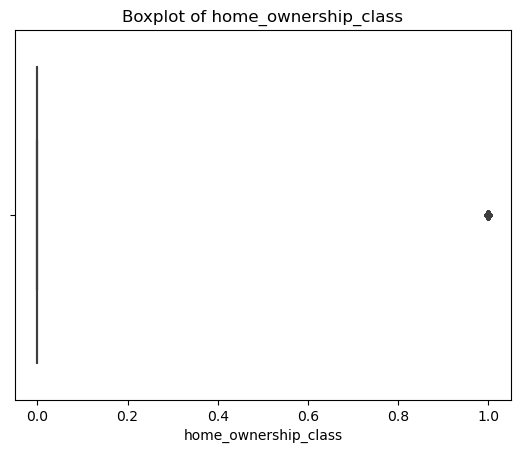

In [72]:
import seaborn as sns

# Visualizing each column
for column in ho_t02.columns:
    # For categorical data
    if ho_t02[column].dtype == "object":
        # Frequency count plot
        sns.countplot(y=column, data=ho_t02)
        plt.title(f"Frequency Count of {column}")
        plt.show()

    # For numerical data
    else:
        # Histogram
        plt.hist(ho_t02[column], bins=10, edgecolor='black')
        plt.title(f"Histogram of {column}")
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()

        # Boxplot
        sns.boxplot(x=ho_t02[column])
        plt.title(f"Boxplot of {column}")
        plt.show()

In [80]:
ho_t02[ho_t02['gasoline'] > 20000]

,userId,lastFirstName,age,gender,province,job,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,home_ownership_class
438,11477,"SALTORE, CHRISELLE",26,FEMALE,BULACAN,ASSOCIATE PROFESSIONAL,16000,2,2,3,29000.0,5000,3000,2000,1000,0,25000,0,1000,0,0,1500,1000,200,1000,4000,0,0,0,0,500,0,0,1200,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1


In [147]:
ho_t02_X = ho_t02.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
ho_t02_y = ho_t02.copy()[['home_ownership_class']]
ho_t02_y
# ho_t02_X_num = ho_t02_X.drop(['gender', 'province', 'job'], axis=1)

,home_ownership_class
0,1
1,0
2,0
3,1
4,0
...,...
1065,0
1066,0
1067,0
1068,0


In [81]:
from sklearn.feature_selection import VarianceThreshold

In [122]:
selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(ho_t02_X)

# Convert the array back to dataframe and retain feature names
ho_t02_X_f01 = pd.DataFrame(filtered_data, columns=ho_t02_X.columns[selector.get_support()])

display(ho_t02_X_f01)

# Getting the boolean mask of retained columns
retained_columns_mask = selector.get_support()

# Using the inverse of the boolean mask to get the column names that were filtered out
filtered_out_columns = ho_t02_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES
0,24.0,19000.0,2.0,3.0,3.0,40000.0,1000.0,500.0,200.0,200.0,0.0,0.0,0.0,50.0,0.0,0.0,500.0,450.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
1,26.0,15000.0,3.0,2.0,4.0,30000.0,5000.0,3000.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,200.0,200.0,1000.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
2,40.0,20000.0,2.0,0.0,3.0,30000.0,3000.0,500.0,300.0,200.0,50.0,50.0,500.0,100.0,100.0,50.0,500.0,100.0,200.0,500.0,0.0,200.0,0.0,100.0,100.0,100.0,200.0,200.0,200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
3,32.0,21200.0,2.0,0.0,5.0,12000.0,2000.0,500.0,200.0,392.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,200.0,200.0,3000.0,0.0,0.0,0.0,0.0,100.0,200.0,400.0,0.0,0.0,0.0,0.0,0.0,876.0,0.0,0.0,0.0,0.0,0.0,500.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
4,39.0,19800.0,2.0,0.0,0.0,25000.0,5000.0,2000.0,1000.0,1500.0,0.0,0.0,1000.0,500.0,1500.0,0.0,0.0,1000.0,300.0,1900.0,0.0,1000.0,0.0,1000.0,1000.0,1500.0,1500.0,500.0,1600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,34.0,19000.0,2.0,2.0,4.0,19000.0,5000.0,1000.0,1000.0,1.0,1.0,1.0,1000.0,500.0,1.0,1000.0,1000.0,500.0,200.0,1500.0,5000.0,1000.0,1.0,1.0,1.0,1.0,1.0,500.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0
1028,27.0,20000.0,2.0,1.0,1.0,20000.0,5000.0,500.0,400.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,0.0,1672.0,0.0,0.0,0.0,0.0,0.0,500.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1029,27.0,13962.0,1.0,2.0,4.0,40000.0,4.0,2.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,30000.0,1000.0,150.0,1000.0,2000.0,500.0,0.0,1000.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
1030,48.0,51000.0,2.0,0.0,5.0,51000.0,5000.0,3000.0,1500.0,2000.0,0.0,0.0,15000.0,9000.0,0.0,0.0,1000.0,1000.0,300.0,800.0,0.0,0.0,0.0,500.0,500.0,300.0,500.0,300.0,800.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


Number of columns: 50
Removed columns: ['loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'province_AGUSAN DEL NORTE', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_BULACAN', 'province_CAGAYAN', 'province_CAMARINES SUR', 'province_CEBU', 'province_COTABATO', 'province_DAVAO DEL SUR', 'province_EASTERN SAMAR', 'province_FOREIGN COUNTRY', 'province_ILOCOS NORTE', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_MISAMIS OCCIDENTAL', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_ORIENTAL MINDORO', 'province_PANGASINAN', 'province_QUEZON', 'province_QUIRINO', 'province_RIZAL', 'province_ROMBLON', 'province_SOUTH COTABATO', 'province_TARLAC', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_AGRICULTURAL', 'job_ARMED FORCES', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'jo

In [132]:
ho_t02_X_f02 = ho_t02_X_f01.copy()
cols_to_drop = [
    'smallLottery', 'otherVices', 'gambling', 'alcohol'
]
ho_t02_X_f02 = ho_t02_X_f01.drop(columns=cols_to_drop)

# Calculate the correlation matrix
correlation_matrix = ho_t02_X_f02.corr()

# Find pairs of columns where the correlation is greater than 0.8
# This will ignore the diagonal which will always be 1 (self correlation)
to_drop = set()
for i in range(len(correlation_matrix)):
    for j in range(i+1, len(correlation_matrix)):
        if correlation_matrix.iloc[i, j] >= 0.9:
            colname = correlation_matrix.columns[j]  # Getting the column name
            to_drop.add(colname)
            print(correlation_matrix.columns[i], "|", colname, "| Correlation:",
                  correlation_matrix.iloc[i, j])

print("\nAfter dropping correlated features:")
ho_t02_X_f02
# ho_t02_X_f02 = ho_t02.copy().drop(columns=cols_to_drop)


After dropping correlated features:


,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES
0,24.0,19000.0,2.0,3.0,3.0,40000.0,1000.0,500.0,200.0,200.0,0.0,0.0,0.0,50.0,0.0,0.0,500.0,450.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
1,26.0,15000.0,3.0,2.0,4.0,30000.0,5000.0,3000.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,200.0,200.0,1000.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0
2,40.0,20000.0,2.0,0.0,3.0,30000.0,3000.0,500.0,300.0,200.0,50.0,50.0,500.0,100.0,100.0,50.0,500.0,100.0,200.0,500.0,0.0,200.0,0.0,100.0,100.0,100.0,200.0,200.0,200.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
3,32.0,21200.0,2.0,0.0,5.0,12000.0,2000.0,500.0,200.0,392.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,200.0,200.0,3000.0,0.0,0.0,0.0,0.0,100.0,200.0,400.0,0.0,0.0,0.0,0.0,0.0,876.0,0.0,500.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
4,39.0,19800.0,2.0,0.0,0.0,25000.0,5000.0,2000.0,1000.0,1500.0,0.0,0.0,1000.0,500.0,1500.0,0.0,0.0,1000.0,300.0,1900.0,0.0,1000.0,0.0,1000.0,1000.0,1500.0,1500.0,500.0,1600.0,0.0,0.0,0.0,0.0,0.0,0.0,10000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,34.0,19000.0,2.0,2.0,4.0,19000.0,5000.0,1000.0,1000.0,1.0,1.0,1.0,1000.0,500.0,1.0,1000.0,1000.0,500.0,200.0,1500.0,5000.0,1000.0,1.0,1.0,1.0,1.0,1.0,500.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0
1028,27.0,20000.0,2.0,1.0,1.0,20000.0,5000.0,500.0,400.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,0.0,1672.0,0.0,500.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1029,27.0,13962.0,1.0,2.0,4.0,40000.0,4.0,2.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,30000.0,1000.0,150.0,1000.0,2000.0,500.0,0.0,1000.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,500.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
1030,48.0,51000.0,2.0,0.0,5.0,51000.0,5000.0,3000.0,1500.0,2000.0,0.0,0.0,15000.0,9000.0,0.0,0.0,1000.0,1000.0,300.0,800.0,0.0,0.0,0.0,500.0,500.0,300.0,500.0,300.0,800.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [148]:
ho_t02_X_f02 = ho_t02.copy().drop(columns=filtered_out_columns)
ho_t02_X_f02 = ho_t02_X_f02.copy().drop(columns=cols_to_drop)
ho_t02_X_f02

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,home_ownership_class
0,370,"IBALI, HOWARD",24,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,2000,0,0,0,1,1,0,1,1,0,1,0,1,1
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,1,1,1,1,0,1,0,0,0,1,0,1,0
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,1000,0,0,0,1,0,0,1,1,0,1,0,1,0
3,1719,"OSCARES, ELMER",32,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,500,1,0,0,1,0,1,0,1,0,0,0,0,1
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,1,500,1,1,1,1,1,1,1,2000,0,0,0,1,0,1,0,1,0,1,1,0,0
1066,12852,"TEJADA, JERIC",27,20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,500,1,0,1,1,0,0,0,1,0,0,0,0,0
1067,12853,"RAMOS, RHEALYN",27,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,0,1000,0,0,0,300,0,0,0,500,0,0,0,2000,0,0,0,1,0,1,0,0,1,0,0,1,0
1068,12854,"BURGOS, LIEZEL",48,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,0,500,500,300,500,300,800,0,0,0,0,0,0,1000,0,0,0,0,1,0,0,0,0,0,0,1,0


In [150]:
# ho_t02 = pd.concat([ho_t02_X_f02, ho_t02_y], axis=1)
# ho_t02 = pd.merge(ho_t02_X_f02, ho_t02_y, on='userId')

ho_t02 = ho_t02_X_f02.copy()
ho_t02

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,home_ownership_class
0,370,"IBALI, HOWARD",24,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,2000,0,0,0,1,1,0,1,1,0,1,0,1,1
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,1,1,1,1,0,1,0,0,0,1,0,1,0
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,1000,0,0,0,1,0,0,1,1,0,1,0,1,0
3,1719,"OSCARES, ELMER",32,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,500,1,0,0,1,0,1,0,1,0,0,0,0,1
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,1,500,1,1,1,1,1,1,1,2000,0,0,0,1,0,1,0,1,0,1,1,0,0
1066,12852,"TEJADA, JERIC",27,20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,500,1,0,1,1,0,0,0,1,0,0,0,0,0
1067,12853,"RAMOS, RHEALYN",27,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,0,1000,0,0,0,300,0,0,0,500,0,0,0,2000,0,0,0,1,0,1,0,0,1,0,0,1,0
1068,12854,"BURGOS, LIEZEL",48,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,0,500,500,300,500,300,800,0,0,0,0,0,0,1000,0,0,0,0,1,0,0,0,0,0,0,1,0


# Classification Modeling

In [157]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from lightgbm import LGBMClassifier
from xgboost.sklearn import XGBClassifier

from sklearn.feature_selection import RFE, RFECV

In [694]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, make_scorer, confusion_matrix, roc_curve
from sklearn.model_selection import GridSearchCV
from sklearn.base import clone

from imblearn.metrics import geometric_mean_score
import shap

In [159]:
from imblearn.over_sampling import SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from imblearn.pipeline import Pipeline
# from sklearn.pipeline import Pipeline

In [56]:
# get_cat_cols(ho_t02)

In [162]:
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    specificity = tn / (tn + fp)
    return specificity

specificity_scorer = make_scorer(specificity_score)

def npv_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    npv = tn / (tn + fn)
    return npv

npv_scorer = make_scorer(npv_score)
from imblearn.metrics import geometric_mean_score
from sklearn.metrics import make_scorer
g_mean_scorer = make_scorer(geometric_mean_score)

def get_cat_cols(df):
    one_hot_encoded_columns = []

    for idx, column in enumerate(df.columns):
        if df[column].nunique() == 2 and set(df[column].unique()) == {0, 1}:
            one_hot_encoded_columns.append(idx)

    return one_hot_encoded_columns

def knn_class(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', KNeighborsClassifier())
    ])

    param_grid = {
        'scaler': [StandardScaler(),
                   MinMaxScaler(),
                   RobustScaler()],
        'resampling': [SMOTE(random_state=random_state),
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       ADASYN(random_state=random_state),
#                        RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_neighbors': list(range(1, 16)),
        'classifier__metric': ['euclidean', 'cosine', 'hamming', 'braycurtis',
                               'chebyshev', 'canberra', 'cityblock', 'sqeuclidean']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def logreg_class(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', LogisticRegression(random_state=random_state,
                                          solver='newton-cholesky'))
    ])

    param_grid = {
        'scaler': [StandardScaler(),
                   MinMaxScaler(),
                   RobustScaler()],
        'resampling': [SMOTE(random_state=random_state),
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       ADASYN(random_state=random_state),
#                        RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__C': list(np.logspace(-6, 6, num=13)),
        'classifier__penalty': ['l2', None]
#         'classifier__penalty': ['l1', l2', 'elasticnet', 'None']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def sgd_class(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', SGDClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [StandardScaler(),
                   MinMaxScaler(),
                   RobustScaler()],
        'resampling': [SMOTE(random_state=random_state),
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       ADASYN(random_state=random_state),
#                        RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__alpha': list(np.logspace(-6, 6, num=13)),
        'classifier__penalty': ['l1', 'l2', 'elasticnet', None],
        'classifier__loss': ['hinge', 'log_loss', 'log', 'modified_huber', 'squared_hinge',
                             'perceptron', 'squared_error', 'huber', 'epsilon_insensitive',
                             'squared_epsilon_insensitive']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def dt_class(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', DecisionTreeClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [StandardScaler(),
                   MinMaxScaler(),
                   RobustScaler()],
        'resampling': [SMOTE(random_state=random_state),
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       ADASYN(random_state=random_state),
#                        RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__max_depth': [None, 5, 10],
        'classifier__min_samples_split': [2, 3, 5],
        'classifier__min_samples_leaf': [1, 2, 3],
        'classifier__criterion': ["gini", "entropy", "log_loss"]
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def rf_class(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', RandomForestClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [StandardScaler(),
                   MinMaxScaler(),
                   RobustScaler()],
        'resampling': [SMOTE(random_state=random_state),
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       ADASYN(random_state=random_state),
#                        RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__max_depth': [None, 5, 10],
        'classifier__criterion': ["gini", "entropy", "log_loss"]
    }
#         'classifier__min_samples_split': [2, 3, 5],
#         'classifier__min_samples_leaf': [1, 2, 3],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def gbm_class(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', GradientBoostingClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [StandardScaler(),
                   MinMaxScaler(),
                   RobustScaler()],
        'resampling': [SMOTE(random_state=random_state),
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       ADASYN(random_state=random_state),
#                        RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__max_depth': [None, 5, 10],
        'classifier__learning_rate': [0.01, 0.1, 0.2]
    }
#         'loss': ['log_loss', 'deviance', 'exponential']
#         'min_samples_leaf': [1, 2, 3],
#         'min_samples_split': [2, 3, 5],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def lgbm_class(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', LGBMClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [StandardScaler(),
                   MinMaxScaler(),
                   RobustScaler()],
        'resampling': [SMOTE(random_state=random_state),
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       ADASYN(random_state=random_state),
#                        RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__learning_rate': [0.01, 0.1, 0.2],
        'classifier__boosting_type': ['gbdt', 'dart', 'goss']
    }
#         'classifier__num_leaves': [20, 31, 40],
#         'classifier__min_child_samples': [10, 20, 30],
#         'classifier__max_depth': [-1, 5, 10],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def xgb_class(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', XGBClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [StandardScaler(),
                   MinMaxScaler(),
                   RobustScaler()],
        'resampling': [SMOTE(random_state=random_state),
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       ADASYN(random_state=random_state),
#                        RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__learning_rate': [0.01, 0.1, 0.2],
        'classifier__grow_policy': ['depthwise', 'lossguide']
    }
#         'classifier__max_depth': [None, 5, 10],
#         'classifier__max_leaves': [0, 10, 20],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def lgbm_class(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', LGBMClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [StandardScaler(),
                   MinMaxScaler(),
                   RobustScaler()],
        'resampling': [SMOTE(random_state=random_state),
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       ADASYN(random_state=random_state),
#                        RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__learning_rate': [0.01, 0.1, 0.2],
        'classifier__boosting_type': ['gbdt', 'dart', 'goss']
    }
#         'classifier__num_leaves': [20, 31, 40],
#         'classifier__min_child_samples': [10, 20, 30],
#         'classifier__max_depth': [-1, 5, 10],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def adaboost_class(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', AdaBoostClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [StandardScaler(),
                   MinMaxScaler(),
                   RobustScaler()],
        'resampling': [SMOTE(random_state=random_state),
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       ADASYN(random_state=random_state),
#                        RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__learning_rate': [0.01, 0.1, 0.2],
        'classifier__algorithm': ['SAMME', 'SAMME.R']
    }
#         'classifier__max_depth': [None, 5, 10],
#         'classifier__max_leaves': [0, 10, 20],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

## Treatment HO-T02: Standard DF, removed outliers

In [161]:
ho_t02_logreg_gs, ho_t02_logreg_be, ho_t02_logreg_model_info, ho_t02_logreg_metrics_df = logreg_class(ho_t02, g_mean_scorer,
                                                                                                      'home_ownership_class', random_state=0)

Fitting 10 folds for each of 312 candidates, totalling 3120 fits
Best Hyperparameters: {'classifier__C': 0.1, 'classifier__penalty': 'l2', 'resampling': ADASYN(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.5823318303770744
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.1, random_state=0,
                                    solver='newton-cholesky'))])
GridSearchCV Runtime: 0.4009314974149068
Run 1 - Random State: 0
Test G-mean: 0.58184628163935
Run 2 - Random State: 1
Test G-mean: 0.569192051803901
Run 3 - Random State: 2
Test G-mean: 0.5660751537187174
Run 4 - Random State: 3
Test G-mean: 0.6256004357421676
Run 5 - Random State: 4
Test G-mean: 0.5509731650193397
Ave Test G-mean: 0.5787374175846951
Stdev Test G-mean: 0.028408221350304425
Ave Test Specificity: 0.613265306122449
Ave Test Recall: 0.5483870967741935
Ave Test NPV: 

In [163]:
ho_t02_dt_gs, ho_t02_dt_be, ho_t02_dt_model_info, ho_t02_dt_metrics_df = dt_class(ho_t02, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 972 candidates, totalling 9720 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 3, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.5670062893512393
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(min_samples_split=3, random_state=0))])
GridSearchCV Runtime: 1.3306420723597208
Run 1 - Random State: 0
Test G-mean: 0.5192952382191942
Run 2 - Random State: 1
Test G-mean: 0.5760184328847832
Run 3 - Random State: 2
Test G-mean: 0.479157423749955
Run 4 - Random State: 3
Test G-mean: 0.47171475742927904
Run 5 - Random State: 4
Test G-mean: 0.5192952382191942
Ave Test G-mean: 0.5130962181004811
Stdev Test G-mean: 0.041534106055974664
Ave Test Specificit

In [164]:
ho_t02_lgbm_gs, ho_t02_lgbm_be, ho_t02_lgbm_model_info, ho_t02_lgbm_metrics_df = lgbm_class(ho_t02, g_mean_scorer,
                                                                    'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__boosting_type': 'gbdt', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.5982321060074186
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LGBMClassifier(learning_rate=0.2, n_estimators=200,
                                random_state=0))])
GridSearchCV Runtime: 1.6591836293538411
Run 1 - Random State: 0
Test G-mean: 0.5550652506880571
Run 2 - Random State: 1
Test G-mean: 0.5839638900521098
Run 3 - Random State: 2
Test G-mean: 0.5672369305256891
Run 4 - Random State: 3
Test G-mean: 0.5497021756333007
Run 5 - Random State: 4
Test G-mean: 0.5968564788564029
Ave Test G-mean: 0.5705649451511119
Stdev Test G-mean: 0.019731623290956207
Ave Test Speci

In [165]:
ho_t02_xgb_gs, ho_t02_xgb_be, ho_t02_xgb_model_info, ho_t02_xgb_metrics_df = xgb_class(ho_t02, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 50, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.5904548957126015
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               

In [637]:
ho_t02_adaboost_gs, ho_t02_adaboost_be, ho_t02_adaboost_model_info, ho_t02_adaboost_metrics_df = adaboost_class(ho_t02, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME.R', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 100, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.6117223317237539
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(learning_rate=0.01, n_estimators=100,
                                    random_state=0))])
GridSearchCV Runtime: 3.075752925872803
Run 1 - Random State: 0
Test G-mean: 0.6179240660594187
Run 2 - Random State: 1
Test G-mean: 0.6301874910408684
Run 3 - Random State: 2
Test G-mean: 0.6351302137463072
Run 4 - Random State: 3
Test G-mean: 0.6054122801582615
Run 5 - Random State: 4
Test G-mean: 0.6060915267313265
Ave Test G-mean: 0.6189491155472364
Stdev Test G-mean: 0.013580714742084894
Av

In [168]:
ho_t02_rf_gs, ho_t02_rf_be, ho_t02_rf_model_info, ho_t02_rf_metrics_df = rf_class(ho_t02, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.5842175671770882
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=5, n_estimators=200,
                                        random_state=0))])
GridSearchCV Runtime: 2.868346683184306
Run 1 - Random State: 0
Test G-mean: 0.6181903552620656
Run 2 - Random State: 1
Test G-mean: 0.5547686622347748
Run 3 - Random State: 2
Test G-mean: 0.586214240934033
Run 4 - Random State: 3
Test G-mean: 0.5578749768504754
Run 5 - Random State: 4
Test G-mean: 0.6075154725392503
Ave Test G-mean: 0.5849127415641198
Stdev Test G-mean: 0.028546817514820955
Ave Test Spe

In [169]:
ho_t02_knn_gs, ho_t02_knn_be, ho_t02_knn_model_info, ho_t02_knn_metrics_df = knn_class(ho_t02, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__metric': 'braycurtis', 'classifier__n_neighbors': 14, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.5829010835784417
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='braycurtis', n_neighbors=14))])
GridSearchCV Runtime: 1.8750030358632406
Run 1 - Random State: 0
Test G-mean: 0.4778676302294041
Run 2 - Random State: 1
Test G-mean: 0.5129976188495993
Run 3 - Random State: 2
Test G-mean: 0.4778676302294041
Run 4 - Random State: 3
Test G-mean: 0.48884865608720046
Run 5 - Random State: 4
Test G-mean: 0.4744977594948529
Ave Test G-mean: 0.48641585897809214
Stdev Test G-mean: 0.01581687377781031
Ave Test Specificity: 0.5918367346938775
Ave Test Recall: 0.4
Ave Test NPV: 0.756918238993

In [170]:
ho_t02_gbm_gs, ho_t02_gbm_be, ho_t02_gbm_model_info, ho_t02_gbm_metrics_df = gbm_class(ho_t02, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__learning_rate': 0.01, 'classifier__max_depth': 5, 'classifier__n_estimators': 100, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.6025062419103326
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(learning_rate=0.01, max_depth=5,
                                            random_state=0))])
GridSearchCV Runtime: 13.141731429100037
Run 1 - Random State: 0
Test G-mean: 0.5301942953139067
Run 2 - Random State: 1
Test G-mean: 0.5660751537187174
Run 3 - Random State: 2
Test G-mean: 0.539426462543718
Run 4 - Random State: 3
Test G-mean: 0.5465494128601982
Run 5 - Random State: 4
Test G-mean: 0.5696978398265997
Ave Test G-mean: 0.550388632852628
Stdev Test G-mean: 0.017041364877156743


In [159]:
# ho_t02_sgd_gs, ho_t02_sgd_be, ho_t02_sgd_model_info = sgd_class(ho_t02, 'f1', 'home_ownership_class', random_state=0)

Fitting 10 folds for each of 6240 candidates, totalling 62400 fits
Best Hyperparameters: {'classifier__alpha': 0.01, 'classifier__loss': 'epsilon_insensitive', 'classifier__penalty': 'l2', 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.41029524575471965
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SGDClassifier(alpha=0.01, loss='epsilon_insensitive',
                               random_state=0))])
Test Accuracy: 0.5643939393939394
Test Precision: 0.24271844660194175
Test Recall: 0.4032258064516129
Test F1_score: 0.30303030303030304
Runtime: 14.526761865615844


In [172]:
# model_vars = ['knn', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb']
model_vars = ['knn', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'k-Nearest Neighbors',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
#     'Classifier model': [
#         'kNN', 'Logistic Regression', 'Decision Tree', 'Random Forest', 
#         'Gradient Boosting Machine (GBM)', 'LightGBM',
#         'Extreme Gradient Boosting (XGBoost)'
#     ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t02_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t02_summ = pd.DataFrame(var_df)

columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


selected_columns = [col for col in ho_t02_summ.columns if col not in columns_to_exclude]
ho_t02_summ[selected_columns]

,Classifier model,Best CV Score (G-mean),Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test Accuracy,Average Test Precision,Average Test F1-score
0,k-Nearest Neighbors,0.582901,0.486416,0.015817,0.591837,0.400000,0.756918,0.545736,0.237202,0.297646
1,Logistic Regression,0.582332,0.578737,0.028408,0.613265,0.548387,0.811730,0.597674,0.309021,0.394935
2,Decision Tree,0.567006,0.513096,0.041534,0.545918,0.483871,0.769279,0.531008,0.252752,0.331770
3,Random Forest,0.584218,0.584913,0.028547,0.604082,0.567742,0.815396,0.595349,0.312686,0.402863
4,Gradient Boosting Machine (GBM),0.602506,0.550389,0.017041,0.581633,0.522581,0.793915,0.567442,0.283441,0.367135
5,LightGBM,0.598232,0.570565,0.019732,0.568367,0.574194,0.808573,0.569767,0.296233,0.390570
6,Extreme Gradient Boosting (XGBoost),0.590455,0.579338,0.045802,0.591837,0.567742,0.811614,0.586047,0.307025,0.398240
7,AdaBoost,0.596344,0.619189,0.013569,0.645918,0.596774,0.835814,0.634109,0.348300,0.438839


In [638]:
# df = ho_t02
# df.columns.tolist()

In [635]:
cont = ['age', 'basicMonthlySalary', 'preferredNetDisposableIncomeId',
        'workingFamilyCount', 'residentsCount', 'monthlyFamilyIncome',
        'food', 'hygiene', 'houseCleaning', 'fare', 'parking', 'gasoline',
        'tuition', 'allowance', 'uniform', 'otherEducation', 'emergency',
        'medicine', 'water', 'electricity', 'rent', 'repair', 'cinema',
        'dineOut', 'leisure', 'personalCare', 'clothing', 'mobileLoad',
        'internet', 'vehicleLoan', 'informalLenders', 'companyLoan',
        'privateLoans', 'governmentLoans', 'smoking', 'alcohol', 'gambling',
        'smallLottery', 'otherVices', 'savings']

In [594]:
import dice_ml

In [625]:
ho_t02

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,home_ownership_class
0,370,"IBALI, HOWARD",24,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,2000,0,0,0,1,1,0,1,1,0,1,0,1,1
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,1,1,1,1,0,1,0,0,0,1,0,1,0
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,1000,0,0,0,1,0,0,1,1,0,1,0,1,0
3,1719,"OSCARES, ELMER",32,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,500,1,0,0,1,0,1,0,1,0,0,0,0,1
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,1,500,1,1,1,1,1,1,1,2000,0,0,0,1,0,1,0,1,0,1,1,0,0
1066,12852,"TEJADA, JERIC",27,20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,500,1,0,1,1,0,0,0,1,0,0,0,0,0
1067,12853,"RAMOS, RHEALYN",27,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,0,1000,0,0,0,300,0,0,0,500,0,0,0,2000,0,0,0,1,0,1,0,0,1,0,0,1,0
1068,12854,"BURGOS, LIEZEL",48,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,0,500,500,300,500,300,800,0,0,0,0,0,0,1000,0,0,0,0,1,0,0,0,0,0,0,1,0


In [639]:
df = ho_t02
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(ho_t02_adaboost_be.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

Permutation explainer: 259it [05:00,  1.21s/it]                         


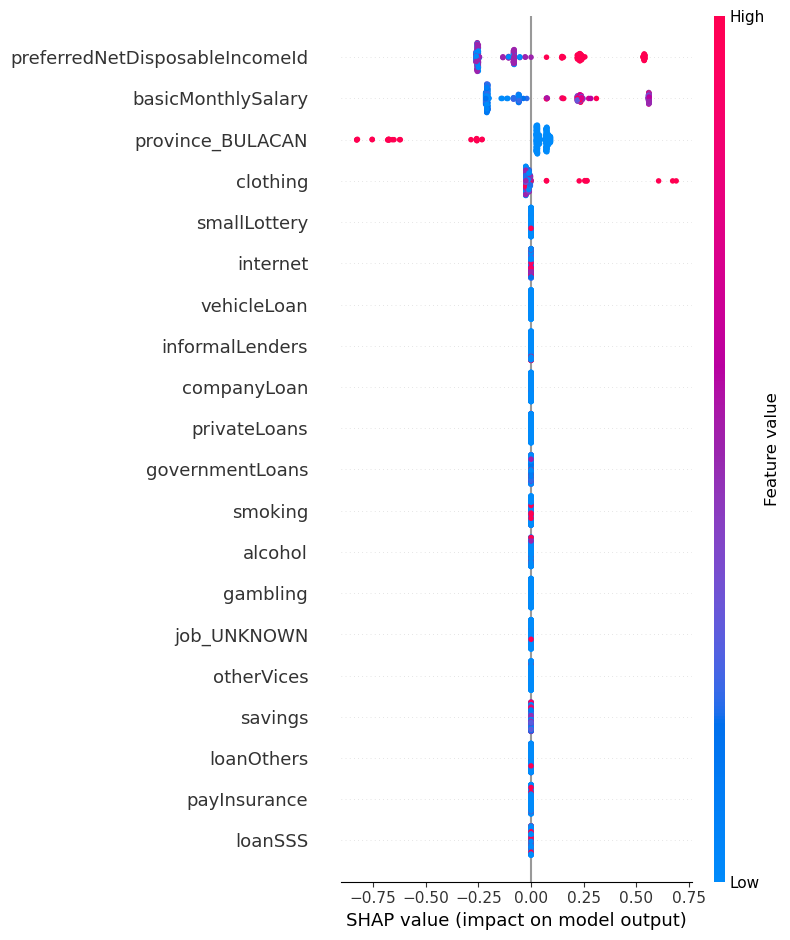

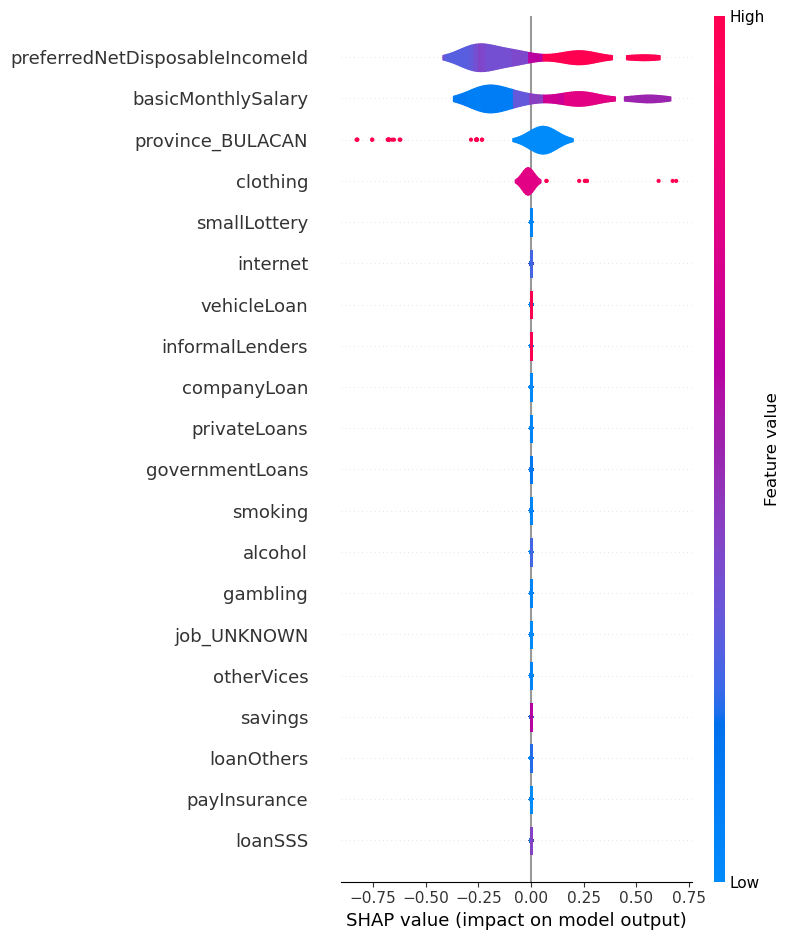

In [640]:
feature_names = X.columns

shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

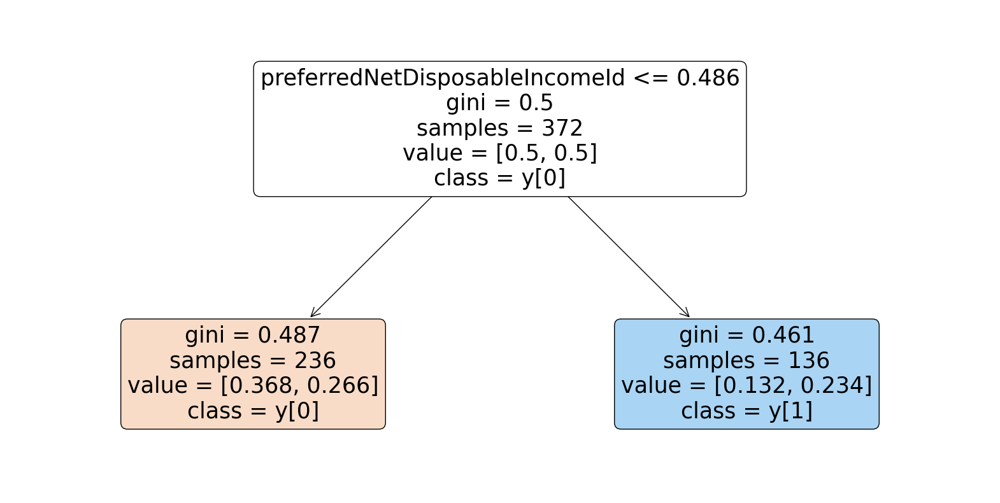

In [643]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Access the trained Random Forest model from the dictionary
model = ho_t02_adaboost_be.named_steps.classifier

# Ensure the model has been trained
if hasattr(model, "estimators_"):
    # Visualize the first tree
    plt.figure(figsize=(20, 10))
    plot_tree(model.estimators_[0], filled=True, feature_names=X_train.columns, class_names=True, rounded=True)
    plt.show()
else:
    print("The model hasn't been trained yet.")

In [644]:
from sklearn.tree import _tree

def tree_rules(tree, feature_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]

    def recurse(node, depth):
        indent = "  " * depth
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            yield f"{indent}if {name} <= {threshold:.2f}:"
            yield from recurse(tree_.children_left[node], depth + 1)
            yield f"{indent}else:  # if {name} > {threshold:.2f}"
            yield from recurse(tree_.children_right[node], depth + 1)
        else:
            yield f"{indent}return Class {tree_.value[node].argmax()}"

    return "\n".join(recurse(0, 1))

In [645]:
model = ho_t02_adaboost_be.named_steps.classifier
rules = tree_rules(model.estimators_[0], X_train.columns)
print(rules)

  if preferredNetDisposableIncomeId <= 0.49:
    return Class 0
  else:  # if preferredNetDisposableIncomeId > 0.49
    return Class 1


In [611]:
df = ho_t02
model = ho_t09_adaboost_be


X = df.drop(['userId', 'lastFirstName'], axis=1)
y = df.loc[:, label_col]
X_train, X_test, _, _ = train_test_split(X, y,
                                         test_size=0.25,
                                         stratify=y,
                                         random_state=0)

X_train
# Dataset for training an ML model
d = dice_ml.Data(dataframe=X_train,
                 continuous_features=cont,
                 outcome_name='home_ownership_class')

# Pre-trained ML model
m = dice_ml.Model(model=model, backend='sklearn')
#                   backend='TF2', func="ohe-min-max")
# DiCE explanation instance
exp = dice_ml.Dice(d,m)

In [618]:
query_instance
X_test[X_test['home_ownership_class'] == 0]

,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
643,23000,1,1,10,23000.0,10000,5000,2000,2000,0,0,50000,0,2400,0,0,2000,1500,0,1,0
135,19200,2,2,4,28000.0,2500,1000,500,0,0,1000,0,500,250,0,0,0,500,0,0,0
128,15000,1,1,3,15000.0,4000,1500,1500,0,0,400,0,0,0,0,0,0,50,0,0,0
949,20000,2,2,3,30000.0,10000,2000,2000,5000,0,1000,0,1000,0,0,5000,2000,3000,0,1,0
532,15000,1,0,3,100000.0,4000,750,500,1500,0,0,1000,50,650,200,500,100,550,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
469,13000,1,3,5,20000.0,3000,1000,500,2000,0,0,0,0,0,0,0,400,300,0,0,0
845,18000,3,3,4,48000.0,4500,1500,1000,0,0,0,0,0,0,0,0,0,1800,0,0,0
58,17000,1,0,4,17000.0,3000,1500,1000,700,200,100,0,0,0,0,2000,1000,1200,0,0,0
256,14820,2,6,5,18000.0,5,1,2,6,5,5,2,2,2,3,5,2,2,0,1,0


In [620]:
query_instance

,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance
643,23000,1,1,10,23000.0,10000,5000,2000,2000,0,0,50000,0,2400,0,0,2000,1500,0,1


In [624]:
# Generate counterfactual examples
query_instance = X_test[X_test['home_ownership_class'] == 0].drop(columns="home_ownership_class")[3:4]
dice_exp = exp.generate_counterfactuals(query_instance, total_CFs=10,
                                        desired_class="opposite",
                                        random_seed=1)
# Visualize counterfactual explanation
dice_exp.visualize_as_dataframe()

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

Query instance (original outcome : 0)


,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
0,20000,2,2,3,30000.0,10000,2000,2000,5000,0,1000,0,1000,0,0,5000,2000,3000,0,1,0



Diverse Counterfactual set (new outcome: 1.0)


,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
0,1955390.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
1,574368.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,6460.0,3000.0,0.0,1.0,1
2,1868047.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
3,1501117.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
4,262196.0,2.0,0.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
5,747310.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,110857.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
6,1954952.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,2976.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
7,1346603.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
8,617240.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
9,260597.0,2.0,2.0,3.0,30000.0,27378.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1


## HO_T03

In [211]:
ho_t03 = ho_t01.copy().drop(ho_t01_outliers)

ho_t03['monthlyFamilyIncome - basicMonthlySalary'] = ho_t03['monthlyFamilyIncome'] - ho_t03['basicMonthlySalary']
ho_t03['monthlyVices'] = (
    ho_t03['smoking'] + ho_t03['alcohol'] + ho_t03['gambling'] +
    ho_t03['smallLottery'] + ho_t03['otherVices']
)
ho_t03['monthlyUtilityBills'] = (
    ho_t03['water'] + ho_t03['electricity'] + ho_t03['rent'] +
    ho_t03['internet'] + ho_t03['mobileLoad']
)
ho_t03['totalMonthlyExpenses'] = (
    ho_t03['food'] + ho_t03['hygiene'] + ho_t03['houseCleaning'] +
    ho_t03['fare'] + ho_t03['parking'] + ho_t03['gasoline'] +
    ho_t03['tuition'] + ho_t03['allowance'] + ho_t03['uniform'] +
    ho_t03['otherEducation'] + ho_t03['emergency'] + ho_t03['medicine'] +
    ho_t03['repair'] + ho_t03['cinema'] + ho_t03['dineOut'] +
    ho_t03['leisure'] + ho_t03['personalCare'] + ho_t03['clothing'] +
    ho_t03['vehicleLoan'] + ho_t03['monthlyUtilityBills'] +
    ho_t03['informalLenders'] + ho_t03['companyLoan'] + ho_t03['privateLoans'] +
    ho_t03['governmentLoans'] + ho_t03['monthlyVices'] + ho_t03['monthlyUtilityBills']
)
ho_t03['monthlyFamilyIncome - totalMonthlyExpenses'] = ho_t03['monthlyFamilyIncome'] - ho_t03['totalMonthlyExpenses']
ho_t03['basicMonthlySalary - totalMonthlyExpenses'] = ho_t03['basicMonthlySalary'] - ho_t03['totalMonthlyExpenses']
ho_t03['monthlyFamilyIncome / workingFamilyCount'] = np.where(
    ho_t03['workingFamilyCount'] == 0,
    ho_t03['monthlyFamilyIncome'],
    ho_t03['monthlyFamilyIncome'] / ho_t03['workingFamilyCount']
)
ho_t03['monthlyFamilyIncome / residentsCount'] = np.where(
    ho_t03['residentsCount'] == 0,
    ho_t03['monthlyFamilyIncome'],
    ho_t03['monthlyFamilyIncome'] / ho_t03['residentsCount']
)
ho_t03['basicMonthlySalary / monthlyFamilyIncome'] = np.where(
    ho_t03['monthlyFamilyIncome'] == 0,
    0,
    ho_t03['basicMonthlySalary'] / ho_t03['monthlyFamilyIncome']
)
ho_t03['totalMonthlyExpenses / basicMonthlySalary'] = np.where(
    ho_t03['basicMonthlySalary'] == 0,
    0,
    ho_t03['totalMonthlyExpenses'] / ho_t03['basicMonthlySalary']
)
ho_t03['totalMonthlyExpenses / monthlyFamilyIncome'] = np.where(
    ho_t03['monthlyFamilyIncome'] == 0,
    0,
    ho_t03['totalMonthlyExpenses'] / ho_t03['monthlyFamilyIncome']
)
ho_t03['monthlyVices / basicMonthlySalary'] = np.where(
    ho_t03['basicMonthlySalary'] == 0,
    0,
    ho_t03['monthlyVices'] / ho_t03['basicMonthlySalary']
)

In [186]:
ho_t03_X = ho_t03.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
ho_t03_y = ho_t03.copy()[['home_ownership_class']]
ho_t03_y
# ho_t02_X_num = ho_t02_X.drop(['gender', 'province', 'job'], axis=1)

,home_ownership_class
0,1
1,0
2,0
3,1
4,0
...,...
1065,0
1066,0
1067,0
1068,0


In [187]:
selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(ho_t03_X)

# Convert the array back to dataframe and retain feature names
ho_t03_X_f01 = pd.DataFrame(filtered_data, columns=ho_t03_X.columns[selector.get_support()])

display(ho_t03_X_f01)

# Getting the boolean mask of retained columns
retained_columns_mask = selector.get_support()

# Using the inverse of the boolean mask to get the column names that were filtered out
filtered_out_columns = ho_t03_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,monthlyFamilyIncome - basicMonthlySalary,monthlyVices,monthlyUtilityBills,totalMonthlyExpenses,monthlyFamilyIncome - totalMonthlyExpenses,basicMonthlySalary - totalMonthlyExpenses,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,basicMonthlySalary / monthlyFamilyIncome,totalMonthlyExpenses / basicMonthlySalary,totalMonthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary
0,24.0,19000.0,2.0,3.0,3.0,40000.0,1000.0,500.0,200.0,200.0,0.0,0.0,0.0,50.0,0.0,0.0,500.0,450.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,21000.0,0.0,50.0,3000.0,37000.0,16000.0,13333.333333,13333.333333,0.475000,0.157895,0.075000,0.000000
1,26.0,15000.0,3.0,2.0,4.0,30000.0,5000.0,3000.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,200.0,200.0,1000.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,15000.0,0.0,1400.0,17300.0,12700.0,-2300.0,15000.000000,7500.000000,0.500000,1.153333,0.576667,0.000000
2,40.0,20000.0,2.0,0.0,3.0,30000.0,3000.0,500.0,300.0,200.0,50.0,50.0,500.0,100.0,100.0,50.0,500.0,100.0,200.0,500.0,0.0,200.0,0.0,100.0,100.0,100.0,200.0,200.0,200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,10000.0,0.0,1100.0,8350.0,21650.0,11650.0,30000.000000,10000.000000,0.666667,0.417500,0.278333,0.000000
3,32.0,21200.0,2.0,0.0,5.0,12000.0,2000.0,500.0,200.0,392.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,200.0,200.0,3000.0,0.0,0.0,0.0,0.0,100.0,200.0,400.0,0.0,0.0,0.0,0.0,0.0,876.0,0.0,0.0,0.0,0.0,0.0,500.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,-9200.0,0.0,3800.0,11968.0,32.0,9232.0,12000.000000,2400.000000,1.766667,0.564528,0.997333,0.000000
4,39.0,19800.0,2.0,0.0,0.0,25000.0,5000.0,2000.0,1000.0,1500.0,0.0,0.0,1000.0,500.0,1500.0,0.0,0.0,1000.0,300.0,1900.0,0.0,1000.0,0.0,1000.0,1000.0,1500.0,1500.0,500.0,1600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,5200.0,0.0,4300.0,28100.0,-3100.0,-8300.0,25000.000000,25000.000000,0.792000,1.419192,1.124000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,34.0,19000.0,2.0,2.0,4.0,19000.0,5000.0,1000.0,1000.0,1.0,1.0,1.0,1000.0,500.0,1.0,1000.0,1000.0,500.0,200.0,1500.0,5000.0,1000.0,1.0,1.0,1.0,1.0,1.0,500.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,5.0,7201.0,26421.0,-7421.0,-7421.0,9500.000000,4750.000000,1.000000,1.390579,1.390579,0.000263
1028,27.0,20000.0,2.0,1.0,1.0,20000.0,5000.0,500.0,400.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,0.0,1672.0,0.0,0.0,0.0,0.0,0.0,500.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,8252.0,11748.0,11748.0,20000.000000,20000.000000,1.000000,0.412600,0.412600,0.000000
1029,27.0,13962.0,1.0,2.0,4.0,40000.0,4.0,2.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,30000.0,1000.0,150.0,1000.0,2000.0,500.0,0.0,1000.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0

Number of columns: 50
Removed columns: ['loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'province_AGUSAN DEL NORTE', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_BULACAN', 'province_CAGAYAN', 'province_CAMARINES SUR', 'province_CEBU', 'province_COTABATO', 'province_DAVAO DEL SUR', 'province_EASTERN SAMAR', 'province_FOREIGN COUNTRY', 'province_ILOCOS NORTE', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_MISAMIS OCCIDENTAL', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_ORIENTAL MINDORO', 'province_PANGASINAN', 'province_QUEZON', 'province_QUIRINO', 'province_RIZAL', 'province_ROMBLON', 'province_SOUTH COTABATO', 'province_TARLAC', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_AGRICULTURAL', 'job_ARMED FORCES', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'jo

In [190]:
ho_t03_X_f02 = ho_t03_X_f01.copy()
cols_to_drop = [
    'smallLottery', 'otherVices', 'gambling', 'monthlyVices', 'alcohol',
    'cinema'
]
ho_t03_X_f02 = ho_t03_X_f01.drop(columns=cols_to_drop)

# Calculate the correlation matrix
correlation_matrix = ho_t03_X_f02.corr()

# Find pairs of columns where the correlation is greater than 0.8
# This will ignore the diagonal which will always be 1 (self correlation)
to_drop = set()
for i in range(len(correlation_matrix)):
    for j in range(i+1, len(correlation_matrix)):
        if correlation_matrix.iloc[i, j] >= 0.9:
            colname = correlation_matrix.columns[j]  # Getting the column name
            to_drop.add(colname)
            print(correlation_matrix.columns[i], "|", colname, "| Correlation:",
                  correlation_matrix.iloc[i, j])

print("\nAfter dropping correlated features:")
ho_t03_X_f02


After dropping correlated features:


,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,monthlyFamilyIncome - basicMonthlySalary,monthlyUtilityBills,totalMonthlyExpenses,monthlyFamilyIncome - totalMonthlyExpenses,basicMonthlySalary - totalMonthlyExpenses,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,basicMonthlySalary / monthlyFamilyIncome,totalMonthlyExpenses / basicMonthlySalary,totalMonthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary
0,24.0,19000.0,2.0,3.0,3.0,40000.0,1000.0,500.0,200.0,200.0,0.0,0.0,0.0,50.0,0.0,0.0,500.0,450.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,21000.0,50.0,3000.0,37000.0,16000.0,13333.333333,13333.333333,0.475000,0.157895,0.075000,0.000000
1,26.0,15000.0,3.0,2.0,4.0,30000.0,5000.0,3000.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,200.0,200.0,1000.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,15000.0,1400.0,17300.0,12700.0,-2300.0,15000.000000,7500.000000,0.500000,1.153333,0.576667,0.000000
2,40.0,20000.0,2.0,0.0,3.0,30000.0,3000.0,500.0,300.0,200.0,50.0,50.0,500.0,100.0,100.0,50.0,500.0,100.0,200.0,500.0,0.0,200.0,100.0,100.0,100.0,200.0,200.0,200.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,10000.0,1100.0,8350.0,21650.0,11650.0,30000.000000,10000.000000,0.666667,0.417500,0.278333,0.000000
3,32.0,21200.0,2.0,0.0,5.0,12000.0,2000.0,500.0,200.0,392.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,200.0,200.0,3000.0,0.0,0.0,0.0,100.0,200.0,400.0,0.0,0.0,0.0,0.0,0.0,876.0,0.0,500.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,-9200.0,3800.0,11968.0,32.0,9232.0,12000.000000,2400.000000,1.766667,0.564528,0.997333,0.000000
4,39.0,19800.0,2.0,0.0,0.0,25000.0,5000.0,2000.0,1000.0,1500.0,0.0,0.0,1000.0,500.0,1500.0,0.0,0.0,1000.0,300.0,1900.0,0.0,1000.0,1000.0,1000.0,1500.0,1500.0,500.0,1600.0,0.0,0.0,0.0,0.0,0.0,0.0,10000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,5200.0,4300.0,28100.0,-3100.0,-8300.0,25000.000000,25000.000000,0.792000,1.419192,1.124000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,34.0,19000.0,2.0,2.0,4.0,19000.0,5000.0,1000.0,1000.0,1.0,1.0,1.0,1000.0,500.0,1.0,1000.0,1000.0,500.0,200.0,1500.0,5000.0,1000.0,1.0,1.0,1.0,1.0,500.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,7201.0,26421.0,-7421.0,-7421.0,9500.000000,4750.000000,1.000000,1.390579,1.390579,0.000263
1028,27.0,20000.0,2.0,1.0,1.0,20000.0,5000.0,500.0,400.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,0.0,1672.0,0.0,500.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,200.0,8252.0,11748.0,11748.0,20000.000000,20000.000000,1.000000,0.412600,0.412600,0.000000
1029,27.0,13962.0,1.0,2.0,4.0,40000.0,4.0,2.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,30000.0,1000.0,150.0,1000.0,2000.0,500.0,1000.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,500.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,26038.0,3450.0,39912.0,88.0,-25950.0,20000.000000,10000.000000,0.349050,2.858616,0.997800,0.000000
1030,48.0,51000.0,2.0,0.0,5.0,51000.0,5000.0,3000.0,1500.0,2000.0,0.0,0.0,15000.0,9000.0,0.0,0.0,1000.0,1000.0,300.0,800.0,0.0,

In [191]:
# data2 = pd.read_csv('df_merged_no_nans.csv')
# data2[data2['foundInHDMF'] != 'False']

In [192]:
ho_t03_X_f02 = ho_t03.copy().drop(columns=filtered_out_columns)
ho_t03_X_f02 = ho_t03_X_f02.copy().drop(columns=cols_to_drop)
ho_t03_X_f02

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,home_ownership_class,monthlyFamilyIncome - basicMonthlySalary,monthlyUtilityBills,totalMonthlyExpenses,monthlyFamilyIncome - totalMonthlyExpenses,basicMonthlySalary - totalMonthlyExpenses,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,basicMonthlySalary / monthlyFamilyIncome,totalMonthlyExpenses / basicMonthlySalary,totalMonthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary
0,370,"IBALI, HOWARD",24,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,2000,0,0,0,1,1,0,1,1,0,1,0,1,1,21000.0,50,3000,37000.0,16000,13333.333333,13333.333333,0.475000,0.157895,0.075000,0.000000
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,2000,1,1,1,1,0,1,0,0,0,1,0,1,0,15000.0,1400,17300,12700.0,-2300,15000.000000,7500.000000,0.500000,1.153333,0.576667,0.000000
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,100,100,100,200,200,200,0,0,0,0,0,0,1000,0,0,0,1,0,0,1,1,0,1,0,1,0,10000.0,1100,8350,21650.0,11650,30000.000000,10000.000000,0.666667,0.417500,0.278333,0.000000
3,1719,"OSCARES, ELMER",32,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,100,200,400,0,0,0,0,0,876,0,500,1,0,0,1,0,1,0,1,0,0,0,0,1,-9200.0,3800,11968,32.0,9232,12000.000000,2400.000000,1.766667,0.564528,0.997333,0.000000
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,1,0,1,0,0,0,5200.0,4300,28100,-3100.0,-8300,25000.000000,25000.000000,0.792000,1.419192,1.124000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,500,1,1,1,1,1,1,1,2000,0,0,0,1,0,1,0,1,0,1,1,0,0,0.0,7201,26421,-7421.0,-7421,9500.000000,4750.000000,1.000000,1.390579,1.390579,0.000263
1066,12852,"TEJADA, JERIC",27,20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,500,1,0,1,1,0,0,0,1,0,0,0,0,0,0.0,200,8252,11748.0,11748,20000.000000,20000.000000,1.000000,0.412600,0.412600,0.000000
1067,12853,"RAMOS, RHEALYN",27,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,1000,0,0,0,300,0,0,0,500,0,0,0,2000,0,0,0,1,0,1,0,0,1,0,0,1,0,26038.0,3450,39912,88.0,-25950,20000.000000,10000.000000,0.349050,2.858616,0.997800,0.000000
1068,12854,"BURGOS, LIEZEL",48,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,500,500,300,500,300,800,0,0,0,0,0,0,1000,0,0,0,0,1,0,0,0,0,0,0,1,0,0.0,2200,43700,7300.0,7300,51000.000000,10200.000000,1.000000,0.856863,0.856863,0.000000


In [193]:
# ho_t02 = pd.concat([ho_t02_X_f02, ho_t02_y], axis=1)
# ho_t02 = pd.merge(ho_t02_X_f02, ho_t02_y, on='userId')

ho_t03 = ho_t03_X_f02.copy()
ho_t03

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,home_ownership_class,monthlyFamilyIncome - basicMonthlySalary,monthlyUtilityBills,totalMonthlyExpenses,monthlyFamilyIncome - totalMonthlyExpenses,basicMonthlySalary - totalMonthlyExpenses,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,basicMonthlySalary / monthlyFamilyIncome,totalMonthlyExpenses / basicMonthlySalary,totalMonthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary
0,370,"IBALI, HOWARD",24,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,2000,0,0,0,1,1,0,1,1,0,1,0,1,1,21000.0,50,3000,37000.0,16000,13333.333333,13333.333333,0.475000,0.157895,0.075000,0.000000
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,2000,1,1,1,1,0,1,0,0,0,1,0,1,0,15000.0,1400,17300,12700.0,-2300,15000.000000,7500.000000,0.500000,1.153333,0.576667,0.000000
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,100,100,100,200,200,200,0,0,0,0,0,0,1000,0,0,0,1,0,0,1,1,0,1,0,1,0,10000.0,1100,8350,21650.0,11650,30000.000000,10000.000000,0.666667,0.417500,0.278333,0.000000
3,1719,"OSCARES, ELMER",32,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,100,200,400,0,0,0,0,0,876,0,500,1,0,0,1,0,1,0,1,0,0,0,0,1,-9200.0,3800,11968,32.0,9232,12000.000000,2400.000000,1.766667,0.564528,0.997333,0.000000
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,1,0,1,0,0,0,5200.0,4300,28100,-3100.0,-8300,25000.000000,25000.000000,0.792000,1.419192,1.124000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,500,1,1,1,1,1,1,1,2000,0,0,0,1,0,1,0,1,0,1,1,0,0,0.0,7201,26421,-7421.0,-7421,9500.000000,4750.000000,1.000000,1.390579,1.390579,0.000263
1066,12852,"TEJADA, JERIC",27,20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,500,1,0,1,1,0,0,0,1,0,0,0,0,0,0.0,200,8252,11748.0,11748,20000.000000,20000.000000,1.000000,0.412600,0.412600,0.000000
1067,12853,"RAMOS, RHEALYN",27,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,1000,0,0,0,300,0,0,0,500,0,0,0,2000,0,0,0,1,0,1,0,0,1,0,0,1,0,26038.0,3450,39912,88.0,-25950,20000.000000,10000.000000,0.349050,2.858616,0.997800,0.000000
1068,12854,"BURGOS, LIEZEL",48,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,500,500,300,500,300,800,0,0,0,0,0,0,1000,0,0,0,0,1,0,0,0,0,0,0,1,0,0.0,2200,43700,7300.0,7300,51000.000000,10200.000000,1.000000,0.856863,0.856863,0.000000


In [197]:
ho_t03_logreg_gs, ho_t03_logreg_be, ho_t03_logreg_model_info, ho_t03_logreg_metrics_df = logreg_class(ho_t03, g_mean_scorer,
                                                                                                      'home_ownership_class', random_state=0)

Fitting 10 folds for each of 312 candidates, totalling 3120 fits
Best Hyperparameters: {'classifier__C': 0.01, 'classifier__penalty': 'l2', 'resampling': SMOTE(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.581493281671154
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.01, random_state=0,
                                    solver='newton-cholesky'))])
GridSearchCV Runtime: 0.4011801242828369
Run 1 - Random State: 0
Test G-mean: 0.5785842292490759
Run 2 - Random State: 1
Test G-mean: 0.584949483816775
Run 3 - Random State: 2
Test G-mean: 0.5439837932759934
Run 4 - Random State: 3
Test G-mean: 0.601183822262458
Run 5 - Random State: 4
Test G-mean: 0.5574322774207351
Ave Test G-mean: 0.5732267212050075
Stdev Test G-mean: 0.022651373267125918
Ave Test Specificity: 0.6071428571428571
Ave Test Recall: 0.5419354838709677
Ave Test NPV:

In [198]:
ho_t03_dt_gs, ho_t03_dt_be, ho_t03_dt_model_info, ho_t03_dt_metrics_df = dt_class(ho_t03, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 972 candidates, totalling 9720 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 5, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.5615852799116627
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, min_samples_leaf=2,
                                        min_samples_split=5, random_state=0))])
GridSearchCV Runtime: 1.5794971068700154
Run 1 - Random State: 0
Test G-mean: 0.48172665087365535
Run 2 - Random State: 1
Test G-mean: 0.5225337067160145
Run 3 - Random State: 2
Test G-mean: 0.5215879435756504
Run 4 - Random State: 3
Test G-mean: 0.4813848795281325
Run 5 - Random State: 4
Test G-mean: 0.5755896881786456
Ave Test G-mean: 0.51656

In [199]:
ho_t03_lgbm_gs, ho_t03_lgbm_be, ho_t03_lgbm_model_info, ho_t03_lgbm_metrics_df = lgbm_class(ho_t03, g_mean_scorer,
                                                                    'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.586845334553507
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.2,
                                n_estimators=200, random_state=0))])
GridSearchCV Runtime: 2.2020424365997315
Run 1 - Random State: 0
Test G-mean: 0.5603035714377508
Run 2 - Random State: 1
Test G-mean: 0.5787264399503138
Run 3 - Random State: 2
Test G-mean: 0.586565078382959
Run 4 - Random State: 3
Test G-mean: 0.5393501807838027
Run 5 - Random State: 4
Test G-mean: 0.5622828013112511
Ave Test G-mean: 0.5654456143732155
Stdev Test G-mean: 0.018301828

In [200]:
ho_t03_xgb_gs, ho_t03_xgb_be, ho_t03_xgb_model_info, ho_t03_xgb_metrics_df = xgb_class(ho_t03, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.5669936880113094
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                          

In [201]:
ho_t03_adaboost_gs, ho_t03_adaboost_be, ho_t03_adaboost_model_info, ho_t03_adaboost_metrics_df = adaboost_class(ho_t03, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 100, 'resampling': SMOTE(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.58720078641509
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME', learning_rate=0.1,
                                    n_estimators=100, random_state=0))])
GridSearchCV Runtime: 2.790880012512207
Run 1 - Random State: 0
Test G-mean: 0.5696978398265997
Run 2 - Random State: 1
Test G-mean: 0.5911766199016731
Run 3 - Random State: 2
Test G-mean: 0.5760184328847832
Run 4 - Random State: 3
Test G-mean: 0.5873361830914219
Run 5 - Random State: 4
Test G-mean: 0.4885118674450274
Ave Test G-mean: 0.5625481886299011
Stdev Test G-mean: 0.042272844692596026
Ave Test Specif

In [202]:
ho_t03_rf_gs, ho_t03_rf_be, ho_t03_rf_model_info, ho_t03_rf_metrics_df = rf_class(ho_t03, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 10, 'classifier__n_estimators': 100, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.5746652052322251
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=10,
                                        random_state=0))])
GridSearchCV Runtime: 3.4214787403742473
Run 1 - Random State: 0
Test G-mean: 0.582976630022228
Run 2 - Random State: 1
Test G-mean: 0.5490281077210963
Run 3 - Random State: 2
Test G-mean: 0.560377000908145
Run 4 - Random State: 3
Test G-mean: 0.5238706150661844
Run 5 - Random State: 4
Test G-mean: 0.6022778792589303
Ave Test G-mean: 0.5637060465953168
Stdev Test G-mean: 0.030300691826005276
Ave 

In [203]:
ho_t03_knn_gs, ho_t03_knn_be, ho_t03_knn_model_info, ho_t03_knn_metrics_df = knn_class(ho_t03, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__metric': 'braycurtis', 'classifier__n_neighbors': 13, 'resampling': ADASYN(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.5827727444178403
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='braycurtis', n_neighbors=13))])
GridSearchCV Runtime: 2.0436479210853578
Run 1 - Random State: 0
Test G-mean: 0.5234777611563646
Run 2 - Random State: 1
Test G-mean: 0.5192159988446245
Run 3 - Random State: 2
Test G-mean: 0.539273888233625
Run 4 - Random State: 3
Test G-mean: 0.5123555690124689
Run 5 - Random State: 4
Test G-mean: 0.5258304820496189
Ave Test G-mean: 0.5240307398593405
Stdev Test G-mean: 0.009942205176673493
Ave Test Specificity: 0.5836734693877551
Ave Test Recall: 0.4709677419354839
Ave Test NPV: 0.7771433316626283
Ave Te

In [204]:
ho_t03_gbm_gs, ho_t03_gbm_be, ho_t03_gbm_model_info, ho_t03_gbm_metrics_df = gbm_class(ho_t03, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__learning_rate': 0.2, 'classifier__max_depth': 5, 'classifier__n_estimators': 50, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.5956871499454552
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(learning_rate=0.2, max_depth=5,
                                            n_estimators=50, random_state=0))])
GridSearchCV Runtime: 18.440163485209148
Run 1 - Random State: 0
Test G-mean: 0.6048683337050778
Run 2 - Random State: 1
Test G-mean: 0.5805011342110163
Run 3 - Random State: 2
Test G-mean: 0.5864949276826683
Run 4 - Random State: 3
Test G-mean: 0.508000508000762
Run 5 - Random State: 4
Test G-mean: 0.5721481644242012
Ave Test G-mean: 0.5704026136047451
Stdev Test G-mean: 0.03689816

In [205]:
# model_vars = ['knn', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb']
model_vars = ['knn', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'k-Nearest Neighbors',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
#     'Classifier model': [
#         'kNN', 'Logistic Regression', 'Decision Tree', 'Random Forest', 
#         'Gradient Boosting Machine (GBM)', 'LightGBM',
#         'Extreme Gradient Boosting (XGBoost)'
#     ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t03_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t03_summ = pd.DataFrame(var_df)

columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


selected_columns = [col for col in ho_t03_summ.columns if col not in columns_to_exclude]
ho_t03_summ[selected_columns]

,Classifier model,Best CV Score (G-mean),Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test Accuracy,Average Test Precision,Average Test F1-score
0,k-Nearest Neighbors,0.582773,0.524031,0.009942,0.583673,0.470968,0.777143,0.556589,0.263659,0.337933
1,Logistic Regression,0.581493,0.573227,0.022651,0.607143,0.541935,0.807318,0.591473,0.304074,0.389374
2,Decision Tree,0.561585,0.516565,0.038717,0.547959,0.503226,0.777875,0.537209,0.261108,0.340927
3,Random Forest,0.574665,0.563706,0.030301,0.577551,0.551613,0.803056,0.571318,0.292156,0.381815
4,Gradient Boosting Machine (GBM),0.595687,0.570403,0.036898,0.558163,0.583871,0.808703,0.564341,0.295655,0.392268
5,LightGBM,0.586845,0.565446,0.018302,0.557143,0.574194,0.805121,0.561240,0.291172,0.386300
6,Extreme Gradient Boosting (XGBoost),0.566994,0.559305,0.027196,0.547959,0.570968,0.801013,0.553488,0.286127,0.381120
7,AdaBoost,0.587201,0.562548,0.042273,0.644898,0.493548,0.800728,0.608527,0.307656,0.377904


## HO_T04

In [212]:
ho_t04_full = ho_t03.copy()
ho_t04_X = ho_t04_full.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
ho_t04_y = ho_t04_full.copy()[['home_ownership_class']]
ho_t04_y

,home_ownership_class
0,1
1,0
2,0
3,1
4,0
...,...
1065,0
1066,0
1067,0
1068,0


In [213]:
selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(ho_t04_X)

# Convert the array back to dataframe and retain feature names
ho_t04_X_f01 = pd.DataFrame(filtered_data, columns=ho_t04_X.columns[selector.get_support()])

display(ho_t04_X_f01)

# Getting the boolean mask of retained columns
retained_columns_mask = selector.get_support()

# Using the inverse of the boolean mask to get the column names that were filtered out
filtered_out_columns = ho_t04_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,monthlyFamilyIncome - basicMonthlySalary,monthlyVices,monthlyUtilityBills,totalMonthlyExpenses,monthlyFamilyIncome - totalMonthlyExpenses,basicMonthlySalary - totalMonthlyExpenses,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,basicMonthlySalary / monthlyFamilyIncome,totalMonthlyExpenses / basicMonthlySalary,totalMonthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary
0,24.0,19000.0,2.0,3.0,3.0,40000.0,1000.0,500.0,200.0,200.0,0.0,0.0,0.0,50.0,0.0,0.0,500.0,450.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,21000.0,0.0,50.0,3000.0,37000.0,16000.0,13333.333333,13333.333333,0.475000,0.157895,0.075000,0.000000
1,26.0,15000.0,3.0,2.0,4.0,30000.0,5000.0,3000.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,200.0,200.0,1000.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,15000.0,0.0,1400.0,17300.0,12700.0,-2300.0,15000.000000,7500.000000,0.500000,1.153333,0.576667,0.000000
2,40.0,20000.0,2.0,0.0,3.0,30000.0,3000.0,500.0,300.0,200.0,50.0,50.0,500.0,100.0,100.0,50.0,500.0,100.0,200.0,500.0,0.0,200.0,0.0,100.0,100.0,100.0,200.0,200.0,200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,10000.0,0.0,1100.0,8350.0,21650.0,11650.0,30000.000000,10000.000000,0.666667,0.417500,0.278333,0.000000
3,32.0,21200.0,2.0,0.0,5.0,12000.0,2000.0,500.0,200.0,392.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,200.0,200.0,3000.0,0.0,0.0,0.0,0.0,100.0,200.0,400.0,0.0,0.0,0.0,0.0,0.0,876.0,0.0,0.0,0.0,0.0,0.0,500.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,-9200.0,0.0,3800.0,11968.0,32.0,9232.0,12000.000000,2400.000000,1.766667,0.564528,0.997333,0.000000
4,39.0,19800.0,2.0,0.0,0.0,25000.0,5000.0,2000.0,1000.0,1500.0,0.0,0.0,1000.0,500.0,1500.0,0.0,0.0,1000.0,300.0,1900.0,0.0,1000.0,0.0,1000.0,1000.0,1500.0,1500.0,500.0,1600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,5200.0,0.0,4300.0,28100.0,-3100.0,-8300.0,25000.000000,25000.000000,0.792000,1.419192,1.124000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,34.0,19000.0,2.0,2.0,4.0,19000.0,5000.0,1000.0,1000.0,1.0,1.0,1.0,1000.0,500.0,1.0,1000.0,1000.0,500.0,200.0,1500.0,5000.0,1000.0,1.0,1.0,1.0,1.0,1.0,500.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,5.0,7201.0,26421.0,-7421.0,-7421.0,9500.000000,4750.000000,1.000000,1.390579,1.390579,0.000263
1028,27.0,20000.0,2.0,1.0,1.0,20000.0,5000.0,500.0,400.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,0.0,1672.0,0.0,0.0,0.0,0.0,0.0,500.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,8252.0,11748.0,11748.0,20000.000000,20000.000000,1.000000,0.412600,0.412600,0.000000
1029,27.0,13962.0,1.0,2.0,4.0,40000.0,4.0,2.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,30000.0,1000.0,150.0,1000.0,2000.0,500.0,0.0,1000.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0

Number of columns: 50
Removed columns: ['loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'province_AGUSAN DEL NORTE', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_BULACAN', 'province_CAGAYAN', 'province_CAMARINES SUR', 'province_CEBU', 'province_COTABATO', 'province_DAVAO DEL SUR', 'province_EASTERN SAMAR', 'province_FOREIGN COUNTRY', 'province_ILOCOS NORTE', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_MISAMIS OCCIDENTAL', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_ORIENTAL MINDORO', 'province_PANGASINAN', 'province_QUEZON', 'province_QUIRINO', 'province_RIZAL', 'province_ROMBLON', 'province_SOUTH COTABATO', 'province_TARLAC', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_AGRICULTURAL', 'job_ARMED FORCES', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'jo

In [216]:
ho_t04_X_f02 = ho_t04_X_f01.copy()
cols_to_drop = [
    'smallLottery', 'otherVices', 'monthlyVices', 'alcohol',
    'cinema', 'monthlyVices / basicMonthlySalary'
]
ho_t04_X_f02 = ho_t04_X_f01.drop(columns=cols_to_drop)

# Calculate the correlation matrix
correlation_matrix = ho_t04_X_f02.corr()

# Find pairs of columns where the correlation is greater than 0.8
# This will ignore the diagonal which will always be 1 (self correlation)
to_drop = set()
for i in range(len(correlation_matrix)):
    for j in range(i+1, len(correlation_matrix)):
        if correlation_matrix.iloc[i, j] >= 0.9:
            colname = correlation_matrix.columns[j]  # Getting the column name
            to_drop.add(colname)
            print(correlation_matrix.columns[i], "|", colname, "| Correlation:",
                  correlation_matrix.iloc[i, j])

print("\nAfter dropping correlated features:")
ho_t04_X_f02


After dropping correlated features:


,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,gambling,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,monthlyFamilyIncome - basicMonthlySalary,monthlyUtilityBills,totalMonthlyExpenses,monthlyFamilyIncome - totalMonthlyExpenses,basicMonthlySalary - totalMonthlyExpenses,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,basicMonthlySalary / monthlyFamilyIncome,totalMonthlyExpenses / basicMonthlySalary,totalMonthlyExpenses / monthlyFamilyIncome
0,24.0,19000.0,2.0,3.0,3.0,40000.0,1000.0,500.0,200.0,200.0,0.0,0.0,0.0,50.0,0.0,0.0,500.0,450.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,21000.0,50.0,3000.0,37000.0,16000.0,13333.333333,13333.333333,0.475000,0.157895,0.075000
1,26.0,15000.0,3.0,2.0,4.0,30000.0,5000.0,3000.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,200.0,200.0,1000.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,15000.0,1400.0,17300.0,12700.0,-2300.0,15000.000000,7500.000000,0.500000,1.153333,0.576667
2,40.0,20000.0,2.0,0.0,3.0,30000.0,3000.0,500.0,300.0,200.0,50.0,50.0,500.0,100.0,100.0,50.0,500.0,100.0,200.0,500.0,0.0,200.0,100.0,100.0,100.0,200.0,200.0,200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,10000.0,1100.0,8350.0,21650.0,11650.0,30000.000000,10000.000000,0.666667,0.417500,0.278333
3,32.0,21200.0,2.0,0.0,5.0,12000.0,2000.0,500.0,200.0,392.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,200.0,200.0,3000.0,0.0,0.0,0.0,100.0,200.0,400.0,0.0,0.0,0.0,0.0,0.0,876.0,0.0,0.0,500.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,-9200.0,3800.0,11968.0,32.0,9232.0,12000.000000,2400.000000,1.766667,0.564528,0.997333
4,39.0,19800.0,2.0,0.0,0.0,25000.0,5000.0,2000.0,1000.0,1500.0,0.0,0.0,1000.0,500.0,1500.0,0.0,0.0,1000.0,300.0,1900.0,0.0,1000.0,1000.0,1000.0,1500.0,1500.0,500.0,1600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,5200.0,4300.0,28100.0,-3100.0,-8300.0,25000.000000,25000.000000,0.792000,1.419192,1.124000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,34.0,19000.0,2.0,2.0,4.0,19000.0,5000.0,1000.0,1000.0,1.0,1.0,1.0,1000.0,500.0,1.0,1000.0,1000.0,500.0,200.0,1500.0,5000.0,1000.0,1.0,1.0,1.0,1.0,500.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,7201.0,26421.0,-7421.0,-7421.0,9500.000000,4750.000000,1.000000,1.390579,1.390579
1028,27.0,20000.0,2.0,1.0,1.0,20000.0,5000.0,500.0,400.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,0.0,1672.0,0.0,0.0,500.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,200.0,8252.0,11748.0,11748.0,20000.000000,20000.000000,1.000000,0.412600,0.412600
1029,27.0,13962.0,1.0,2.0,4.0,40000.0,4.0,2.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,30000.0,1000.0,150.0,1000.0,2000.0,500.0,1000.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,500.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,26038.0,3450.0,39912.0,88.0,-25950.0,20000.000000,10000.000000,0.349050,2.858616,0.997800
1030,48.0,51000.0,2.0,0.0,5.0,51000.0,5000.0,3000.0,1500.0,2000.0,0.0,0.0,15000.0,9000.0,0.0,0.0,1000.0,1000.0,300.0,800.0,0.0,0.0,500.0,500.0,300.0,500.0,300.0,800.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [191]:
# data2 = pd.read_csv('df_merged_no_nans.csv')
# data2[data2['foundInHDMF'] != 'False']

In [220]:
ho_t04_X_f02 = ho_t04_full.copy().drop(columns=filtered_out_columns)
ho_t04_X_f02 = ho_t04_X_f02.copy().drop(columns=cols_to_drop)
ho_t04_X_f02

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,gambling,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,home_ownership_class,monthlyFamilyIncome - basicMonthlySalary,monthlyUtilityBills,totalMonthlyExpenses,monthlyFamilyIncome - totalMonthlyExpenses,basicMonthlySalary - totalMonthlyExpenses,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,basicMonthlySalary / monthlyFamilyIncome,totalMonthlyExpenses / basicMonthlySalary,totalMonthlyExpenses / monthlyFamilyIncome
0,370,"IBALI, HOWARD",24,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,2000,0,0,0,1,1,0,1,1,0,1,0,1,1,21000.0,50,3000,37000.0,16000,13333.333333,13333.333333,0.475000,0.157895,0.075000
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,1,1,1,1,0,1,0,0,0,1,0,1,0,15000.0,1400,17300,12700.0,-2300,15000.000000,7500.000000,0.500000,1.153333,0.576667
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,100,100,100,200,200,200,0,0,0,0,0,0,0,1000,0,0,0,1,0,0,1,1,0,1,0,1,0,10000.0,1100,8350,21650.0,11650,30000.000000,10000.000000,0.666667,0.417500,0.278333
3,1719,"OSCARES, ELMER",32,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,100,200,400,0,0,0,0,0,876,0,0,500,1,0,0,1,0,1,0,1,0,0,0,0,1,-9200.0,3800,11968,32.0,9232,12000.000000,2400.000000,1.766667,0.564528,0.997333
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,1,0,1,0,0,0,5200.0,4300,28100,-3100.0,-8300,25000.000000,25000.000000,0.792000,1.419192,1.124000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,500,1,1,1,1,1,1,1,1,2000,0,0,0,1,0,1,0,1,0,1,1,0,0,0.0,7201,26421,-7421.0,-7421,9500.000000,4750.000000,1.000000,1.390579,1.390579
1066,12852,"TEJADA, JERIC",27,20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,0,500,1,0,1,1,0,0,0,1,0,0,0,0,0,0.0,200,8252,11748.0,11748,20000.000000,20000.000000,1.000000,0.412600,0.412600
1067,12853,"RAMOS, RHEALYN",27,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,1000,0,0,0,300,0,0,0,500,0,0,0,0,2000,0,0,0,1,0,1,0,0,1,0,0,1,0,26038.0,3450,39912,88.0,-25950,20000.000000,10000.000000,0.349050,2.858616,0.997800
1068,12854,"BURGOS, LIEZEL",48,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,500,500,300,500,300,800,0,0,0,0,0,0,0,1000,0,0,0,0,1,0,0,0,0,0,0,1,0,0.0,2200,43700,7300.0,7300,51000.000000,10200.000000,1.000000,0.856863,0.856863


In [221]:
# ho_t02 = pd.concat([ho_t02_X_f02, ho_t02_y], axis=1)
# ho_t02 = pd.merge(ho_t02_X_f02, ho_t02_y, on='userId')

ho_t04 = ho_t04_X_f02.copy()

In [222]:
ho_t04_logreg_gs, ho_t04_logreg_be, ho_t04_logreg_model_info, ho_t04_logreg_metrics_df = logreg_class(ho_t04, g_mean_scorer,
                                                                                                      'home_ownership_class', random_state=0)

Fitting 10 folds for each of 312 candidates, totalling 3120 fits
Best Hyperparameters: {'classifier__C': 1.0, 'classifier__penalty': 'l2', 'resampling': SMOTE(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.5823157806868304
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 LogisticRegression(random_state=0, solver='newton-cholesky'))])
GridSearchCV Runtime: 0.38485031525293983
Run 1 - Random State: 0
Test G-mean: 0.5622828013112511
Run 2 - Random State: 1
Test G-mean: 0.5846680551337464
Run 3 - Random State: 2
Test G-mean: 0.5125161568769396
Run 4 - Random State: 3
Test G-mean: 0.5730104831718916
Run 5 - Random State: 4
Test G-mean: 0.5169923655053171
Ave Test G-mean: 0.5498939723998292
Stdev Test G-mean: 0.0330783532372791
Ave Test Specificity: 0.6030612244897959
Ave Test Recall: 0.5032258064516129
Ave Test NPV: 0.7931307787478
Ave Test Accuracy: 0.57906

In [223]:
ho_t04_dt_gs, ho_t04_dt_be, ho_t04_dt_model_info, ho_t04_dt_metrics_df = dt_class(ho_t04, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 972 candidates, totalling 9720 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.560439940213295
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, min_samples_leaf=3,
                                        random_state=0))])
GridSearchCV Runtime: 1.571531093120575
Run 1 - Random State: 0
Test G-mean: 0.4842822478567674
Run 2 - Random State: 1
Test G-mean: 0.5323627881894526
Run 3 - Random State: 2
Test G-mean: 0.5102633276990127
Run 4 - Random State: 3
Test G-mean: 0.4813848795281325
Run 5 - Random State: 4
Test G-mean: 0.5439837932759934
Ave Test G-mean: 0.5104554073098717
Stdev Test G

In [224]:
ho_t04_lgbm_gs, ho_t04_lgbm_be, ho_t04_lgbm_model_info, ho_t04_lgbm_metrics_df = lgbm_class(ho_t04, g_mean_scorer,
                                                                    'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.5880076458061442
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', n_estimators=200,
                                random_state=0))])
GridSearchCV Runtime: 2.2024436712265016
Run 1 - Random State: 0
Test G-mean: 0.5943003365801247
Run 2 - Random State: 1
Test G-mean: 0.5860036376432649
Run 3 - Random State: 2
Test G-mean: 0.5917331524983498
Run 4 - Random State: 3
Test G-mean: 0.5288733724701649
Run 5 - Random State: 4
Test G-mean: 0.5420136546650075
Ave Test G-mean: 0.5685848307713823
Stdev Test G-mean: 0.030755382417960272
Ave Tes

In [225]:
ho_t04_xgb_gs, ho_t04_xgb_be, ho_t04_xgb_model_info, ho_t04_xgb_metrics_df = xgb_class(ho_t04, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 100, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.5746087335292939
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                              

In [288]:
ho_t04_adaboost_model_info

{'best_params': {'classifier__algorithm': 'SAMME.R',
  'classifier__learning_rate': 0.01,
  'classifier__n_estimators': 200,
  'resampling': SMOTENC(categorical_features=[36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47],
          random_state=0),
  'scaler': MinMaxScaler()},
 'best_cv_score': 0.5878124989979836,
 'average_runtime': 0.031880181630452475,
 'average_test_g_mean': 0.5526357486095217,
 'stdev_test_g_mean': 0.04455982966775456,
 'average_test_specificity': 0.6836734693877552,
 'average_test_recall': 0.4483870967741936,
 'average_test_npv': 0.7965005370802476,
 'average_test_accuracy': 0.6271317829457365,
 'average_test_precision': 0.3110842264889663,
 'average_test_f1_score': 0.3666660501723615}

In [227]:
ho_t04_knn_gs, ho_t04_knn_be, ho_t04_knn_model_info, ho_t04_knn_metrics_df = knn_class(ho_t04, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__metric': 'braycurtis', 'classifier__n_neighbors': 13, 'resampling': ADASYN(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.5801852102658093
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='braycurtis', n_neighbors=13))])
GridSearchCV Runtime: 2.0653222958246866
Run 1 - Random State: 0
Test G-mean: 0.516992365505317
Run 2 - Random State: 1
Test G-mean: 0.5192159988446245
Run 3 - Random State: 2
Test G-mean: 0.5345224838248488
Run 4 - Random State: 3
Test G-mean: 0.5283285031508392
Run 5 - Random State: 4
Test G-mean: 0.5236349380886428
Ave Test G-mean: 0.5245388578828545
Stdev Test G-mean: 0.00707342994498224
Ave Test Specificity: 0.5775510204081633
Ave Test Recall: 0.4774193548387097
Ave Test NPV: 0.7775309111779969
Ave Tes

In [228]:
model_vars = ['knn', 'logreg', 'dt', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'k-Nearest Neighbors',
        'Logistic Regression', 'Decision Tree',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t04_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t04_summ = pd.DataFrame(var_df)

columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


selected_columns = [col for col in ho_t04_summ.columns if col not in columns_to_exclude]
ho_t04_summ[selected_columns]

,Classifier model,Best CV Score (G-mean),Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test Accuracy,Average Test Precision,Average Test F1-score
0,k-Nearest Neighbors,0.580185,0.524539,0.007073,0.577551,0.477419,0.777531,0.553488,0.263369,0.339245
1,Logistic Regression,0.582316,0.549894,0.033078,0.603061,0.503226,0.793131,0.579070,0.287376,0.365189
2,Decision Tree,0.560440,0.510455,0.027992,0.553061,0.487097,0.774475,0.537209,0.256413,0.333041
3,LightGBM,0.588008,0.568585,0.030755,0.557143,0.580645,0.807395,0.562791,0.293678,0.389949
4,Extreme Gradient Boosting (XGBoost),0.574609,0.565740,0.031446,0.574490,0.558065,0.804134,0.570543,0.293585,0.384581
5,AdaBoost,0.587812,0.552636,0.044560,0.683673,0.448387,0.796501,0.627132,0.311084,0.366666


## HO_T05

In [230]:
ho_t05_full = ho_t03.copy()
ho_t05_X = ho_t05_full.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
ho_t05_y = ho_t05_full.copy()[['home_ownership_class']]
ho_t05_y

,home_ownership_class
0,1
1,0
2,0
3,1
4,0
...,...
1065,0
1066,0
1067,0
1068,0


In [231]:
selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(ho_t05_X)

# Convert the array back to dataframe and retain feature names
ho_t05_X_f01 = pd.DataFrame(filtered_data, columns=ho_t05_X.columns[selector.get_support()])

display(ho_t05_X_f01)

# Getting the boolean mask of retained columns
retained_columns_mask = selector.get_support()

# Using the inverse of the boolean mask to get the column names that were filtered out
filtered_out_columns = ho_t05_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,monthlyFamilyIncome - basicMonthlySalary,monthlyVices,monthlyUtilityBills,totalMonthlyExpenses,monthlyFamilyIncome - totalMonthlyExpenses,basicMonthlySalary - totalMonthlyExpenses,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,basicMonthlySalary / monthlyFamilyIncome,totalMonthlyExpenses / basicMonthlySalary,totalMonthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary
0,24.0,19000.0,2.0,3.0,3.0,40000.0,1000.0,500.0,200.0,200.0,0.0,0.0,0.0,50.0,0.0,0.0,500.0,450.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,21000.0,0.0,50.0,3000.0,37000.0,16000.0,13333.333333,13333.333333,0.475000,0.157895,0.075000,0.000000
1,26.0,15000.0,3.0,2.0,4.0,30000.0,5000.0,3000.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,200.0,200.0,1000.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,15000.0,0.0,1400.0,17300.0,12700.0,-2300.0,15000.000000,7500.000000,0.500000,1.153333,0.576667,0.000000
2,40.0,20000.0,2.0,0.0,3.0,30000.0,3000.0,500.0,300.0,200.0,50.0,50.0,500.0,100.0,100.0,50.0,500.0,100.0,200.0,500.0,0.0,200.0,0.0,100.0,100.0,100.0,200.0,200.0,200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,10000.0,0.0,1100.0,8350.0,21650.0,11650.0,30000.000000,10000.000000,0.666667,0.417500,0.278333,0.000000
3,32.0,21200.0,2.0,0.0,5.0,12000.0,2000.0,500.0,200.0,392.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,200.0,200.0,3000.0,0.0,0.0,0.0,0.0,100.0,200.0,400.0,0.0,0.0,0.0,0.0,0.0,876.0,0.0,0.0,0.0,0.0,0.0,500.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,-9200.0,0.0,3800.0,11968.0,32.0,9232.0,12000.000000,2400.000000,1.766667,0.564528,0.997333,0.000000
4,39.0,19800.0,2.0,0.0,0.0,25000.0,5000.0,2000.0,1000.0,1500.0,0.0,0.0,1000.0,500.0,1500.0,0.0,0.0,1000.0,300.0,1900.0,0.0,1000.0,0.0,1000.0,1000.0,1500.0,1500.0,500.0,1600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,5200.0,0.0,4300.0,28100.0,-3100.0,-8300.0,25000.000000,25000.000000,0.792000,1.419192,1.124000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,34.0,19000.0,2.0,2.0,4.0,19000.0,5000.0,1000.0,1000.0,1.0,1.0,1.0,1000.0,500.0,1.0,1000.0,1000.0,500.0,200.0,1500.0,5000.0,1000.0,1.0,1.0,1.0,1.0,1.0,500.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,5.0,7201.0,26421.0,-7421.0,-7421.0,9500.000000,4750.000000,1.000000,1.390579,1.390579,0.000263
1028,27.0,20000.0,2.0,1.0,1.0,20000.0,5000.0,500.0,400.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,0.0,1672.0,0.0,0.0,0.0,0.0,0.0,500.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,8252.0,11748.0,11748.0,20000.000000,20000.000000,1.000000,0.412600,0.412600,0.000000
1029,27.0,13962.0,1.0,2.0,4.0,40000.0,4.0,2.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,30000.0,1000.0,150.0,1000.0,2000.0,500.0,0.0,1000.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0

Number of columns: 50
Removed columns: ['loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'province_AGUSAN DEL NORTE', 'province_AKLAN', 'province_ALBAY', 'province_BATAAN', 'province_BATANGAS', 'province_BULACAN', 'province_CAGAYAN', 'province_CAMARINES SUR', 'province_CEBU', 'province_COTABATO', 'province_DAVAO DEL SUR', 'province_EASTERN SAMAR', 'province_FOREIGN COUNTRY', 'province_ILOCOS NORTE', 'province_ILOILO', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_MISAMIS OCCIDENTAL', 'province_NEGROS OCCIDENTAL', 'province_NUEVA ECIJA', 'province_ORIENTAL MINDORO', 'province_PANGASINAN', 'province_QUEZON', 'province_QUIRINO', 'province_RIZAL', 'province_ROMBLON', 'province_SOUTH COTABATO', 'province_TARLAC', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_AGRICULTURAL', 'job_ARMED FORCES', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'jo

In [236]:
ho_t05_X_f02 = ho_t05_X_f01.copy()
cols_to_drop = [
    'smallLottery', 'otherVices', 'monthlyVices', 'gambling',
    'alcohol', 'monthlyVices / basicMonthlySalary', 'cinema',
    'monthlyFamilyIncome', 'rent'
]
ho_t05_X_f02 = ho_t05_X_f01.drop(columns=cols_to_drop)

# Calculate the correlation matrix
correlation_matrix = ho_t05_X_f02.corr()

# Find pairs of columns where the correlation is greater than 0.8
# This will ignore the diagonal which will always be 1 (self correlation)
to_drop = set()
for i in range(len(correlation_matrix)):
    for j in range(i+1, len(correlation_matrix)):
        if correlation_matrix.iloc[i, j] >= 0.8:
            colname = correlation_matrix.columns[j]  # Getting the column name
            to_drop.add(colname)
            print(correlation_matrix.columns[i], "|", colname, "| Correlation:",
                  correlation_matrix.iloc[i, j])

print("\nAfter dropping correlated features:")
ho_t05_X_f02


After dropping correlated features:


,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,repair,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,monthlyFamilyIncome - basicMonthlySalary,monthlyUtilityBills,totalMonthlyExpenses,monthlyFamilyIncome - totalMonthlyExpenses,basicMonthlySalary - totalMonthlyExpenses,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,basicMonthlySalary / monthlyFamilyIncome,totalMonthlyExpenses / basicMonthlySalary,totalMonthlyExpenses / monthlyFamilyIncome
0,24.0,19000.0,2.0,3.0,3.0,1000.0,500.0,200.0,200.0,0.0,0.0,0.0,50.0,0.0,0.0,500.0,450.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,21000.0,50.0,3000.0,37000.0,16000.0,13333.333333,13333.333333,0.475000,0.157895,0.075000
1,26.0,15000.0,3.0,2.0,4.0,5000.0,3000.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,200.0,200.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,15000.0,1400.0,17300.0,12700.0,-2300.0,15000.000000,7500.000000,0.500000,1.153333,0.576667
2,40.0,20000.0,2.0,0.0,3.0,3000.0,500.0,300.0,200.0,50.0,50.0,500.0,100.0,100.0,50.0,500.0,100.0,200.0,500.0,200.0,100.0,100.0,100.0,200.0,200.0,200.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,10000.0,1100.0,8350.0,21650.0,11650.0,30000.000000,10000.000000,0.666667,0.417500,0.278333
3,32.0,21200.0,2.0,0.0,5.0,2000.0,500.0,200.0,392.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,200.0,200.0,0.0,0.0,0.0,100.0,200.0,400.0,0.0,0.0,0.0,0.0,0.0,876.0,0.0,500.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,-9200.0,3800.0,11968.0,32.0,9232.0,12000.000000,2400.000000,1.766667,0.564528,0.997333
4,39.0,19800.0,2.0,0.0,0.0,5000.0,2000.0,1000.0,1500.0,0.0,0.0,1000.0,500.0,1500.0,0.0,0.0,1000.0,300.0,1900.0,1000.0,1000.0,1000.0,1500.0,1500.0,500.0,1600.0,0.0,0.0,0.0,0.0,0.0,0.0,10000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,5200.0,4300.0,28100.0,-3100.0,-8300.0,25000.000000,25000.000000,0.792000,1.419192,1.124000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,34.0,19000.0,2.0,2.0,4.0,5000.0,1000.0,1000.0,1.0,1.0,1.0,1000.0,500.0,1.0,1000.0,1000.0,500.0,200.0,1500.0,1000.0,1.0,1.0,1.0,1.0,500.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,7201.0,26421.0,-7421.0,-7421.0,9500.000000,4750.000000,1.000000,1.390579,1.390579
1028,27.0,20000.0,2.0,1.0,1.0,5000.0,500.0,400.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,0.0,1672.0,0.0,500.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,200.0,8252.0,11748.0,11748.0,20000.000000,20000.000000,1.000000,0.412600,0.412600
1029,27.0,13962.0,1.0,2.0,4.0,4.0,2.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,30000.0,1000.0,150.0,1000.0,500.0,1000.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,500.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,26038.0,3450.0,39912.0,88.0,-25950.0,20000.000000,10000.000000,0.349050,2.858616,0.997800
1030,48.0,51000.0,2.0,0.0,5.0,5000.0,3000.0,1500.0,2000.0,0.0,0.0,15000.0,9000.0,0.0,0.0,1000.0,1000.0,300.0,800.0,0.0,500.0,500.0,300.0,500.0,300.0,800.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2200.0,43700.0,7300.0,7300.0,51000.000000,10200.000000,1.000000,0.856863,0.856863


In [191]:
# data2 = pd.read_csv('df_merged_no_nans.csv')
# data2[data2['foundInHDMF'] != 'False']

In [237]:
ho_t05_X_f02 = ho_t05_full.copy().drop(columns=filtered_out_columns)
ho_t05_X_f02 = ho_t05_X_f02.copy().drop(columns=cols_to_drop)
ho_t05_X_f02

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,repair,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,home_ownership_class,monthlyFamilyIncome - basicMonthlySalary,monthlyUtilityBills,totalMonthlyExpenses,monthlyFamilyIncome - totalMonthlyExpenses,basicMonthlySalary - totalMonthlyExpenses,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,basicMonthlySalary / monthlyFamilyIncome,totalMonthlyExpenses / basicMonthlySalary,totalMonthlyExpenses / monthlyFamilyIncome
0,370,"IBALI, HOWARD",24,19000,2,3,3,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,2000,0,0,0,1,1,0,1,1,0,1,0,1,1,21000.0,50,3000,37000.0,16000,13333.333333,13333.333333,0.475000,0.157895,0.075000
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,500,0,0,0,0,0,0,0,0,0,0,0,0,2000,1,1,1,1,0,1,0,0,0,1,0,1,0,15000.0,1400,17300,12700.0,-2300,15000.000000,7500.000000,0.500000,1.153333,0.576667
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,200,100,100,100,200,200,200,0,0,0,0,0,0,1000,0,0,0,1,0,0,1,1,0,1,0,1,0,10000.0,1100,8350,21650.0,11650,30000.000000,10000.000000,0.666667,0.417500,0.278333
3,1719,"OSCARES, ELMER",32,21200,2,0,5,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,0,0,0,100,200,400,0,0,0,0,0,876,0,500,1,0,0,1,0,1,0,1,0,0,0,0,1,-9200.0,3800,11968,32.0,9232,12000.000000,2400.000000,1.766667,0.564528,0.997333
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,1000,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,1,0,1,0,0,0,5200.0,4300,28100,-3100.0,-8300,25000.000000,25000.000000,0.792000,1.419192,1.124000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,19000,2,2,4,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,1000,1,1,1,1,500,1,1,1,1,1,1,1,2000,0,0,0,1,0,1,0,1,0,1,1,0,0,0.0,7201,26421,-7421.0,-7421,9500.000000,4750.000000,1.000000,1.390579,1.390579
1066,12852,"TEJADA, JERIC",27,20000,2,1,1,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,500,1,0,1,1,0,0,0,1,0,0,0,0,0,0.0,200,8252,11748.0,11748,20000.000000,20000.000000,1.000000,0.412600,0.412600
1067,12853,"RAMOS, RHEALYN",27,13962,1,2,4,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,500,1000,0,0,0,300,0,0,0,500,0,0,0,2000,0,0,0,1,0,1,0,0,1,0,0,1,0,26038.0,3450,39912,88.0,-25950,20000.000000,10000.000000,0.349050,2.858616,0.997800
1068,12854,"BURGOS, LIEZEL",48,51000,2,0,5,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,500,500,300,500,300,800,0,0,0,0,0,0,1000,0,0,0,0,1,0,0,0,0,0,0,1,0,0.0,2200,43700,7300.0,7300,51000.000000,10200.000000,1.000000,0.856863,0.856863


In [238]:
# ho_t02 = pd.concat([ho_t02_X_f02, ho_t02_y], axis=1)
# ho_t02 = pd.merge(ho_t02_X_f02, ho_t02_y, on='userId')

ho_t05 = ho_t05_X_f02.copy()

In [239]:
ho_t05_logreg_gs, ho_t05_logreg_be, ho_t05_logreg_model_info, ho_t05_logreg_metrics_df = logreg_class(ho_t05, g_mean_scorer,
                                                                                                      'home_ownership_class', random_state=0)

Fitting 10 folds for each of 312 candidates, totalling 3120 fits
Best Hyperparameters: {'classifier__C': 0.0001, 'classifier__penalty': 'l2', 'resampling': SMOTE(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.5888460285644828
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.0001, random_state=0,
                                    solver='newton-cholesky'))])
GridSearchCV Runtime: 0.4819746732711792
Run 1 - Random State: 0
Test G-mean: 0.591246215124694
Run 2 - Random State: 1
Test G-mean: 0.5569892261301078
Run 3 - Random State: 2
Test G-mean: 0.5878963512522154
Run 4 - Random State: 3
Test G-mean: 0.569192051803901
Run 5 - Random State: 4
Test G-mean: 0.5439837932759934
Ave Test G-mean: 0.5698615275173824
Stdev Test G-mean: 0.020114430152334224
Ave Test Specificity: 0.6316326530612245
Ave Test Recall: 0.5161290322580645
Ave 

In [240]:
ho_t05_dt_gs, ho_t05_dt_be, ho_t05_dt_model_info, ho_t05_dt_metrics_df = dt_class(ho_t05, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 972 candidates, totalling 9720 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.5579703765192898
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=10,
                                        min_samples_leaf=2, random_state=0))])
GridSearchCV Runtime: 1.5252247254053752
Run 1 - Random State: 0
Test G-mean: 0.5258304820496189
Run 2 - Random State: 1
Test G-mean: 0.539273888233625
Run 3 - Random State: 2
Test G-mean: 0.5647652981560718
Run 4 - Random State: 3
Test G-mean: 0.5490281077210963
Run 5 - Random State: 4
Test G-mean: 0.5321308723482622
Ave Test G-mean: 0.54

In [241]:
ho_t05_lgbm_gs, ho_t05_lgbm_be, ho_t05_lgbm_model_info, ho_t05_lgbm_metrics_df = lgbm_class(ho_t05, g_mean_scorer,
                                                                    'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__boosting_type': 'gbdt', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 100, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.5856043303871563
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LGBMClassifier(learning_rate=0.2, random_state=0))])
GridSearchCV Runtime: 2.0301490982373553
Run 1 - Random State: 0
Test G-mean: 0.5514956622112163
Run 2 - Random State: 1
Test G-mean: 0.568251536808238
Run 3 - Random State: 2
Test G-mean: 0.5588329558532932
Run 4 - Random State: 3
Test G-mean: 0.5365201312326561
Run 5 - Random State: 4
Test G-mean: 0.5382046569827256
Ave Test G-mean: 0.5506609886176258
Stdev Test G-mean: 0.01352801869764729
Ave Test Specificity: 0.5632653061224488
Ave Test Recall: 0.538709

In [242]:
ho_t05_xgb_gs, ho_t05_xgb_be, ho_t05_xgb_model_info, ho_t05_xgb_metrics_df = xgb_class(ho_t05, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.5730615299284073
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                              

In [243]:
ho_t05_adaboost_gs, ho_t05_adaboost_be, ho_t05_adaboost_model_info, ho_t05_adaboost_metrics_df = adaboost_class(ho_t05, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 50, 'resampling': SMOTENC(categorical_features=[33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44],
        random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.5899578384003291
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling',
                 SMOTENC(categorical_features=[33, 34, 35, 36, 37, 38, 39, 40,
                                               41, 42, 43, 44],
                         random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME', learning_rate=0.1,
                                    random_state=0))])
GridSearchCV Runtime: 2.739484123388926
Run 1 - Random State: 0
Test G-mean: 0.6019362000578568
Run 2 - Random State: 1
Test G-mean: 0.6009784648449338
Run 3 - Random State: 2
Test G-me

In [244]:
ho_t05_rf_gs, ho_t05_rf_be, ho_t05_rf_model_info, ho_t05_rf_metrics_df = rf_class(ho_t05, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': None, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.58798531416338
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', n_estimators=200,
                                        random_state=0))])
GridSearchCV Runtime: 3.4395212531089783
Run 1 - Random State: 0
Test G-mean: 0.5780150365591532
Run 2 - Random State: 1
Test G-mean: 0.5854416584800495
Run 3 - Random State: 2
Test G-mean: 0.5351379388172302
Run 4 - Random State: 3
Test G-mean: 0.5563979422838914
Run 5 - Random State: 4
Test G-mean: 0.5745880397335743
Ave Test G-mean: 0.5659161231747797
Stdev Test G-mean: 0.020252930471055194
Av

In [245]:
ho_t05_knn_gs, ho_t05_knn_be, ho_t05_knn_model_info, ho_t05_knn_metrics_df = knn_class(ho_t05, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__metric': 'braycurtis', 'classifier__n_neighbors': 15, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.5860877827450552
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='braycurtis', n_neighbors=15))])
GridSearchCV Runtime: 2.1087504466374716
Run 1 - Random State: 0
Test G-mean: 0.4948716593053935
Run 2 - Random State: 1
Test G-mean: 0.5357526867957095
Run 3 - Random State: 2
Test G-mean: 0.4948716593053935
Run 4 - Random State: 3
Test G-mean: 0.5192952382191942
Run 5 - Random State: 4
Test G-mean: 0.48300613958372834
Ave Test G-mean: 0.5055594766418838
Stdev Test G-mean: 0.021432527713716686
Ave Test Specificity: 0.5295918367346938
Ave Test Recall: 0.4838709677419355
Ave Test NPV:

In [246]:
ho_t05_gbm_gs, ho_t05_gbm_be, ho_t05_gbm_model_info, ho_t05_gbm_metrics_df = gbm_class(ho_t05, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 5, 'classifier__n_estimators': 50, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.5808252777874189
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=5, n_estimators=50,
                                            random_state=0))])
GridSearchCV Runtime: 18.17706160147985
Run 1 - Random State: 0
Test G-mean: 0.5369034420847467
Run 2 - Random State: 1
Test G-mean: 0.5943003365801247
Run 3 - Random State: 2
Test G-mean: 0.5415579894691491
Run 4 - Random State: 3
Test G-mean: 0.5357526867957095
Run 5 - Random State: 4
Test G-mean: 0.5636714267085828
Ave Test G-mean: 0.5544371763276625
Stdev Test G-mean: 0.024983786568084365
Ave 

In [247]:
model_vars = ['knn', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'k-Nearest Neighbors',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t05_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t05_summ = pd.DataFrame(var_df)

columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


selected_columns = [col for col in ho_t05_summ.columns if col not in columns_to_exclude]
ho_t05_summ[selected_columns]

,Classifier model,Best CV Score (G-mean),Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test Accuracy,Average Test Precision,Average Test F1-score
0,k-Nearest Neighbors,0.586088,0.505559,0.021433,0.529592,0.483871,0.763991,0.518605,0.245986,0.325882
1,Logistic Regression,0.588846,0.569862,0.020114,0.631633,0.516129,0.805385,0.603876,0.306699,0.384337
2,Decision Tree,0.557970,0.542206,0.015278,0.532653,0.554839,0.791344,0.537984,0.272889,0.365413
3,Random Forest,0.587985,0.565916,0.020253,0.598980,0.535484,0.803199,0.583721,0.296713,0.381754
4,Gradient Boosting Machine (GBM),0.580825,0.554437,0.024984,0.574490,0.535484,0.796256,0.565116,0.284889,0.371848
5,LightGBM,0.585604,0.550661,0.013528,0.563265,0.538710,0.794249,0.557364,0.280737,0.369043
6,Extreme Gradient Boosting (XGBoost),0.573062,0.561182,0.037445,0.555102,0.567742,0.801555,0.558140,0.288761,0.382594
7,AdaBoost,0.589958,0.571947,0.030089,0.590816,0.558065,0.808665,0.582946,0.303195,0.391631


In [249]:
ho_t05

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,repair,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_CAVITE,province_METRO MANILA,job_ASSOCIATE PROFESSIONAL,job_SERVICE AND SALES,home_ownership_class,monthlyFamilyIncome - basicMonthlySalary,monthlyUtilityBills,totalMonthlyExpenses,monthlyFamilyIncome - totalMonthlyExpenses,basicMonthlySalary - totalMonthlyExpenses,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,basicMonthlySalary / monthlyFamilyIncome,totalMonthlyExpenses / basicMonthlySalary,totalMonthlyExpenses / monthlyFamilyIncome
0,370,"IBALI, HOWARD",24,19000,2,3,3,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,2000,0,0,0,1,1,0,1,1,0,1,0,1,1,21000.0,50,3000,37000.0,16000,13333.333333,13333.333333,0.475000,0.157895,0.075000
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,500,0,0,0,0,0,0,0,0,0,0,0,0,2000,1,1,1,1,0,1,0,0,0,1,0,1,0,15000.0,1400,17300,12700.0,-2300,15000.000000,7500.000000,0.500000,1.153333,0.576667
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,200,100,100,100,200,200,200,0,0,0,0,0,0,1000,0,0,0,1,0,0,1,1,0,1,0,1,0,10000.0,1100,8350,21650.0,11650,30000.000000,10000.000000,0.666667,0.417500,0.278333
3,1719,"OSCARES, ELMER",32,21200,2,0,5,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,0,0,0,100,200,400,0,0,0,0,0,876,0,500,1,0,0,1,0,1,0,1,0,0,0,0,1,-9200.0,3800,11968,32.0,9232,12000.000000,2400.000000,1.766667,0.564528,0.997333
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,1000,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,1,0,1,0,0,0,5200.0,4300,28100,-3100.0,-8300,25000.000000,25000.000000,0.792000,1.419192,1.124000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,19000,2,2,4,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,1000,1,1,1,1,500,1,1,1,1,1,1,1,2000,0,0,0,1,0,1,0,1,0,1,1,0,0,0.0,7201,26421,-7421.0,-7421,9500.000000,4750.000000,1.000000,1.390579,1.390579
1066,12852,"TEJADA, JERIC",27,20000,2,1,1,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,500,1,0,1,1,0,0,0,1,0,0,0,0,0,0.0,200,8252,11748.0,11748,20000.000000,20000.000000,1.000000,0.412600,0.412600
1067,12853,"RAMOS, RHEALYN",27,13962,1,2,4,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,500,1000,0,0,0,300,0,0,0,500,0,0,0,2000,0,0,0,1,0,1,0,0,1,0,0,1,0,26038.0,3450,39912,88.0,-25950,20000.000000,10000.000000,0.349050,2.858616,0.997800
1068,12854,"BURGOS, LIEZEL",48,51000,2,0,5,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,500,500,300,500,300,800,0,0,0,0,0,0,1000,0,0,0,0,1,0,0,0,0,0,0,1,0,0.0,2200,43700,7300.0,7300,51000.000000,10200.000000,1.000000,0.856863,0.856863


## HO_T06: Using RFE

In [275]:
def rfe_fitter(df, estimator, n_features_to_select, label_col,
               importance_getter, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    start_time = time.time()

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

#     estimator = estimator.fit(X_train, y_train)

    rfe = RFE(estimator=estimator,
              n_features_to_select=n_features_to_select,
              importance_getter=importance_getter)

    rfe.fit(X_train, y_train)

    feature_ranking = rfe.ranking_
    feature_support = rfe.support_

    selected_features = np.where(feature_support)[0]
#     print('Selected features', selected_features)
    print(f"Number of features: {n_features_to_select}")

    X_train = X_train.iloc[:, selected_features]
    X_test = X_test.iloc[:, selected_features]

    estimator.fit(X_train, y_train)

    y_pred = estimator.predict(X_test)
    end_time = time.time()
    elapsed_time = end_time - start_time

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    specificity = specificity_score(y_test, y_pred)
    npv = npv_score(y_test, y_pred)
    g_mean = geometric_mean_score(y_test, y_pred)

    print('Test G-mean:', g_mean)
    print('Test Recall:', recall)
    print('Test Specificity:', specificity)
    print(f'Runtime: {elapsed_time} secs')
    print('')

    model_info = {
        'test_g_mean': g_mean,
        'test_recall': recall,
        'test_specificity': specificity,
        'test_accuracy': accuracy,
        'test_precision': precision,
        'test_f1_score': f1,
        'test_npv': npv,
        'runtime': elapsed_time,
        'selected_features': selected_features
    }
    
    return model_info

Number of features: 1
Test G-mean: 0.5696978398265997
Test Recall: 0.46774193548387094
Test Specificity: 0.6938775510204082
Runtime: 0.0002766052881876628

Number of features: 2
Test G-mean: 0.5643280040152764
Test Recall: 0.4838709677419355
Test Specificity: 0.6581632653061225
Runtime: 0.00025842984517415366

Number of features: 3
Test G-mean: 0.5824823725107175
Test Recall: 0.5
Test Specificity: 0.6785714285714286
Runtime: 0.0

Number of features: 4
Test G-mean: 0.5984399292441631
Test Recall: 0.5483870967741935
Test Specificity: 0.6530612244897959
Runtime: 0.0

Number of features: 5
Test G-mean: 0.5962357231202163
Test Recall: 0.5161290322580645
Test Specificity: 0.6887755102040817
Runtime: 0.0003303249677022298

Number of features: 6
Test G-mean: 0.5846680551337464
Test Recall: 0.5
Test Specificity: 0.6836734693877551
Runtime: 3.842910130818685e-05

Number of features: 7
Test G-mean: 0.5868455973269637
Test Recall: 0.5
Test Specificity: 0.6887755102040817
Runtime: 0.000198920567830

Number of features: 57
Test G-mean: 0.591246215124694
Test Recall: 0.5806451612903226
Test Specificity: 0.6020408163265306
Runtime: 0.00047548611958821613

Number of features: 58
Test G-mean: 0.591246215124694
Test Recall: 0.5806451612903226
Test Specificity: 0.6020408163265306
Runtime: 0.0005861282348632813



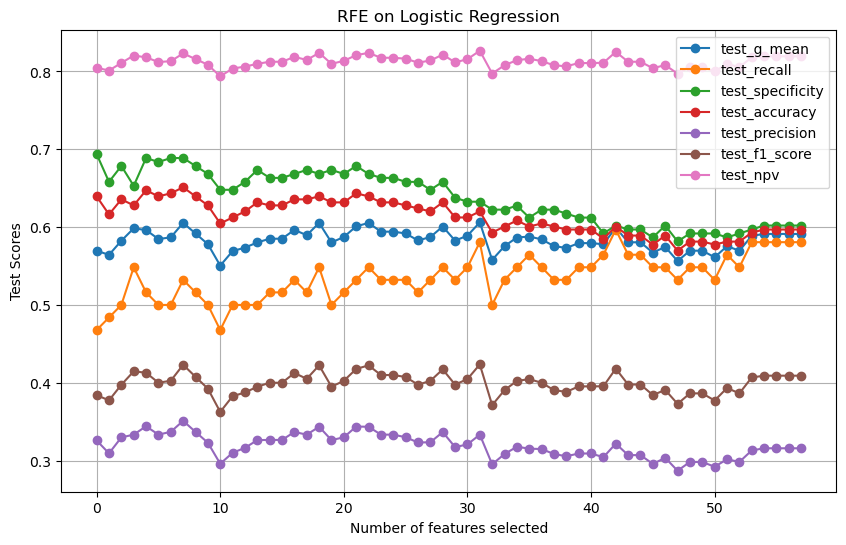

In [263]:
df = ho_t05
estimator = ho_t05_logreg_be
label_col = 'home_ownership_class'
random_state = 0
importance_getter = 'named_steps.classifier.coef_'

ho_t05_logreg_rfe = []
for n_features in range(1, 59):
    res = rfe_fitter(df, estimator, n_features, label_col,
                     importance_getter, random_state)
    ho_t05_logreg_rfe.append(res)
    
plt.figure(figsize=(10, 6))

ho_t05_logreg_rfe = pd.DataFrame(ho_t05_logreg_rfe)

cols = ho_t05_logreg_rfe.columns.tolist()
cols.remove('selected_features')
cols.remove('runtime')

for column in cols:
    plt.plot(ho_t05_logreg_rfe.index, ho_t05_logreg_rfe[column],
             marker='o', linestyle='-', label=column)

plt.title('RFE on Logistic Regression')
plt.xlabel('Number of features selected')
plt.ylabel('Test Scores')
plt.legend()
plt.grid(True)
plt.show()

Number of features: 1
Test G-mean: 0.43029606905491014
Test Recall: 0.2903225806451613
Test Specificity: 0.6377551020408163
Runtime: 0.000260464350382487

Number of features: 2
Test G-mean: 0.5073521344015065
Test Recall: 0.3709677419354839
Test Specificity: 0.6938775510204082
Runtime: 9.987751642862956e-05

Number of features: 3
Test G-mean: 0.5141993014960116
Test Recall: 0.43548387096774194
Test Specificity: 0.6071428571428571
Runtime: 0.0002605477968851725

Number of features: 4
Test G-mean: 0.5220610393133421
Test Recall: 0.5806451612903226
Test Specificity: 0.46938775510204084
Runtime: 0.00016668240229288737

Number of features: 5
Test G-mean: 0.5621364306719596
Test Recall: 0.6451612903225806
Test Specificity: 0.4897959183673469
Runtime: 0.00015865564346313478

Number of features: 6
Test G-mean: 0.4981863089447693
Test Recall: 0.46774193548387094
Test Specificity: 0.5306122448979592
Runtime: 0.0005365133285522461

Number of features: 7
Test G-mean: 0.5175491695067657
Test Recall

Number of features: 58
Test G-mean: 0.5258304820496189
Test Recall: 0.5161290322580645
Test Specificity: 0.5357142857142857
Runtime: 0.0002705097198486328



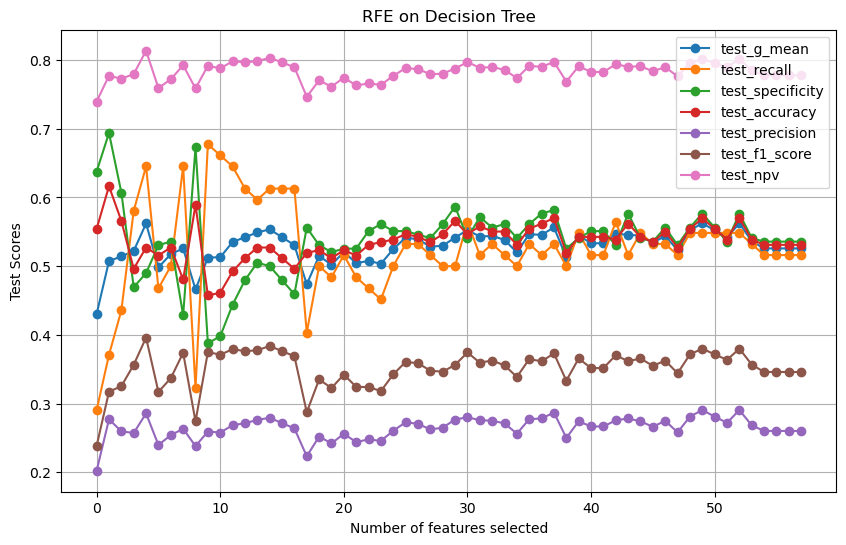

In [265]:
df = ho_t05
estimator = ho_t05_dt_be
label_col = 'home_ownership_class'
random_state = 0
importance_getter = 'named_steps.classifier.feature_importances_'

ho_t05_dt_rfe = []
for n_features in range(1, 59):
    res = rfe_fitter(df, estimator, n_features, label_col,
                     importance_getter, random_state)
    ho_t05_dt_rfe.append(res)
    
plt.figure(figsize=(10, 6))

ho_t05_dt_rfe = pd.DataFrame(ho_t05_dt_rfe)

cols = ho_t05_dt_rfe.columns.tolist()
cols.remove('selected_features')
cols.remove('runtime')

for column in cols:
    plt.plot(ho_t05_dt_rfe.index, ho_t05_dt_rfe[column],
             marker='o', linestyle='-', label=column)

plt.title('RFE on Decision Tree')
plt.xlabel('Number of features selected')
plt.ylabel('Test Scores')
plt.legend()
plt.grid(True)
plt.show()

In [279]:
ho_t05.iloc[44, :]

userId                                                  9865
lastFirstName                                 MANZO, JOVILYN
age                                                       25
basicMonthlySalary                                     16000
preferredNetDisposableIncomeId                             2
workingFamilyCount                                         3
residentsCount                                            10
food                                                    2000
hygiene                                                 1000
houseCleaning                                           1000
fare                                                       0
parking                                                    0
gasoline                                                   0
tuition                                                    0
allowance                                                  0
uniform                                                    0
otherEducation          

Number of features: 1
Test G-mean: 0.5192159988446245
Test Recall: 0.5806451612903226
Test Specificity: 0.4642857142857143
Runtime: 14.669894456863403 secs

Number of features: 2
Test G-mean: 0.5479028183484553
Test Recall: 0.5161290322580645
Test Specificity: 0.5816326530612245
Runtime: 14.517741441726685 secs

Number of features: 3
Test G-mean: 0.504260975098452
Test Recall: 0.4838709677419355
Test Specificity: 0.5255102040816326
Runtime: 14.280360460281372 secs

Number of features: 4
Test G-mean: 0.5730104831718916
Test Recall: 0.6129032258064516
Test Specificity: 0.5357142857142857
Runtime: 14.011446237564087 secs

Number of features: 5
Test G-mean: 0.5784419835851563
Test Recall: 0.6129032258064516
Test Specificity: 0.5459183673469388
Runtime: 13.703061819076538 secs

Number of features: 6
Test G-mean: 0.5850901473955347
Test Recall: 0.6451612903225806
Test Specificity: 0.5306122448979592
Runtime: 13.538641214370728 secs

Number of features: 7
Test G-mean: 0.5693366085178009
Test 

Number of features: 54
Test G-mean: 0.5514956622112163
Test Recall: 0.532258064516129
Test Specificity: 0.5714285714285714
Runtime: 0.9864962100982666 secs

Number of features: 55
Test G-mean: 0.5514956622112163
Test Recall: 0.532258064516129
Test Specificity: 0.5714285714285714
Runtime: 0.6176047325134277 secs

Number of features: 56
Test G-mean: 0.5514956622112163
Test Recall: 0.532258064516129
Test Specificity: 0.5714285714285714
Runtime: 0.6305227279663086 secs

Number of features: 57
Test G-mean: 0.5514956622112163
Test Recall: 0.532258064516129
Test Specificity: 0.5714285714285714
Runtime: 0.6355268955230713 secs

Number of features: 58
Test G-mean: 0.5514956622112163
Test Recall: 0.532258064516129
Test Specificity: 0.5714285714285714
Runtime: 0.6816234588623047 secs



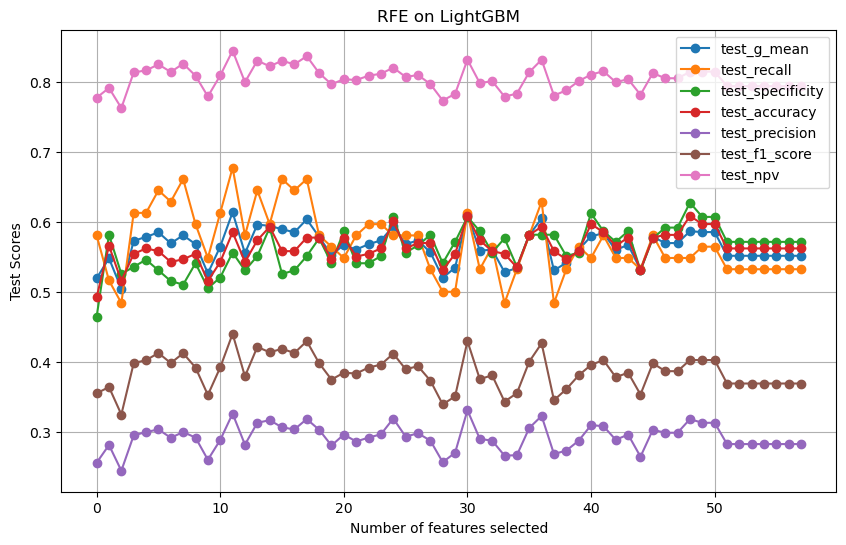

In [281]:
df = ho_t05
estimator = ho_t05_lgbm_be
label_col = 'home_ownership_class'
random_state = 0
importance_getter = 'named_steps.classifier.feature_importances_'

ho_t05_lgbm_rfe = []
for n_features in range(1, 59):
    res = rfe_fitter(df, estimator, n_features, label_col,
                     importance_getter, random_state)
    ho_t05_lgbm_rfe.append(res)
    
plt.figure(figsize=(10, 6))

ho_t05_lgbm_rfe = pd.DataFrame(ho_t05_lgbm_rfe)

cols = ho_t05_lgbm_rfe.columns.tolist()
cols.remove('selected_features')
cols.remove('runtime')

for column in cols:
    plt.plot(ho_t05_lgbm_rfe.index, ho_t05_lgbm_rfe[column],
             marker='o', linestyle='-', label=column)

plt.title('RFE on LightGBM')
plt.xlabel('Number of features selected')
plt.ylabel('Test Scores')
plt.legend()
plt.grid(True)
plt.show()

Number of features: 1
Test G-mean: 0.5696978398265997
Test Recall: 0.46774193548387094
Test Specificity: 0.6938775510204082
Runtime: 16.921921253204346 secs

Number of features: 2
Test G-mean: 0.5612574052230482
Test Recall: 0.46774193548387094
Test Specificity: 0.673469387755102
Runtime: 16.834123849868774 secs

Number of features: 3
Test G-mean: 0.5633793689549301
Test Recall: 0.46774193548387094
Test Specificity: 0.6785714285714286
Runtime: 16.565842390060425 secs

Number of features: 4
Test G-mean: 0.5128371817483028
Test Recall: 0.7580645161290323
Test Specificity: 0.3469387755102041
Runtime: 16.380915641784668 secs

Number of features: 5
Test G-mean: 0.5192159988446245
Test Recall: 0.45161290322580644
Test Specificity: 0.5969387755102041
Runtime: 16.07769513130188 secs

Number of features: 6
Test G-mean: 0.5187403084114153
Test Recall: 0.4838709677419355
Test Specificity: 0.5561224489795918
Runtime: 16.261988401412964 secs

Number of features: 7
Test G-mean: 0.43287014626633386
T

Number of features: 54
Test G-mean: 0.5647652981560717
Test Recall: 0.5483870967741935
Test Specificity: 0.5816326530612245
Runtime: 0.9430930614471436 secs

Number of features: 55
Test G-mean: 0.5647652981560717
Test Recall: 0.5483870967741935
Test Specificity: 0.5816326530612245
Runtime: 0.6192889213562012 secs

Number of features: 56
Test G-mean: 0.5647652981560717
Test Recall: 0.5483870967741935
Test Specificity: 0.5816326530612245
Runtime: 0.6281185150146484 secs

Number of features: 57
Test G-mean: 0.5647652981560717
Test Recall: 0.5483870967741935
Test Specificity: 0.5816326530612245
Runtime: 0.6287078857421875 secs

Number of features: 58
Test G-mean: 0.5647652981560717
Test Recall: 0.5483870967741935
Test Specificity: 0.5816326530612245
Runtime: 0.6178045272827148 secs



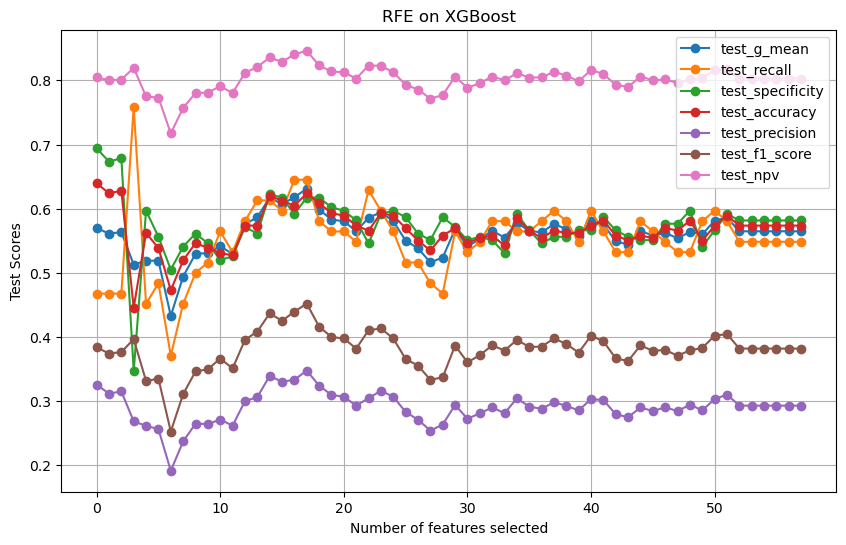

In [286]:
df = ho_t05
estimator = ho_t05_xgb_be
label_col = 'home_ownership_class'
random_state = 0
importance_getter = 'named_steps.classifier.feature_importances_'

ho_t05_xgb_rfe = []
for n_features in range(1, 59):
    res = rfe_fitter(df, estimator, n_features, label_col,
                     importance_getter, random_state)
    ho_t05_xgb_rfe.append(res)
    
plt.figure(figsize=(10, 6))

ho_t05_xgb_rfe = pd.DataFrame(ho_t05_xgb_rfe)

cols = ho_t05_xgb_rfe.columns.tolist()
cols.remove('selected_features')
cols.remove('runtime')

for column in cols:
    plt.plot(ho_t05_xgb_rfe.index, ho_t05_xgb_rfe[column],
             marker='o', linestyle='-', label=column)

plt.title('RFE on XGBoost')
plt.xlabel('Number of features selected')
plt.ylabel('Test Scores')
plt.legend()
plt.grid(True)
plt.show()

Number of features: 1
Test G-mean: 0.5321308723482622
Test Recall: 0.5967741935483871
Test Specificity: 0.4744897959183674
Runtime: 39.84539246559143 secs

Number of features: 2
Test G-mean: 0.564473806369864
Test Recall: 0.5161290322580645
Test Specificity: 0.6173469387755102
Runtime: 38.50016260147095 secs

Number of features: 3
Test G-mean: 0.56542060523958
Test Recall: 0.5967741935483871
Test Specificity: 0.5357142857142857
Runtime: 37.886855125427246 secs

Number of features: 4
Test G-mean: 0.5734411562752849
Test Recall: 0.5967741935483871
Test Specificity: 0.5510204081632653
Runtime: 37.5709228515625 secs

Number of features: 5
Test G-mean: 0.5838229551182239
Test Recall: 0.6129032258064516
Test Specificity: 0.5561224489795918
Runtime: 35.2263617515564 secs

Number of features: 6
Test G-mean: 0.5619900219103484
Test Recall: 0.6129032258064516
Test Specificity: 0.5153061224489796
Runtime: 38.2966148853302 secs

Number of features: 7
Test G-mean: 0.5627216847926503
Test Recall: 0.

Number of features: 54
Test G-mean: 0.5937462102716796
Test Recall: 0.5806451612903226
Test Specificity: 0.6071428571428571
Runtime: 2.022484064102173 secs

Number of features: 55
Test G-mean: 0.5780150365591532
Test Recall: 0.5645161290322581
Test Specificity: 0.5918367346938775
Runtime: 1.3502857685089111 secs

Number of features: 56
Test G-mean: 0.5780150365591532
Test Recall: 0.5645161290322581
Test Specificity: 0.5918367346938775
Runtime: 1.3725371360778809 secs

Number of features: 57
Test G-mean: 0.5780150365591532
Test Recall: 0.5645161290322581
Test Specificity: 0.5918367346938775
Runtime: 1.3423552513122559 secs

Number of features: 58
Test G-mean: 0.5780150365591532
Test Recall: 0.5645161290322581
Test Specificity: 0.5918367346938775
Runtime: 1.3447213172912598 secs



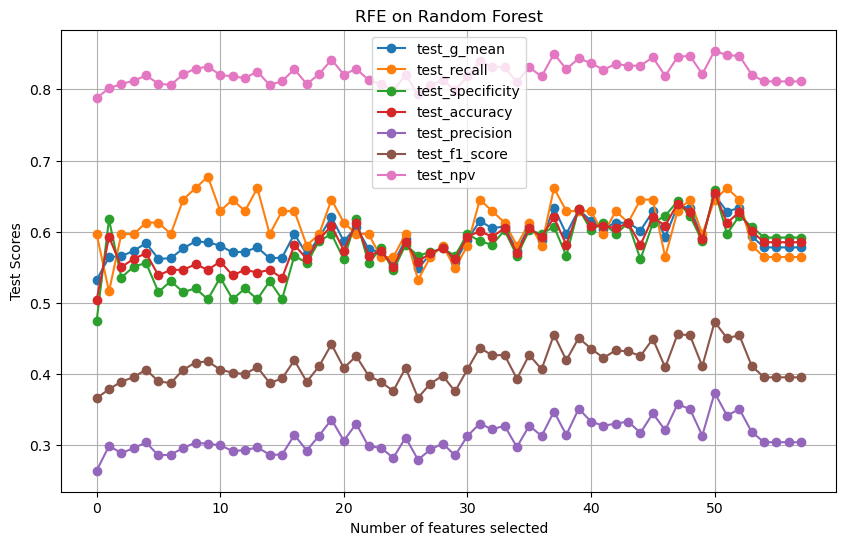

In [287]:
df = ho_t05
estimator = ho_t05_rf_be
label_col = 'home_ownership_class'
random_state = 0
importance_getter = 'named_steps.classifier.feature_importances_'

ho_t05_rf_rfe = []
for n_features in range(1, 59):
    res = rfe_fitter(df, estimator, n_features, label_col,
                     importance_getter, random_state)
    ho_t05_rf_rfe.append(res)
    
plt.figure(figsize=(10, 6))

ho_t05_rf_rfe = pd.DataFrame(ho_t05_rf_rfe)

cols = ho_t05_rf_rfe.columns.tolist()
cols.remove('selected_features')
cols.remove('runtime')

for column in cols:
    plt.plot(ho_t05_rf_rfe.index, ho_t05_rf_rfe[column],
             marker='o', linestyle='-', label=column)

plt.title('RFE on Random Forest')
plt.xlabel('Number of features selected')
plt.ylabel('Test Scores')
plt.legend()
plt.grid(True)
plt.show()

Number of features: 1
Test G-mean: 0.6386189015230355
Test Recall: 0.6774193548387096
Test Specificity: 0.6020408163265306
Runtime: 14.784979820251465 secs

Number of features: 2
Test G-mean: 0.6253373020036115
Test Recall: 0.7096774193548387
Test Specificity: 0.5510204081632653
Runtime: 14.950845956802368 secs

Number of features: 3
Test G-mean: 0.5643280040152764
Test Recall: 0.4838709677419355
Test Specificity: 0.6581632653061225
Runtime: 13.225843667984009 secs

Number of features: 4
Test G-mean: 0.5918722038814226
Test Recall: 0.532258064516129
Test Specificity: 0.6581632653061225
Runtime: 14.369393348693848 secs

Number of features: 5
Test G-mean: 0.6493527440267849
Test Recall: 0.6774193548387096
Test Specificity: 0.6224489795918368
Runtime: 13.68837571144104 secs

Number of features: 6
Test G-mean: 0.6466859863774369
Test Recall: 0.6774193548387096
Test Specificity: 0.6173469387755102
Runtime: 13.90309476852417 secs

Number of features: 7
Test G-mean: 0.6191214655233315
Test Re

Number of features: 54
Test G-mean: 0.6191214655233315
Test Recall: 0.5483870967741935
Test Specificity: 0.6989795918367347
Runtime: 1.2879245281219482 secs

Number of features: 55
Test G-mean: 0.6191214655233315
Test Recall: 0.5483870967741935
Test Specificity: 0.6989795918367347
Runtime: 0.761300802230835 secs

Number of features: 56
Test G-mean: 0.6191214655233315
Test Recall: 0.5483870967741935
Test Specificity: 0.6989795918367347
Runtime: 0.8396217823028564 secs

Number of features: 57
Test G-mean: 0.6191214655233315
Test Recall: 0.5483870967741935
Test Specificity: 0.6989795918367347
Runtime: 0.7550718784332275 secs

Number of features: 58
Test G-mean: 0.6191214655233315
Test Recall: 0.5483870967741935
Test Specificity: 0.6989795918367347
Runtime: 0.73386549949646 secs



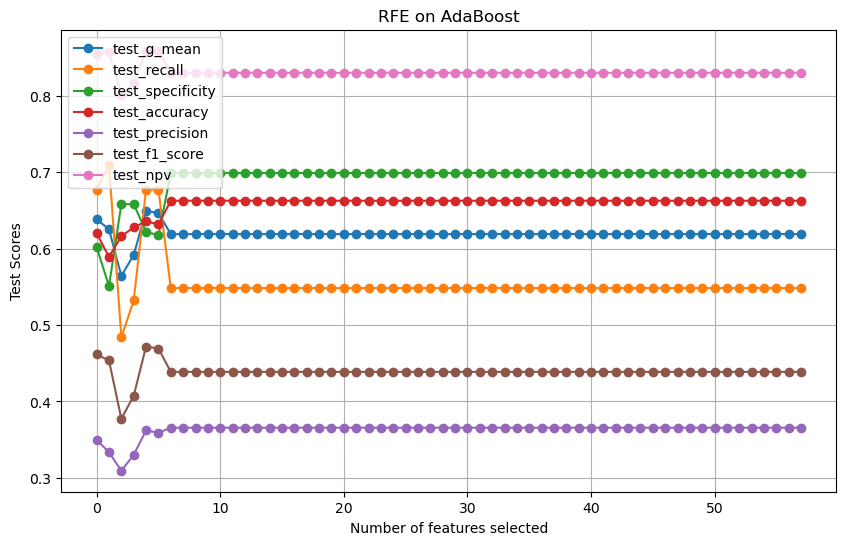

In [292]:
df = ho_t05
estimator = ho_t02_adaboost_be
label_col = 'home_ownership_class'
random_state = 0
importance_getter = 'named_steps.classifier.feature_importances_'

ho_t05_adaboost_rfe = []
for n_features in range(1, 59):
    res = rfe_fitter(df, estimator, n_features, label_col,
                     importance_getter, random_state)
    ho_t05_adaboost_rfe.append(res)
    
plt.figure(figsize=(10, 6))

ho_t05_adaboost_rfe = pd.DataFrame(ho_t05_adaboost_rfe)

cols = ho_t05_adaboost_rfe.columns.tolist()
cols.remove('selected_features')
cols.remove('runtime')

for column in cols:
    plt.plot(ho_t05_adaboost_rfe.index, ho_t05_adaboost_rfe[column],
             marker='o', linestyle='-', label=column)

plt.title('RFE on AdaBoost')
plt.xlabel('Number of features selected')
plt.ylabel('Test Scores')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
df = ho_t02
estimator = ho_t02_gbm_be
label_col = 'home_ownership_class'
random_state = 0
importance_getter = 'named_steps.classifier.feature_importances_'

ho_t02_gbm_rfe = []
for n_features in range(1, 105):
    res = rfe_fitter(df, estimator, n_features, label_col,
                                importance_getter, random_state)
    ho_t02_gbm_rfe.append(res)
    
plt.figure(figsize=(8, 6))

ho_t02_gbm_rfe = pd.DataFrame(ho_t02_gbm_rfe)

for column in ho_t02_gbm_rfe.columns:
    plt.plot(ho_t02_gbm_rfe.index, ho_t02_gbm_rfe[column],
             marker='o', linestyle='-', label=column)

plt.title('RFE on Gradient Boosting Method (GBM)')
plt.xlabel('Number of features selected')
plt.ylabel('Scores')
plt.legend()
plt.grid(True)
plt.show()

## HO_T06

In [324]:
ho_t05_best_features = ho_t05_adaboost_rfe.loc[5, 'selected_features'] + 2
# ho_t05_adaboost_rfe
# ho5_best_features
ho_t05_best_features = (['userId', 'lastFirstName'] +
                        ho_t05.columns[ho_t05_best_features].tolist() +
                        ['home_ownership_class'])
# # ho_t05_best_features = df.drop(columns=columns_to_drop)

ho_t06 = ho_t05.copy()[ho_t05_best_features]
ho_t06

,userId,lastFirstName,basicMonthlySalary,preferredNetDisposableIncomeId,hygiene,otherEducation,clothing,houseExtendedFamily,home_ownership_class
0,370,"IBALI, HOWARD",19000,2,500,0,0,1,1
1,1025,"PATALINGHOG, KIMBERLY",15000,3,3000,0,0,0,0
2,1105,"TEMILLOSO, DENNIS",20000,2,500,50,200,1,0
3,1719,"OSCARES, ELMER",21200,2,500,0,200,0,1
4,2081,"LEGASPI, MANNY",19800,2,2000,0,1500,0,0
...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",19000,2,1000,1000,1,0,0
1066,12852,"TEJADA, JERIC",20000,2,500,0,0,0,0
1067,12853,"RAMOS, RHEALYN",13962,1,2,0,0,0,0
1068,12854,"BURGOS, LIEZEL",51000,2,3000,0,500,0,0


In [325]:
ho_t06_logreg_gs, ho_t06_logreg_be, ho_t06_logreg_model_info, ho_t06_logreg_metrics_df = logreg_class(ho_t06, g_mean_scorer,
                                                                                                      'home_ownership_class', random_state=0)

Fitting 10 folds for each of 312 candidates, totalling 3120 fits
Best Hyperparameters: {'classifier__C': 0.1, 'classifier__penalty': 'l2', 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.6033095256929011
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.1, random_state=0,
                                    solver='newton-cholesky'))])
GridSearchCV Runtime: 0.09922982454299926
Run 1 - Random State: 0
Test G-mean: 0.5839638900521098
Run 2 - Random State: 1
Test G-mean: 0.55171943810284
Run 3 - Random State: 2
Test G-mean: 0.6193872399358835
Run 4 - Random State: 3
Test G-mean: 0.6205818162432287
Run 5 - Random State: 4
Test G-mean: 0.5646924393157821
Ave Test G-mean: 0.5880689647299688
Stdev Test G-mean: 0.03131501852132602
Ave Test Specificity: 0.6428571428571429
Ave Test Recall: 0.54193

In [326]:
ho_t06_dt_gs, ho_t06_dt_be, ho_t06_dt_model_info, ho_t06_dt_metrics_df = dt_class(ho_t06, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 972 candidates, totalling 9720 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.5834819335317676
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=5,
                                        random_state=0))])
GridSearchCV Runtime: 0.34019939104715985
Run 1 - Random State: 0
Test G-mean: 0.5543977035425194
Run 2 - Random State: 1
Test G-mean: 0.549252888941454
Run 3 - Random State: 2
Test G-mean: 0.5805011342110163
Run 4 - Random State: 3
Test G-mean: 0.5656388722252198
Run 5 - Random State: 4
Test G-mean: 0.586565078382959
Ave Test G-mean: 0.5672711354606338
Stdev Test 

In [327]:
ho_t06_lgbm_gs, ho_t06_lgbm_be, ho_t06_lgbm_model_info, ho_t06_lgbm_metrics_df = lgbm_class(ho_t06, g_mean_scorer,
                                                                    'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 50, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.5798751490564216
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.2,
                                n_estimators=50, random_state=0))])
GridSearchCV Runtime: 0.5593788107236226
Run 1 - Random State: 0
Test G-mean: 0.5968564788564029
Run 2 - Random State: 1
Test G-mean: 0.6036426620632478
Run 3 - Random State: 2
Test G-mean: 0.5574322774207351
Run 4 - Random State: 3
Test G-mean: 0.5784419835851563
Run 5 - Random State: 4
Test G-mean: 0.5732258601699772
Ave Test G-mean: 0.5819198524191039
Stdev Test G-mean: 0.0185896857848

In [328]:
ho_t06_xgb_gs, ho_t06_xgb_be, ho_t06_xgb_model_info, ho_t06_xgb_metrics_df = xgb_class(ho_t06, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 50, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.567954572393912
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                           

In [329]:
ho_t06_adaboost_gs, ho_t06_adaboost_be, ho_t06_adaboost_model_info, ho_t06_adaboost_metrics_df = adaboost_class(ho_t06, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 200, 'resampling': SMOTENC(categorical_features=[5], random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.6113575342345406
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling',
                 SMOTENC(categorical_features=[5], random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME', learning_rate=0.2,
                                    n_estimators=200, random_state=0))])
GridSearchCV Runtime: 1.0559244712193807
Run 1 - Random State: 0
Test G-mean: 0.6179906491172122
Run 2 - Random State: 1
Test G-mean: 0.5913853810004884
Run 3 - Random State: 2
Test G-mean: 0.6189220598177385
Run 4 - Random State: 3
Test G-mean: 0.5989897134016802
Run 5 - Random State: 4
Test G-mean: 0.5624291338579865
Ave Test G-mean

In [330]:
ho_t06_rf_gs, ho_t06_rf_be, ho_t06_rf_model_info, ho_t06_rf_metrics_df = rf_class(ho_t06, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__n_estimators': 50, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.6084488877416054
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=5, n_estimators=50,
                                        random_state=0))])
GridSearchCV Runtime: 1.8094768881797791
Run 1 - Random State: 0
Test G-mean: 0.6597249411876259
Run 2 - Random State: 1
Test G-mean: 0.5895038696875224
Run 3 - Random State: 2
Test G-mean: 0.5918026822738671
Run 4 - Random State: 3
Test G-mean: 0.6119691610812992
Run 5 - Random State: 4
Test G-mean: 0.6174577836168603
Ave Test G-mean: 0.614091687569435
Stdev Test G-mean: 0.028282459680583908
Ave Test Specific

In [331]:
ho_t06_knn_gs, ho_t06_knn_be, ho_t06_knn_model_info, ho_t06_knn_metrics_df = knn_class(ho_t06, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__metric': 'braycurtis', 'classifier__n_neighbors': 14, 'resampling': SMOTE(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.6057669405780797
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='braycurtis', n_neighbors=14))])
GridSearchCV Runtime: 0.5817862669626872
Run 1 - Random State: 0
Test G-mean: 0.5451926476406983
Run 2 - Random State: 1
Test G-mean: 0.5211144183363429
Run 3 - Random State: 2
Test G-mean: 0.5612574052230482
Run 4 - Random State: 3
Test G-mean: 0.5679618342470648
Run 5 - Random State: 4
Test G-mean: 0.5780862162942373
Ave Test G-mean: 0.5547225043482783
Stdev Test G-mean: 0.02227200841728455
Ave Test Specificity: 0.6775510204081633
Ave Test Recall: 0.4548387096774194
Ave Test NPV: 0.7971431616320498
Ave Test

In [332]:
ho_t06_gbm_gs, ho_t06_gbm_be, ho_t06_gbm_model_info, ho_t06_gbm_metrics_df = gbm_class(ho_t06, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__learning_rate': 0.01, 'classifier__max_depth': 5, 'classifier__n_estimators': 50, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.5897334071021708
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(learning_rate=0.01, max_depth=5,
                                            n_estimators=50, random_state=0))])
GridSearchCV Runtime: 6.589456800619761
Run 1 - Random State: 0
Test G-mean: 0.601183822262458
Run 2 - Random State: 1
Test G-mean: 0.549252888941454
Run 3 - Random State: 2
Test G-mean: 0.5281727229607653
Run 4 - Random State: 3
Test G-mean: 0.5548428242112086
Run 5 - Random State: 4
Test G-mean: 0.586565078382959
Ave Test G-mean: 0.564003467351769
Stdev Test G-mean: 0.0294819617

In [333]:
model_vars = ['knn', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'k-Nearest Neighbors',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t06_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t06_summ = pd.DataFrame(var_df)

columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


selected_columns = [col for col in ho_t06_summ.columns if col not in columns_to_exclude]
ho_t06_summ[selected_columns]

,Classifier model,Best CV Score (G-mean),Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test Accuracy,Average Test Precision,Average Test F1-score
0,k-Nearest Neighbors,0.605767,0.554723,0.022272,0.677551,0.454839,0.797143,0.624031,0.308743,0.367595
1,Logistic Regression,0.603310,0.588069,0.031315,0.642857,0.541935,0.816616,0.618605,0.324479,0.404836
2,Decision Tree,0.583482,0.567271,0.016127,0.485714,0.670968,0.825041,0.530233,0.292844,0.406567
3,Random Forest,0.608449,0.614092,0.028282,0.591837,0.638710,0.837708,0.603101,0.332817,0.436971
4,Gradient Boosting Machine (GBM),0.589733,0.564003,0.029482,0.582653,0.551613,0.804438,0.575194,0.295954,0.383876
5,LightGBM,0.579875,0.581920,0.018590,0.582653,0.583871,0.816382,0.582946,0.306494,0.401499
6,Extreme Gradient Boosting (XGBoost),0.567955,0.591948,0.033801,0.587755,0.596774,0.821246,0.589922,0.315197,0.412227
7,AdaBoost,0.611358,0.597943,0.023170,0.622449,0.577419,0.823667,0.611628,0.326618,0.416385


In [370]:
# pipeline = Pipeline([
#     ('encoder', None),
#     ('scaler', None),
#     ('resampling', None),
#     ('classifier', LogisticRegression(random_state=random_state,
#                                       solver='newton-cholesky'))
# ])

# ohe = OneHotEncoder(categories=['job', 'province', 'gender'], sparse_output=False)
ho_t07 = ho_t07.drop(columns=['gender', 'province', 'job'])
# display(ohe.fit_transform(ho_t07).shape)

In [481]:
# ho_t07_rf_be.named_steps.resampling.keys()
isinstance(ho_t07_rf_be.named_steps['classifier'], RandomForestClassifier)

True

## HO_T07

In [722]:
from sklearn.decomposition import PCA

from imblearn.over_sampling import SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler, EditedNearestNeighbours, TomekLinks
from imblearn.combine import SMOTEENN, SMOTETomek

from imblearn.pipeline import Pipeline
# from sklearn.pipeline import Pipeline

from sklearn.base import BaseEstimator, TransformerMixin

class DropCategoricalFeatures(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        # Assuming X is a DataFrame
        non_categorical_cols = X.select_dtypes(exclude=['object']).columns.tolist()
        return X[non_categorical_cols]


def knn_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', KNeighborsClassifier())
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
        'scaler': [RobustScaler(),
                   PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_neighbors': list(range(1, 16)),
        'classifier__metric': ['euclidean', 'cosine', 'hamming', 'braycurtis',
                               'chebyshev', 'canberra', 'cityblock', 'sqeuclidean']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def logreg_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
#         ('drop_categorical', None),
#         ('encoder', None),
        ('scaler', None),
        ('resampling', None),
        ('classifier', LogisticRegression(random_state=random_state, max_iter=1000))
    ])

    param_grid = {
#         'drop_categorical': [None, DropCategoricalFeatures()]
#         'encoder': [None, OneHotEncoder(sparse_output=False)],
        'scaler': [RobustScaler(),
                   PowerTransformer()],
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
                       SMOTEENN(random_state=random_state),
                       SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
                       TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__C': list(np.logspace(-6, 6, num=13)),
        'classifier__penalty': ['l1', 'l2', None],
        'classifier__solver': ['liblinear', 'lbfgs', 'newton-cholesky']
#         'classifier__penalty': ['l1', l2', 'elasticnet', 'None']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
            isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
            modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

        fpr, tpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
        ix = np.argmax(gmeans)
        print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.plot(fpr_fine, tpr_fine, marker='.', label='Fine')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')
        # axis labels
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.legend()
        # show the plot
        plt.show()
        
        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def sgd_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', None),
        ('resampling', None),
        ('classifier', SGDClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [StandardScaler(),
                   MinMaxScaler(),
                   RobustScaler()],
        'resampling': [SMOTE(random_state=random_state),
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       ADASYN(random_state=random_state),
#                        RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__alpha': list(np.logspace(-6, 6, num=13)),
        'classifier__penalty': ['l1', 'l2', 'elasticnet', None],
        'classifier__loss': ['hinge', 'log_loss', 'log', 'modified_huber', 'squared_hinge',
                             'perceptron', 'squared_error', 'huber', 'epsilon_insensitive',
                             'squared_epsilon_insensitive']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def dt_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
#         ('scaler', None),
        ('resampling', None),
        ('classifier', DecisionTreeClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [None, RobustScaler(),
#                    PowerTransformer()],
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
                       SMOTEENN(random_state=random_state),
                       SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
                       TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__max_depth': [None, 5, 10],
        'classifier__min_samples_split': [2, 3, 5],
        'classifier__min_samples_leaf': [1, 2, 3],
        'classifier__criterion': ["gini", "entropy", "log_loss"]
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
            isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
            modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def rf_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
#         ('scaler', None),
        ('resampling', None),
        ('classifier', RandomForestClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
                       SMOTEENN(random_state=random_state),
                       SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
                       TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__max_depth': [None, 5, 10],
        'classifier__criterion': ["gini", "entropy", "log_loss"]
    }
#         'classifier__min_samples_split': [2, 3, 5],
#         'classifier__min_samples_leaf': [1, 2, 3],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
            isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
            modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def gbm_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
#         ('scaler', None),
        ('resampling', None),
        ('classifier', GradientBoostingClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
                       SMOTEENN(random_state=random_state),
                       SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
                       TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__max_depth': [None, 5, 10],
        'classifier__learning_rate': [0.01, 0.1, 0.2]
    }
#         'loss': ['log_loss', 'deviance', 'exponential']
#         'min_samples_leaf': [1, 2, 3],
#         'min_samples_split': [2, 3, 5],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
            isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
            modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def lgbm_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     plt.figure(figsize=(10, 6))
#     plt.plot(range(1, len(explained_var_ratio)+1), cumulative_explained_var, marker='o', linestyle='--')
#     plt.title('Cumulative Explained Variance Plot')
#     plt.xlabel('Number of Components')
#     plt.ylabel('Cumulative Explained Variance')
#     plt.grid(True)
#     plt.show()

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
#         ('scaler', None),
        ('resampling', None),
        ('classifier', LGBMClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
                       SMOTEENN(random_state=random_state),
                       SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
                       TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__learning_rate': [0.01, 0.1, 0.2],
        'classifier__boosting_type': ['gbdt', 'dart', 'goss']
    }
#         'classifier__num_leaves': [20, 31, 40],
#         'classifier__min_child_samples': [10, 20, 30],
#         'classifier__max_depth': [-1, 5, 10],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
            isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
            modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def xgb_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
#         ('scaler', None),
        ('resampling', None),
        ('classifier', XGBClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
                       SMOTEENN(random_state=random_state),
                       SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
                       TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__learning_rate': [0.01, 0.1, 0.2],
        'classifier__grow_policy': ['depthwise', 'lossguide']
    }
#         'classifier__max_depth': [None, 5, 10],
#         'classifier__max_leaves': [0, 10, 20],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
            isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
            modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def adaboost_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
#         ('scaler', None),
        ('resampling', None),
        ('classifier', AdaBoostClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
# #                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
                       SMOTEENN(random_state=random_state),
                       SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
                       TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__estimator': [DecisionTreeClassifier(random_state=random_state),
                                  RandomForestClassifier(random_state=random_state)],
        'classifier__learning_rate': [0.01, 0.1, 0.2, 1, 2],
        'classifier__algorithm': ['SAMME', 'SAMME.R']
    }
#         'classifier__max_depth': [None, 5, 10],
#         'classifier__max_leaves': [0, 10, 20],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
            isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
            modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)
        
        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         thresholds_fine = np.linspace(0, 1, 1000)
#         fpr, tpr, _ = roc_curve(y_test, y_hat)
#         fpr_fine, tpr_fine = [], []

#         for thresh in thresholds_fine:
#             preds = np.where(y_hat > thresh, 1, 0)
#             tp = np.sum((preds == 1) & (y_test == 1))
#             fp = np.sum((preds == 1) & (y_test == 0))
#             fn = np.sum((preds == 0) & (y_test == 1))
#             tn = np.sum((preds == 0) & (y_test == 0))

#             fpr_fine.append(fp / (fp + tn))
#             tpr_fine.append(tp / (tp + fn))


        fpr, tpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
        ix = np.argmax(gmeans)
        print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.plot(fpr_fine, tpr_fine, marker='.', label='Fine')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')
        # axis labels
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.legend()
        # show the plot
        plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def adaboost_est_class2(df, estimator, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('resampling', None),
        ('classifier', AdaBoostClassifier(estimator=estimator, random_state=random_state))
    ])

    param_grid = {
        'resampling': [None,
                       SMOTENC(categorical_features=get_cat_cols(X),
                               random_state=random_state),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [50, 100, 200],
        'classifier__learning_rate': [0.01, 0.1, 0.2],
        'classifier__algorithm': ['SAMME', 'SAMME.R']
    }
#         'classifier__max_depth': [None, 5, 10],
#         'classifier__max_leaves': [0, 10, 20],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score:", best_score)
    print('Best Estimator:', best_estimator)
    elapsed_time_cv = (end_time_cv - start_time_cv) / 60
    print('GridSearchCV Runtime:', elapsed_time_cv)

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
        modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
        modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test G-mean: {g_mean}")

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

In [344]:
ho_t07_full

ho_t07_X = ho_t07_full.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
ho_t07_X_num = ho_t07_X.copy().drop(['gender', 'province', 'job'], axis=1)
ho_t07_y = ho_t07_full.copy()[['home_ownership_class']]
ho_t07_X_num

,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily
0,24,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1
1,26,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0
2,40,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1
3,32,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0
4,39,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,34,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,1,500,1,1,1,1,1,1,1,1,1,1,1,2000,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0
1066,27,20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,0,0,0,0,500,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0
1067,27,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,0,1000,0,0,0,300,0,0,0,500,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
1068,48,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,0,500,500,300,500,300,800,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [345]:
selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(ho_t07_X_num)

# Convert the array back to dataframe and retain feature names
ho_t07_X_num_f01 = pd.DataFrame(filtered_data, columns=ho_t07_X_num.columns[selector.get_support()])

display(ho_t07_X_num_f01)

# Getting the boolean mask of retained columns
retained_columns_mask = selector.get_support()

# Using the inverse of the boolean mask to get the column names that were filtered out
filtered_out_columns = ho_t07_X_num.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily
0,24.0,19000.0,2.0,3.0,3.0,40000.0,1000.0,500.0,200.0,200.0,0.0,0.0,0.0,50.0,0.0,0.0,500.0,450.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0
1,26.0,15000.0,3.0,2.0,4.0,30000.0,5000.0,3000.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,200.0,200.0,1000.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0
2,40.0,20000.0,2.0,0.0,3.0,30000.0,3000.0,500.0,300.0,200.0,50.0,50.0,500.0,100.0,100.0,50.0,500.0,100.0,200.0,500.0,0.0,200.0,0.0,100.0,100.0,100.0,200.0,200.0,200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,32.0,21200.0,2.0,0.0,5.0,12000.0,2000.0,500.0,200.0,392.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,200.0,200.0,3000.0,0.0,0.0,0.0,0.0,100.0,200.0,400.0,0.0,0.0,0.0,0.0,0.0,876.0,0.0,0.0,0.0,0.0,0.0,500.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
4,39.0,19800.0,2.0,0.0,0.0,25000.0,5000.0,2000.0,1000.0,1500.0,0.0,0.0,1000.0,500.0,1500.0,0.0,0.0,1000.0,300.0,1900.0,0.0,1000.0,0.0,1000.0,1000.0,1500.0,1500.0,500.0,1600.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,34.0,19000.0,2.0,2.0,4.0,19000.0,5000.0,1000.0,1000.0,1.0,1.0,1.0,1000.0,500.0,1.0,1000.0,1000.0,500.0,200.0,1500.0,5000.0,1000.0,1.0,1.0,1.0,1.0,1.0,500.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1066,27.0,20000.0,2.0,1.0,1.0,20000.0,5000.0,500.0,400.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,0.0,1672.0,0.0,0.0,0.0,0.0,0.0,500.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
1067,27.0,13962.0,1.0,2.0,4.0,40000.0,4.0,2.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,30000.0,1000.0,150.0,1000.0,2000.0,500.0,0.0,1000.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1068,48.0,51000.0,2.0,0.0,5.0,51000.0,5000.0,3000.0,1500.0,2000.0,0.0,0.0,15000.0,9000.0,0.0,0.0,1000.0,1000.0,300.0,800.0,0.0,0.0,0.0,500.0,500.0,300.0,500.0,300.0,800.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


Number of columns: 8
Removed columns: ['loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee']


In [347]:
ho_t07_X_num_f02 = ho_t07_X_num_f01.copy()
cols_to_drop = [
    'smallLottery', 'gambling', 'alcohol', 'smoking',
    'cinema'
]
ho_t07_X_num_f02 = ho_t07_X_num_f01.drop(columns=cols_to_drop)

# Calculate the correlation matrix
correlation_matrix = ho_t07_X_num_f02.corr()

# Find pairs of columns where the correlation is greater than 0.8
# This will ignore the diagonal which will always be 1 (self correlation)
to_drop = set()
for i in range(len(correlation_matrix)):
    for j in range(i+1, len(correlation_matrix)):
        if correlation_matrix.iloc[i, j] >= 0.8:
            colname = correlation_matrix.columns[j]  # Getting the column name
            to_drop.add(colname)
            print(correlation_matrix.columns[i], "|", colname, "| Correlation:",
                  correlation_matrix.iloc[i, j])

print("\nAfter dropping correlated features:")
ho_t07_X_num_f02


After dropping correlated features:


,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,otherVices,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily
0,24.0,19000.0,2.0,3.0,3.0,40000.0,1000.0,500.0,200.0,200.0,0.0,0.0,0.0,50.0,0.0,0.0,500.0,450.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0
1,26.0,15000.0,3.0,2.0,4.0,30000.0,5000.0,3000.0,2000.0,2000.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0.0,200.0,200.0,1000.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0
2,40.0,20000.0,2.0,0.0,3.0,30000.0,3000.0,500.0,300.0,200.0,50.0,50.0,500.0,100.0,100.0,50.0,500.0,100.0,200.0,500.0,0.0,200.0,100.0,100.0,100.0,200.0,200.0,200.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,32.0,21200.0,2.0,0.0,5.0,12000.0,2000.0,500.0,200.0,392.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,200.0,200.0,3000.0,0.0,0.0,0.0,100.0,200.0,400.0,0.0,0.0,0.0,0.0,0.0,876.0,0.0,500.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
4,39.0,19800.0,2.0,0.0,0.0,25000.0,5000.0,2000.0,1000.0,1500.0,0.0,0.0,1000.0,500.0,1500.0,0.0,0.0,1000.0,300.0,1900.0,0.0,1000.0,1000.0,1000.0,1500.0,1500.0,500.0,1600.0,0.0,0.0,0.0,0.0,0.0,0.0,10000.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,34.0,19000.0,2.0,2.0,4.0,19000.0,5000.0,1000.0,1000.0,1.0,1.0,1.0,1000.0,500.0,1.0,1000.0,1000.0,500.0,200.0,1500.0,5000.0,1000.0,1.0,1.0,1.0,1.0,500.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1066,27.0,20000.0,2.0,1.0,1.0,20000.0,5000.0,500.0,400.0,280.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,0.0,1672.0,0.0,500.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
1067,27.0,13962.0,1.0,2.0,4.0,40000.0,4.0,2.0,1.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,30000.0,1000.0,150.0,1000.0,2000.0,500.0,1000.0,0.0,0.0,0.0,300.0,0.0,0.0,0.0,500.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1068,48.0,51000.0,2.0,0.0,5.0,51000.0,5000.0,3000.0,1500.0,2000.0,0.0,0.0,15000.0,9000.0,0.0,0.0,1000.0,1000.0,300.0,800.0,0.0,0.0,500.0,500.0,300.0,500.0,300.0,800.0,0.0,0.0,0.0,0.0,0.0,0.0,1000.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [191]:
# data2 = pd.read_csv('df_merged_no_nans.csv')
# data2[data2['foundInHDMF'] != 'False']

In [348]:
ho_t07_X_num_f02 = ho_t07_full.copy().drop(columns=filtered_out_columns)
ho_t07_X_num_f02 = ho_t07_X_num_f02.copy().drop(columns=cols_to_drop)
ho_t07_X_num_f02

,userId,lastFirstName,age,gender,province,job,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,otherVices,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,home_ownership_class
0,370,"IBALI, HOWARD",24,MALE,METRO MANILA,SERVICE AND SALES,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,2000,0,0,0,1,1,0,1,1
1,1025,"PATALINGHOG, KIMBERLY",26,FEMALE,METRO MANILA,SERVICE AND SALES,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,2000,1,1,1,1,0,1,0,0
2,1105,"TEMILLOSO, DENNIS",40,MALE,METRO MANILA,SERVICE AND SALES,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,100,100,100,200,200,200,0,0,0,0,0,0,1000,0,0,0,1,0,0,1,0
3,1719,"OSCARES, ELMER",32,MALE,UNKNOWN,MACHINE OPERATOR,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,100,200,400,0,0,0,0,0,876,0,500,1,0,0,1,0,1,0,1
4,2081,"LEGASPI, MANNY",39,MALE,METRO MANILA,CLERICAL SUPPORT,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",34,MALE,METRO MANILA,ASSOCIATE PROFESSIONAL,19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,200,1500,5000,1000,1,1,1,1,500,1,1,1,1,1,1,1,2000,0,0,0,1,0,1,0,0
1066,12852,"TEJADA, JERIC",27,MALE,LAGUNA,CRAFT AND TRADE,20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,200,0,0,0,0,0,1672,0,500,1,0,1,1,0,0,0,0
1067,12853,"RAMOS, RHEALYN",27,FEMALE,CAVITE,SERVICE AND SALES,13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,150,1000,2000,500,1000,0,0,0,300,0,0,0,500,0,0,0,2000,0,0,0,1,0,1,0,0
1068,12854,"BURGOS, LIEZEL",48,FEMALE,ILOILO,SERVICE AND SALES,51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,300,800,0,0,500,500,300,500,300,800,0,0,0,0,0,0,1000,0,0,0,0,1,0,0,0


In [349]:
# ho_t02 = pd.concat([ho_t02_X_f02, ho_t02_y], axis=1)
# ho_t02 = pd.merge(ho_t02_X_f02, ho_t02_y, on='userId')

ho_t07 = ho_t07_X_num_f02.copy()

In [389]:
ho_t07_logreg_gs, ho_t07_logreg_be, ho_t07_logreg_model_info, ho_t07_logreg_metrics_df = logreg_class2(ho_t07, g_mean_scorer,
                                                                                                      'home_ownership_class', random_state=0)

Fitting 10 folds for each of 936 candidates, totalling 9360 fits


C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
3120 fits failed out of a total of 9360.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
780 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, in

Best Hyperparameters: {'classifier__C': 0.1, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': RandomOverSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.5829599882773779
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier', LogisticRegression(C=0.1, random_state=0))])
GridSearchCV Runtime: 2.301560644308726
Run 1 - Random State: 0
Test G-mean: 0.5369625991475462
Run 2 - Random State: 1
Test G-mean: 0.5358439258508835


C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#log

Run 3 - Random State: 2
Test G-mean: 0.6255510621948789
Run 4 - Random State: 3
Test G-mean: 0.5427287125678395
Run 5 - Random State: 4
Test G-mean: 0.5477499456871722
Ave Test G-mean: 0.5577672490896639
Stdev Test G-mean: 0.038192325237882026
Ave Test Specificity: 0.6188118811881188
Ave Test Recall: 0.503030303030303
Ave Test NPV: 0.791373545465986
Ave Test Accuracy: 0.5902985074626865
Ave Test Precision: 0.3034652709549495
Ave Test F1-Score: 0.37812272631784827
Ave Runtime: 0.001463910738627116


C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#log

In [393]:
ho_t07_dt_gs, ho_t07_dt_be, ho_t07_dt_model_info, ho_t07_dt_metrics_df = dt_class2(ho_t07, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5681347881102986
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, min_samples_leaf=2,
                                        random_state=0))])
GridSearchCV Runtime: 1.2196590383847554
Run 1 - Random State: 0
Test G-mean: 0.5548250022108844
Run 2 - Random State: 1
Test G-mean: 0.5103195495023294
Run 3 - Random State: 2
Test G-mean: 0.5333183316221977
Run 4 - Random State: 3
Test G-mean: 0.5755285599449702
Run 5 - Random State: 4
Test G-mean: 0.5566470925088534
Ave Test G-mean: 0.546127707157847
Stdev Test G-mean: 0.02498506959320077
Ave Test Specificity: 0.6623762376237623
Ave T

In [394]:
ho_t07_lgbm_gs, ho_t07_lgbm_be, ho_t07_lgbm_model_info, ho_t07_lgbm_metrics_df = lgbm_class2(ho_t07, g_mean_scorer,
                                                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 81 candidates, totalling 810 fits
Best Hyperparameters: {'classifier__boosting_type': 'gbdt', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5802036491445384
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LGBMClassifier(learning_rate=0.2, n_estimators=200,
                                random_state=0))])
GridSearchCV Runtime: 1.264117705821991
Run 1 - Random State: 0
Test G-mean: 0.6022759115450017
Run 2 - Random State: 1
Test G-mean: 0.5945042838654349
Run 3 - Random State: 2
Test G-mean: 0.5842594765287007
Run 4 - Random State: 3
Test G-mean: 0.5398186180691079
Run 5 - Random State: 4
Test G-mean: 0.5975246468308709
Ave Test G-mean: 0.5836765873678232
Stdev Test G-mean: 0.025390962235435244
Ave Test Specificity: 0.595049504950495
Ave Test Recall: 0.5727272727272728
Ave Test NP

In [395]:
ho_t07_xgb_gs, ho_t07_xgb_be, ho_t07_xgb_model_info, ho_t07_xgb_metrics_df = xgb_class2(ho_t07, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 54 candidates, totalling 540 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5940105666871903
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                      

In [396]:
ho_t07_adaboost_gs, ho_t07_adaboost_be, ho_t07_adaboost_model_info, ho_t07_adaboost_metrics_df = adaboost_class2(ho_t07, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 54 candidates, totalling 540 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 50, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.603550709846677
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME', learning_rate=0.1,
                                    random_state=0))])
GridSearchCV Runtime: 1.838051172097524
Run 1 - Random State: 0
Test G-mean: 0.6461360144543232
Run 2 - Random State: 1
Test G-mean: 0.5776100443520124
Run 3 - Random State: 2
Test G-mean: 0.5818795909686458
Run 4 - Random State: 3
Test G-mean: 0.6474117037800746
Run 5 - Random State: 4
Test G-mean: 0.6180114835659464
Ave Test G-mean: 0.6142097674242005
Stdev Test G-mean: 0.03361877046918324
Ave Test Specificity: 0.6366336633663366
Ave Test Recall: 0.5969696969696969
Ave Tes

In [397]:
ho_t07_rf_gs, ho_t07_rf_be, ho_t07_rf_model_info, ho_t07_rf_metrics_df = rf_class2(ho_t07, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 81 candidates, totalling 810 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 10, 'classifier__n_estimators': 100, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5925715223282784
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=10,
                                        random_state=0))])
GridSearchCV Runtime: 2.7181202371915183
Run 1 - Random State: 0
Test G-mean: 0.5900083143321779
Run 2 - Random State: 1
Test G-mean: 0.5973991032541452
Run 3 - Random State: 2
Test G-mean: 0.5818795909686458
Run 4 - Random State: 3
Test G-mean: 0.6100100091155244
Run 5 - Random State: 4
Test G-mean: 0.6050095897259531
Ave Test G-mean: 0.5968613214792893
Stdev Test G-mean: 0.011302515508329804
Ave Test Specificity: 0.6
Ave Test Recall: 0.593939393939394
Ave Test NPV: 0.8

In [386]:
ho_t07_knn_gs, ho_t07_knn_be, ho_t07_knn_model_info, ho_t07_knn_metrics_df = knn_class2(ho_t07, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 720 candidates, totalling 7200 fits
Best Hyperparameters: {'classifier__metric': 'cityblock', 'classifier__n_neighbors': 5, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.5556969630985626
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier', KNeighborsClassifier(metric='cityblock'))])
GridSearchCV Runtime: 1.6839959541956584
Run 1 - Random State: 0
Test G-mean: 0.5271648606261876
Run 2 - Random State: 1
Test G-mean: 0.5193524551759332
Run 3 - Random State: 2
Test G-mean: 0.4871588369035682
Run 4 - Random State: 3
Test G-mean: 0.4559833243433447
Run 5 - Random State: 4
Test G-mean: 0.5921022365317079
Ave Test G-mean: 0.5163523427161483
Stdev Test G-mean: 0.05089360665230919
Ave Test Specificity: 0.5584158415841585
Ave Test Recall: 0.4878787878787879
Ave Test NPV: 0.7713130342922427
Ave Test Accuracy: 0

In [390]:
ho_t07_gbm_gs, ho_t07_gbm_be, ho_t07_gbm_model_info, ho_t07_gbm_metrics_df = gbm_class2(ho_t07, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 162 candidates, totalling 1620 fits
Best Hyperparameters: {'classifier__learning_rate': 0.2, 'classifier__max_depth': 5, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.5920785671434795
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(learning_rate=0.2, max_depth=5,
                                            n_estimators=200,
                                            random_state=0))])
GridSearchCV Runtime: 13.095186837514241
Run 1 - Random State: 0
Test G-mean: 0.5872686680292462
Run 2 - Random State: 1
Test G-mean: 0.5950087424066591
Run 3 - Random State: 2
Test G-mean: 0.6224859427126748
Run 4 - Random State: 3
Test G-mean: 0.572261084012208
Run 5 - Random State: 4
Test G-mean: 0.5886719404433564
Ave Test G-mean: 0.

In [403]:
ho_t07_rf_be.named_steps['classifier']

RandomForestClassifier(criterion='entropy', max_depth=10, random_state=0)

In [411]:
estimator = RandomForestClassifier(criterion='entropy', max_depth=10, random_state=0)
ho_t07_adaboost_est1_gs, ho_t07_adaboost_est1_be, ho_t07_adaboost_est1_model_info, ho_t07_adaboost_est1_metrics_df = adaboost_est_class2(ho_t07,
                                                                                                                                     ho_t07_rf_be.named_steps['classifier'],
                                                                                                                                     g_mean_scorer,
                                                                                                                                     'home_ownership_class',
                                                                                                                                     random_state=0)

Fitting 10 folds for each of 72 candidates, totalling 720 fits


KeyboardInterrupt: 

In [398]:
model_vars = ['knn', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'k-Nearest Neighbors',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t07_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t07_summ = pd.DataFrame(var_df)

columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


selected_columns = [col for col in ho_t07_summ.columns if col not in columns_to_exclude]
ho_t07_summ[selected_columns]

,Classifier model,Best CV Score (G-mean),Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test Accuracy,Average Test Precision,Average Test F1-score
0,k-Nearest Neighbors,0.555697,0.516352,0.050894,0.558416,0.487879,0.771313,0.541045,0.262743,0.340308
1,Logistic Regression,0.582960,0.557767,0.038192,0.618812,0.503030,0.791374,0.590299,0.303465,0.378123
2,Decision Tree,0.568135,0.546128,0.024985,0.662376,0.460606,0.789045,0.612687,0.317123,0.369788
3,Random Forest,0.592572,0.596861,0.011303,0.600000,0.593939,0.818980,0.598507,0.326608,0.421433
4,Gradient Boosting Machine (GBM),0.592079,0.593139,0.018405,0.584158,0.603030,0.818375,0.588806,0.321647,0.419357
5,LightGBM,0.580204,0.583677,0.025391,0.595050,0.572727,0.809714,0.589552,0.316573,0.407654
6,Extreme Gradient Boosting (XGBoost),0.594011,0.590829,0.022259,0.592079,0.590909,0.815677,0.591791,0.322175,0.416524
7,AdaBoost,0.603551,0.614210,0.033619,0.636634,0.596970,0.829816,0.626866,0.348705,0.439221


## HO_T08

Top 20 Features: ['smoking', 'preferredNetDisposableIncomeId', 'monthlyFamilyIncome', 'gasoline', 'water', 'houseCleaning', 'uniform', 'personalCare', 'electricity', 'basicMonthlySalary', 'allowance', 'dineOut', 'mobileLoad', 'food', 'hygiene', 'cinema', 'smallLottery', 'alcohol', 'fare', 'clothing']
Dropped Features: ['age', 'workingFamilyCount', 'residentsCount', 'parking', 'tuition', 'otherEducation', 'emergency', 'medicine', 'rent', 'repair', 'leisure', 'internet', 'vehicleLoan', 'informalLenders', 'companyLoan', 'privateLoans', 'governmentLoans', 'gambling', 'otherVices', 'savings', 'loanOthers', 'payInsurance', 'loanSSS', 'payFamilySupport', 'loanPagIbig', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasPrivateEmployee', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'houseHasOFW', 'houseOnlyFamily', 'houseExtendedFamily']


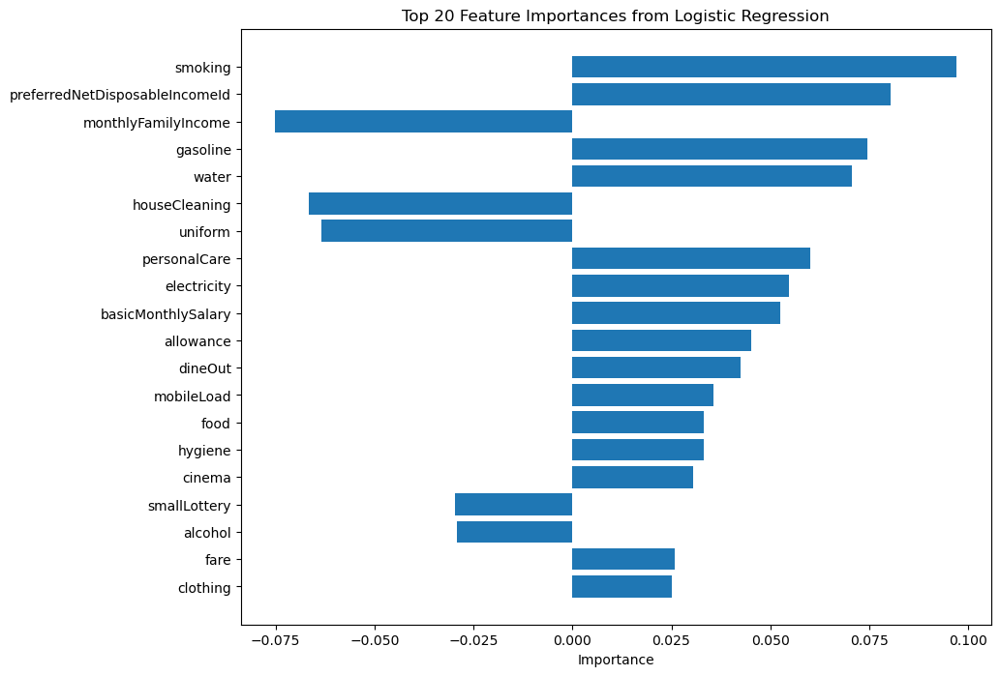

In [451]:
model = ho_t07_logreg_be.named_steps['classifier']
coefficients = model.coef_[0]

# 3. Get Absolute Values of Coefficients
abs_coefficients = abs(coefficients)

# 4. Sort Features Based on Absolute Coefficient Values
sorted_idx = abs_coefficients.argsort()[::-1]
top_20_features = sorted_idx[:20]

# 5. Retain Only the Top 20 Features and Extract the Feature Names
feature_names = list(ho_t07_X_num.columns)  # Assuming X is a DataFrame before train-test split
top_20_feature_names = [feature_names[i] for i in top_20_features]

# Place all dropped features into a list
dropped_features = [feature for feature in feature_names if feature not in top_20_feature_names]

# 6. (Optional) Print the Top 20 Features and Dropped Features
print("Top 20 Features:", top_20_feature_names)
print("Dropped Features:", dropped_features)

sorted_indices = abs_coefficients.argsort()[::-1]
top_20_indices = sorted_indices[:20]
top_20_importances = coefficients[top_20_indices]
# Plot
plt.figure(figsize=(10, 8))
plt.barh(top_20_feature_names, top_20_importances, align='center')
plt.xlabel('Importance')
plt.title('Top 20 Feature Importances from Logistic Regression')
plt.gca().invert_yaxis()  # To display the feature with the highest importance at the top
plt.show()

ho_t08_full = ho_t07_full.copy()
ho_t08_logreg = ho_t08_full.copy().drop(columns=dropped_features).drop(['gender', 'province', 'job'], axis=1)

In [452]:
ho_t08_logreg_gs, ho_t08_logreg_be, ho_t08_logreg_model_info, ho_t08_logreg_metrics_df = logreg_class2(ho_t08_logreg, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 936 candidates, totalling 9360 fits


C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5200 fits failed out of a total of 9360.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3120 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_tra

Best Hyperparameters: {'classifier__C': 1.0, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'resampling': RandomUnderSampler(random_state=0), 'scaler': PowerTransformer()}
Best Validation Score: 0.580960772160026
Best Estimator: Pipeline(steps=[('scaler', PowerTransformer()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(max_iter=1000, penalty='l1', random_state=0,
                                    solver='liblinear'))])
GridSearchCV Runtime: 0.7264854113260905
Run 1 - Random State: 0
Test G-mean: 0.5404435288915874
Run 2 - Random State: 1
Test G-mean: 0.557522271401162
Run 3 - Random State: 2
Test G-mean: 0.5540132607341696
Run 4 - Random State: 3
Test G-mean: 0.5924821545923143
Run 5 - Random State: 4
Test G-mean: 0.5321919980911807
Ave Test G-mean: 0.5553306427420829
Stdev Test G-mean: 0.02315057558339694
Ave Test Specificity: 0.5831683168316832
Ave Test Recall: 0.530303030303

In [437]:
# 2. Get Feature Importances
model = ho_t07_dt_be.named_steps['classifier']
importances = model.feature_importances_

# 3. Sort Features Based on Importance
sorted_idx = importances.argsort()[::-1]
top_20_features = sorted_idx[:20]

# 5. (Optional) View the Top 20 Features
feature_names = list(ho_t07_X_num.columns)  # assuming X is a DataFrame before train-test split
top_20_feature_names = [feature_names[i] for i in top_20_features]
print(top_20_feature_names)

# Place all dropped features into a list
dropped_features = [feature for feature in feature_names if feature not in top_20_feature_names]

# dropped_features

ho_t08_full = ho_t07_full.copy()
ho_t08_dt = ho_t08_full.copy().drop(columns=dropped_features).drop(['gender', 'province', 'job'], axis=1)
# ho_t08_dt

['basicMonthlySalary', 'allowance', 'houseCleaning', 'rent', 'monthlyFamilyIncome', 'emergency', 'hygiene', 'electricity', 'medicine', 'gasoline', 'food', 'privateLoans', 'informalLenders', 'parking', 'fare', 'tuition', 'residentsCount', 'uniform', 'otherEducation', 'workingFamilyCount']


In [433]:
ho_t08_dt_gs, ho_t08_dt_be, ho_t08_dt_model_info, ho_t08_dt_metrics_df = dt_class2(ho_t08_dt, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5722650951469653
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, min_samples_leaf=3,
                                        random_state=0))])
GridSearchCV Runtime: 0.2544114510218302
Run 1 - Random State: 0
Test G-mean: 0.5174715235428591
Run 2 - Random State: 1
Test G-mean: 0.5389146898204672
Run 3 - Random State: 2
Test G-mean: 0.5800074489729303
Run 4 - Random State: 3
Test G-mean: 0.6019021752933463
Run 5 - Random State: 4
Test G-mean: 0.5347930444200224
Ave Test G-mean: 0.554617776409925
Stdev Test G-mean: 0.034999645996761884
Ave Test Specificity: 0.5732673267326733
Ave 

C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
810 fits failed out of a total of 2430.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
810 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_trans

In [435]:
# 2. Get Feature Importances
model = ho_t07_lgbm_be.named_steps['classifier']
importances = model.feature_importances_

# 3. Sort Features Based on Importance
sorted_idx = importances.argsort()[::-1]
top_20_features = sorted_idx[:20]

# 5. (Optional) View the Top 20 Features
feature_names = list(ho_t07_X_num.columns)  # assuming X is a DataFrame before train-test split
top_20_feature_names = [feature_names[i] for i in top_20_features]
print(top_20_feature_names)

# Place all dropped features into a list
dropped_features = [feature for feature in feature_names if feature not in top_20_feature_names]

# dropped_features

ho_t08_full = ho_t07_full.copy()
ho_t08_lgbm = ho_t08_full.copy().drop(columns=dropped_features).drop(['gender', 'province', 'job'], axis=1)
# ho_t08_lgbm

['basicMonthlySalary', 'age', 'monthlyFamilyIncome', 'water', 'mobileLoad', 'allowance', 'fare', 'food', 'smoking', 'houseCleaning', 'clothing', 'electricity', 'personalCare', 'residentsCount', 'emergency', 'medicine', 'gasoline', 'privateLoans', 'rent', 'leisure']


In [436]:
ho_t08_lgbm_gs, ho_t08_lgbm_be, ho_t08_lgbm_model_info, ho_t08_lgbm_metrics_df = lgbm_class2(ho_t08_lgbm, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 81 candidates, totalling 810 fits


C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
270 fits failed out of a total of 810.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
270 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transf

Best Hyperparameters: {'classifier__boosting_type': 'goss', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 50, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5696437767187588
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LGBMClassifier(boosting_type='goss', learning_rate=0.2,
                                n_estimators=50, random_state=0))])
GridSearchCV Runtime: 0.5026594082514445
Run 1 - Random State: 0
Test G-mean: 0.6000300022501874
Run 2 - Random State: 1
Test G-mean: 0.53500338584189
Run 3 - Random State: 2
Test G-mean: 0.5879069343496006
Run 4 - Random State: 3
Test G-mean: 0.5983400380052366
Run 5 - Random State: 4
Test G-mean: 0.625011251023844
Ave Test G-mean: 0.5892583222941518
Stdev Test G-mean: 0.03324982308561326
Ave Test Specificity: 0.6009900990099011
Ave Test Recall: 0.5787878787878787
Ave Test NPV: 0.8131499378487822
Ave Test Accuracy: 0.59

In [438]:
# 2. Get Feature Importances
model = ho_t07_xgb_be.named_steps['classifier']
importances = model.feature_importances_

# 3. Sort Features Based on Importance
sorted_idx = importances.argsort()[::-1]
top_20_features = sorted_idx[:20]

# 5. (Optional) View the Top 20 Features
feature_names = list(ho_t07_X_num.columns)  # assuming X is a DataFrame before train-test split
top_20_feature_names = [feature_names[i] for i in top_20_features]
print(top_20_feature_names)

# Place all dropped features into a list
dropped_features = [feature for feature in feature_names if feature not in top_20_feature_names]

# dropped_features

ho_t08_full = ho_t07_full.copy()
ho_t08_xgb = ho_t08_full.copy().drop(columns=dropped_features).drop(['gender', 'province', 'job'], axis=1)
# ho_t08_lgbm

['payInsurance', 'internet', 'otherEducation', 'basicMonthlySalary', 'tuition', 'vehicleLoan', 'privateLoans', 'food', 'houseCleaning', 'gasoline', 'repair', 'preferredNetDisposableIncomeId', 'dineOut', 'medicine', 'gambling', 'uniform', 'mobileLoad', 'hygiene', 'electricity', 'smallLottery']


In [439]:
ho_t08_xgb_gs, ho_t08_xgb_be, ho_t08_xgb_model_info, ho_t08_xgb_metrics_df = xgb_class2(ho_t08_xgb, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 54 candidates, totalling 540 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 50, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.576343677122644
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learning_rate=0.01,
                      

In [431]:
# 2. Get Feature Importances
model = ho_t07_adaboost_be.named_steps['classifier']
importances = model.feature_importances_

# 3. Sort Features Based on Importance
sorted_idx = importances.argsort()[::-1]
top_20_features = sorted_idx[:20]

# 5. (Optional) View the Top 20 Features
feature_names = list(ho_t07_X_num.columns)  # assuming X is a DataFrame before train-test split
top_20_feature_names = [feature_names[i] for i in top_20_features]
print(top_20_feature_names)

# Place all dropped features into a list
dropped_features = [feature for feature in feature_names if feature not in top_20_feature_names]

# dropped_features

ho_t08_full = ho_t07_full.copy()
ho_t08_adaboost = ho_t08_full.copy().drop(columns=dropped_features).drop(['gender', 'province', 'job'], axis=1)
# ho_t08_adaboost

['basicMonthlySalary', 'vehicleLoan', 'otherEducation', 'payInsurance', 'parking', 'medicine', 'emergency', 'uniform', 'allowance', 'tuition', 'gasoline', 'fare', 'electricity', 'houseCleaning', 'hygiene', 'food', 'monthlyFamilyIncome', 'residentsCount', 'workingFamilyCount', 'preferredNetDisposableIncomeId']


In [430]:
ho_t08_adaboost_gs, ho_t08_adaboost_be, ho_t08_adaboost_model_info, ho_t08_adaboost_metrics_df = adaboost_class2(ho_t08_adaboost, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 54 candidates, totalling 540 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 50, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score: 0.6024352674737747
Best Estimator: Pipeline(steps=[('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME', learning_rate=0.01,
                                    random_state=0))])
GridSearchCV Runtime: 1.409863793849945
Run 1 - Random State: 0
Test G-mean: 0.6575281243592797
Run 2 - Random State: 1
Test G-mean: 0.6221243475949056
Run 3 - Random State: 2
Test G-mean: 0.5872686680292462
Run 4 - Random State: 3
Test G-mean: 0.6474117037800746
Run 5 - Random State: 4
Test G-mean: 0.45450044781683835
Ave Test G-mean: 0.5937666583160689
Stdev Test G-mean: 0.08243903089652596
Ave Test Specificity: 0.5445544554455445
Ave Test Recall: 0.6757575757575758
Ave T

In [455]:
# 2. Get Feature Importances
model = ho_t07_rf_be.named_steps['classifier']
importances = model.feature_importances_

# 3. Sort Features Based on Importance
sorted_idx = importances.argsort()[::-1]
top_20_features = sorted_idx[:20]

# 5. (Optional) View the Top 20 Features
feature_names = list(ho_t07_X_num.columns)  # assuming X is a DataFrame before train-test split
top_20_feature_names = [feature_names[i] for i in top_20_features]
print(top_20_feature_names)

# Place all dropped features into a list
dropped_features = [feature for feature in feature_names if feature not in top_20_feature_names]

# dropped_features

ho_t08_full = ho_t07_full.copy()
ho_t08_rf = ho_t08_full.copy().drop(columns=dropped_features).drop(['gender', 'province', 'job'], axis=1)
# ho_t08_adaboost

['basicMonthlySalary', 'age', 'monthlyFamilyIncome', 'food', 'water', 'smoking', 'electricity', 'houseCleaning', 'mobileLoad', 'fare', 'clothing', 'allowance', 'emergency', 'personalCare', 'medicine', 'residentsCount', 'gasoline', 'hygiene', 'rent', 'otherEducation']


In [456]:
ho_t08_rf_gs, ho_t08_rf_be, ho_t08_rf_model_info, ho_t08_rf_metrics_df = rf_class2(ho_t08_rf, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 81 candidates, totalling 810 fits


C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
270 fits failed out of a total of 810.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
270 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transf

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5838925351813943
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=5, n_estimators=200,
                                        random_state=0))])
GridSearchCV Runtime: 0.2747119943300883
Run 1 - Random State: 0
Test G-mean: 0.6474117037800746
Run 2 - Random State: 1
Test G-mean: 0.610685920690311
Run 3 - Random State: 2
Test G-mean: 0.5672584756685631
Run 4 - Random State: 3
Test G-mean: 0.6488005041685934
Run 5 - Random State: 4
Test G-mean: 0.6214005261193348
Ave Test G-mean: 0.6191114260853754
Stdev Test G-mean: 0.03334405742439208
Ave Test Specificity: 0.6178217821782179
Ave Test Recall: 0.6242424242424243
Ave Test NPV: 0.8352551302836627
Ave Test Accuracy: 0.6194029850746269
Ave

In [441]:
# 2. Get Feature Importances
model = ho_t07_gbm_be.named_steps['classifier']
importances = model.feature_importances_

# 3. Sort Features Based on Importance
sorted_idx = importances.argsort()[::-1]
top_20_features = sorted_idx[:20]

# 5. (Optional) View the Top 20 Features
feature_names = list(ho_t07_X_num.columns)  # assuming X is a DataFrame before train-test split
top_20_feature_names = [feature_names[i] for i in top_20_features]
print(top_20_feature_names)

# Place all dropped features into a list
dropped_features = [feature for feature in feature_names if feature not in top_20_feature_names]

# dropped_features

ho_t08_full = ho_t07_full.copy()
ho_t08_gbm = ho_t08_full.copy().drop(columns=dropped_features).drop(['gender', 'province', 'job'], axis=1)
# ho_t08_adaboost

['basicMonthlySalary', 'fare', 'monthlyFamilyIncome', 'allowance', 'age', 'mobileLoad', 'electricity', 'houseCleaning', 'rent', 'medicine', 'food', 'emergency', 'water', 'gasoline', 'hygiene', 'residentsCount', 'smoking', 'workingFamilyCount', 'otherEducation', 'privateLoans']


In [442]:
ho_t08_gbm_gs, ho_t08_gbm_be, ho_t08_gbm_model_info, ho_t08_gbm_metrics_df = gbm_class2(ho_t08_gbm, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 81 candidates, totalling 810 fits


C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
270 fits failed out of a total of 810.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
270 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transf

Best Hyperparameters: {'classifier__learning_rate': 0.2, 'classifier__max_depth': 5, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5648402783453841
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(learning_rate=0.2, max_depth=5,
                                            n_estimators=200,
                                            random_state=0))])
GridSearchCV Runtime: 0.976940655708313
Run 1 - Random State: 0
Test G-mean: 0.6249512432227338
Run 2 - Random State: 1
Test G-mean: 0.6275263970048541
Run 3 - Random State: 2
Test G-mean: 0.572392141172752
Run 4 - Random State: 3
Test G-mean: 0.5444535269095945
Run 5 - Random State: 4
Test G-mean: 0.5873963767766576
Ave Test G-mean: 0.5913439370173184
Stdev Test G-mean: 0.035398043020739456
Ave Test Specificity: 0.5772277227722773
Ave Test Recall: 0.6060606060606061
Av

In [457]:
model_vars = ['logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t08_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t08_summ = pd.DataFrame(var_df)

columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


selected_columns = [col for col in ho_t08_summ.columns if col not in columns_to_exclude]
ho_t08_summ[selected_columns]

,Classifier model,Best CV Score (G-mean),Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test Accuracy,Average Test Precision,Average Test F1-score
0,Logistic Regression,0.580961,0.555331,0.023151,0.583168,0.530303,0.792018,0.570149,0.293310,0.377491
1,Decision Tree,0.572265,0.554618,0.035000,0.573267,0.539394,0.792549,0.564925,0.291930,0.378402
2,Random Forest,0.583893,0.619111,0.033344,0.617822,0.624242,0.835255,0.619403,0.347548,0.445747
3,Gradient Boosting Machine (GBM),0.564840,0.591344,0.035398,0.577228,0.606061,0.816738,0.584328,0.320617,0.419070
4,LightGBM,0.569644,0.589258,0.033250,0.600990,0.578788,0.813150,0.595522,0.322846,0.414065
5,Extreme Gradient Boosting (XGBoost),0.576344,0.576824,0.027560,0.569307,0.587879,0.808681,0.573881,0.309641,0.404747
6,AdaBoost,0.602435,0.593767,0.082439,0.544554,0.675758,0.833865,0.576866,0.335820,0.444292


## HO_T09

In [489]:
ho_t09_logreg_gs, ho_t09_logreg_be, ho_t09_logreg_model_info, ho_t09_logreg_metrics_df = logreg_class2(ho_t08_logreg, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 1872 candidates, totalling 18720 fits


C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
6240 fits failed out of a total of 18720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2080 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, 

Best Hyperparameters: {'classifier__C': 1.0, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'resampling': ADASYN(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.5866792174571581
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 LogisticRegression(max_iter=1000, penalty='l1', random_state=0,
                                    solver='liblinear'))])
GridSearchCV Runtime: 2.0199996987978617
Run 1 - Random State: 0
Test G-mean: 0.5786479787818625
Run 2 - Random State: 1
Test G-mean: 0.5523861991861356
Run 3 - Random State: 2
Test G-mean: 0.6006547083040811
Run 4 - Random State: 3
Test G-mean: 0.5921022365317079
Run 5 - Random State: 4
Test G-mean: 0.5344422914181526
Ave Test G-mean: 0.571646682844388
Stdev Test G-mean: 0.027676914272889378
Ave Test Specificity: 0.6029702970297031
Ave Test Recall: 0.5424242424242424
Ave Test NPV: 0.801072394

In [464]:
ho_t09_dt_gs, ho_t09_dt_be, ho_t09_dt_model_info, ho_t09_dt_metrics_df = dt_class2(ho_t08_dt, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 648 candidates, totalling 6480 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5722650951469653
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, min_samples_leaf=3,
                                        random_state=0))])
GridSearchCV Runtime: 0.23773113091786702
Run 1 - Random State: 0
Test G-mean: 0.5174715235428591
Run 2 - Random State: 1
Test G-mean: 0.5389146898204672
Run 3 - Random State: 2
Test G-mean: 0.5800074489729303
Run 4 - Random State: 3
Test G-mean: 0.6019021752933463
Run 5 - Random State: 4
Test G-mean: 0.5347930444200224
Ave Test G-mean: 0.554617776409925
Stdev Test G-mean: 0.034999645996761884
Ave Test Specificity: 0.5732673267326733
Ave

In [483]:
ho_t09_lgbm_gs, ho_t09_lgbm_be, ho_t09_lgbm_model_info, ho_t09_lgbm_metrics_df = lgbm_class2(ho_t08_lgbm, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 100, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.5902354917316336
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.01,
                                random_state=0))])
GridSearchCV Runtime: 0.4497398773829142
Run 1 - Random State: 0
Test G-mean: 0.6011540057371833
Run 2 - Random State: 1
Test G-mean: 0.5796840547749577
Run 3 - Random State: 2
Test G-mean: 0.5511627509527506
Run 4 - Random State: 3
Test G-mean: 0.6052574936862545
Run 5 - Random State: 4
Test G-mean: 0.5755285599449702
Ave Test G-mean: 0.5825573730192233
Stdev Test G-mean: 0.021819788566841976
Ave Test Specificity: 0.7000000000000001
Ave Test Recall: 0.48484848484848486
Ave Test NPV: 0.80

In [485]:
ho_t09_xgb_gs, ho_t09_xgb_be, ho_t09_xgb_model_info, ho_t09_xgb_metrics_df = xgb_class2(ho_t08_xgb, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 200, 'resampling': SMOTEENN(random_state=0)}
Best Validation Score: 0.579488533762535
Best Estimator: Pipeline(steps=[('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=No

In [486]:
ho_t09_adaboost_gs, ho_t09_adaboost_be, ho_t09_adaboost_model_info, ho_t09_adaboost_metrics_df = adaboost_class2(ho_t08_adaboost, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 50, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.6059134846901182
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME', learning_rate=0.01,
                                    random_state=0))])
GridSearchCV Runtime: 0.9107713977495829
Run 1 - Random State: 0
Test G-mean: 0.6575281243592797
Run 2 - Random State: 1
Test G-mean: 0.6169181945816483
Run 3 - Random State: 2
Test G-mean: 0.5872686680292462
Run 4 - Random State: 3
Test G-mean: 0.6474117037800746
Run 5 - Random State: 4
Test G-mean: 0.6180114835659464
Ave Test G-mean: 0.625427634863239
Stdev Test G-mean: 0.02782650416344844
Ave Test Specificity: 0.6247524752475248
Ave Test Recall: 0.6272727272727272
Ave Test NPV: 0.8369

In [487]:
ho_t09_rf_gs, ho_t09_rf_be, ho_t09_rf_model_info, ho_t09_rf_metrics_df = rf_class2(ho_t08_rf, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.6075999135608718
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=5, n_estimators=200,
                                        random_state=0))])
GridSearchCV Runtime: 1.5864453554153441
Run 1 - Random State: 0
Test G-mean: 0.6192239851898369
Run 2 - Random State: 1
Test G-mean: 0.5947565666197842
Run 3 - Random State: 2
Test G-mean: 0.6040169564245402
Run 4 - Random State: 3
Test G-mean: 0.6419433067809899
Run 5 - Random State: 4
Test G-mean: 0.5865657729024035
Ave Test G-mean: 0.6093013175835109
Stdev Test G-mean: 0.021910830863957804
Ave Test Specificity: 0.6673267326732674
Ave Test Recall: 0.5575757575757575
Ave Test NPV: 0.822133128

In [488]:
ho_t09_gbm_gs, ho_t09_gbm_be, ho_t09_gbm_model_info, ho_t09_gbm_metrics_df = gbm_class2(ho_t08_gbm, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__learning_rate': 0.2, 'classifier__max_depth': 5, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5648402783453841
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(learning_rate=0.2, max_depth=5,
                                            n_estimators=200,
                                            random_state=0))])
GridSearchCV Runtime: 5.394089539845784
Run 1 - Random State: 0
Test G-mean: 0.6249512432227338
Run 2 - Random State: 1
Test G-mean: 0.6275263970048541
Run 3 - Random State: 2
Test G-mean: 0.572392141172752
Run 4 - Random State: 3
Test G-mean: 0.5444535269095945
Run 5 - Random State: 4
Test G-mean: 0.5873963767766576
Ave Test G-mean: 0.5913439370173184
Stdev Test G-mean: 0.035398043020739456
Ave Test Speci

In [510]:
model_vars = ['logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t09_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t09_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime', 'Average Test NPV', 'Average Test Accuracy',
#                       'Average Test Precision', 'Average Test F1-score']


# selected_columns = [col for col in ho_t08_summ.columns if col not in columns_to_exclude]
# ho_t09_summ[selected_columns]
ho_t09_summ[['Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
             'Average Test Specificity', 'Average Test Recall', 'Best CV Score (G-mean)']].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Best CV Score (G-mean)
6,AdaBoost,0.625428,0.027827,0.624752,0.627273,0.605913
2,Random Forest,0.609301,0.021911,0.667327,0.557576,0.607600
3,Gradient Boosting Machine (GBM),0.591344,0.035398,0.577228,0.606061,0.564840
4,LightGBM,0.582557,0.021820,0.700000,0.484848,0.590235
0,Logistic Regression,0.571647,0.027677,0.602970,0.542424,0.586679
5,Extreme Gradient Boosting (XGBoost),0.565805,0.016078,0.551485,0.584848,0.579489
1,Decision Tree,0.554618,0.035000,0.573267,0.539394,0.572265


In [648]:
df = ho_t08_adaboost
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

model = ho_t09_adaboost_be.named_steps.classifier
rules = tree_rules(model.estimators_[0], X_train.columns)
print(rules)

  if basicMonthlySalary <= 22537.50:
    return Class 0
  else:  # if basicMonthlySalary > 22537.50
    return Class 1


In [589]:
df = ho_t08_adaboost
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(ho_t09_adaboost_be.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

Permutation explainer: 269it [01:02,  3.59it/s]                         


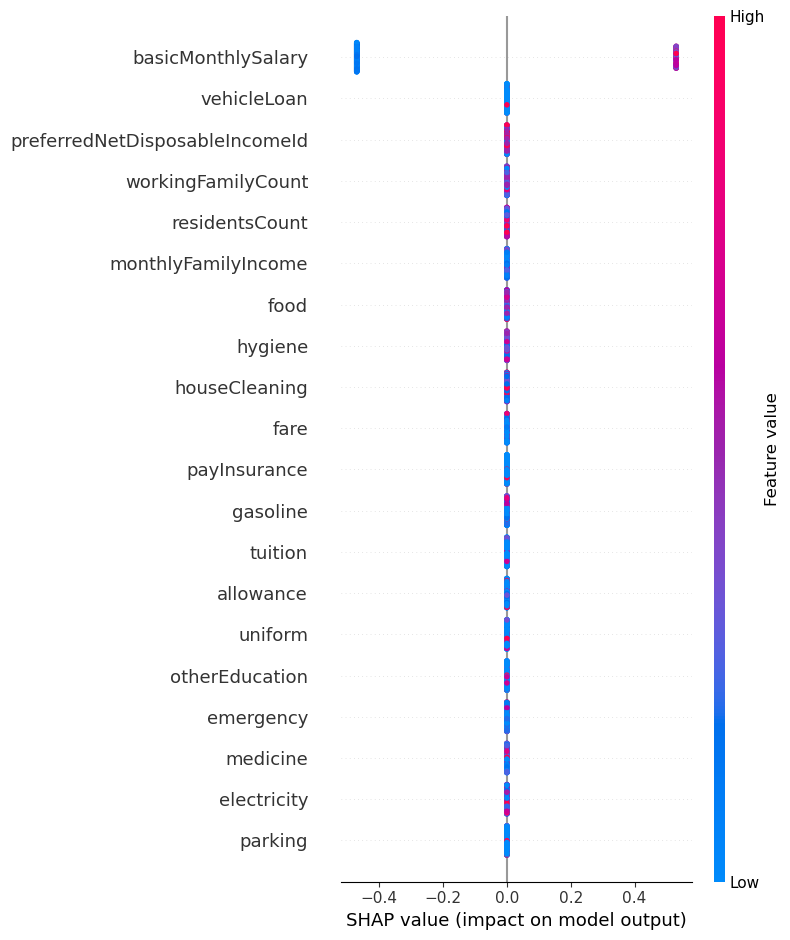

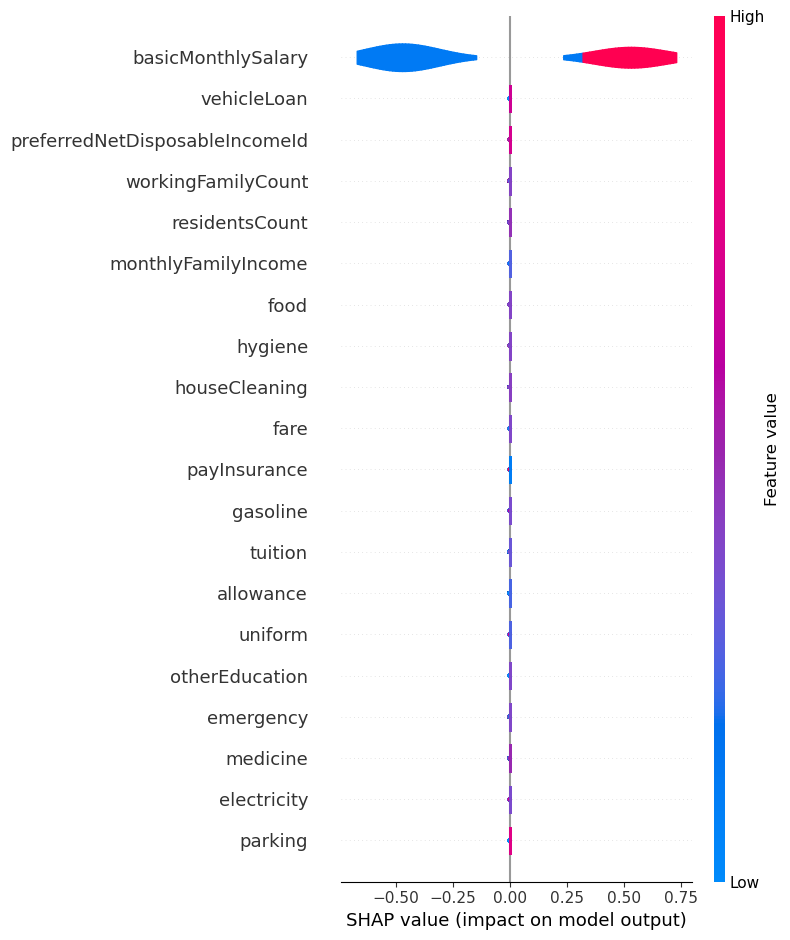

In [590]:
feature_names = X.columns

shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

In [596]:
df = ho_t08_adaboost
df.columns.tolist()

['userId',
 'lastFirstName',
 'basicMonthlySalary',
 'preferredNetDisposableIncomeId',
 'workingFamilyCount',
 'residentsCount',
 'monthlyFamilyIncome',
 'food',
 'hygiene',
 'houseCleaning',
 'fare',
 'parking',
 'gasoline',
 'tuition',
 'allowance',
 'uniform',
 'otherEducation',
 'emergency',
 'medicine',
 'electricity',
 'vehicleLoan',
 'payInsurance',
 'home_ownership_class']

In [599]:
cont = ['basicMonthlySalary',
 'preferredNetDisposableIncomeId',
 'workingFamilyCount',
 'residentsCount',
 'monthlyFamilyIncome',
 'food',
 'hygiene',
 'houseCleaning',
 'fare',
 'parking',
 'gasoline',
 'tuition',
 'allowance',
 'uniform',
 'otherEducation',
 'emergency',
 'medicine',
 'electricity',
 'vehicleLoan']

In [594]:
import dice_ml

In [611]:
df = ho_t08_adaboost
model = ho_t09_adaboost_be

def predict_fn(df):
    return model.predict_proba(df)[:, 1]

X = df.drop(['userId', 'lastFirstName'], axis=1)
y = df.loc[:, label_col]
X_train, X_test, _, _ = train_test_split(X, y,
                                         test_size=0.25,
                                         stratify=y,
                                         random_state=0)

X_train
# Dataset for training an ML model
d = dice_ml.Data(dataframe=X_train,
                 continuous_features=cont,
                 outcome_name='home_ownership_class')

# Pre-trained ML model
m = dice_ml.Model(model=model, backend='sklearn')
#                   backend='TF2', func="ohe-min-max")
# DiCE explanation instance
exp = dice_ml.Dice(d,m)

In [618]:
query_instance
X_test[X_test['home_ownership_class'] == 0]

,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
643,23000,1,1,10,23000.0,10000,5000,2000,2000,0,0,50000,0,2400,0,0,2000,1500,0,1,0
135,19200,2,2,4,28000.0,2500,1000,500,0,0,1000,0,500,250,0,0,0,500,0,0,0
128,15000,1,1,3,15000.0,4000,1500,1500,0,0,400,0,0,0,0,0,0,50,0,0,0
949,20000,2,2,3,30000.0,10000,2000,2000,5000,0,1000,0,1000,0,0,5000,2000,3000,0,1,0
532,15000,1,0,3,100000.0,4000,750,500,1500,0,0,1000,50,650,200,500,100,550,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
469,13000,1,3,5,20000.0,3000,1000,500,2000,0,0,0,0,0,0,0,400,300,0,0,0
845,18000,3,3,4,48000.0,4500,1500,1000,0,0,0,0,0,0,0,0,0,1800,0,0,0
58,17000,1,0,4,17000.0,3000,1500,1000,700,200,100,0,0,0,0,2000,1000,1200,0,0,0
256,14820,2,6,5,18000.0,5,1,2,6,5,5,2,2,2,3,5,2,2,0,1,0


In [620]:
query_instance

,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance
643,23000,1,1,10,23000.0,10000,5000,2000,2000,0,0,50000,0,2400,0,0,2000,1500,0,1


In [624]:
# Generate counterfactual examples
query_instance = X_test[X_test['home_ownership_class'] == 0].drop(columns="home_ownership_class")[3:4]
dice_exp = exp.generate_counterfactuals(query_instance, total_CFs=10,
                                        desired_class="opposite",
                                        random_seed=1)
# Visualize counterfactual explanation
dice_exp.visualize_as_dataframe()

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

Query instance (original outcome : 0)


,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
0,20000,2,2,3,30000.0,10000,2000,2000,5000,0,1000,0,1000,0,0,5000,2000,3000,0,1,0



Diverse Counterfactual set (new outcome: 1.0)


,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
0,1955390.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
1,574368.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,6460.0,3000.0,0.0,1.0,1
2,1868047.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
3,1501117.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
4,262196.0,2.0,0.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
5,747310.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,110857.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
6,1954952.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,2976.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
7,1346603.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
8,617240.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
9,260597.0,2.0,2.0,3.0,30000.0,27378.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1


In [611]:
df = ho_t08_adaboost
model = ho_t09_adaboost_be

def predict_fn(df):
    return model.predict_proba(df)[:, 1]

X = df.drop(['userId', 'lastFirstName'], axis=1)
y = df.loc[:, label_col]
X_train, X_test, _, _ = train_test_split(X, y,
                                         test_size=0.25,
                                         stratify=y,
                                         random_state=0)

X_train
# Dataset for training an ML model
d = dice_ml.Data(dataframe=X_train,
                 continuous_features=cont,
                 outcome_name='home_ownership_class')

# Pre-trained ML model
m = dice_ml.Model(model=model, backend='sklearn')
#                   backend='TF2', func="ohe-min-max")
# DiCE explanation instance
exp = dice_ml.Dice(d,m)

In [618]:
query_instance
X_test[X_test['home_ownership_class'] == 0]

,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
643,23000,1,1,10,23000.0,10000,5000,2000,2000,0,0,50000,0,2400,0,0,2000,1500,0,1,0
135,19200,2,2,4,28000.0,2500,1000,500,0,0,1000,0,500,250,0,0,0,500,0,0,0
128,15000,1,1,3,15000.0,4000,1500,1500,0,0,400,0,0,0,0,0,0,50,0,0,0
949,20000,2,2,3,30000.0,10000,2000,2000,5000,0,1000,0,1000,0,0,5000,2000,3000,0,1,0
532,15000,1,0,3,100000.0,4000,750,500,1500,0,0,1000,50,650,200,500,100,550,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
469,13000,1,3,5,20000.0,3000,1000,500,2000,0,0,0,0,0,0,0,400,300,0,0,0
845,18000,3,3,4,48000.0,4500,1500,1000,0,0,0,0,0,0,0,0,0,1800,0,0,0
58,17000,1,0,4,17000.0,3000,1500,1000,700,200,100,0,0,0,0,2000,1000,1200,0,0,0
256,14820,2,6,5,18000.0,5,1,2,6,5,5,2,2,2,3,5,2,2,0,1,0


In [620]:
query_instance

,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance
643,23000,1,1,10,23000.0,10000,5000,2000,2000,0,0,50000,0,2400,0,0,2000,1500,0,1


In [624]:
# Generate counterfactual examples
query_instance = X_test[X_test['home_ownership_class'] == 0].drop(columns="home_ownership_class")[3:4]
dice_exp = exp.generate_counterfactuals(query_instance, total_CFs=10,
                                        desired_class="opposite",
                                        random_seed=1)
# Visualize counterfactual explanation
dice_exp.visualize_as_dataframe()

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

Query instance (original outcome : 0)


,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
0,20000,2,2,3,30000.0,10000,2000,2000,5000,0,1000,0,1000,0,0,5000,2000,3000,0,1,0



Diverse Counterfactual set (new outcome: 1.0)


,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
0,1955390.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
1,574368.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,6460.0,3000.0,0.0,1.0,1
2,1868047.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
3,1501117.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
4,262196.0,2.0,0.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
5,747310.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,110857.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
6,1954952.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,2976.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
7,1346603.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
8,617240.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
9,260597.0,2.0,2.0,3.0,30000.0,27378.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1


## HO_T10

In [504]:
ho_t10_logreg_gs, ho_t10_logreg_be, ho_t10_logreg_model_info, ho_t10_logreg_metrics_df = logreg_class2(ho_t08_logreg, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Number of components that explain up to 90% of variance: 1
Fitting 10 folds for each of 1872 candidates, totalling 18720 fits
Best Hyperparameters: {'classifier__C': 0.0001, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'resampling': SMOTE(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.49200433199954763
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.0001, max_iter=1000, penalty='l1',
                                    random_state=0, solver='liblinear'))])
GridSearchCV Runtime: 0.4387337962786357
Run 1 - Random State: 0
Test G-mean: 0.5573877179368153
Run 2 - Random State: 1
Test G-mean: 0.5276626221216341
Run 3 - Random State: 2
Test G-mean: 0.4979706793373963
Run 4 - Random State: 3
Test G-mean: 0.5038108598851893
Run 5 - Random State: 4
Test G-mean: 0.49411477911664836
Ave Test G-mean: 0.5161893316795366
St

C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
6240 fits failed out of a total of 18720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2080 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, 

In [505]:
ho_t10_dt_gs, ho_t10_dt_be, ho_t10_dt_model_info, ho_t10_dt_metrics_df = dt_class2(ho_t08_dt, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Number of components that explain up to 90% of variance: 3
Fitting 10 folds for each of 648 candidates, totalling 6480 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': None, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': SMOTEENN(random_state=0)}
Best Validation Score: 0.5465171910922864
Best Estimator: Pipeline(steps=[('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', min_samples_leaf=3,
                                        random_state=0))])
GridSearchCV Runtime: 0.14077277183532716
Run 1 - Random State: 0
Test G-mean: 0.58586203446916
Run 2 - Random State: 1
Test G-mean: 0.5455545462887259
Run 3 - Random State: 2
Test G-mean: 0.595386805820262
Run 4 - Random State: 3
Test G-mean: 0.565934650116796
Run 5 - Random State: 4
Test G-mean: 0.5248119117877141
Ave Test G-mean: 0.5635099896965317
Stdev Test G-mean: 0.0289031290333

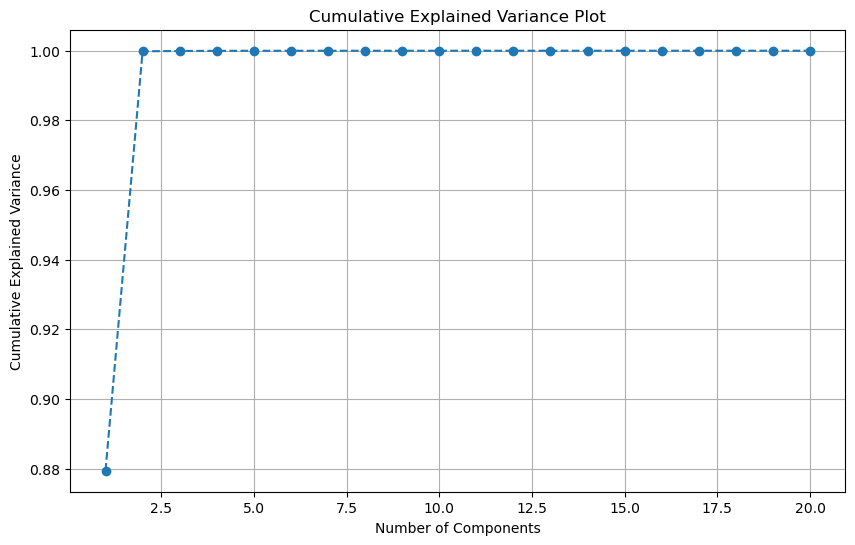

Number of components that explain up to 90% of variance: 2
Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__boosting_type': 'gbdt', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5516499476532073
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LGBMClassifier(learning_rate=0.01, n_estimators=200,
                                random_state=0))])
GridSearchCV Runtime: 0.22794434626897175
Run 1 - Random State: 0
Test G-mean: 0.572392141172752
Run 2 - Random State: 1
Test G-mean: 0.5275204524781748
Run 3 - Random State: 2
Test G-mean: 0.6093333477767906
Run 4 - Random State: 3
Test G-mean: 0.565934650116796
Run 5 - Random State: 4
Test G-mean: 0.557522271401162
Ave Test G-mean: 0.5665405725891351
Stdev Test G-mean: 0.029452203376756244
Ave Test Specificity: 0.5

In [495]:
ho_t10_lgbm_gs, ho_t10_lgbm_be, ho_t10_lgbm_model_info, ho_t10_lgbm_metrics_df = lgbm_class2(ho_t08_lgbm, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

In [499]:
ho_t10_xgb_gs, ho_t10_xgb_be, ho_t10_xgb_model_info, ho_t10_xgb_metrics_df = xgb_class2(ho_t08_xgb, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Number of components that explain up to 90% of variance: 2
Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 100, 'resampling': ADASYN(random_state=0)}
Best Validation Score: 0.5502730992884691
Best Estimator: Pipeline(steps=[('resampling', ADASYN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, lea

In [500]:
ho_t10_adaboost_gs, ho_t10_adaboost_be, ho_t10_adaboost_model_info, ho_t10_adaboost_metrics_df = adaboost_class2(ho_t08_adaboost, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Number of components that explain up to 90% of variance: 2
Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME.R', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 100, 'resampling': SMOTEENN(random_state=0)}
Best Validation Score: 0.5304162875991405
Best Estimator: Pipeline(steps=[('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(learning_rate=0.2, n_estimators=100,
                                    random_state=0))])
GridSearchCV Runtime: 0.634459400177002
Run 1 - Random State: 0
Test G-mean: 0.5444535269095945
Run 2 - Random State: 1
Test G-mean: 0.5324738048348328
Run 3 - Random State: 2
Test G-mean: 0.5389146898204672
Run 4 - Random State: 3
Test G-mean: 0.535423820787595
Run 5 - Random State: 4
Test G-mean: 0.5173990434635705
Ave Test G-mean: 0.533732977163212
Stdev Test G-mean: 0.010161473689209383
Ave Test Specificity: 0.5356435643564357


In [502]:
ho_t10_rf_gs, ho_t10_rf_be, ho_t10_rf_model_info, ho_t10_rf_metrics_df = rf_class2(ho_t08_rf, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Number of components that explain up to 90% of variance: 1
Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 10, 'classifier__n_estimators': 200, 'resampling': SMOTEENN(random_state=0)}
Best Validation Score: 0.5200324968098202
Best Estimator: Pipeline(steps=[('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=10, n_estimators=200,
                                        random_state=0))])
GridSearchCV Runtime: 1.2334901650746664
Run 1 - Random State: 0
Test G-mean: 0.5034385216036845
Run 2 - Random State: 1
Test G-mean: 0.5241683653631958
Run 3 - Random State: 2
Test G-mean: 0.5276626221216341
Run 4 - Random State: 3
Test G-mean: 0.5051490052962148
Run 5 - Random State: 4
Test G-mean: 0.5265241901112211
Ave Test G-mean: 0.5173885408991901
Stdev Test G-mean: 0.012035282728034134
Ave Test Specificity: 0.5564356435643565
Av

In [503]:
ho_t10_gbm_gs, ho_t10_gbm_be, ho_t10_gbm_model_info, ho_t10_gbm_metrics_df = gbm_class2(ho_t08_gbm, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Number of components that explain up to 90% of variance: 2
Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__learning_rate': 0.01, 'classifier__max_depth': 5, 'classifier__n_estimators': 50, 'resampling': SMOTETomek(random_state=0)}
Best Validation Score: 0.5512220365051973
Best Estimator: Pipeline(steps=[('resampling', SMOTETomek(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(learning_rate=0.01, max_depth=5,
                                            n_estimators=50, random_state=0))])
GridSearchCV Runtime: 2.8922751545906067
Run 1 - Random State: 0
Test G-mean: 0.5786479787818625
Run 2 - Random State: 1
Test G-mean: 0.5092896401791022
Run 3 - Random State: 2
Test G-mean: 0.6063718072905993
Run 4 - Random State: 3
Test G-mean: 0.5362637018070379
Run 5 - Random State: 4
Test G-mean: 0.596896664895069
Ave Test G-mean: 0.5654939585907341
Stdev Test G-mean: 0.04136269467923639
Ave Test Specif

In [506]:
model_vars = ['logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t10_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t10_summ = pd.DataFrame(var_df)

columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


selected_columns = [col for col in ho_t10_summ.columns if col not in columns_to_exclude]
ho_t10_summ[selected_columns]

,Classifier model,Best CV Score (G-mean),Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test Accuracy,Average Test Precision,Average Test F1-score
0,Logistic Regression,0.492004,0.516189,0.026464,0.505941,0.530303,0.766708,0.511940,0.260363,0.348618
1,Decision Tree,0.546517,0.563510,0.028903,0.595050,0.539394,0.798471,0.581343,0.305117,0.388017
2,Random Forest,0.520032,0.517389,0.012035,0.556436,0.484848,0.767953,0.538806,0.263180,0.340420
3,Gradient Boosting Machine (GBM),0.551222,0.565494,0.041363,0.666337,0.484848,0.799287,0.621642,0.321024,0.385038
4,LightGBM,0.551650,0.566541,0.029452,0.556436,0.578788,0.802177,0.561940,0.298731,0.393768
5,Extreme Gradient Boosting (XGBoost),0.550273,0.531255,0.018092,0.532673,0.530303,0.776138,0.532090,0.270780,0.358381
6,AdaBoost,0.530416,0.533733,0.010161,0.535644,0.545455,0.783178,0.538060,0.279099,0.366401


## HO_T11

In [530]:
clusters = pd.read_csv('df_cluster_Cao_3.csv')
# clusters

In [528]:
ho_t11_logreg = pd.concat([ho_t08_logreg, clusters[['cluster']]], axis=1)
ho_t11_dt = pd.concat([ho_t08_dt, clusters[['cluster']]], axis=1)
ho_t11_lgbm = pd.concat([ho_t08_lgbm, clusters[['cluster']]], axis=1)
ho_t11_xgb = pd.concat([ho_t08_xgb, clusters[['cluster']]], axis=1)
ho_t11_adaboost = pd.concat([ho_t08_adaboost, clusters[['cluster']]], axis=1)
ho_t11_rf = pd.concat([ho_t08_rf, clusters[['cluster']]], axis=1)
ho_t11_gbm = pd.concat([ho_t08_gbm, clusters[['cluster']]], axis=1)

ho_t11_adaboost

,userId,lastFirstName,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class,cluster
0,370,"IBALI, HOWARD",19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,1,0
1,1025,"PATALINGHOG, KIMBERLY",15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,0,0,0,0
2,1105,"TEMILLOSO, DENNIS",20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,500,0,0,0,1
3,1719,"OSCARES, ELMER",21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,0,0,1,0
4,2081,"LEGASPI, MANNY",19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,1900,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,1500,1,0,0,2
1066,12852,"TEJADA, JERIC",20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0
1067,12853,"RAMOS, RHEALYN",13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,1000,0,0,0,0
1068,12854,"BURGOS, LIEZEL",51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,800,0,0,0,1


In [529]:
ho_t12_dt_c0 = ho_t11_dt[ho_t11_dt['cluster'] == 0]
ho_t12_dt_c1 = ho_t11_dt[ho_t11_dt['cluster'] == 1]
ho_t12_dt_c2 = ho_t11_dt[ho_t11_dt['cluster'] == 2]

In [558]:
ho_t11_logreg_gs, ho_t11_logreg_be, ho_t11_logreg_model_info, ho_t11_logreg_metrics_df = logreg_class2(ho_t11_logreg, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 1872 candidates, totalling 18720 fits


C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
6240 fits failed out of a total of 18720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2080 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, 

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': ADASYN(random_state=0), 'scaler': PowerTransformer()}
Best Validation Score: 0.5937837545269093
Best Estimator: Pipeline(steps=[('scaler', PowerTransformer()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
GridSearchCV Runtime: 2.1160565574963885
Run 1 - Random State: 0
Test G-mean: 0.632408091345612
Run 2 - Random State: 1
Test G-mean: 0.5542163075655183
Run 3 - Random State: 2
Test G-mean: 0.549527249569848
Run 4 - Random State: 3
Test G-mean: 0.6206758605362265
Run 5 - Random State: 4
Test G-mean: 0.5612766725513497
Ave Test G-mean: 0.5836208363137109
Stdev Test G-mean: 0.03962174811856104
Ave Test Specificity: 0.5524752475247525
Ave Test Recall: 0.6212121212121212
Ave Test NPV: 0.817708

In [524]:
ho_t11_dt_gs, ho_t11_dt_be, ho_t11_dt_model_info, ho_t11_dt_metrics_df = dt_class2(ho_t11_dt, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 648 candidates, totalling 6480 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5825881165554906
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, random_state=0))])
GridSearchCV Runtime: 0.29440460205078123
Run 1 - Random State: 0
Test G-mean: 0.5194246626778708
Run 2 - Random State: 1
Test G-mean: 0.5692384414639651
Run 3 - Random State: 2
Test G-mean: 0.599842463566985
Run 4 - Random State: 3
Test G-mean: 0.5939993969090818
Run 5 - Random State: 4
Test G-mean: 0.5087739037023311
Ave Test G-mean: 0.5582557736640468
Stdev Test G-mean: 0.04208321817274188
Ave Test Specificity: 0.5594059405940595
Ave Test Recall: 0.5606060606060606
Ave Test NPV: 0.796773873922

In [556]:
ho_t11_lgbm_gs, ho_t11_lgbm_be, ho_t11_lgbm_model_info, ho_t11_lgbm_metrics_df = lgbm_class2(ho_t11_lgbm, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 100, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.5902354917316336
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.01,
                                random_state=0))])
GridSearchCV Runtime: 0.4900188247362773
Run 1 - Random State: 0
Test G-mean: 0.6011540057371833
Run 2 - Random State: 1
Test G-mean: 0.5796840547749577
Run 3 - Random State: 2
Test G-mean: 0.5511627509527506
Run 4 - Random State: 3
Test G-mean: 0.6052574936862545
Run 5 - Random State: 4
Test G-mean: 0.5755285599449702
Ave Test G-mean: 0.5825573730192233
Stdev Test G-mean: 0.021819788566841976
Ave Test Specificity: 0.7000000000000001
Ave Test Recall: 0.48484848484848486
Ave Test NPV: 0.80

In [526]:
ho_t11_xgb_gs, ho_t11_xgb_be, ho_t11_xgb_model_info, ho_t11_xgb_metrics_df = xgb_class2(ho_t11_xgb, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 50, 'resampling': SMOTEENN(random_state=0)}
Best Validation Score: 0.5849119350028995
Best Estimator: Pipeline(steps=[('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=No

In [527]:
ho_t11_adaboost_gs, ho_t11_adaboost_be, ho_t11_adaboost_model_info, ho_t11_adaboost_metrics_df = adaboost_class2(ho_t11_adaboost, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 50, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.6059134846901182
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME', learning_rate=0.01,
                                    random_state=0))])
GridSearchCV Runtime: 0.8684561769167582
Run 1 - Random State: 0
Test G-mean: 0.6575281243592797
Run 2 - Random State: 1
Test G-mean: 0.6169181945816483
Run 3 - Random State: 2
Test G-mean: 0.5872686680292462
Run 4 - Random State: 3
Test G-mean: 0.6474117037800746
Run 5 - Random State: 4
Test G-mean: 0.6180114835659464
Ave Test G-mean: 0.625427634863239
Stdev Test G-mean: 0.02782650416344844
Ave Test Specificity: 0.6247524752475248
Ave Test Recall: 0.6272727272727272
Ave Test NPV: 0.8369

In [557]:
ho_t11_rf_gs, ho_t11_rf_be, ho_t11_rf_model_info, ho_t11_rf_metrics_df = rf_class2(ho_t11_rf, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__n_estimators': 50, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.6064545277801483
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=5, n_estimators=50,
                                        random_state=0))])
GridSearchCV Runtime: 1.494453759988149
Run 1 - Random State: 0
Test G-mean: 0.6124030566141673
Run 2 - Random State: 1
Test G-mean: 0.610685920690311
Run 3 - Random State: 2
Test G-mean: 0.5796840547749577
Run 4 - Random State: 3
Test G-mean: 0.612096778497179
Run 5 - Random State: 4
Test G-mean: 0.5759194113040744
Ave Test G-mean: 0.5981578443761378
Stdev Test G-mean: 0.01864136167236915
Ave Test Specificity: 0.6287128712871288
Ave Test Recall: 0.5727272727272726
Ave Test NPV:

In [560]:
ho_t11_gbm_gs, ho_t11_gbm_be, ho_t11_gbm_model_info, ho_t11_gbm_metrics_df = gbm_class2(ho_t11_gbm, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__learning_rate': 0.2, 'classifier__max_depth': 5, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5685709945104808
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(learning_rate=0.2, max_depth=5,
                                            n_estimators=200,
                                            random_state=0))])
GridSearchCV Runtime: 5.157932639122009
Run 1 - Random State: 0
Test G-mean: 0.6099485254678234
Run 2 - Random State: 1
Test G-mean: 0.6063718072905993
Run 3 - Random State: 2
Test G-mean: 0.572392141172752
Run 4 - Random State: 3
Test G-mean: 0.577090377090394
Run 5 - Random State: 4
Test G-mean: 0.5946935059647143
Ave Test G-mean: 0.5920992713972566
Stdev Test G-mean: 0.01690169440243751
Ave Test Specifi

In [562]:
model_vars = ['logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t11_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t11_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

ho_t11_summ[['Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
             'Average Test Specificity', 'Average Test Recall', 'Best CV Score (G-mean)']].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Best CV Score (G-mean)
6,AdaBoost,0.625428,0.027827,0.624752,0.627273,0.605913
2,Random Forest,0.598158,0.018641,0.628713,0.572727,0.606455
3,Gradient Boosting Machine (GBM),0.592099,0.016902,0.570297,0.615152,0.568571
0,Logistic Regression,0.583621,0.039622,0.552475,0.621212,0.593784
4,LightGBM,0.582557,0.021820,0.700000,0.484848,0.590235
5,Extreme Gradient Boosting (XGBoost),0.579194,0.020711,0.530693,0.636364,0.584912
1,Decision Tree,0.558256,0.042083,0.559406,0.560606,0.582588


In [591]:
df = ho_t11_adaboost
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(ho_t11_adaboost_be.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

Permutation explainer: 269it [00:57,  3.82it/s]                         


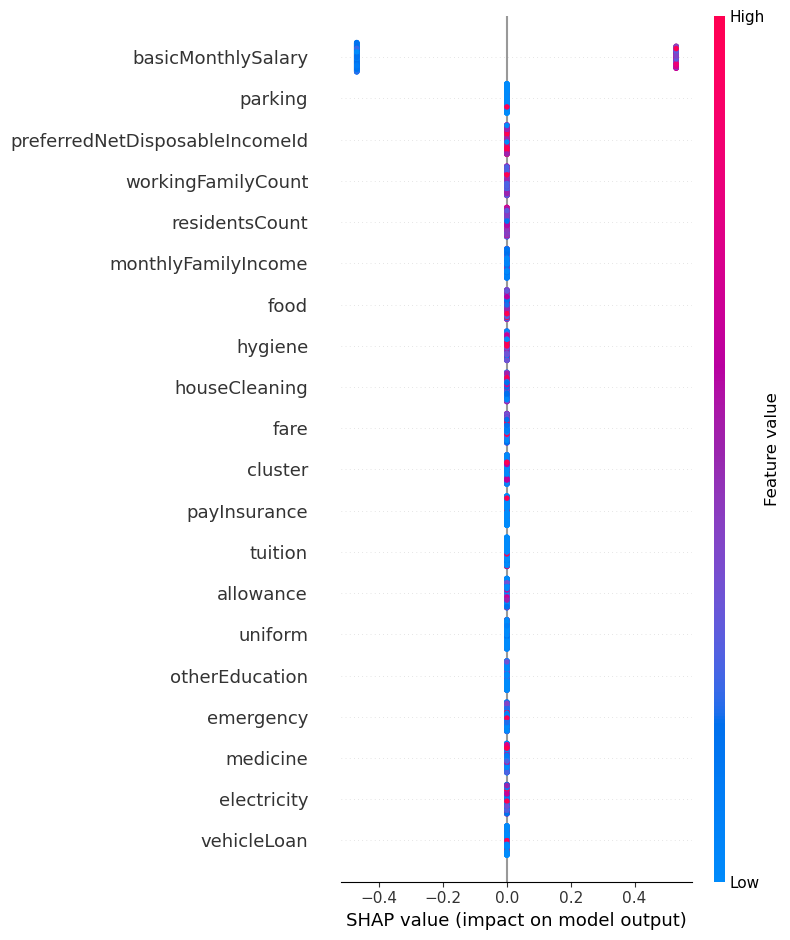

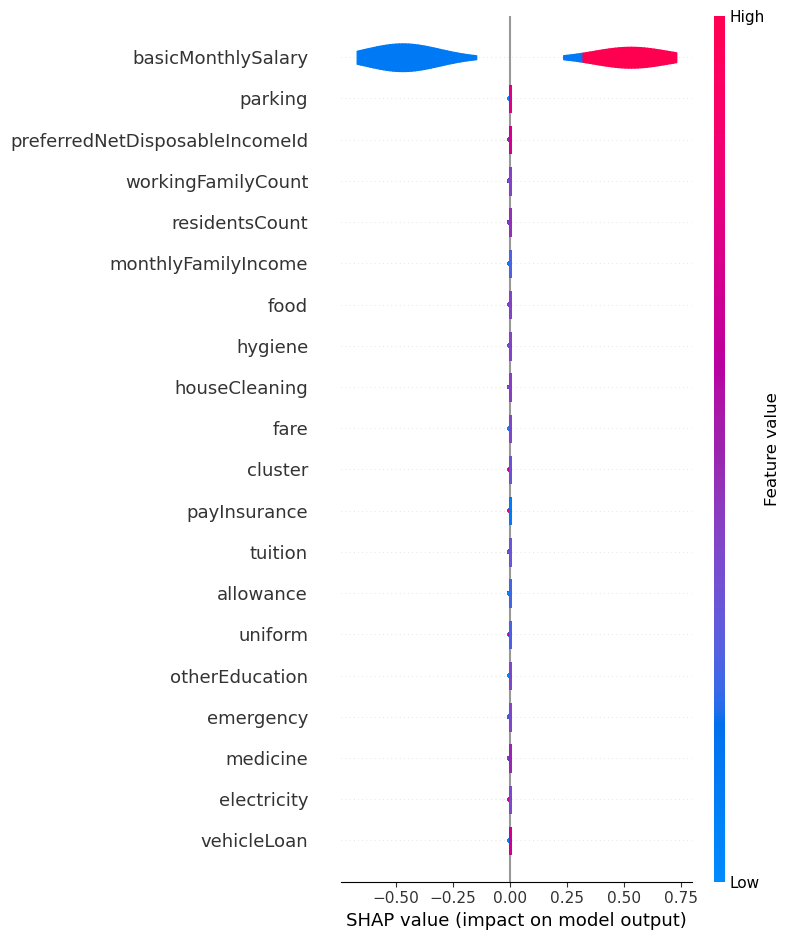

In [592]:
feature_names = X.columns

shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

## HO_T12

In [530]:
clusters = pd.read_csv('df_cluster_Cao_3.csv')
# clusters

In [528]:
ho_t11_logreg = pd.concat([ho_t08_logreg, clusters[['cluster']]], axis=1)
ho_t11_dt = pd.concat([ho_t08_dt, clusters[['cluster']]], axis=1)
ho_t11_lgbm = pd.concat([ho_t08_lgbm, clusters[['cluster']]], axis=1)
ho_t11_xgb = pd.concat([ho_t08_xgb, clusters[['cluster']]], axis=1)
ho_t11_adaboost = pd.concat([ho_t08_adaboost, clusters[['cluster']]], axis=1)
ho_t11_rf = pd.concat([ho_t08_rf, clusters[['cluster']]], axis=1)
ho_t11_gbm = pd.concat([ho_t08_gbm, clusters[['cluster']]], axis=1)

ho_t11_adaboost

,userId,lastFirstName,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class,cluster
0,370,"IBALI, HOWARD",19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,1,0
1,1025,"PATALINGHOG, KIMBERLY",15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,0,0,0,0
2,1105,"TEMILLOSO, DENNIS",20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,500,0,0,0,1
3,1719,"OSCARES, ELMER",21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,0,0,1,0
4,2081,"LEGASPI, MANNY",19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,1900,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1065,12850,"LIPANGO, ARVIN",19000,2,2,4,19000.0,5000,1000,1000,1,1,1,1000,500,1,1000,1000,500,1500,1,0,0,2
1066,12852,"TEJADA, JERIC",20000,2,1,1,20000.0,5000,500,400,280,0,0,0,0,0,0,0,0,0,0,0,0,0
1067,12853,"RAMOS, RHEALYN",13962,1,2,4,40000.0,4,2,1,3,1,1,0,0,0,0,30000,1000,1000,0,0,0,0
1068,12854,"BURGOS, LIEZEL",51000,2,0,5,51000.0,5000,3000,1500,2000,0,0,15000,9000,0,0,1000,1000,800,0,0,0,1


In [549]:
ho_t12_logreg_c0 = ho_t11_logreg[ho_t11_logreg['cluster'] == 0]
ho_t12_logreg_c1 = ho_t11_logreg[ho_t11_logreg['cluster'] == 1]
ho_t12_logreg_c2 = ho_t11_logreg[ho_t11_logreg['cluster'] == 2]
ho_t12_dt_c0 = ho_t11_dt[ho_t11_dt['cluster'] == 0]
ho_t12_dt_c1 = ho_t11_dt[ho_t11_dt['cluster'] == 1]
ho_t12_dt_c2 = ho_t11_dt[ho_t11_dt['cluster'] == 2]
ho_t12_lgbm_c0 = ho_t11_lgbm[ho_t11_lgbm['cluster'] == 0]
ho_t12_lgbm_c1 = ho_t11_lgbm[ho_t11_lgbm['cluster'] == 1]
ho_t12_lgbm_c2 = ho_t11_lgbm[ho_t11_lgbm['cluster'] == 2]
ho_t12_xgb_c0 = ho_t11_xgb[ho_t11_xgb['cluster'] == 0]
ho_t12_xgb_c1 = ho_t11_xgb[ho_t11_xgb['cluster'] == 1]
ho_t12_xgb_c2 = ho_t11_xgb[ho_t11_xgb['cluster'] == 2]
ho_t12_adaboost_c0 = ho_t11_adaboost[ho_t11_adaboost['cluster'] == 0]
ho_t12_adaboost_c1 = ho_t11_adaboost[ho_t11_adaboost['cluster'] == 1]
ho_t12_adaboost_c2 = ho_t11_adaboost[ho_t11_adaboost['cluster'] == 2]
ho_t12_rf_c0 = ho_t11_rf[ho_t11_rf['cluster'] == 0]
ho_t12_rf_c1 = ho_t11_rf[ho_t11_rf['cluster'] == 1]
ho_t12_rf_c2 = ho_t11_rf[ho_t11_rf['cluster'] == 2]
ho_t12_gbm_c0 = ho_t11_gbm[ho_t11_gbm['cluster'] == 0]
ho_t12_gbm_c1 = ho_t11_gbm[ho_t11_gbm['cluster'] == 1]
ho_t12_gbm_c2 = ho_t11_gbm[ho_t11_gbm['cluster'] == 2]

In [533]:
ho_t12_dt_c2

,userId,lastFirstName,basicMonthlySalary,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,rent,informalLenders,privateLoans,home_ownership_class,cluster
12,4772,"VILLAROZA, BLESEELYN",30000,1,3,30000.0,3000,2000,1000,1500,1000,1500,2000,500,300,200,100,100,600,4600,100,1000,0,2
14,5415,"LAMOSTE, JO-ANN",2534900,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,2500,4500,5000,5000,0,2
32,9274,"ALMUETE, CRISTEL",200000,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,2000,100,100,0,2
79,10526,"PEREZ, JOHN RIGOR",25000,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,2500,0,0,0,2
103,10581,"DEJARME, JOAVASAN",19000,1,9,24000.0,10000,2000,1000,1500,300,1500,200,1800,1500,500,1000,500,1500,3000,2000,500,0,2
111,10593,"ABARICO, YENNIESER",33000,3,5,50000.0,3500,150,100,50,30,100,100,100,100,100,3000,1500,2000,1500,100,100,1,2
114,10596,"ALERE, DINOS",19000,0,0,190000.0,1,3,4,3,1,1,1,2,2,1,4,4,5,4500,8,8,0,2
126,10618,"CALDERON, JESSICA",80000,2,4,160000.0,4000,1000,500,500,100,100,1,1,1,1,1,1,1,1,1,1,0,2
134,10631,"BIEN, RICARDO JONEL",18500,2,2,50000.0,2000,1000,500,500,1,1,1,1,1,1,500,500,300,2000,1,1,0,2
139,10640,"ARELLANO, MARK ANGELO",17000,1,2,17000.0,5000,1000,1000,500,500,500,500,1000,2000,500,5000,1000,500,2000,1000,1000,0,2


In [553]:
ho_t12_logreg_c0_gs, ho_t12_logreg_c0_be, ho_t12_logreg_c0_model_info, ho_t12_logreg_c0_metrics_df = logreg_class2(ho_t12_logreg_c0, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 1872 candidates, totalling 18720 fits
Best Hyperparameters: {'classifier__C': 0.1, 'classifier__penalty': 'l1', 'classifier__solver': 'liblinear', 'resampling': RandomOverSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score: 0.5796672081290489
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.1, max_iter=1000, penalty='l1',
                                    random_state=0, solver='liblinear'))])
GridSearchCV Runtime: 2.17719597419103
Run 1 - Random State: 0
Test G-mean: 0.5928637399838541
Run 2 - Random State: 1
Test G-mean: 0.534400153468784
Run 3 - Random State: 2
Test G-mean: 0.5660089510980477
Run 4 - Random State: 3
Test G-mean: 0.5710402407201607
Run 5 - Random State: 4
Test G-mean: 0.6003431513005717
Ave Test G-mean: 0.5729312473142837
Stdev Test G-mean: 0.025907798188725854
Ave Test

C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
6240 fits failed out of a total of 18720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2080 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, 

In [554]:
ho_t12_logreg_c1_gs, ho_t12_logreg_c1_be, ho_t12_logreg_c1_model_info, ho_t12_logreg_c1_metrics_df = logreg_class2(ho_t12_logreg_c1, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 1872 candidates, totalling 18720 fits


C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
6240 fits failed out of a total of 18720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2080 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, 

Best Hyperparameters: {'classifier__C': 0.01, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': RandomUnderSampler(random_state=0), 'scaler': PowerTransformer()}
Best Validation Score: 0.6047214877352329
Best Estimator: Pipeline(steps=[('scaler', PowerTransformer()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=0))])
GridSearchCV Runtime: 2.0202805201212564
Run 1 - Random State: 0
Test G-mean: 0.6883067875346238
Run 2 - Random State: 1
Test G-mean: 0.6303987606290143
Run 3 - Random State: 2
Test G-mean: 0.5788479377737602
Run 4 - Random State: 3
Test G-mean: 0.5868693077811996
Run 5 - Random State: 4
Test G-mean: 0.5652260782028015
Ave Test G-mean: 0.6099297743842799
Stdev Test G-mean: 0.0501453430728544
Ave Test Specificity: 0.5922077922077922
Ave Test Recall: 0.632
Ave Test NPV: 0.832542325106143
Ave Test Accuracy: 0.6019607843137255
Av

In [555]:
ho_t12_logreg_c2_gs, ho_t12_logreg_c2_be, ho_t12_logreg_c2_model_info, ho_t12_logreg_c2_metrics_df = logreg_class2(ho_t12_logreg_c2, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 1872 candidates, totalling 18720 fits


C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
6240 fits failed out of a total of 18720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2080 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, 

Best Hyperparameters: {'classifier__C': 0.01, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': RandomUnderSampler(random_state=0), 'scaler': PowerTransformer()}
Best Validation Score: 0.46783039004935245
Best Estimator: Pipeline(steps=[('scaler', PowerTransformer()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=0))])
GridSearchCV Runtime: 1.4150357961654663
Run 1 - Random State: 0
Test G-mean: 0.4605661864718383
Run 2 - Random State: 1
Test G-mean: 0.5222329678670935
Run 3 - Random State: 2
Test G-mean: 0.6030226891555271
Run 4 - Random State: 3
Test G-mean: 0.34815531191139565
Run 5 - Random State: 4
Test G-mean: 0.6030226891555273
Ave Test G-mean: 0.5073999689122763
Stdev Test G-mean: 0.10730760815575714
Ave Test Specificity: 0.509090909090909
Ave Test Recall: 0.6
Ave Test NPV: 0.823953823953824
Ave Test Accuracy: 0.5285714285714286
Av

In [534]:
ho_t12_dt_c0_gs, ho_t12_dt_c0_be, ho_t12_dt_c0_model_info, ho_t12_dt_c0_metrics_df = dt_class2(ho_t12_dt_c0, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 648 candidates, totalling 6480 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': SMOTETomek(random_state=0)}
Best Validation Score: 0.5872455299854037
Best Estimator: Pipeline(steps=[('resampling', SMOTETomek(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, min_samples_leaf=2,
                                        random_state=0))])
GridSearchCV Runtime: 0.23678407669067383
Run 1 - Random State: 0
Test G-mean: 0.5026246899500345
Run 2 - Random State: 1
Test G-mean: 0.5668169585773633
Run 3 - Random State: 2
Test G-mean: 0.44464780498789064
Run 4 - Random State: 3
Test G-mean: 0.5445801187344465
Run 5 - Random State: 4
Test G-mean: 0.5558097562348633
Ave Test G-mean: 0.5228958656969196
Stdev Test G-mean: 0.050040665939905256
Ave Test Specificity: 0.6782608695652174
Ave Test Recall: 

In [536]:
ho_t12_dt_c1_gs, ho_t12_dt_c1_be, ho_t12_dt_c1_model_info, ho_t12_dt_c1_metrics_df = dt_class2(ho_t12_dt_c1, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 648 candidates, totalling 6480 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': SMOTEENN(random_state=0)}
Best Validation Score: 0.565624208102288
Best Estimator: Pipeline(steps=[('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=5, min_samples_leaf=3,
                                        random_state=0))])
GridSearchCV Runtime: 0.222037669022878
Run 1 - Random State: 0
Test G-mean: 0.5554920598635309
Run 2 - Random State: 1
Test G-mean: 0.5261968423348024
Run 3 - Random State: 2
Test G-mean: 0.5388781034608944
Run 4 - Random State: 3
Test G-mean: 0.614964891828646
Run 5 - Random State: 4
Test G-mean: 0.47917678325477087
Ave Test G-mean: 0.5429417361485289
Stdev Test G-mean: 0.04926387971036664
Ave Test Specificity: 0.5012987012987012
Ave Test Recall: 0.624
Ave

In [537]:
ho_t12_dt_c2_gs, ho_t12_dt_c2_be, ho_t12_dt_c2_model_info, ho_t12_dt_c2_metrics_df = dt_class2(ho_t12_dt_c2, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 648 candidates, totalling 6480 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': None, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.6494800481421251
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 DecisionTreeClassifier(min_samples_leaf=3, random_state=0))])
GridSearchCV Runtime: 0.18775426944096882
Run 1 - Random State: 0
Test G-mean: 0.34815531191139565
Run 2 - Random State: 1
Test G-mean: 0.5504818825631803
Run 3 - Random State: 2
Test G-mean: 0.0
Run 4 - Random State: 3
Test G-mean: 0.5504818825631803
Run 5 - Random State: 4
Test G-mean: 0.6513389472789296
Ave Test G-mean: 0.42009160486333713
Stdev Test G-mean: 0.2593888823426519
Ave Test Specificity: 0.4909090909090909
Ave Test Recall: 0.5333333333333333
Ave Test NPV: 0.7871212121212122
Ave Test Accurac

In [539]:
ho_t12_lgbm_c0_gs, ho_t12_lgbm_c0_be, ho_t12_lgbm_c0_model_info, ho_t12_lgbm_c0_metrics_df = lgbm_class2(ho_t12_lgbm_c0, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__boosting_type': 'goss', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 50, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.6226755042254222
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LGBMClassifier(boosting_type='goss', learning_rate=0.2,
                                n_estimators=50, random_state=0))])
GridSearchCV Runtime: 0.2883183399836222
Run 1 - Random State: 0
Test G-mean: 0.5858749251483802
Run 2 - Random State: 1
Test G-mean: 0.6373213394375848
Run 3 - Random State: 2
Test G-mean: 0.5619514869490163
Run 4 - Random State: 3
Test G-mean: 0.5700375353974628
Run 5 - Random State: 4
Test G-mean: 0.6807251484180581
Ave Test G-mean: 0.6071820870701005
Stdev Test G-mean: 0.05048880188005416
Ave Test Specificity: 0.6278260869565218
Ave Test Recall: 0.5894736842105261
Ave Te

In [541]:
ho_t12_lgbm_c1_gs, ho_t12_lgbm_c1_be, ho_t12_lgbm_c1_model_info, ho_t12_lgbm_c1_metrics_df = lgbm_class2(ho_t12_lgbm_c1, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__boosting_type': 'goss', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 200, 'resampling': SMOTEENN(random_state=0)}
Best Validation Score: 0.5365022874757204
Best Estimator: Pipeline(steps=[('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 LGBMClassifier(boosting_type='goss', n_estimators=200,
                                random_state=0))])
GridSearchCV Runtime: 0.16360560655593873
Run 1 - Random State: 0
Test G-mean: 0.6266795614405122
Run 2 - Random State: 1
Test G-mean: 0.565685424949238
Run 3 - Random State: 2
Test G-mean: 0.5296408977028497
Run 4 - Random State: 3
Test G-mean: 0.5982658923272143
Run 5 - Random State: 4
Test G-mean: 0.5060670865645148
Ave Test G-mean: 0.5652677725968658
Stdev Test G-mean: 0.049077626240521595
Ave Test Specificity: 0.5532467532467532
Ave Test Recall: 0.5920000000000001
Ave Test NPV: 0.80643466

In [542]:
ho_t12_lgbm_c2_gs, ho_t12_lgbm_c2_be, ho_t12_lgbm_c2_model_info, ho_t12_lgbm_c2_metrics_df = lgbm_class2(ho_t12_lgbm_c2, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 50, 'resampling': SMOTE(random_state=0)}
Best Validation Score: 0.525565416968315
Best Estimator: Pipeline(steps=[('resampling', SMOTE(random_state=0)),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', n_estimators=50,
                                random_state=0))])
GridSearchCV Runtime: 0.08339141607284546
Run 1 - Random State: 0
Test G-mean: 0.5222329678670935
Run 2 - Random State: 1
Test G-mean: 0.6030226891555271
Run 3 - Random State: 2
Test G-mean: 0.5504818825631802
Run 4 - Random State: 3
Test G-mean: 0.6030226891555273
Run 5 - Random State: 4
Test G-mean: 0.0
Ave Test G-mean: 0.45575204574826567
Stdev Test G-mean: 0.2571384194415805
Ave Test Specificity: 0.6727272727272728
Ave Test Recall: 0.4666666666666666
Ave Test NPV: 0.8471861471861472
Ave Test Accura

In [543]:
ho_t12_xgb_c0_gs, ho_t12_xgb_c0_be, ho_t12_xgb_c0_model_info, ho_t12_xgb_c0_metrics_df = xgb_class2(ho_t12_xgb_c0, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 100, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.6142965165202011
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learning_rate=0.2,
                    

In [544]:
ho_t12_xgb_c1_gs, ho_t12_xgb_c1_be, ho_t12_xgb_c1_model_info, ho_t12_xgb_c1_metrics_df = xgb_class2(ho_t12_xgb_c1, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 200, 'resampling': SMOTEENN(random_state=0)}
Best Validation Score: 0.5555036433933344
Best Estimator: Pipeline(steps=[('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learning_rate=0.2,
                               max_bin=N

In [545]:
ho_t12_xgb_c2_gs, ho_t12_xgb_c2_be, ho_t12_xgb_c2_model_info, ho_t12_xgb_c2_metrics_df = xgb_class2(ho_t12_xgb_c2, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 100, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.46783039004935245
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bi

In [546]:
ho_t12_adaboost_c0_gs, ho_t12_adaboost_c0_be, ho_t12_adaboost_c0_model_info, ho_t12_adaboost_c0_metrics_df = adaboost_class2(ho_t12_adaboost_c0, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME.R', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 50, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score: 0.6206788503614397
Best Estimator: Pipeline(steps=[('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(learning_rate=0.01, random_state=0))])
GridSearchCV Runtime: 0.7238765358924866
Run 1 - Random State: 0
Test G-mean: 0.5858749251483802
Run 2 - Random State: 1
Test G-mean: 0.6506465715720003
Run 3 - Random State: 2
Test G-mean: 0.5595028849441882
Run 4 - Random State: 3
Test G-mean: 0.578406237642461
Run 5 - Random State: 4
Test G-mean: 0.6890779167017625
Ave Test G-mean: 0.6127017072017585
Stdev Test G-mean: 0.05477022061962429
Ave Test Specificity: 0.6852173913043478
Ave Test Recall: 0.5526315789473684
Ave Test NPV: 0.8234029286607825
Ave Test Accuracy: 0.652

In [547]:
ho_t12_adaboost_c1_gs, ho_t12_adaboost_c1_be, ho_t12_adaboost_c1_model_info, ho_t12_adaboost_c1_metrics_df = adaboost_class2(ho_t12_adaboost_c1, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5583330436309706
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME', learning_rate=0.2,
                                    n_estimators=200, random_state=0))])
GridSearchCV Runtime: 0.6919149001439412
Run 1 - Random State: 0
Test G-mean: 0.5412827477271126
Run 2 - Random State: 1
Test G-mean: 0.565685424949238
Run 3 - Random State: 2
Test G-mean: 0.47809144373375745
Run 4 - Random State: 3
Test G-mean: 0.5960911636022425
Run 5 - Random State: 4
Test G-mean: 0.620431353926496
Ave Test G-mean: 0.5603164267877693
Stdev Test G-mean: 0.0548764320476325
Ave Test Specificity: 0.5896103896103896
Ave Test Recall: 0.543

In [548]:
ho_t12_adaboost_c2_gs, ho_t12_adaboost_c2_be, ho_t12_adaboost_c2_model_info, ho_t12_adaboost_c2_metrics_df = adaboost_class2(ho_t12_adaboost_c2, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME.R', 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 100, 'resampling': SMOTE(random_state=0)}
Best Validation Score: 0.48938468501173515
Best Estimator: Pipeline(steps=[('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(learning_rate=0.01, n_estimators=100,
                                    random_state=0))])
GridSearchCV Runtime: 0.5471135536829631
Run 1 - Random State: 0
Test G-mean: 0.5222329678670935
Run 2 - Random State: 1
Test G-mean: 0.5504818825631803
Run 3 - Random State: 2
Test G-mean: 0.0
Run 4 - Random State: 3
Test G-mean: 0.4264014327112209
Run 5 - Random State: 4
Test G-mean: 0.6030226891555271
Ave Test G-mean: 0.4204277944594043
Stdev Test G-mean: 0.24362597841882816
Ave Test Specificity: 0.5999999999999999
Ave Test Recall: 0.4666666666666666
Ave Test NPV: 0.8055777555777557
Ave Te

In [550]:
ho_t12_rf_c0_gs, ho_t12_rf_c0_be, ho_t12_rf_c0_model_info, ho_t12_rf_c0_metrics_df = rf_class2(ho_t12_rf_c0, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 5, 'classifier__n_estimators': 50, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.6172470946163191
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=5, n_estimators=50,
                                        random_state=0))])
GridSearchCV Runtime: 1.1942845781644185
Run 1 - Random State: 0
Test G-mean: 0.6062225010866873
Run 2 - Random State: 1
Test G-mean: 0.6065998571774385
Run 3 - Random State: 2
Test G-mean: 0.5483488842478256
Run 4 - Random State: 3
Test G-mean: 0.626639725470511
Run 5 - Random State: 4
Test G-mean: 0.6722686070995233
Ave Test G-mean: 0.6120159150163972
Stdev Test G-mean: 0.044611183771068
Ave Test Specificity: 0.6434782608695653
Ave Test Recall: 0.5842105263157895
Ave Test NPV: 0.824162867140777

In [551]:
ho_t12_rf_c1_gs, ho_t12_rf_c1_be, ho_t12_rf_c1_model_info, ho_t12_rf_c1_metrics_df = rf_class2(ho_t12_rf_c1, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 10, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5394551414500576
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=10,
                                        n_estimators=200, random_state=0))])
GridSearchCV Runtime: 1.0556689977645874
Run 1 - Random State: 0
Test G-mean: 0.5592202363356255
Run 2 - Random State: 1
Test G-mean: 0.5237229365663817
Run 3 - Random State: 2
Test G-mean: 0.49987011299949696
Run 4 - Random State: 3
Test G-mean: 0.5752469825293227
Run 5 - Random State: 4
Test G-mean: 0.4909571886009625
Ave Test G-mean: 0.5298034914063579
Stdev Test G-mean: 0.03664857193444012
Ave Test Specificity: 0.49610389610389605
Ave Test Recall:

In [552]:
ho_t12_rf_c2_gs, ho_t12_rf_c2_be, ho_t12_rf_c2_model_info, ho_t12_rf_c2_metrics_df = rf_class2(ho_t12_rf_c2, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': None, 'classifier__n_estimators': 50, 'resampling': SMOTEENN(random_state=0)}
Best Validation Score: 0.5284457050376173
Best Estimator: Pipeline(steps=[('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 RandomForestClassifier(n_estimators=50, random_state=0))])
GridSearchCV Runtime: 0.8276962677637736
Run 1 - Random State: 0
Test G-mean: 0.0
Run 2 - Random State: 1
Test G-mean: 0.5773502691896257
Run 3 - Random State: 2
Test G-mean: 0.4264014327112209
Run 4 - Random State: 3
Test G-mean: 0.6963106238227913
Run 5 - Random State: 4
Test G-mean: 0.6030226891555271
Ave Test G-mean: 0.46061700297583297
Stdev Test G-mean: 0.27513462454050136
Ave Test Specificity: 0.6909090909090909
Ave Test Recall: 0.4
Ave Test NPV: 0.8084371184371184
Ave Test Accuracy: 0.6285714285714287
Ave Test Precision: 0.3704761904761905

In [563]:
ho_t12_gbm_c0_gs, ho_t12_gbm_c0_be, ho_t12_gbm_c0_model_info, ho_t12_gbm_c0_metrics_df = gbm_class2(ho_t12_gbm_c0, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 5, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.5729427747706292
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 GradientBoostingClassifier(max_depth=5, n_estimators=200,
                                            random_state=0))])
GridSearchCV Runtime: 2.7301095445950825
Run 1 - Random State: 0
Test G-mean: 0.5758289219624358
Run 2 - Random State: 1
Test G-mean: 0.6097979558105743
Run 3 - Random State: 2
Test G-mean: 0.5764247099355269
Run 4 - Random State: 3
Test G-mean: 0.6590333396663344
Run 5 - Random State: 4
Test G-mean: 0.6155870112510925
Ave Test G-mean: 0.6073343877251929
Stdev Test G-mean: 0.03425988597679956
Ave Test Specificity: 0.6
Ave Test Recall: 0.6157894736842106
Ave Test NPV: 0.8253893399634974

In [564]:
ho_t12_gbm_c1_gs, ho_t12_gbm_c1_be, ho_t12_gbm_c1_model_info, ho_t12_gbm_c1_metrics_df = gbm_class2(ho_t12_gbm_c1, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__learning_rate': 0.01, 'classifier__max_depth': 10, 'classifier__n_estimators': 100, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.5458780814734446
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(learning_rate=0.01, max_depth=10,
                                            random_state=0))])
GridSearchCV Runtime: 2.104197116692861
Run 1 - Random State: 0
Test G-mean: 0.4726273620693404
Run 2 - Random State: 1
Test G-mean: 0.5393598899705937
Run 3 - Random State: 2
Test G-mean: 0.48670639700246066
Run 4 - Random State: 3
Test G-mean: 0.4993502271458874
Run 5 - Random State: 4
Test G-mean: 0.48670639700246066
Ave Test G-mean: 0.49695005463814856
Stdev Test G-mean: 0.02552358408562141
Ave Test Specificity: 0.5168831168831168
Ave Test Recall: 0.48
Ave Te

In [565]:
ho_t12_gbm_c2_gs, ho_t12_gbm_c2_be, ho_t12_gbm_c2_model_info, ho_t12_gbm_c2_metrics_df = gbm_class2(ho_t12_gbm_c2, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.5156596523969725
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 GradientBoostingClassifier(max_depth=None, n_estimators=200,
                                            random_state=0))])
GridSearchCV Runtime: 0.4842334230740865
Run 1 - Random State: 0
Test G-mean: 0.4264014327112209
Run 2 - Random State: 1
Test G-mean: 0.5504818825631803
Run 3 - Random State: 2
Test G-mean: 0.0
Run 4 - Random State: 3
Test G-mean: 0.6030226891555273
Run 5 - Random State: 4
Test G-mean: 0.6030226891555271
Ave Test G-mean: 0.43658573871709117
Stdev Test G-mean: 0.2545022965836808
Ave Test Specificity: 0.4727272727272728
Ave Test Recall: 0.5999999999999999
Ave Test NPV: 0.8335497835

In [566]:
model_vars = ['logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t12_'
clx = '_c0'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+clx+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+clx+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+clx+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+clx+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+clx+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+clx+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+clx+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+clx+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+clx+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+clx+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+clx+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t12_c0_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t10_summ.columns if col not in columns_to_exclude]
# ho_t10_summ[selected_columns]

ho_t12_c0_summ[['Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
             'Average Test Specificity', 'Average Test Recall', 'Best CV Score (G-mean)']].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Best CV Score (G-mean)
6,AdaBoost,0.612702,0.054770,0.685217,0.552632,0.620679
2,Random Forest,0.612016,0.044611,0.643478,0.584211,0.617247
3,Gradient Boosting Machine (GBM),0.607334,0.034260,0.600000,0.615789,0.572943
4,LightGBM,0.607182,0.050489,0.627826,0.589474,0.622676
0,Logistic Regression,0.572931,0.025908,0.563478,0.589474,0.579667
5,Extreme Gradient Boosting (XGBoost),0.542734,0.018316,0.554783,0.531579,0.614297
1,Decision Tree,0.522896,0.050041,0.678261,0.405263,0.587246


In [650]:
df = ho_t12_adaboost_c0
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

model = ho_t12_adaboost_c0_be.named_steps.classifier
rules = tree_rules(model.estimators_[0], X_train.columns)
print(rules)

  if basicMonthlySalary <= 20560.00:
    return Class 0
  else:  # if basicMonthlySalary > 20560.00
    return Class 1


In [653]:
df = ho_t12_rf_c0
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

model = ho_t12_rf_c0_be.named_steps.classifier
rules = tree_rules(model.estimators_[0], X_train.columns)
print(rules)

  if clothing <= 600.00:
    if water <= 50.00:
      if houseCleaning <= 55.00:
        if clothing <= 7.50:
          if electricity <= 9.50:
            return Class 0
          else:  # if electricity > 9.50
            return Class 1
        else:  # if clothing > 7.50
          return Class 0
      else:  # if houseCleaning > 55.00
        if food <= 6500.00:
          if basicMonthlySalary <= 17500.00:
            return Class 0
          else:  # if basicMonthlySalary > 17500.00
            return Class 1
        else:  # if food > 6500.00
          return Class 0
    else:  # if water > 50.00
      if fare <= 1250.00:
        if monthlyFamilyIncome <= 67500.00:
          if monthlyFamilyIncome <= 20400.00:
            return Class 0
          else:  # if monthlyFamilyIncome > 20400.00
            return Class 0
        else:  # if monthlyFamilyIncome > 67500.00
          if basicMonthlySalary <= 26847.00:
            return Class 0
          else:  # if basicMonthlySalary > 26

In [654]:
df = ho_t12_rf_c0
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(ho_t12_rf_c0_be.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

Permutation explainer: 154it [00:46,  2.40it/s]                         


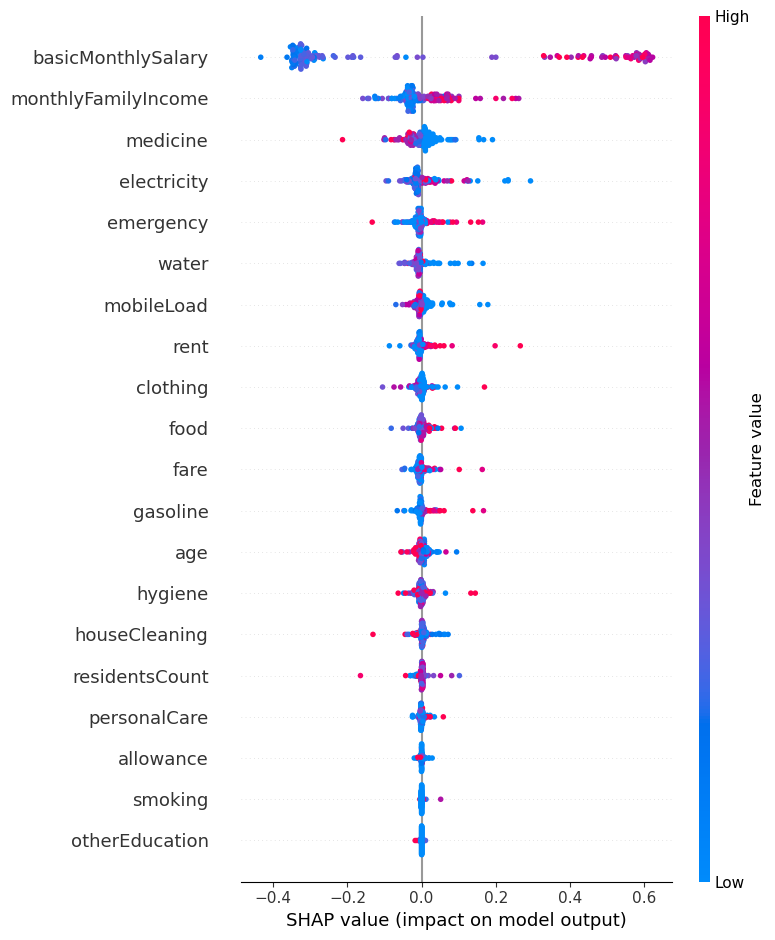

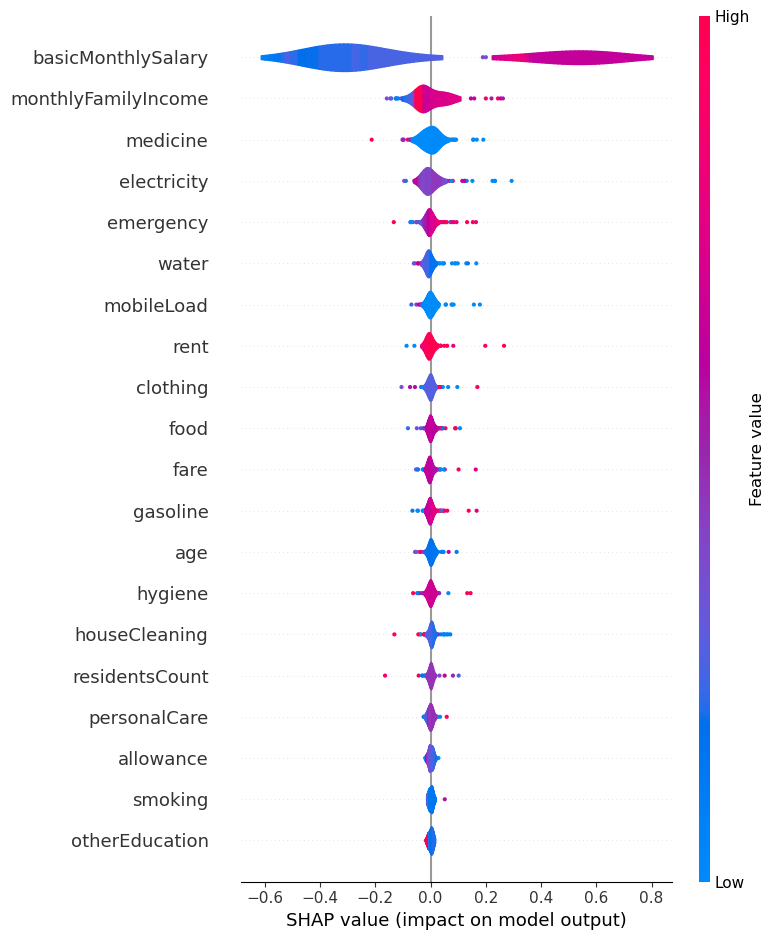

In [655]:
feature_names = X.columns

shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

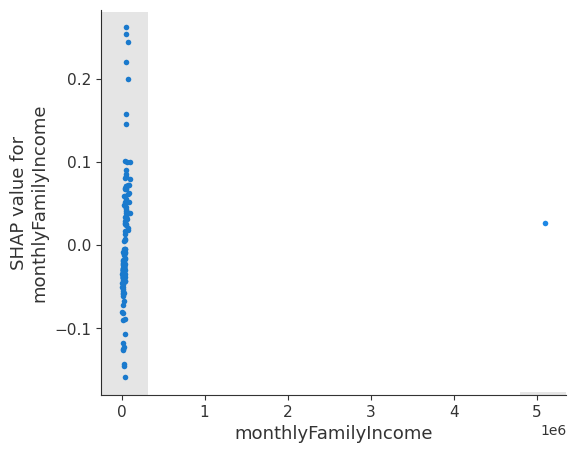

In [657]:
shap.plots.scatter(shap_values[:,"monthlyFamilyIncome"])

In [570]:
import shap
ho_t12_adaboost_c0_be
ho_t12_adaboost_c0

In [587]:
df = ho_t12_adaboost_c0
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(ho_t12_adaboost_c0_be.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

Permutation explainer: 154it [00:58,  2.17it/s]                         


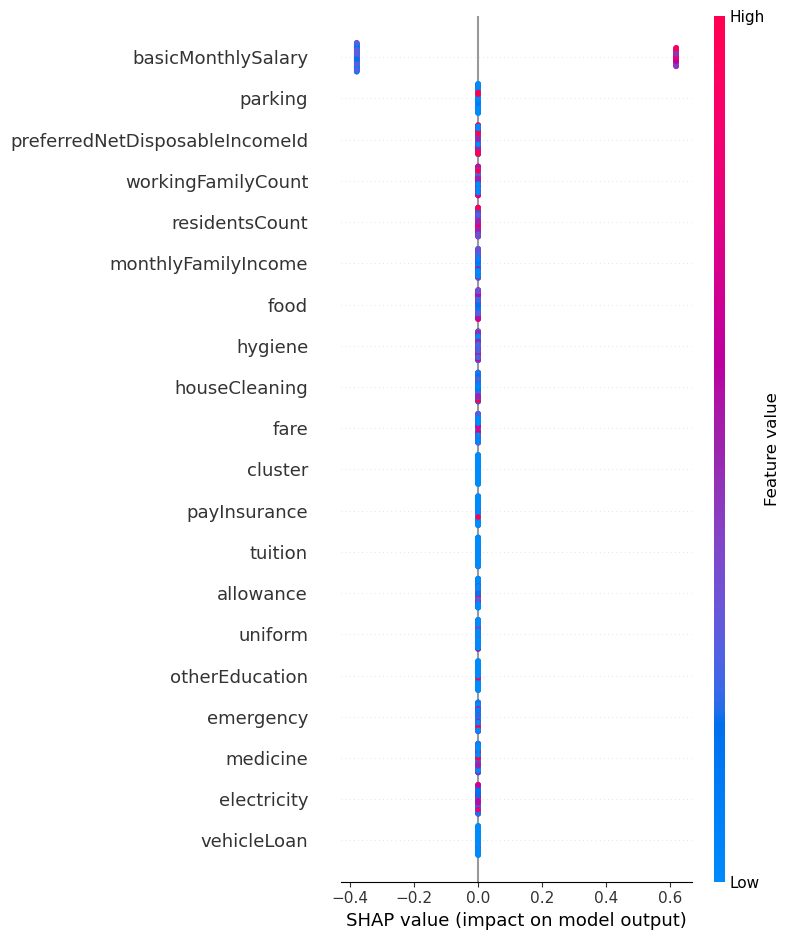

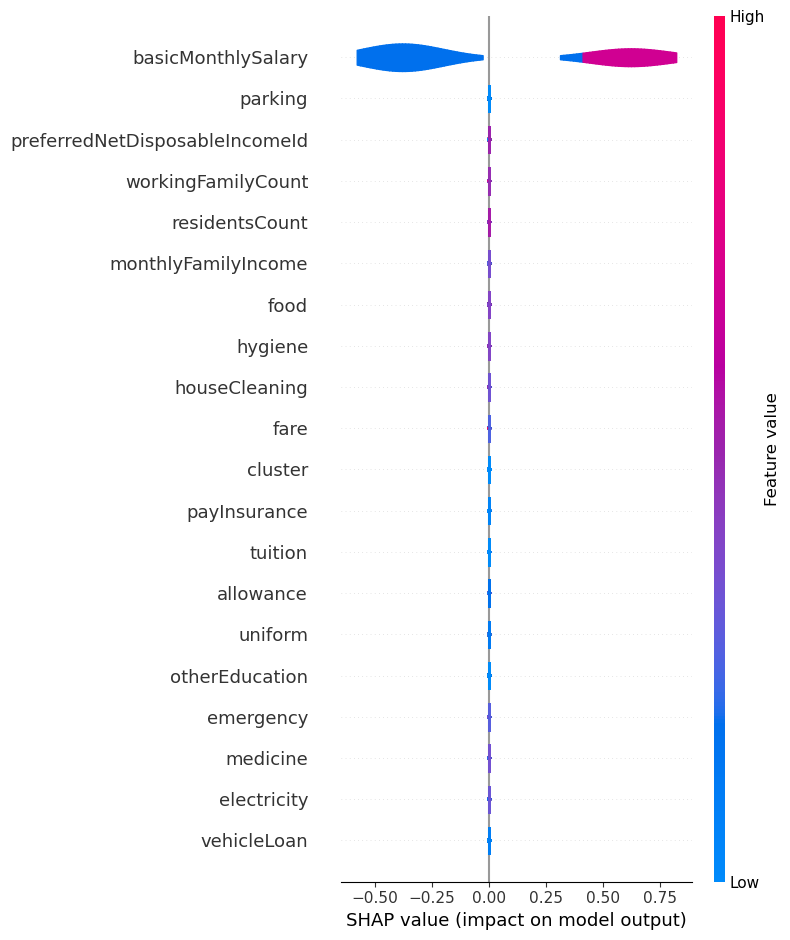

In [588]:
feature_names = X.columns

shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

In [611]:
df = ho_t08_adaboost
model = ho_t09_adaboost_be

def predict_fn(df):
    return model.predict_proba(df)[:, 1]

X = df.drop(['userId', 'lastFirstName'], axis=1)
y = df.loc[:, label_col]
X_train, X_test, _, _ = train_test_split(X, y,
                                         test_size=0.25,
                                         stratify=y,
                                         random_state=0)

X_train
# Dataset for training an ML model
d = dice_ml.Data(dataframe=X_train,
                 continuous_features=cont,
                 outcome_name='home_ownership_class')

# Pre-trained ML model
m = dice_ml.Model(model=model, backend='sklearn')
#                   backend='TF2', func="ohe-min-max")
# DiCE explanation instance
exp = dice_ml.Dice(d,m)

In [618]:
query_instance
X_test[X_test['home_ownership_class'] == 0]

,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
643,23000,1,1,10,23000.0,10000,5000,2000,2000,0,0,50000,0,2400,0,0,2000,1500,0,1,0
135,19200,2,2,4,28000.0,2500,1000,500,0,0,1000,0,500,250,0,0,0,500,0,0,0
128,15000,1,1,3,15000.0,4000,1500,1500,0,0,400,0,0,0,0,0,0,50,0,0,0
949,20000,2,2,3,30000.0,10000,2000,2000,5000,0,1000,0,1000,0,0,5000,2000,3000,0,1,0
532,15000,1,0,3,100000.0,4000,750,500,1500,0,0,1000,50,650,200,500,100,550,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
469,13000,1,3,5,20000.0,3000,1000,500,2000,0,0,0,0,0,0,0,400,300,0,0,0
845,18000,3,3,4,48000.0,4500,1500,1000,0,0,0,0,0,0,0,0,0,1800,0,0,0
58,17000,1,0,4,17000.0,3000,1500,1000,700,200,100,0,0,0,0,2000,1000,1200,0,0,0
256,14820,2,6,5,18000.0,5,1,2,6,5,5,2,2,2,3,5,2,2,0,1,0


In [620]:
query_instance

,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance
643,23000,1,1,10,23000.0,10000,5000,2000,2000,0,0,50000,0,2400,0,0,2000,1500,0,1


In [624]:
# Generate counterfactual examples
query_instance = X_test[X_test['home_ownership_class'] == 0].drop(columns="home_ownership_class")[3:4]
dice_exp = exp.generate_counterfactuals(query_instance, total_CFs=10,
                                        desired_class="opposite",
                                        random_seed=1)
# Visualize counterfactual explanation
dice_exp.visualize_as_dataframe()

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

Query instance (original outcome : 0)


,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
0,20000,2,2,3,30000.0,10000,2000,2000,5000,0,1000,0,1000,0,0,5000,2000,3000,0,1,0



Diverse Counterfactual set (new outcome: 1.0)


,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,electricity,vehicleLoan,payInsurance,home_ownership_class
0,1955390.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
1,574368.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,6460.0,3000.0,0.0,1.0,1
2,1868047.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
3,1501117.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
4,262196.0,2.0,0.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
5,747310.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,110857.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
6,1954952.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,2976.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
7,1346603.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
8,617240.0,2.0,2.0,3.0,30000.0,10000.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1
9,260597.0,2.0,2.0,3.0,30000.0,27378.0,2000.0,2000.0,5000.0,0.0,1000.0,0.0,1000.0,0.0,0.0,5000.0,2000.0,3000.0,0.0,1.0,1


In [567]:
model_vars = ['logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t12_'
clx = '_c1'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+clx+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+clx+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+clx+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+clx+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+clx+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+clx+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+clx+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+clx+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+clx+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+clx+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+clx+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t12_c1_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t10_summ.columns if col not in columns_to_exclude]
# ho_t10_summ[selected_columns]

ho_t12_c1_summ[['Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
             'Average Test Specificity', 'Average Test Recall', 'Best CV Score (G-mean)']].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Best CV Score (G-mean)
0,Logistic Regression,0.609930,0.050145,0.592208,0.632,0.604721
4,LightGBM,0.565268,0.049078,0.553247,0.592,0.536502
6,AdaBoost,0.560316,0.054876,0.589610,0.544,0.558333
1,Decision Tree,0.542942,0.049264,0.501299,0.624,0.565624
2,Random Forest,0.529803,0.036649,0.496104,0.576,0.539455
5,Extreme Gradient Boosting (XGBoost),0.511869,0.051163,0.514286,0.512,0.555504
3,Gradient Boosting Machine (GBM),0.496950,0.025524,0.516883,0.480,0.545878


In [651]:
df = ho_t12_logreg_c1
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

model = ho_t12_logreg_c1_be.named_steps.classifier
rules = tree_rules(model.estimators_[0], X_train.columns)
print(rules)

AttributeError: 'LogisticRegression' object has no attribute 'estimators_'

In [584]:
df = ho_t12_logreg_c1
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(ho_t12_logreg_c1_be.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

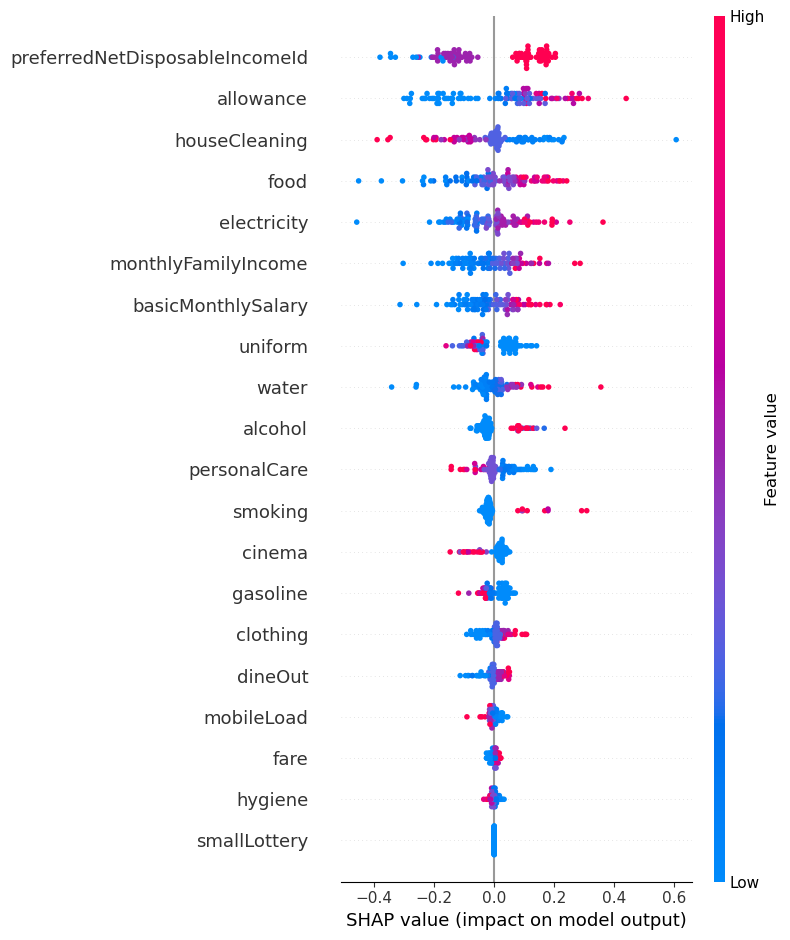

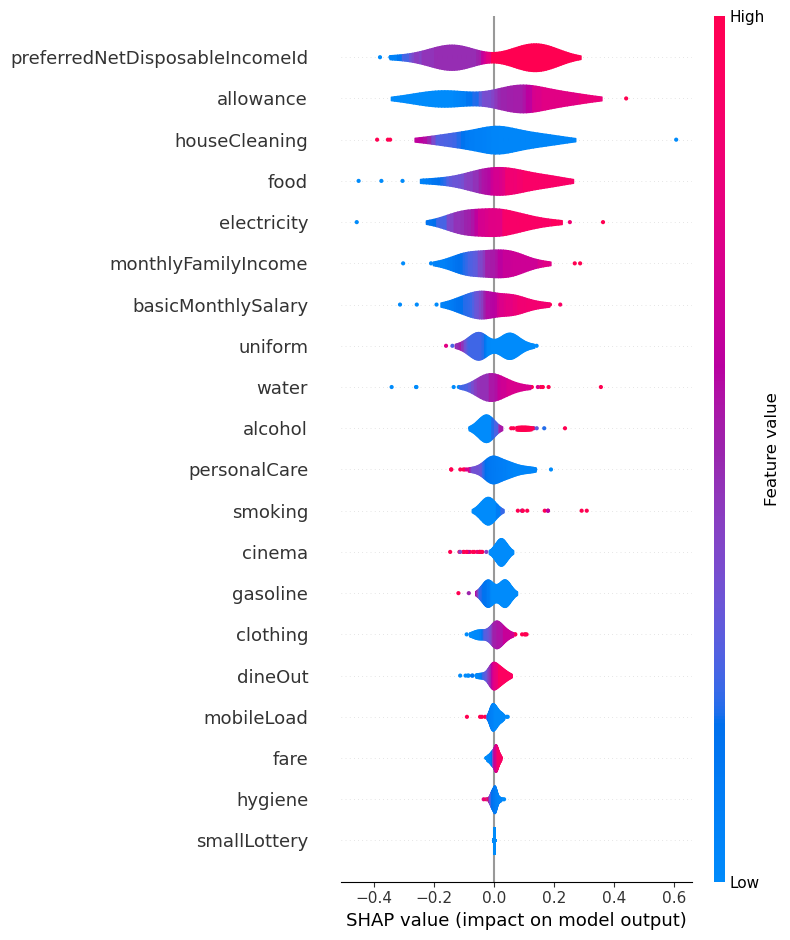

In [585]:
feature_names = X.columns

shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

In [568]:
model_vars = ['logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
var_df = {
    'Classifier model': [
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t12_'
clx = '_c2'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+clx+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+clx+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+clx+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+clx+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+clx+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+clx+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+clx+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+clx+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+clx+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+clx+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+clx+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t12_c2_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t10_summ.columns if col not in columns_to_exclude]
# ho_t10_summ[selected_columns]

ho_t12_c2_summ[['Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
             'Average Test Specificity', 'Average Test Recall', 'Best CV Score (G-mean)']].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Best CV Score (G-mean)
5,Extreme Gradient Boosting (XGBoost),0.638415,0.075391,0.509091,0.866667,0.467830
0,Logistic Regression,0.507400,0.107308,0.509091,0.600000,0.467830
2,Random Forest,0.460617,0.275135,0.690909,0.400000,0.528446
4,LightGBM,0.455752,0.257138,0.672727,0.466667,0.525565
3,Gradient Boosting Machine (GBM),0.436586,0.254502,0.472727,0.600000,0.515660
6,AdaBoost,0.420428,0.243626,0.600000,0.466667,0.489385
1,Decision Tree,0.420092,0.259389,0.490909,0.533333,0.649480


In [652]:
df = ho_t12_xgb_c1
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

model = ho_t12_xgb_c1_be.named_steps.classifier
rules = tree_rules(model.estimators_[0], X_train.columns)
print(rules)

AttributeError: 'XGBClassifier' object has no attribute 'estimators_'

In [578]:
df = ho_t12_xgb_c2
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(ho_t12_xgb_c2_be.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

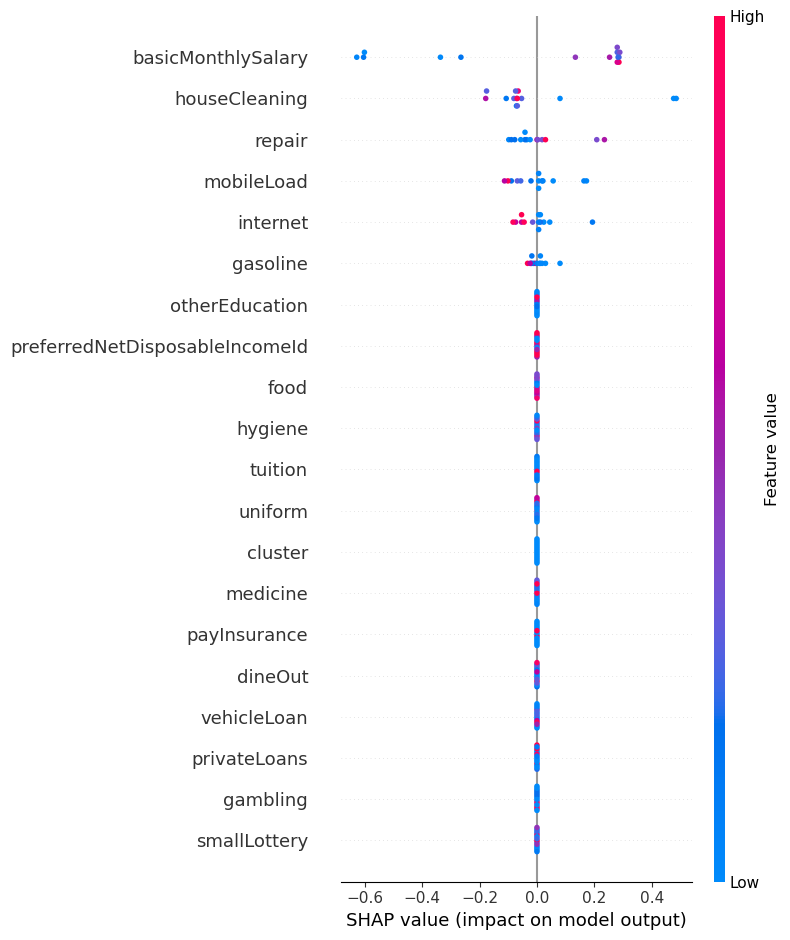

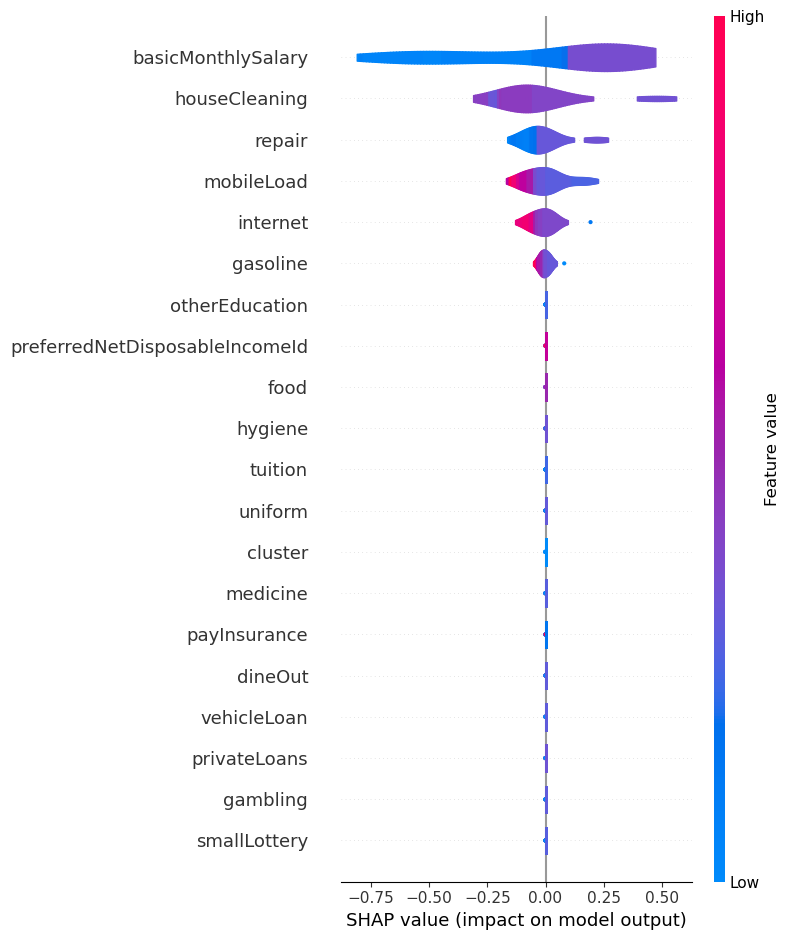

In [583]:
feature_names = X.columns

shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

In [570]:
# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(ho_t12_adaboost_c0_be.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

## HO_T13

In [680]:
ho_t13 = ho_t02.copy().drop(ho_t02[ho_t02['food'] < 50].index)
ho_t13 = ho_t13[(ho_t13['fare'] > 50) | (ho_t13['fare'] == 0)]

In [681]:
ho_t13

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class
0,370,"IBALI, HOWARD",24,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,1719,"OSCARES, ELMER",32,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1063,12848,"BUGARIN, JUN JUN",31,46000,1,0,0,80000.0,1500,1000,1000,500,0,1000,1500,1000,450,500,500,500,300,450,0,0,0,500,0,400,500,0,1500,0,0,0,0,0,250,0,0,0,0,5000,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1064,12849,"FERERR, JHENNYLYN",29,25000,3,2,4,40000.0,4000,1500,1000,0,100,600,0,0,200,300,1500,0,500,1500,0,0,0,500,500,0,0,0,1299,0,0,0,0,0,0,0,0,0,0,1200,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1066,1285

Fitting 10 folds for each of 1872 candidates, totalling 18720 fits



6240 fits failed out of a total of 18720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2080 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\Carlo\anaconda3\envs\ds_cuda\

Best Hyperparameters: {'classifier__C': 0.0001, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': RandomOverSampler(random_state=0), 'scaler': PowerTransformer()}
Best Validation Score: 0.6025684908315379
Best Estimator: Pipeline(steps=[('scaler', PowerTransformer()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.0001, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
GridSearchCV Runtime: 11.295358320077261
Run 1 - Random State: 0
Test G-mean: 0.5476966255136971
Best Threshold=0.500472, G-Mean=0.559


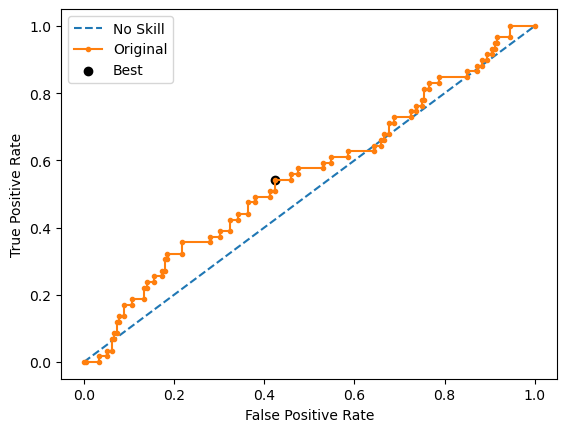

Run 2 - Random State: 1
Test G-mean: 0.5889330650413075
Best Threshold=0.499947, G-Mean=0.592


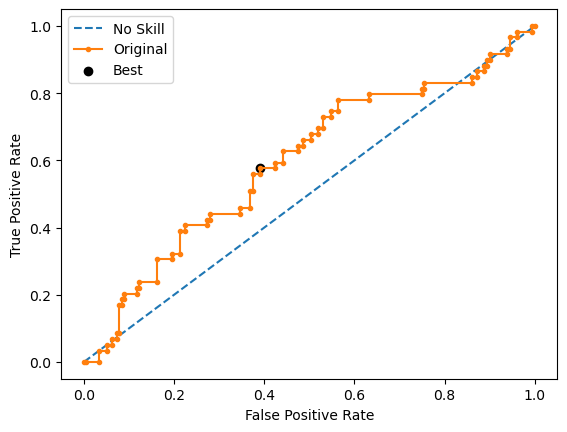

Run 3 - Random State: 2
Test G-mean: 0.5538854843893747
Best Threshold=0.498614, G-Mean=0.568


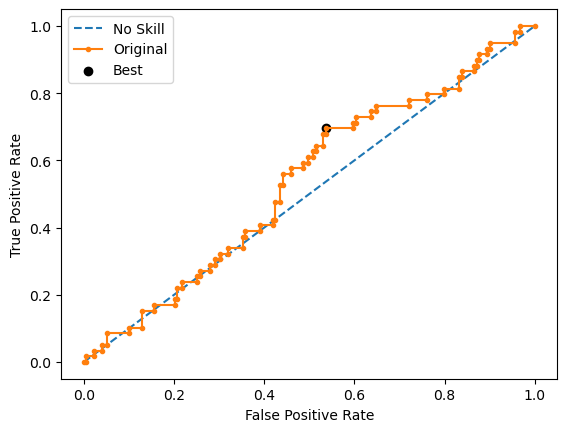

Run 4 - Random State: 3
Test G-mean: 0.6256518237215382
Best Threshold=0.501510, G-Mean=0.637


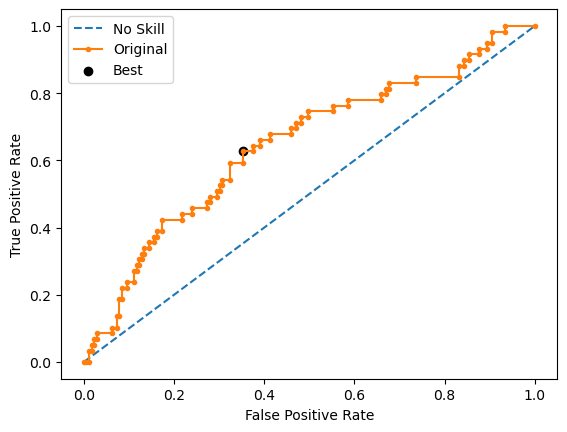

Run 5 - Random State: 4
Test G-mean: 0.609242949797257
Best Threshold=0.503526, G-Mean=0.629


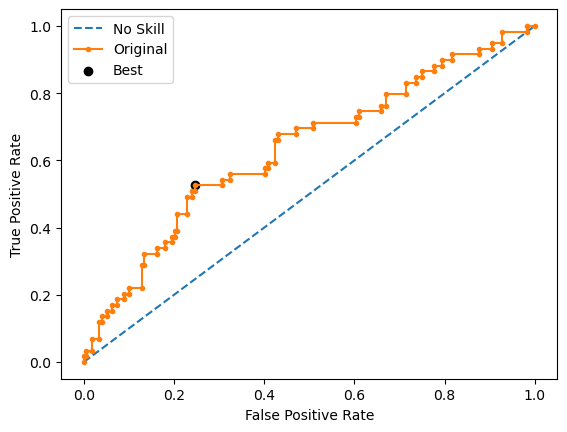

Ave Test G-mean: 0.5850819896926349
Stdev Test G-mean: 0.03396829994855202
Ave Test Specificity: 0.5631284916201118
Ave Test Recall: 0.6101694915254237
Ave Test NPV: 0.8142540239368609
Ave Test Accuracy: 0.5747899159663865
Ave Test Precision: 0.31584795141851846
Ave Test F1-Score: 0.4157316297991356
Ave Runtime: 0.005234055519104003


In [724]:
ho_t13_logreg_gs, ho_t13_logreg_be, ho_t13_logreg_model_info, ho_t13_logreg_metrics_df = logreg_class2(ho_t13, g_mean_scorer,
                                                                                                      'home_ownership_class', random_state=0)

In [683]:
ho_t13_dt_gs, ho_t13_dt_be, ho_t13_dt_model_info, ho_t13_dt_metrics_df = dt_class2(ho_t13, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 648 candidates, totalling 6480 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.5942024740437069
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', min_samples_leaf=2,
                                        random_state=0))])
GridSearchCV Runtime: 0.6143017570177715
Run 1 - Random State: 0
Test G-mean: 0.48848108216761127
Run 2 - Random State: 1
Test G-mean: 0.5564438605179794
Run 3 - Random State: 2
Test G-mean: 0.5836032444212146
Run 4 - Random State: 3
Test G-mean: 0.5230235565954142
Run 5 - Random State: 4
Test G-mean: 0.4873166440819361
Ave Test G-mean: 0.5277736775568311
Stdev Test G-mean: 0.04225565993582456
Ave Test Specificity: 0.6078212290502794
Ave Tes

In [684]:
ho_t13_lgbm_gs, ho_t13_lgbm_be, ho_t13_lgbm_model_info, ho_t13_lgbm_metrics_df = lgbm_class2(ho_t13, g_mean_scorer,
                                                                    'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 50, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.6286607137766163
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', n_estimators=50,
                                random_state=0))])
GridSearchCV Runtime: 0.6724713404973348
Run 1 - Random State: 0
Test G-mean: 0.5758449327823563
Run 2 - Random State: 1
Test G-mean: 0.609242949797257
Run 3 - Random State: 2
Test G-mean: 0.6037787770910484
Run 4 - Random State: 3
Test G-mean: 0.6291983317432567
Run 5 - Random State: 4
Test G-mean: 0.6072191398489368
Ave Test G-mean: 0.605056826252571
Stdev Test G-mean: 0.01910484001209937
Ave Test Specificity: 0.6212290502793296
Ave Test Recall: 0.5898305084745762
Ave Test NPV: 0.82111878312

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 50, 'resampling': SMOTEENN(random_state=0)}
Best Validation Score: 0.5790944769483639
Best Estimator: Pipeline(steps=[('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    learning_rate=0.01, random_state=0))])
GridSearchCV Runtime: 2.0111316680908202
Run 1 - Random State: 0
Test G-mean: 0.6006360464564467
Best Threshold=0.731059, G-Mean=0.601


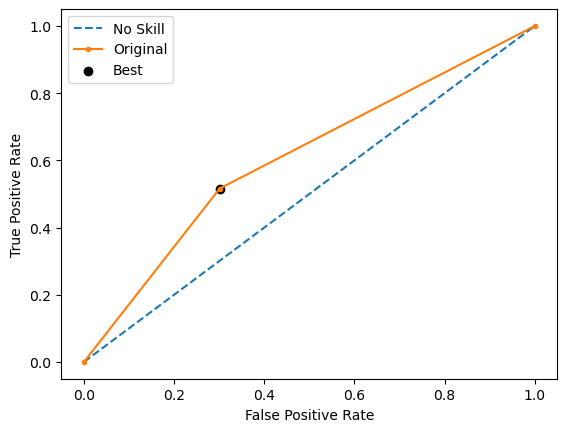

Run 2 - Random State: 1
Test G-mean: 0.5440594253644057
Best Threshold=0.731059, G-Mean=0.544


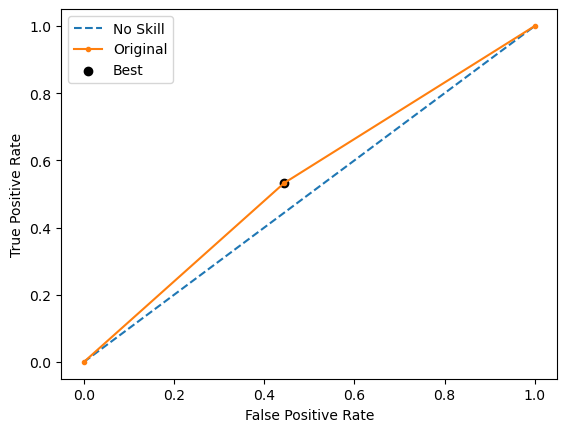

Run 3 - Random State: 2
Test G-mean: 0.6060915267313265
Best Threshold=0.731059, G-Mean=0.606


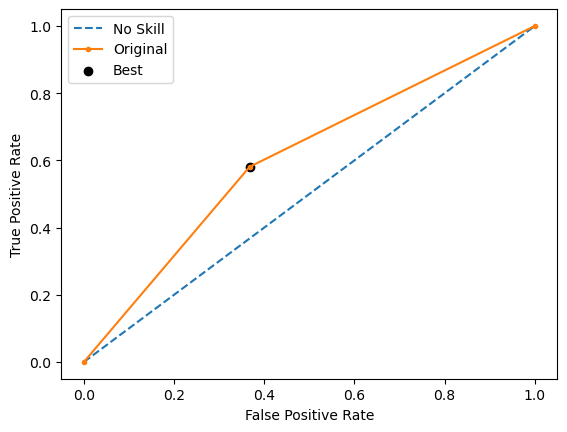

Run 4 - Random State: 3
Test G-mean: 0.5284063760237141
Best Threshold=0.731059, G-Mean=0.528


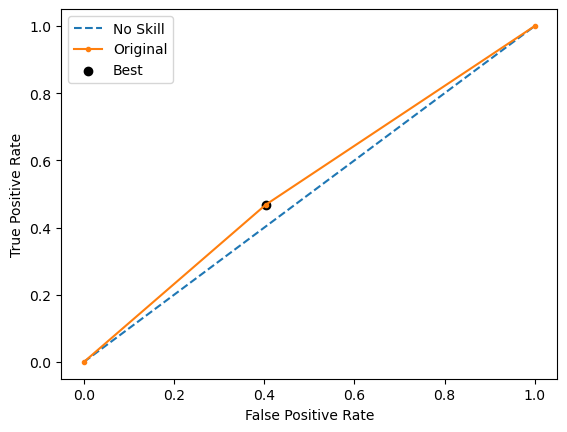

Run 5 - Random State: 4
Test G-mean: 0.5101020306102035
Best Threshold=0.731059, G-Mean=0.510


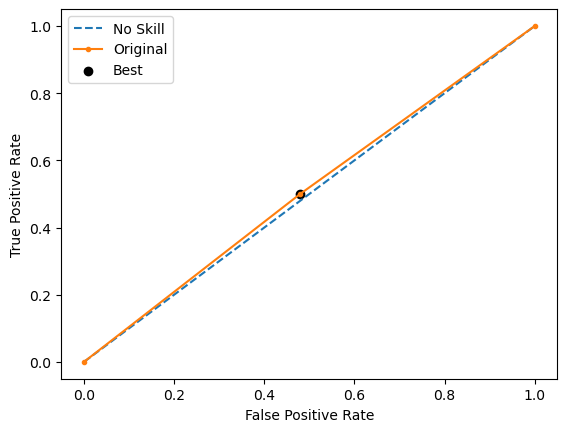

Ave Test G-mean: 0.5578590810372194
Stdev Test G-mean: 0.04328644644372554
Ave Test Specificity: 0.6010204081632654
Ave Test Recall: 0.5193548387096774
Ave Test NPV: 0.7967596627601287
Ave Test Accuracy: 0.5813953488372092
Ave Test Precision: 0.2953000407000407
Ave Test F1-Score: 0.3754389401448225
Ave Runtime: 0.007469975153605144


In [721]:
ho_t13_adaboost_gs, ho_t13_adaboost_be, ho_t13_adaboost_model_info, ho_t13_adaboost_metrics_df = adaboost_class2(ho_t02, g_mean_scorer,
                                                                                                      'home_ownership_class', random_state=0)

In [685]:
ho_t13_xgb_gs, ho_t13_xgb_be, ho_t13_xgb_model_info, ho_t13_xgb_metrics_df = xgb_class2(ho_t13, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.2, 'classifier__n_estimators': 100, 'resampling': EditedNearestNeighbours()}
Best Validation Score: 0.6110756187428719
Best Estimator: Pipeline(steps=[('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learning_rate=0.2,
                               max_bin

In [687]:
ho_t13_rf_gs, ho_t13_rf_be, ho_t13_rf_model_info, ho_t13_rf_metrics_df = rf_class2(ho_t13, g_mean_scorer,
                                                            'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 5, 'classifier__n_estimators': 100, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score: 0.6118675349828239
Best Estimator: Pipeline(steps=[('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=5,
                                        random_state=0))])
GridSearchCV Runtime: 1.4111622134844461
Run 1 - Random State: 0
Test G-mean: 0.552173314962478
Run 2 - Random State: 1
Test G-mean: 0.5910194947526938
Run 3 - Random State: 2
Test G-mean: 0.5867585355298537
Run 4 - Random State: 3
Test G-mean: 0.5702267990940757
Run 5 - Random State: 4
Test G-mean: 0.6262569029961479
Ave Test G-mean: 0.5852870094670498
Stdev Test G-mean: 0.027553972728581327
Ave Test Specificity: 0.6089385474860336
Ave Test Recall: 0.5661016949152543
Av

In [169]:
ho_t13_knn_gs, ho_t13_knn_be, ho_t13_knn_model_info, ho_t13_knn_metrics_df = knn_class2(ho_t13, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__metric': 'braycurtis', 'classifier__n_neighbors': 14, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score: 0.5829010835784417
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='braycurtis', n_neighbors=14))])
GridSearchCV Runtime: 1.8750030358632406
Run 1 - Random State: 0
Test G-mean: 0.4778676302294041
Run 2 - Random State: 1
Test G-mean: 0.5129976188495993
Run 3 - Random State: 2
Test G-mean: 0.4778676302294041
Run 4 - Random State: 3
Test G-mean: 0.48884865608720046
Run 5 - Random State: 4
Test G-mean: 0.4744977594948529
Ave Test G-mean: 0.48641585897809214
Stdev Test G-mean: 0.01581687377781031
Ave Test Specificity: 0.5918367346938775
Ave Test Recall: 0.4
Ave Test NPV: 0.756918238993

In [170]:
ho_t02_gbm_gs, ho_t02_gbm_be, ho_t02_gbm_model_info, ho_t02_gbm_metrics_df = gbm_class(ho_t02, g_mean_scorer,
                                                                'home_ownership_class', random_state=0)

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Best Hyperparameters: {'classifier__learning_rate': 0.01, 'classifier__max_depth': 5, 'classifier__n_estimators': 100, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.6025062419103326
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(learning_rate=0.01, max_depth=5,
                                            random_state=0))])
GridSearchCV Runtime: 13.141731429100037
Run 1 - Random State: 0
Test G-mean: 0.5301942953139067
Run 2 - Random State: 1
Test G-mean: 0.5660751537187174
Run 3 - Random State: 2
Test G-mean: 0.539426462543718
Run 4 - Random State: 3
Test G-mean: 0.5465494128601982
Run 5 - Random State: 4
Test G-mean: 0.5696978398265997
Ave Test G-mean: 0.550388632852628
Stdev Test G-mean: 0.017041364877156743


In [159]:
# ho_t02_sgd_gs, ho_t02_sgd_be, ho_t02_sgd_model_info = sgd_class(ho_t02, 'f1', 'home_ownership_class', random_state=0)

Fitting 10 folds for each of 6240 candidates, totalling 62400 fits
Best Hyperparameters: {'classifier__alpha': 0.01, 'classifier__loss': 'epsilon_insensitive', 'classifier__penalty': 'l2', 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.41029524575471965
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SGDClassifier(alpha=0.01, loss='epsilon_insensitive',
                               random_state=0))])
Test Accuracy: 0.5643939393939394
Test Precision: 0.24271844660194175
Test Recall: 0.4032258064516129
Test F1_score: 0.30303030303030304
Runtime: 14.526761865615844


In [688]:
# model_vars = ['knn', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost']
model_vars = ['dt', 'rf', 'lgbm', 'xgb', 'adaboost']

var_df = {
#     'Classifier model': [
#         'k-Nearest Neighbors',
#         'Logistic Regression', 'Decision Tree', 'Random Forest',
#         'Gradient Boosting Machine (GBM)',
#         'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
#         'AdaBoost'
#     ],
    'Classifier model': [
        'Decision Tree', 'Random Forest',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost'
    ],
    'Best Hyperparameters': [],
    'Best CV Score (G-mean)': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F1-score': [],
}

prefix = 'ho_t13_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Best CV Score (G-mean)'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])

# display(ho_t02_model_summ)
ho_t13_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

ho_t13_summ[['Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
             'Average Test Specificity', 'Average Test Recall', 'Best CV Score (G-mean)']].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Average Test Specificity,Average Test Recall,Best CV Score (G-mean)
4,AdaBoost,0.615000,0.020554,0.624581,0.606780,0.600297
2,LightGBM,0.605057,0.019105,0.621229,0.589831,0.628661
3,Extreme Gradient Boosting (XGBoost),0.602593,0.011471,0.631285,0.576271,0.611076
1,Random Forest,0.585287,0.027554,0.608939,0.566102,0.611868
0,Decision Tree,0.527774,0.042256,0.607821,0.461017,0.594202


In [690]:
df = ho_t13
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(ho_t13_adaboost_be.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

Permutation explainer: 239it [01:41,  2.12it/s]                         


In [693]:
df

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,gender_MALE,province_AGUSAN DEL NORTE,province_AKLAN,province_ALBAY,province_BATAAN,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_COTABATO,province_DAVAO DEL SUR,province_EASTERN SAMAR,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ILOILO,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_MISAMIS OCCIDENTAL,province_NEGROS OCCIDENTAL,province_NUEVA ECIJA,province_ORIENTAL MINDORO,province_PANGASINAN,province_QUEZON,province_QUIRINO,province_RIZAL,province_ROMBLON,province_SOUTH COTABATO,province_TARLAC,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_NONE,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,home_ownership_class
0,370,"IBALI, HOWARD",24,19000,2,3,3,40000.0,1000,500,200,200,0,0,0,50,0,0,500,450,0,0,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
1,1025,"PATALINGHOG, KIMBERLY",26,15000,3,2,4,30000.0,5000,3000,2000,2000,0,0,0,0,0,0,2000,0,200,200,1000,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,1105,"TEMILLOSO, DENNIS",40,20000,2,0,3,30000.0,3000,500,300,200,50,50,500,100,100,50,500,100,200,500,0,200,0,100,100,100,200,200,200,0,0,0,0,0,0,0,0,0,0,1000,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,1719,"OSCARES, ELMER",32,21200,2,0,5,12000.0,2000,500,200,392,0,0,0,0,0,0,100,0,200,200,3000,0,0,0,0,100,200,400,0,0,0,0,0,876,0,0,0,0,0,500,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1
4,2081,"LEGASPI, MANNY",39,19800,2,0,0,25000.0,5000,2000,1000,1500,0,0,1000,500,1500,0,0,1000,300,1900,0,1000,0,1000,1000,1500,1500,500,1600,0,0,0,0,0,0,0,0,0,0,10000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1063,12848,"BUGARIN, JUN JUN",31,46000,1,0,0,80000.0,1500,1000,1000,500,0,1000,1500,1000,450,500,500,500,300,450,0,0,0,500,0,400,500,0,1500,0,0,0,0,0,250,0,0,0,0,5000,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1064,12849,"FERERR, JHENNYLYN",29,25000,3,2,4,40000.0,4000,1500,1000,0,100,600,0,0,200,300,1500,0,500,1500,0,0,0,500,500,0,0,0,1299,0,0,0,0,0,0,0,0,0,0,1200,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1066,1285

LinAlgError: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.

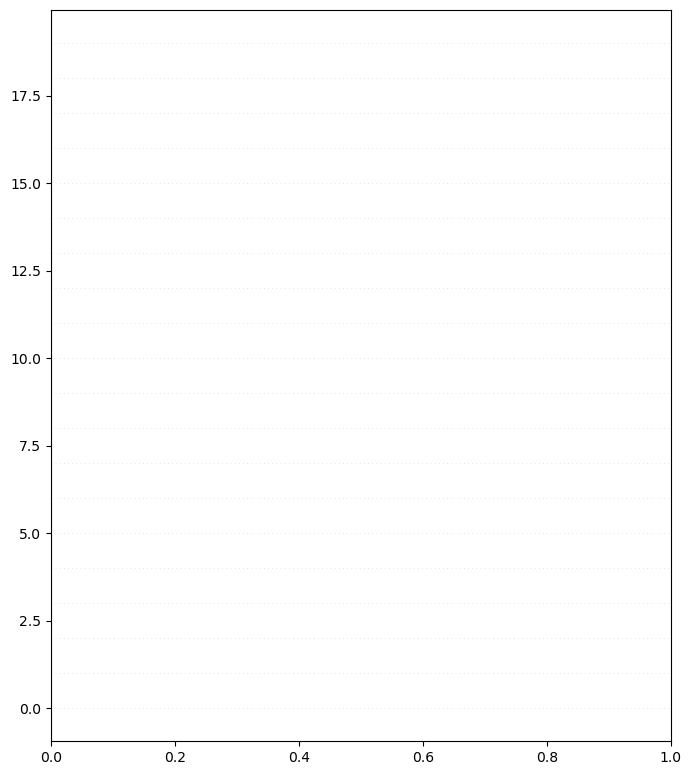

In [692]:
feature_names = X.columns

# shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

In [ ]:
ho_t02

In [661]:
ho_test_adaboost_gs, ho_test_adaboost_be, ho_test_adaboost_model_info, ho_test_adaboost_metrics_df = adaboost_class(ho_t02.drop(columns=['basicMonthlySalary']), g_mean_scorer, 'home_ownership_class', random_state=0)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 200, 'resampling': SMOTENC(categorical_features=[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
                              51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62,
                              63, 64, 65, 66, 67, 68, ...],
        random_state=0), 'scaler': StandardScaler()}
Best Validation Score: 0.5978133169387625
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling',
                 SMOTENC(categorical_features=[39, 40, 41, 42, 43, 44, 45, 46,
                                               47, 48, 49, 50, 51, 52, 53, 54,
                                               55, 56, 57, 58, 59, 60, 61, 62,
                                               63, 64, 65, 66, 67, 68, ...],
                         random_state=0)),
                ('classifier',
     

In [666]:
df = ho_t02.drop(columns=['basicMonthlySalary'])
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(ho_test_adaboost_be.predict, X_test)

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

Permutation explainer: 259it [06:27,  1.55s/it]                         


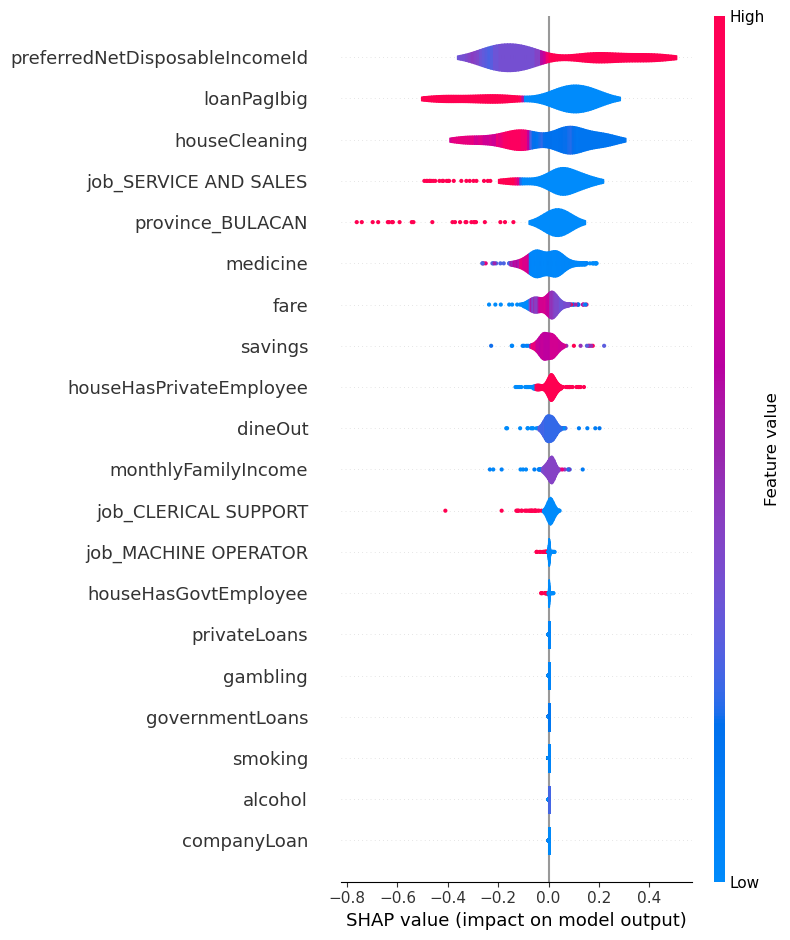

In [667]:
feature_names = X.columns

# shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')